In [24]:
# Loading Data
import pandas as pd
import numpy as np
import nltk

df = pd.read_excel("C:/Users/Mirtha/Downloads/Source Code Skripsi/New Code/Data.xlsx")
df = df.fillna('')
df


,Project Name,Nama Fitur,User Story,Scenario,Scenario.1,Scenario.2,Scenario.3,Scenario.4,Scenario.5,Scenario.6,Scenario.7,Scenario.8,Scenario.9,Scenario.10,Effort
0,Akobesi,Login,As User\nI want to login with username and pas...,Scenario: Login Successfully as Admin \nGiven ...,Scenario: Login Successfully as Curriculum Tea...,Scenario: Login Successfully as Lecturer \nGiv...,Scenario: Login Failed due to Incorrect NIP or...,,,,,,,,M
1,Akobesi,Logout,As User\nI want to logout from my account\nSo ...,Scenario: Log out Successfully \nGiven I am on...,,,,,,,,,,,S
2,Akobesi,Reset Password,As User\nI want to reset my password\nSo that ...,Scenario: Password Reset Successfully\nGiven I...,Scenario: Password Reset Failed due to a misma...,,,,,,,,,,M
3,Akobesi,Change Password,As User\nI want to change my password\nSo that...,Scenario: Password Change Successfully\nGiven ...,Scenario: Password Change Failed due to a mism...,Scenario: Password Change Failed due to incorr...,,,,,,,,,S
4,Akobesi,Create Program outcome,As Curriculum Team\nI want to create Program o...,Scenario: Create Program outcome Successfully\...,Scenario: Create Program outcome Failed as the...,Scenario: Create Program outcome Failed Due to...,,,,,,,,,S
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,User Story Generator,Update user story,"As User\nI want to update user story, linked t...",Scenario: Update user story successfully\nGive...,Scenario: Update user story failed due to empt...,,,,,,,,,,S
219,User Story Generator,Create user story scenario,As User\nI want to access the generated user s...,Scenario: Create user story scenario successfu...,Scenario: Create user story scenario failed du...,,,,,,,,,,XL
220,User Story Generator,Update user story scenario,"As User\nI want to update user story scenario,...",Scenario: Update user story scenario successfu...,Scenario: Update user story scenario failed du...,,,,,,,,,,S
221,User Story Generator,Read user story History,As User\nI want to retrieve user story created...,Scenario: Read user story History Successfully...,Scenario: Read user story history failed due t...,,,,,,,,,,S


In [25]:
# Menggabungkan Data Setiap Kolom
df['combined'] = df.iloc[:, 1:13].apply(lambda x: '\n'.join(x), axis=1)

# Menampilkan hasil gabungan setiap kolom
df['combined']

0      Login\nAs User\nI want to login with username ...
1      Logout\nAs User\nI want to logout from my acco...
2      Reset Password\nAs User\nI want to reset my pa...
3      Change Password\nAs User\nI want to change my ...
4      Create Program outcome\nAs Curriculum Team\nI ...
                             ...                        
218    Update user story\nAs User\nI want to update u...
219    Create user story scenario\nAs User\nI want to...
220    Update user story scenario\nAs User\nI want to...
221    Read user story History\nAs User\nI want to re...
222    Delete user story History\nAs User\nI want to ...
Name: combined, Length: 223, dtype: object

In [26]:
# Fungsi untuk memeriksa dan menggabungkan
def combine_with_scenario(row):
    combined = row[1]  # Mulai dengan kolom pertama
    combined += '\n' + row[2]
    for value in row[2:]:
        paragraphs = value.split('\n')
        for paragraph in paragraphs:
            if 'scenario:' in paragraph.lower():
                combined += '\n' + paragraph
    return combined

# Terapkan fungsi ke DataFrame
df['combined_user_story'] = df.iloc[:, [1,2]].apply(lambda x: '\n'.join(x), axis=1)

# Menampilkan hasil gabungan
print(df['combined_user_story'])

0      Login\nAs User\nI want to login with username ...
1      Logout\nAs User\nI want to logout from my acco...
2      Reset Password\nAs User\nI want to reset my pa...
3      Change Password\nAs User\nI want to change my ...
4      Create Program outcome\nAs Curriculum Team\nI ...
                             ...                        
218    Update user story\nAs User\nI want to update u...
219    Create user story scenario\nAs User\nI want to...
220    Update user story scenario\nAs User\nI want to...
221    Read user story History\nAs User\nI want to re...
222    Delete user story History\nAs User\nI want to ...
Name: combined_user_story, Length: 223, dtype: object


In [27]:
# Menampilkan baris pertama dari kolom 'combined'
print(df['combined_user_story'].iloc[0])

Login
As User
I want to login with username and password
So that I can access the system


In [28]:
# Menggabungkan data hingga user story scenario
df['combined_scenario'] = df.apply(combine_with_scenario, axis=1)

# Menampilkan hasil gabungan
print(df['combined_scenario'])

C:\Users\Mirtha\AppData\Local\Temp\ipykernel_4496\3639756725.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  combined = row[1]  # Mulai dengan kolom pertama
C:\Users\Mirtha\AppData\Local\Temp\ipykernel_4496\3639756725.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  combined += '\n' + row[2]


0      Login\nAs User\nI want to login with username ...
1      Logout\nAs User\nI want to logout from my acco...
2      Reset Password\nAs User\nI want to reset my pa...
3      Change Password\nAs User\nI want to change my ...
4      Create Program outcome\nAs Curriculum Team\nI ...
                             ...                        
218    Update user story\nAs User\nI want to update u...
219    Create user story scenario\nAs User\nI want to...
220    Update user story scenario\nAs User\nI want to...
221    Read user story History\nAs User\nI want to re...
222    Delete user story History\nAs User\nI want to ...
Name: combined_scenario, Length: 223, dtype: object


In [29]:
# Menampilkan baris pertama dari kolom 'combined'
print(df['combined_scenario'].iloc[0])

Login
As User
I want to login with username and password
So that I can access the system
Scenario: Login Successfully as Admin 
Scenario: Login Successfully as Curriculum Team Member
Scenario: Login Successfully as Lecturer 
Scenario: Login Failed due to Incorrect NIP or Password
Scenario: Login Successfully as Admin 
Scenario: Login Successfully as Curriculum Team Member
Scenario: Login Successfully as Lecturer 
Scenario: Login Failed due to Incorrect NIP or Password


In [30]:
# One Hot Encoding
from sklearn.preprocessing import OneHotEncoder

# Initialize the OneHotEncoder
encoder = OneHotEncoder()

# Transform 'Effort' column
effort_encoded = encoder.fit_transform(df[['Effort']])

# Convert the encoded effort to a dense array
effort_dense_array = effort_encoded.toarray()

# Display the encoded result
print("Encoded 'Effort' categories:")
for label, encoded_label in zip(encoder.categories_[0], range(len(encoder.categories_[0]))):
    print(f"{label}: {encoded_label}")

# Display the dense array
print("Dense array representation of encoded 'Effort' categories:")
print(effort_dense_array)

Encoded 'Effort' categories:
L: 0
M: 1
S: 2
XL: 3
Dense array representation of encoded 'Effort' categories:
[[0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0

Class distribution:
L: 0.04
M: 0.22
S: 0.70
XL: 0.05
Total count of each class:
L: 8.0
M: 49.0
S: 155.0
XL: 11.0


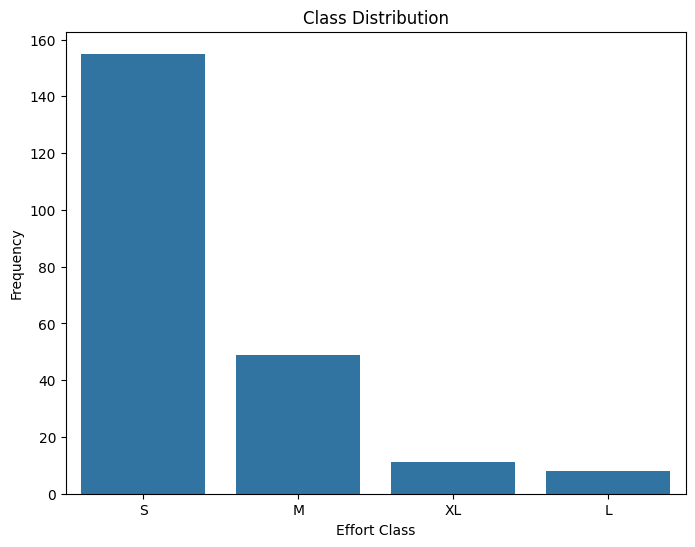

In [31]:
# Distribusi Kelas Keseluruhan
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate class distribution
class_distribution = np.sum(effort_dense_array, axis=0) / len(effort_dense_array)

# Display class distribution
print("Class distribution:")
for label, distribution in zip(encoder.categories_[0], class_distribution):
    print(f"{label}: {distribution:.2f}")
# Calculate total count of each class
class_totals = np.sum(effort_dense_array, axis=0)

# Display total count of each class
print("Total count of each class:")
for label, total in zip(encoder.categories_[0], class_totals):
    print(f"{label}: {total}")

# Hitung total dari setiap kelas dalam target variabel (Effort)
class_distribution = df['Effort'].value_counts()

# Visualisasikan distribusi kelas menggunakan plot bar
plt.figure(figsize=(8, 6))
sns.barplot(x=class_distribution.index, y=class_distribution.values)
plt.title('Class Distribution')
plt.xlabel('Effort Class')
plt.ylabel('Frequency')
plt.show()

Class distribution per project:
Effort                                  L         M         S        XL
Project Name                                                           
Akobesi                          0.047244  0.244094  0.700787  0.007874
DFD Generator                    0.000000  0.230769  0.615385  0.153846
Git Trackr                       0.000000  0.333333  0.500000  0.166667
Jisebi Checker                   0.000000  0.111111  0.777778  0.111111
Journal Database Reviewer        0.125000  0.125000  0.687500  0.062500
Novelty Checker                  0.000000  0.090909  0.818182  0.090909
Sales Monitoring on Multimarket  0.000000  0.333333  0.666667  0.000000
Seareq                           0.000000  0.000000  0.750000  0.250000
Ucase                            0.000000  0.250000  0.625000  0.125000
User Story Generator             0.000000  0.090909  0.727273  0.181818


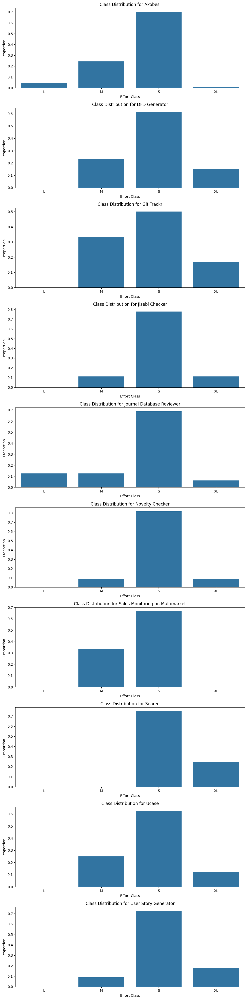

In [32]:
# Group by project name and calculate class distribution per project
project_class_distribution = df.groupby('Project Name')['Effort'].value_counts(normalize=True).unstack().fillna(0)

# Display class distribution per project
print("Class distribution per project:")
print(project_class_distribution)

# Visualisasi distribusi kelas per proyek
fig, axes = plt.subplots(nrows=len(project_class_distribution), figsize=(10, len(project_class_distribution) * 4))

for (project, class_dist), ax in zip(project_class_distribution.iterrows(), axes):
    sns.barplot(x=class_dist.index, y=class_dist.values, ax=ax)
    ax.set_title(f'Class Distribution for {project}')
    ax.set_xlabel('Effort Class')
    ax.set_ylabel('Proportion')

plt.tight_layout()
plt.show()

In [33]:
# Numeric Feature Extraction
import re

def count_when_then_pair(text):
    # Mencari kemunculan "when" dan "then" secara terpisah
    matches_when = re.findall(r'\bwhen\b', text)
    matches_then = re.findall(r'\bthen\b', text)
    
    # Menghitung jumlah pasangan "when" dan "then"
    count_pair = min(len(matches_when), len(matches_then))
    
    return count_pair
import pandas as pd

# Fungsi untuk menghitung jumlah entitas setelah "linked to" dalam kalimat yang mengandung "i want to"
def count_entities(text):
    if pd.isna(text):  # Mengatasi nilai NaN
        return 0

    # Mencari kalimat yang mengandung "i want to"
    sentences = text.split('.')
    for sentence in sentences:
        sentence = sentence.strip().lower()
        if "i want to" in sentence:
            # Mencari frasa "linked to"
            if "linked to" in sentence:
                # Mengambil bagian teks setelah "linked to"
                entities_part = sentence.split("linked to")[1].strip()
                # Memisahkan entitas yang dipisahkan oleh koma
                entities = entities_part.split(',')
                return len(entities)
    return 0

# lowercase
df['combined'] = df['combined'].str.lower()

# Menghitung jumlah baris, jumlah kata, jumlah skenario, dan jumlah step (when then)
df['number_line'] = df['combined'].apply(lambda x: len(x.split('\n')))
df['number_word'] = df['combined'].apply(lambda x: len(x.split()))
df['number_scenario'] = df['combined'].apply(lambda x: x.count("scenario:"))
df['number_of_step'] = df['combined'].apply(count_when_then_pair)

# Menghitung jumlah entitas yang terlibat pada user story
df['entity_user story'] = df['combined'].apply(count_entities)

# Menghitung kemunculan template kata
df['number_of_S1'] = df['combined'].apply(lambda x: x.count("i am on"))
df['number_of_S2'] = df['combined'].apply(lambda x: x.count("i press"))
df['number_of_S3'] = df['combined'].apply(lambda x: x.count("i follow"))
df['number_of_F1'] = df['combined'].apply(lambda x: x.count("i fill in "))
df['number_of_F2'] = df['combined'].apply(lambda x: x.count("i select"))
df['number_of_F3'] = df['combined'].apply(lambda x: x.count("i check"))
df['number_of_F4'] = df['combined'].apply(lambda x: x.count("i uncheck"))
df['number_of_F5'] = df['combined'].apply(lambda x: x.count("i attach"))
df['number_of_A1'] = df['combined'].apply(lambda x: x.count("i should see"))
df['number_of_A2'] = df['combined'].apply(lambda x: x.count("the response should contain"))
df['number_of_A3'] = df['combined'].apply(lambda x: x.count("field should contain"))
df['number_of_A4'] = df['combined'].apply(lambda x: x.count("checkbox should be checked"))
df['number_of_A5'] = df['combined'].apply(lambda x: x.count("checkbox should not be checked"))
df['number_of_A6'] = df['combined'].apply(lambda x: x.count("i should be on"))
df['number_of_A7'] = df['combined'].apply(lambda x: x.count("the url should match"))

# Menghitung jumlah kelompok template S, F, A
df['total_of_S']= df['number_of_S1']+df['number_of_S2']+df['number_of_S3']
df['total_of_F']= df['number_of_F1']+df['number_of_F2']+df['number_of_F3']+df['number_of_F4']+df['number_of_F5']
df['total_of_A']= df['number_of_A1']+df['number_of_A2']+df['number_of_A3']+df['number_of_A4']+df['number_of_A5']+df['number_of_A6']+df['number_of_A7']

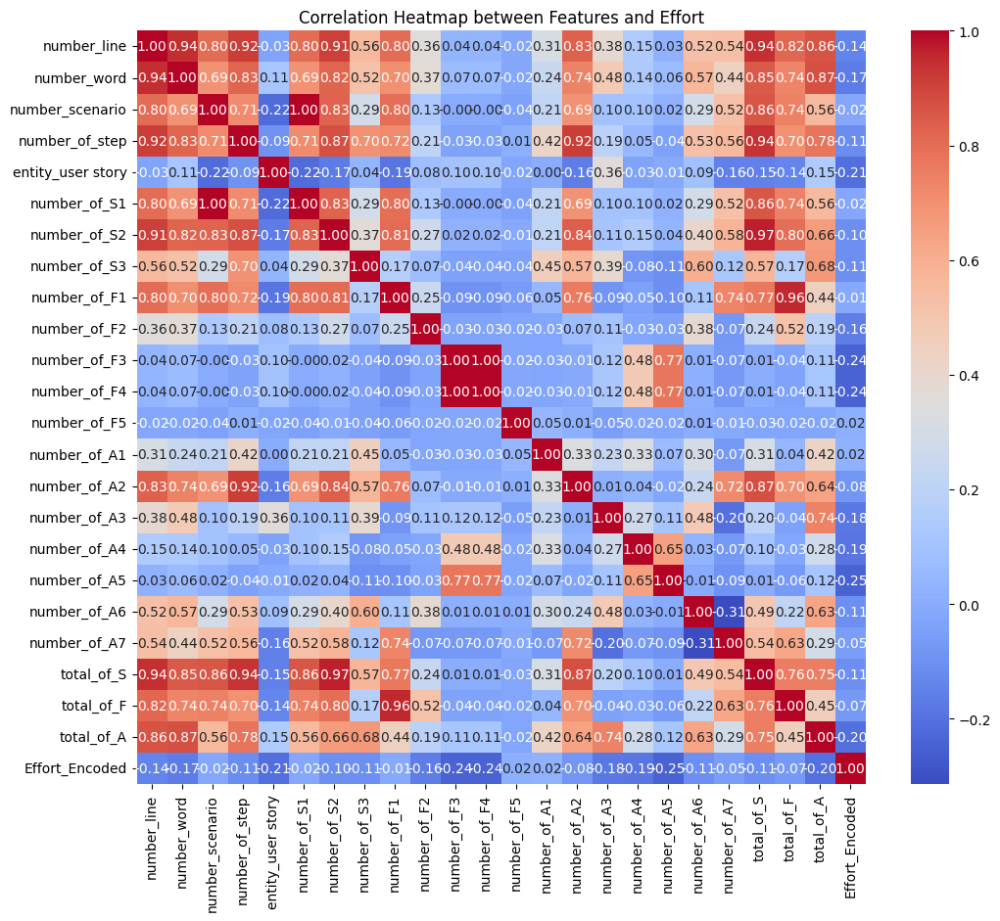

In [34]:
# Heatmap
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode the 'Effort' column
df['Effort_Encoded'] = label_encoder.fit_transform(df['Effort'])

# Drop the original 'Effort' column if needed
# df.drop('Effort', axis=1, inplace=True)

# Now, you can proceed to calculate the correlation matrix
data = pd.concat([df[['number_line','number_word', 'number_scenario', 'number_of_step', 'entity_user story', 'number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7', 'total_of_S', 'total_of_F', 'total_of_A']], df['Effort_Encoded']], axis=1)
correlation_matrix = data.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap between Features and Effort')
plt.show()


In [35]:
# Text Preprocessing
# Case Folding and Remove Template
import re

def case_folding(text):
    return text.lower()

def remove_template_phrases(text):
    template_texts = [
        "So that",
        "As",
        "I want",
        "linked to",
        "I am on",
        "I press",
        "I follow",
        "I fill in",
        "I select",
        "I check",
        "I uncheck",
        "I attach the file",
        "I should see",
        "The response should contain",
        "field should contain",
        "checkbox should be checked",
        "checkbox should not be checked",
        "I should be on",
        "The url should match",
        "given",
        "when",
        "then"
    ]

    pattern = r'\s+(' + '|'.join(template_texts) + r')\s+'
    return re.sub(pattern, ' ', text, flags=re.IGNORECASE)

df['combined'] = df['combined'].apply(case_folding)
df['remove_template'] = df['combined'].apply(remove_template_phrases)

df['combined_user_story'] = df['combined_user_story'].apply(case_folding)
df['remove_template_user_story'] = df['combined_user_story'].apply(remove_template_phrases)

df['combined_scenario'] = df['combined_scenario'].apply(case_folding)
df['remove_template_scenario'] = df['combined_scenario'].apply(remove_template_phrases)

In [36]:
# Remove Punctuation
import string
def remove_punctuation(text):
    punctuation_to_replace = string.punctuation + "‘’“”"
    translation_table = str.maketrans(punctuation_to_replace, ' ' * len(punctuation_to_replace))
    cleaned_text = text.translate(translation_table)
    return cleaned_text

df['remove_punctuation'] = df['remove_template'].apply(remove_punctuation)
df['remove_punctuation_user_story'] = df['remove_template_user_story'].apply(remove_punctuation)
df['remove_punctuation_scenario'] = df['remove_template_scenario'].apply(remove_punctuation)
print("Hasil pembersihan teks dari tanda baca")
print(df.loc[0, 'remove_punctuation'])

Hasil pembersihan teks dari tanda baca
login user to login with username and password i can access the system
scenario  login successfully admin i am on  http   127 0 0 1 8000 login  i fill in  nip  with  32525252523 
and  password  with  coba123 
and  login  the url should match  http   127 0 0 1 8000 dashboard admin 
and the  lecturer name   admin 
scenario  login successfully curriculum team member i am on  http   127 0 0 1 8000 login  i fill in  nip  with  197801262006041001 
and  password  with  coba123 
and  login  the url should match  http   127 0 0 1 8000 dashboard curriculum 
and the  lecturer name   badrus zaman  s kom   m cs  	
scenario  login successfully lecturer i am on  http   127 0 0 1 8000 login  i fill in  nip  with  198110282006041003 
and  password  with  coba123 
and  login  the url should match  http   127 0 0 1 8000 dashboard lecturer 
and the  lecturer name   indra kharisma r  s kom   m t  
scenario  login failed due to incorrect nip or password i am on  http  

In [37]:
# Tokenisasi
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

df['tokenisasi'] = df['remove_punctuation'].apply(lambda x: word_tokenize(x))
df['tokenisasi_user_story'] = df['remove_punctuation_user_story'].apply(lambda x: word_tokenize(x))
df['tokenisasi_scenario'] = df['remove_punctuation_scenario'].apply(lambda x: word_tokenize(x))
print("Hasil tokenisasi")
print(df['tokenisasi'])

Hasil tokenisasi
0      [login, user, to, login, with, username, and, ...
1      [logout, user, to, logout, from, my, account, ...
2      [reset, password, user, to, reset, my, passwor...
3      [change, password, user, to, change, my, passw...
4      [create, program, outcome, curriculum, team, t...
                             ...                        
218    [update, user, story, user, to, update, user, ...
219    [create, user, story, scenario, user, to, acce...
220    [update, user, story, scenario, user, to, upda...
221    [read, user, story, history, user, to, retriev...
222    [delete, user, story, history, user, to, delet...
Name: tokenisasi, Length: 223, dtype: object


In [38]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Stopword removal
stop_words = set(stopwords.words('english'))
def remove_stopwords(tokens):
    return [token for token in tokens if token.lower() not in stop_words]

df['stopword_removal'] = df['tokenisasi'].apply(remove_stopwords)
df['stopword_removal_user_story'] = df['tokenisasi_user_story'].apply(remove_stopwords)
df['stopword_removal_scenario'] = df['tokenisasi_scenario'].apply(remove_stopwords)
print("Hasil stopword removal")
print(df['stopword_removal'][4])

Hasil stopword removal
['create', 'program', 'outcome', 'curriculum', 'team', 'create', 'program', 'outcome', 'define', 'program', 'outcome', 'scenario', 'create', 'program', 'outcome', 'successfully', 'http', '127', '0', '0', '1', '8000', 'dashboard', 'curriculum', 'press', 'data', 'program', 'outcome', 'program', 'outcome', 'page', 'press', 'add', 'program', 'outcome', 'creation', 'page', 'fill', 'program', 'outcome', 'code', 'po1', 'program', 'outcome', 'description', 'graduates', 'possess', 'ability', 'analyze', 'design', 'create', 'comprehensively', 'evaluate', 'information', 'systems', 'alignment', 'organizational', 'goals', 'demonstrating', 'effective', 'proficiency', 'add', 'program', 'outcome', 'response', 'contain', 'success', 'program', 'outcome', 'added', 'scenario', 'create', 'program', 'outcome', 'failed', 'program', 'outcome', 'code', 'already', 'taken', 'http', '127', '0', '0', '1', '8000', 'dashboard', 'curriculum', 'press', 'data', 'program', 'outcome', 'program', 'ou

[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>
[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>
[nltk_data] Error loading wordnet: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [39]:
# Lematisasi
lemmatizer = WordNetLemmatizer()
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(token) for token in tokens]

df['lematisasi'] = df['stopword_removal'].apply(lemmatize_tokens)
df['lematisasi_user_story'] = df['stopword_removal_user_story'].apply(lemmatize_tokens)
df['lematisasi_scenario'] = df['stopword_removal_scenario'].apply(lemmatize_tokens)
print("Hasil lematisasi")
df['lematisasi']

Hasil lematisasi


0      [login, user, login, username, password, acces...
1      [logout, user, logout, account, prevent, unaut...
2      [reset, password, user, reset, password, regai...
3      [change, password, user, change, password, sec...
4      [create, program, outcome, curriculum, team, c...
                             ...                        
218    [update, user, story, user, update, user, stor...
219    [create, user, story, scenario, user, access, ...
220    [update, user, story, scenario, user, update, ...
221    [read, user, story, history, user, retrieve, u...
222    [delete, user, story, history, user, delete, u...
Name: lematisasi, Length: 223, dtype: object

In [40]:
# TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer

# Mengembalikan ke bentuk string
df['lematisasi'] = df['lematisasi'].apply(lambda x: ' '.join(x))
df['lematisasi_user_story'] = df['lematisasi_user_story'].apply(lambda x: ' '.join(x))
df['lematisasi_scenario'] = df['lematisasi_scenario'].apply(lambda x: ' '.join(x))

tfidf_vectorizer = TfidfVectorizer()
tfidf_matrix = tfidf_vectorizer.fit_transform(df['lematisasi'])
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
tfidf_matrix_user_story = tfidf_vectorizer.fit_transform(df['lematisasi_user_story'])
tfidf_df_user_story  = pd.DataFrame(tfidf_matrix_user_story.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
tfidf_matrix_scenario = tfidf_vectorizer.fit_transform(df['lematisasi_scenario'])
tfidf_df_scenario = pd.DataFrame(tfidf_matrix_scenario.toarray(), columns=tfidf_vectorizer.get_feature_names_out())
tfidf_df

,04,100,105,127,15,197101042008121001,197102111997021001,197801262006041001,198105082005012001,198110282006041003,...,world,wth,x0002,xl,xlslence,xlslent,xlsx,yamamaru,year,zaman
0,0.0,0.0,0.0,0.113618,0.0,0.0,0.0,0.092818,0.0,0.110888,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.092818
1,0.0,0.0,0.0,0.130649,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
2,0.0,0.0,0.0,0.074771,0.0,0.0,0.0,0.000000,0.0,0.056758,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
3,0.0,0.0,0.0,0.053876,0.0,0.0,0.0,0.000000,0.0,0.092017,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
4,0.0,0.0,0.0,0.026421,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
218,0.0,0.0,0.0,0.028498,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
219,0.0,0.0,0.0,0.044466,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
220,0.0,0.0,0.0,0.041463,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000
221,0.0,0.0,0.0,0.046888,0.0,0.0,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000


In [41]:
# Data Integration
integrated_data_num1 = pd.concat([tfidf_df, df[['number_line','number_word', 'number_scenario', 'number_of_step', 'entity_user story', 'number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7', 'total_of_S', 'total_of_F', 'total_of_A']]], axis=1)
integrated_data_num2 = pd.concat([tfidf_df, df[['number_line','number_word', 'entity_user story', 'number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7', 'total_of_A']]], axis=1)
integrated_data_num3 = pd.concat([tfidf_df, df[['number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7']]], axis=1)
integrated_data_num4 = pd.concat([tfidf_df, df[['number_line','number_word', 'number_scenario', 'number_of_step', 'entity_user story', 'total_of_S', 'total_of_F', 'total_of_A']]], axis=1)

In [42]:
# Data Integration user story
integrated_data_user_story_num1 = pd.concat([tfidf_df_user_story, df[['number_line','number_word', 'number_scenario', 'number_of_step', 'entity_user story', 'number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7', 'total_of_S', 'total_of_F', 'total_of_A']]], axis=1)
integrated_data_user_story_num2 = pd.concat([tfidf_df_user_story, df[['number_line','number_word', 'entity_user story', 'number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7', 'total_of_A']]], axis=1)
integrated_data_user_story_num3 = pd.concat([tfidf_df_user_story, df[['number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7']]], axis=1)
integrated_data_user_story_num4 = pd.concat([tfidf_df_user_story, df[['number_line','number_word', 'number_scenario', 'number_of_step', 'entity_user story', 'total_of_S', 'total_of_F', 'total_of_A']]], axis=1)

In [43]:
# Data Integration user story scenario
integrated_data_scenario_num1 = pd.concat([tfidf_df_scenario, df[['number_line','number_word', 'number_scenario', 'number_of_step', 'entity_user story', 'number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7', 'total_of_S', 'total_of_F', 'total_of_A']]], axis=1)
integrated_data_scenario_num2 = pd.concat([tfidf_df_scenario, df[['number_line','number_word', 'entity_user story', 'number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7', 'total_of_A']]], axis=1)
integrated_data_scenario_num3 = pd.concat([tfidf_df_scenario, df[['number_of_S1', 'number_of_S2', 'number_of_S3', 'number_of_F1', 'number_of_F2', 'number_of_F3', 'number_of_F4', 'number_of_F5', 'number_of_A1', 'number_of_A2', 'number_of_A3', 'number_of_A4', 'number_of_A5', 'number_of_A6', 'number_of_A7']]], axis=1)
integrated_data_scenario_num4 = pd.concat([tfidf_df_scenario, df[['number_line','number_word', 'number_scenario', 'number_of_step', 'entity_user story', 'total_of_S', 'total_of_F', 'total_of_A']]], axis=1)

====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.33      0.06      0.11        31
           S       0.70      0.81      0.75        89
          XL       0.00      0.00      0.00         1

   micro avg       0.68      0.58      0.63       127
   macro avg       0.26      0.22      0.21       127
weighted avg       0.57      0.58      0.55       127
 samples avg       0.57      0.58      0.58       127

Precision: 0.571235634380654     Recall: 0.5826771653543307      Accuracy: 0.5669291338582677      F1 Score: 0.5519791444988296

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

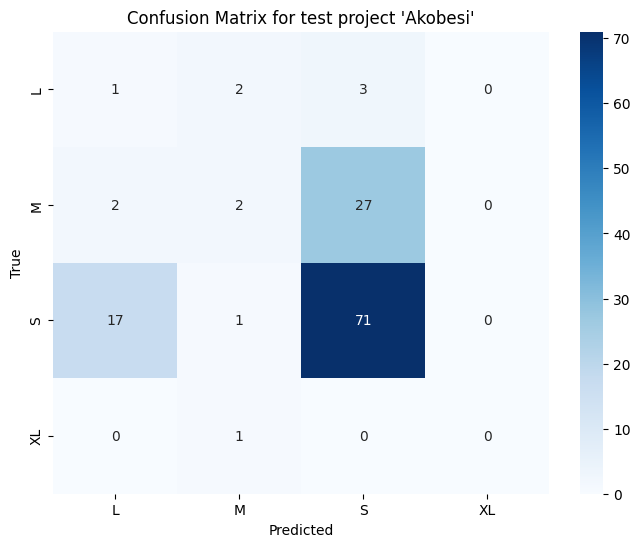

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.20      0.03      0.06        31
           S       0.77      0.81      0.79        89
          XL       0.00      0.00      0.00         1

   micro avg       0.74      0.57      0.65       127
   macro avg       0.24      0.21      0.21       127
weighted avg       0.59      0.57      0.57       127
 samples avg       0.57      0.57      0.57       127

Precision: 0.585592226503602     Recall: 0.5748031496062992      Accuracy: 0.5748031496062992      F1 Score: 0.5650000717123475

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

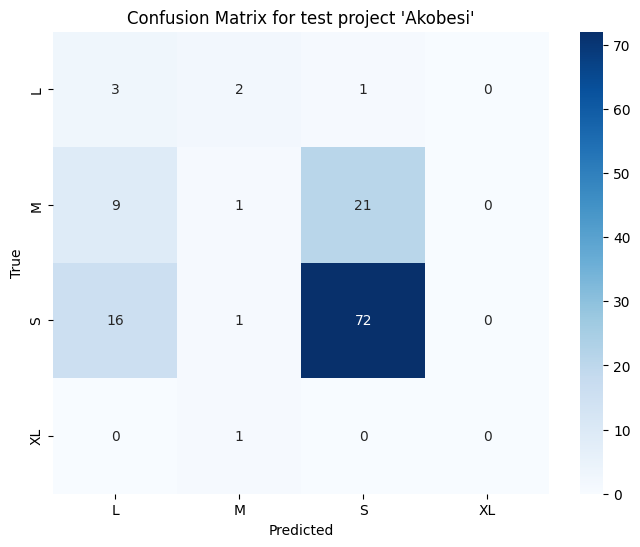

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.71      1.00      0.83        89
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.70      0.71       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.50      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127

Precision: 0.4989606299212598     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5828979321510044

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

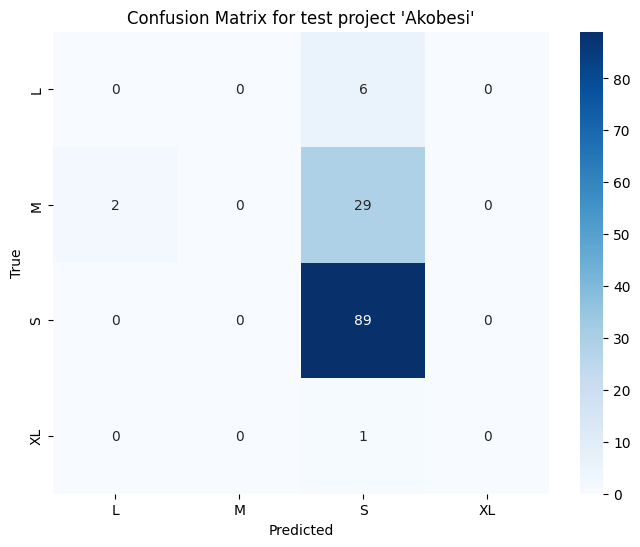

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

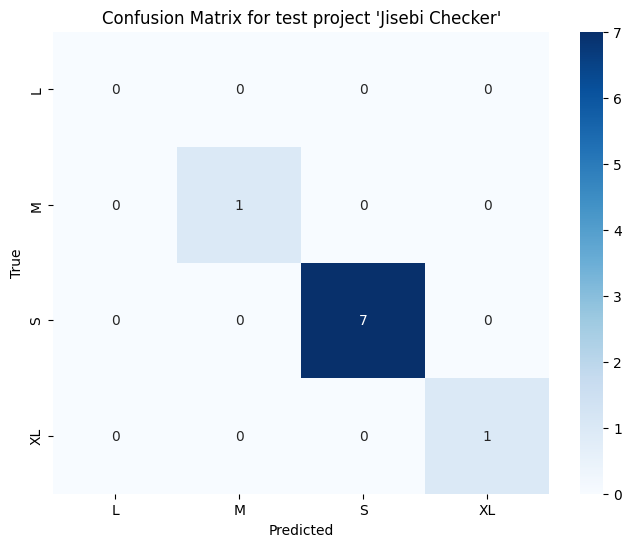

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

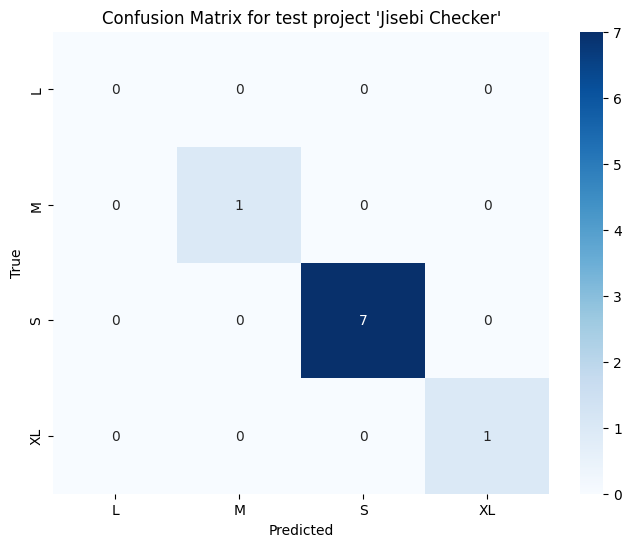

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.86      0.67      0.75         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

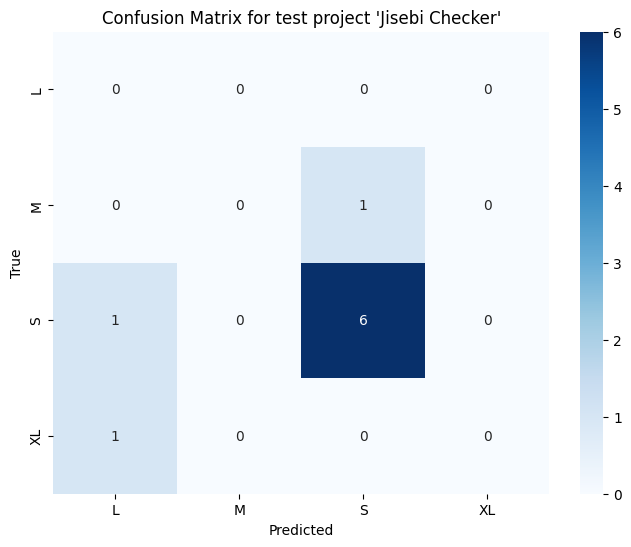

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.74        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9518716577540107

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

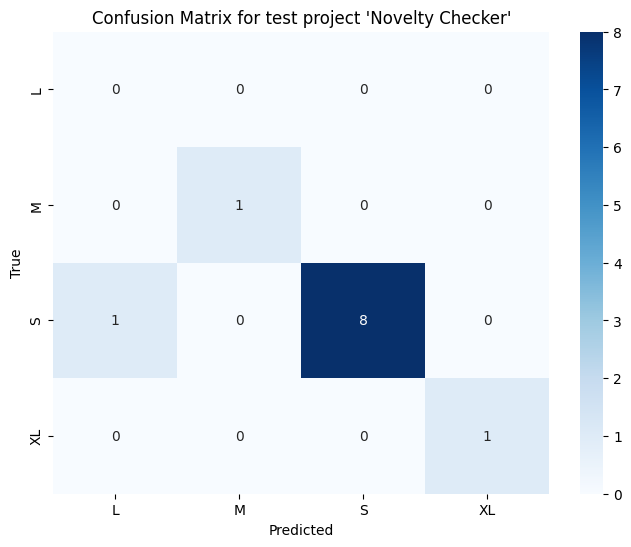

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

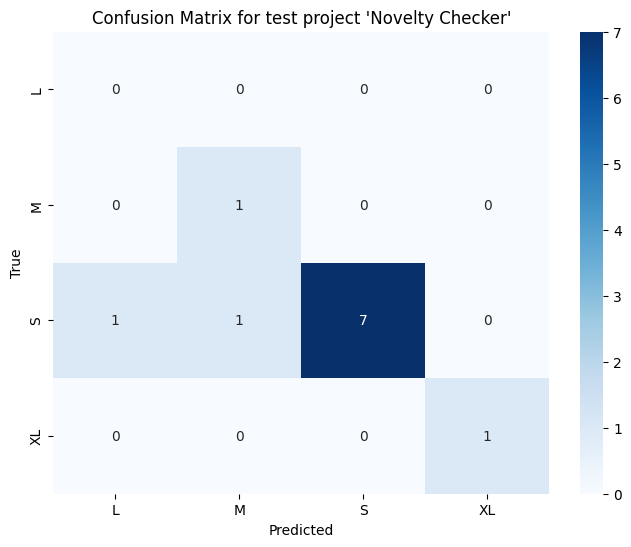

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.89      0.89      0.89         9
          XL       0.00      0.00      0.00         1

   micro avg       0.89      0.73      0.80        11
   macro avg       0.22      0.22      0.22        11
weighted avg       0.73      0.73      0.73        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.7272727272727273     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.7272727272727273

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

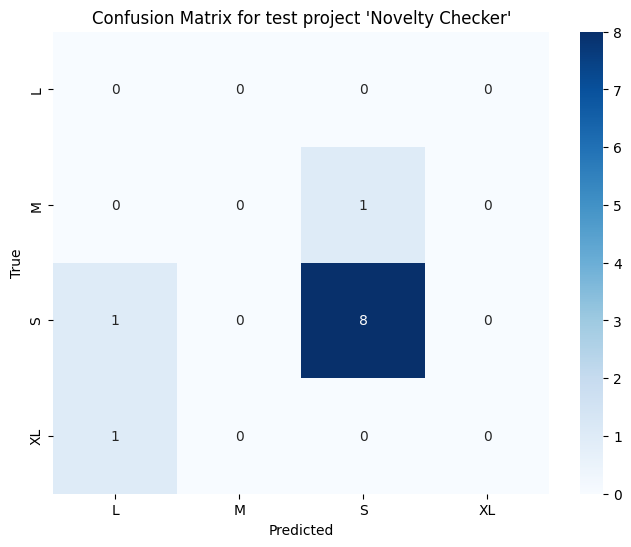

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.67      1.00      0.80         2
           S       0.82      0.82      0.82        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.62      0.70      0.65        16
weighted avg       0.71      0.75      0.72        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.7083333333333334     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.725

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

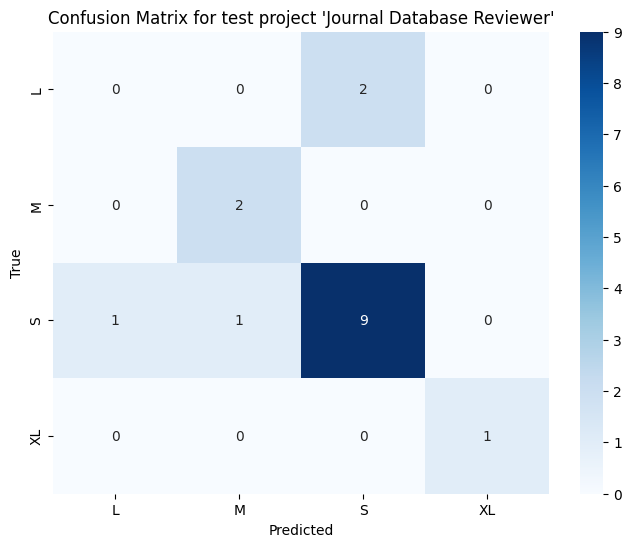

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.29      1.00      0.44         2
           S       0.80      0.73      0.76        11
          XL       1.00      1.00      1.00         1

   micro avg       0.61      0.69      0.65        16
   macro avg       0.52      0.68      0.55        16
weighted avg       0.65      0.69      0.64        16
 samples avg       0.62      0.69      0.65        16

Precision: 0.6482142857142857     Recall: 0.6875      Accuracy: 0.5625      F1 Score: 0.6418650793650794

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


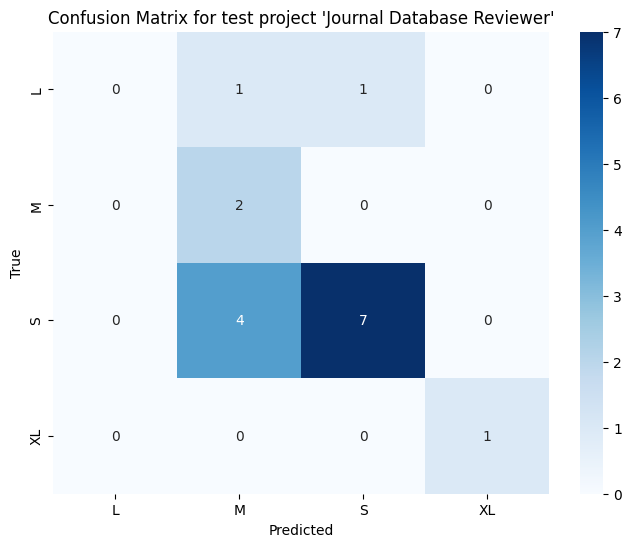

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.62      0.73      0.67        11
          XL       0.00      0.00      0.00         1

   micro avg       0.62      0.50      0.55        16
   macro avg       0.15      0.18      0.17        16
weighted avg       0.42      0.50      0.46        16
 samples avg       0.50      0.50      0.50        16

Precision: 0.42307692307692313     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.45833333333333337

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

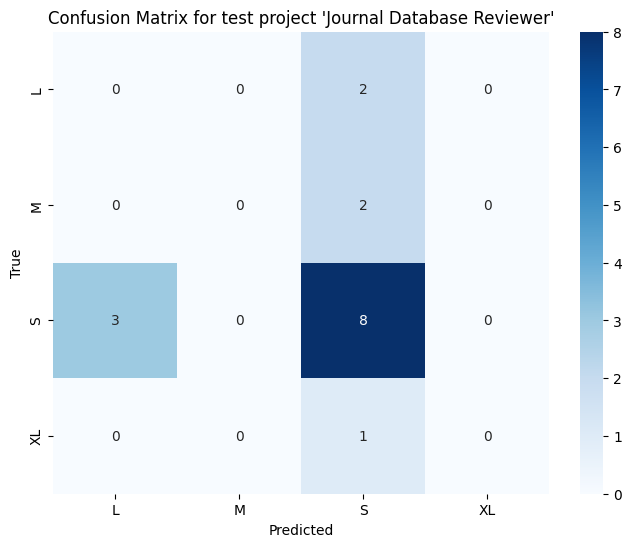

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

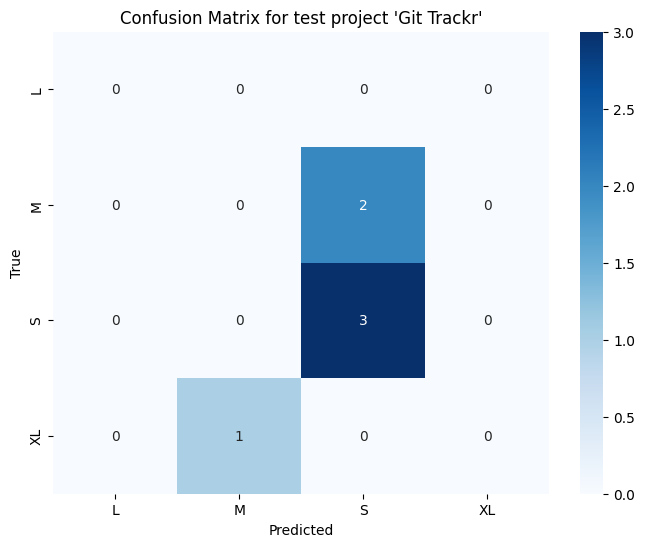

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

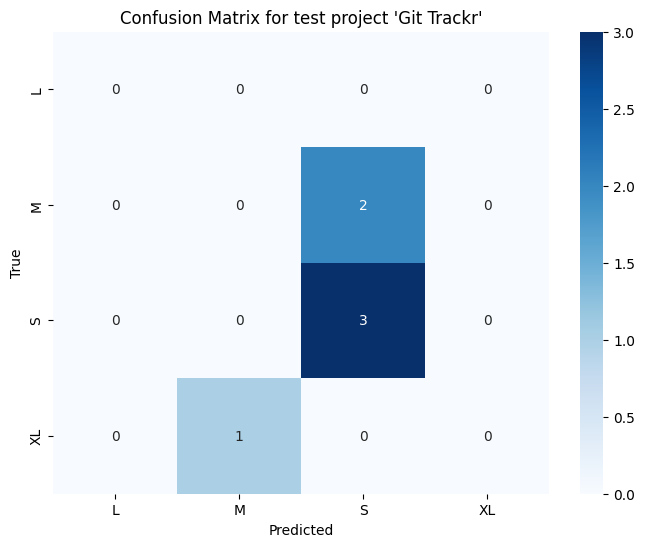

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.50      0.50         2
           S       0.75      1.00      0.86         3
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.31      0.38      0.34         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.67      0.67      0.67         6

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

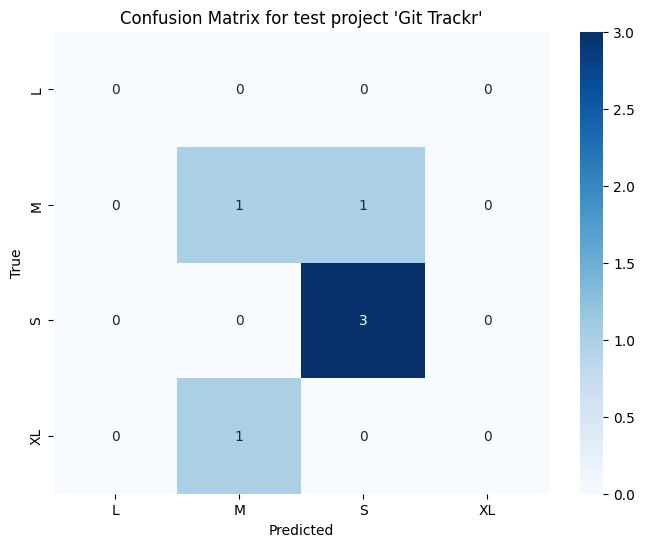

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.33      0.50         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.50      0.57         4
   macro avg       0.50      0.33      0.38         4
weighted avg       1.00      0.50      0.62         4
 samples avg       0.50      0.50      0.50         4

Precision: 1.0     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.625

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

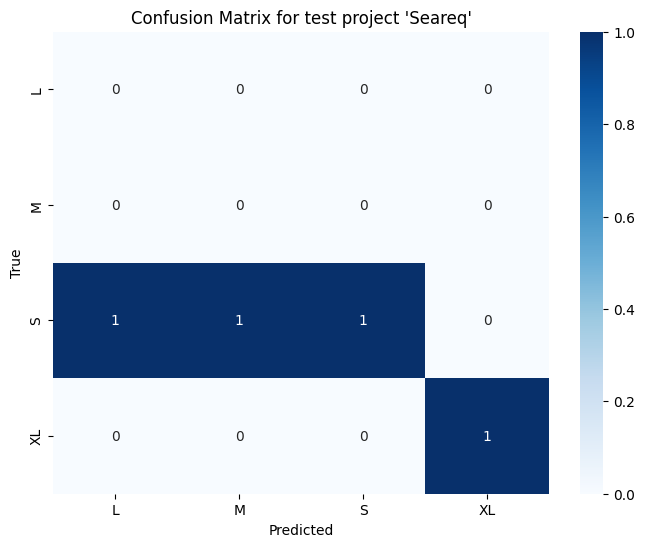

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      1.00      1.00         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         4
   macro avg       0.50      0.50      0.50         4
weighted avg       1.00      1.00      1.00         4
 samples avg       1.00      1.00      1.00         4

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

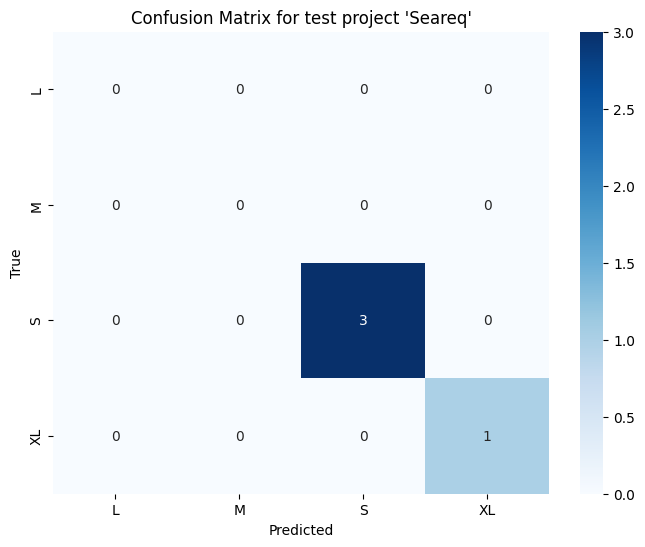

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.00      0.00      0.00         1

   micro avg       1.00      0.50      0.67         4
   macro avg       0.25      0.17      0.20         4
weighted avg       0.75      0.50      0.60         4
 samples avg       0.50      0.50      0.50         4

Precision: 0.75     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.6000000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

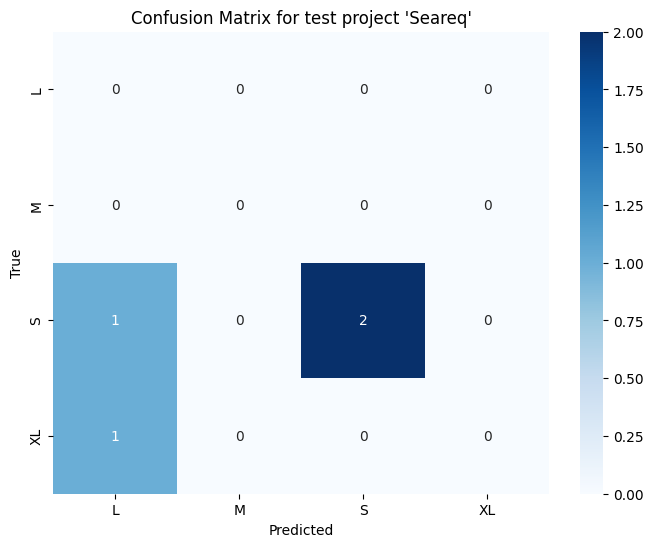

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.77      0.83      0.80        12
          XL       0.00      0.00      0.00         0

   micro avg       0.79      0.61      0.69        18
   macro avg       0.44      0.25      0.27        18
weighted avg       0.85      0.61      0.63        18
 samples avg       0.61      0.61      0.61        18

Precision: 0.8461538461538463     Recall: 0.6111111111111112      Accuracy: 0.6111111111111112      F1 Score: 0.6285714285714286

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

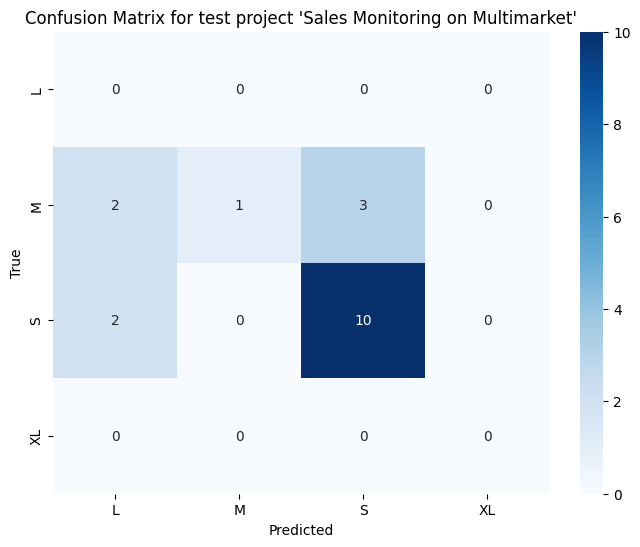

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.17      0.22         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.65      0.72      0.68        18
   macro avg       0.26      0.29      0.26        18
weighted avg       0.58      0.72      0.63        18
 samples avg       0.67      0.72      0.69        18

Precision: 0.5816993464052288     Recall: 0.7222222222222222      Accuracy: 0.6111111111111112      F1 Score: 0.6257982120051087

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

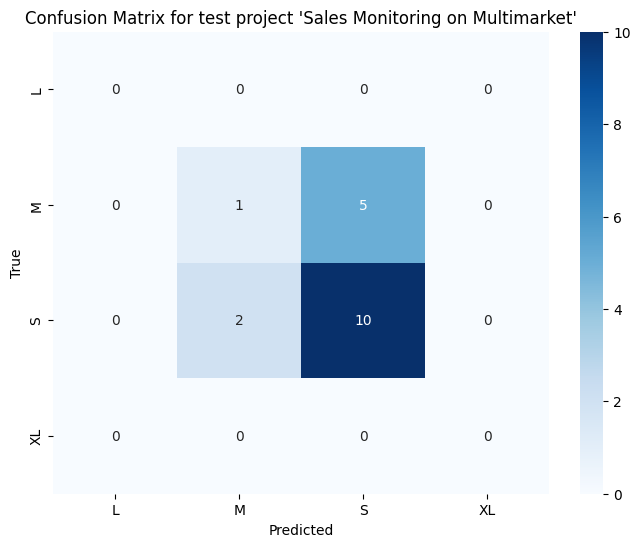

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         6
           S       0.67      1.00      0.80        12
          XL       0.00      0.00      0.00         0

   micro avg       0.67      0.67      0.67        18
   macro avg       0.17      0.25      0.20        18
weighted avg       0.44      0.67      0.53        18
 samples avg       0.67      0.67      0.67        18

Precision: 0.4444444444444444     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.5333333333333334

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

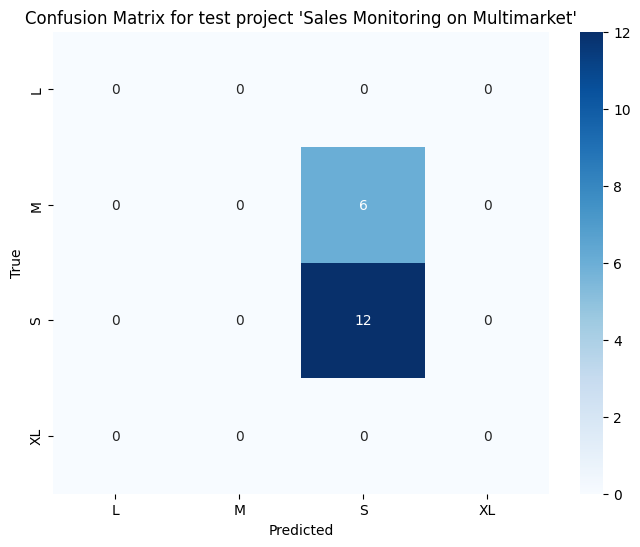

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

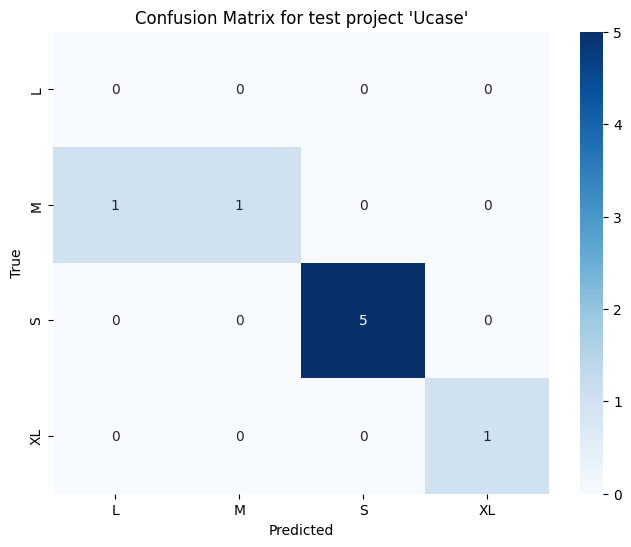

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       0.83      1.00      0.91         5
          XL       1.00      1.00      1.00         1

   micro avg       0.88      0.88      0.88         8
   macro avg       0.71      0.62      0.64         8
weighted avg       0.90      0.88      0.86         8
 samples avg       0.81      0.88      0.83         8

Precision: 0.8958333333333334     Recall: 0.875      Accuracy: 0.75      F1 Score: 0.8598484848484848

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

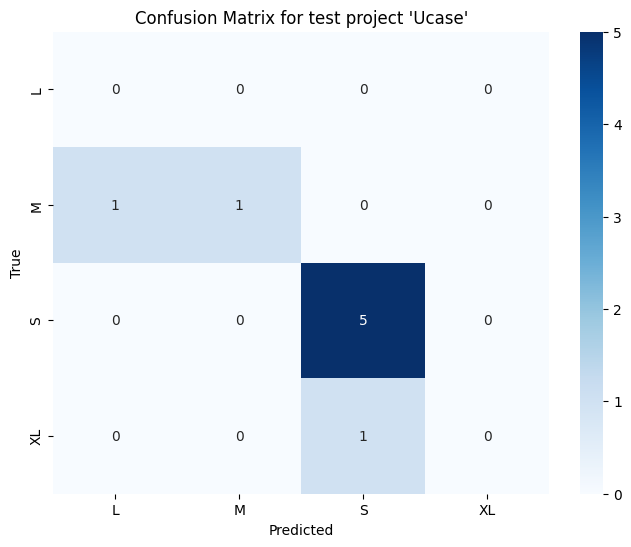

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.71      1.00      0.83         5
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.62      0.67         8
   macro avg       0.18      0.25      0.21         8
weighted avg       0.45      0.62      0.52         8
 samples avg       0.62      0.62      0.62         8

Precision: 0.44642857142857145     Recall: 0.625      Accuracy: 0.625      F1 Score: 0.5208333333333333

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

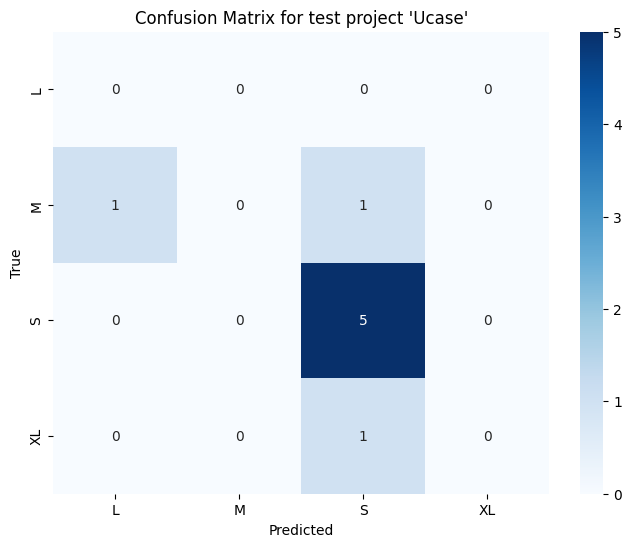

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.88      0.88      0.88         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.85      0.88        13
   macro avg       0.72      0.64      0.67        13
weighted avg       0.92      0.85      0.88        13
 samples avg       0.85      0.85      0.85        13

Precision: 0.9230769230769231     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.8769230769230769

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

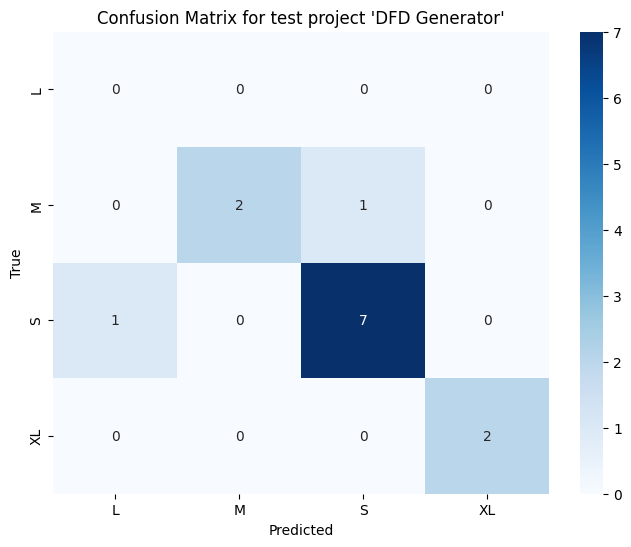

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.77      0.87        13
   macro avg       0.75      0.55      0.61        13
weighted avg       1.00      0.77      0.84        13
 samples avg       0.77      0.77      0.77        13

Precision: 1.0     Recall: 0.7692307692307693      Accuracy: 0.7692307692307693      F1 Score: 0.8435897435897436

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

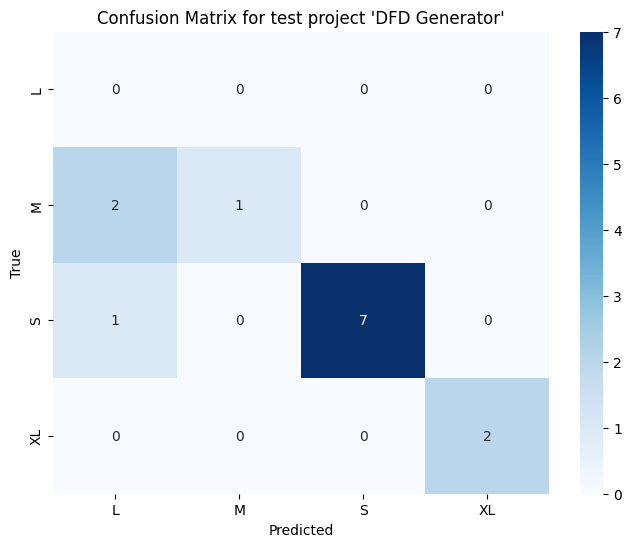

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.80      1.00      0.89         8
          XL       0.00      0.00      0.00         2

   micro avg       0.80      0.62      0.70        13
   macro avg       0.20      0.25      0.22        13
weighted avg       0.49      0.62      0.55        13
 samples avg       0.62      0.62      0.62        13

Precision: 0.49230769230769234     Recall: 0.6153846153846154      Accuracy: 0.6153846153846154      F1 Score: 0.5470085470085471

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

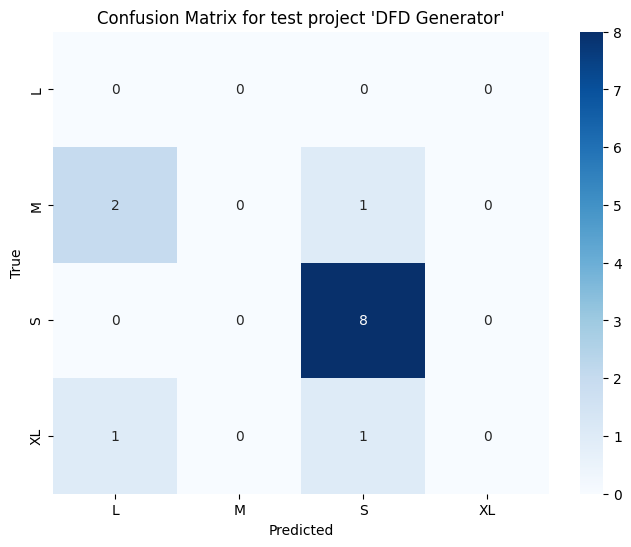

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.80      1.00      0.89         8
          XL       1.00      1.00      1.00         2

   micro avg       0.85      1.00      0.92        11
   macro avg       0.70      0.75      0.72        11
weighted avg       0.85      1.00      0.92        11
 samples avg       0.91      1.00      0.94        11

Precision: 0.8545454545454546     Recall: 1.0      Accuracy: 0.8181818181818182      F1 Score: 0.9191919191919191

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

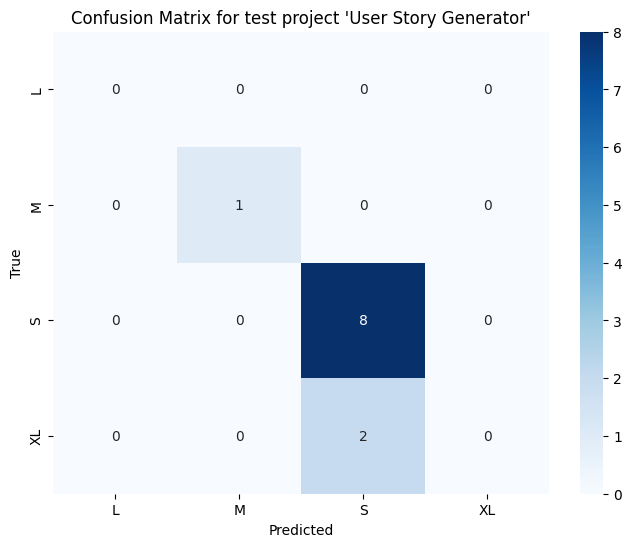

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.62      0.77         8
          XL       0.67      1.00      0.80         2

   micro avg       0.80      0.73      0.76        11
   macro avg       0.54      0.66      0.56        11
weighted avg       0.89      0.73      0.77        11
 samples avg       0.68      0.73      0.70        11

Precision: 0.893939393939394     Recall: 0.7272727272727273      Accuracy: 0.6363636363636364      F1 Score: 0.7655011655011655

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

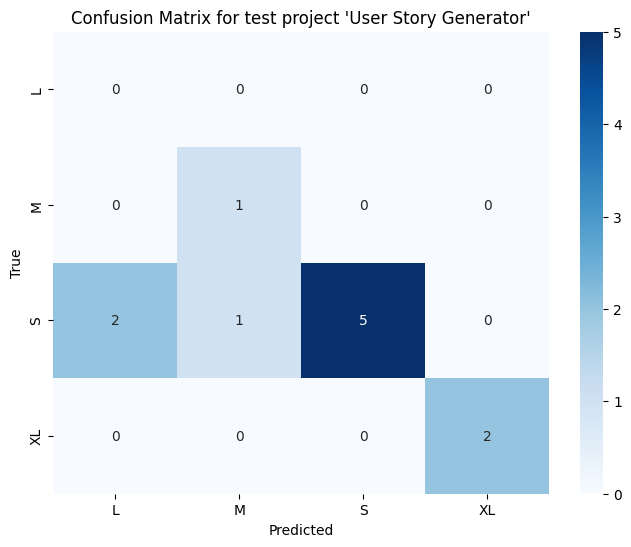

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.78      0.88      0.82         8
          XL       0.00      0.00      0.00         2

   micro avg       0.78      0.64      0.70        11
   macro avg       0.19      0.22      0.21        11
weighted avg       0.57      0.64      0.60        11
 samples avg       0.64      0.64      0.64        11

Precision: 0.5656565656565656     Recall: 0.6363636363636364      Accuracy: 0.6363636363636364      F1 Score: 0.5989304812834225

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

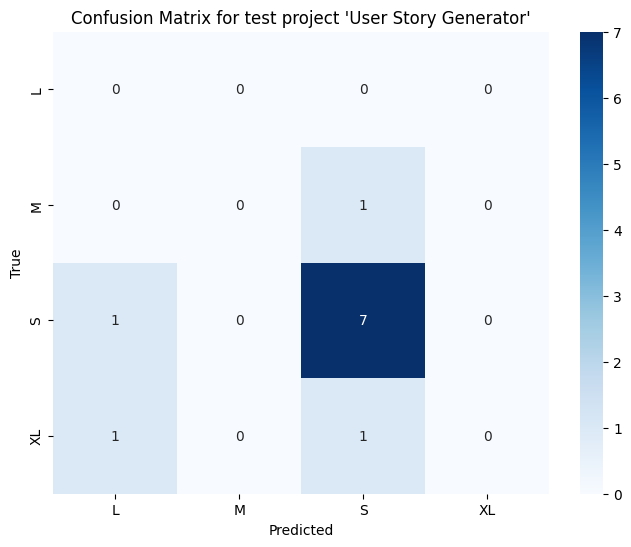

In [44]:
# Model (Numerik) <== All Features
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.multioutput import MultiOutputClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
import matplotlib.pyplot as plt
import seaborn as sns

unique_projects = df['Project Name'].unique()

accuracy_list_Adaboost_nt11 = []
accuracy_list_DecisionTree_nt11 = []
accuracy_list_MultinomialNB_nt11 = []
precision_list_Adaboost_nt11 = []
precision_list_DecisionTree_nt11 = []
precision_list_MultinomialNB_nt11 = []
recall_list_Adaboost_nt11 = []
recall_list_DecisionTree_nt11 = []
recall_list_MultinomialNB_nt11 = []
f1_score_list_Adaboost_nt11 = []
f1_score_list_DecisionTree_nt11 = []
f1_score_list_MultinomialNB_nt11 = []
mean_accuracy_nt11 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_num1.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_num1.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt11.append(accuracy)
    precision_list_Adaboost_nt11.append(precision)
    recall_list_Adaboost_nt11.append(recall)
    f1_score_list_Adaboost_nt11.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt11.append(accuracy)
    precision_list_DecisionTree_nt11.append(precision)
    recall_list_DecisionTree_nt11.append(recall)
    f1_score_list_DecisionTree_nt11.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt11.append(accuracy)
    precision_list_MultinomialNB_nt11.append(precision)
    recall_list_MultinomialNB_nt11.append(recall)
    f1_score_list_MultinomialNB_nt11.append(f1)

In [45]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt11': precision_list_Adaboost_nt11,
    'Recall_Adaboost_nt11': recall_list_Adaboost_nt11,
    'Accuracy_Adaboost_nt11': accuracy_list_Adaboost_nt11,
    'F1_Score_Adaboost_nt11': f1_score_list_Adaboost_nt11,
    'Precision_DecisionTree_nt11': precision_list_DecisionTree_nt11,
    'Recall_DecisionTree_nt11': recall_list_DecisionTree_nt11,
    'Accuracy_DecisionTree_nt11': accuracy_list_DecisionTree_nt11,
    'F1_Score_DecisionTree_nt11': f1_score_list_DecisionTree_nt11,
    'Precision_MultinomialNB_nt11': precision_list_MultinomialNB_nt11,
    'Recall_MultinomialNB_nt11': recall_list_MultinomialNB_nt11,
    'Accuracy_MultinomialNB_nt11': accuracy_list_MultinomialNB_nt11,
    'F1_Score_MultinomialNB_nt11': f1_score_list_MultinomialNB_nt11,
}

# Buat DataFrame
df_result_nt11 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt11


,Project,Precision_Adaboost_nt11,Recall_Adaboost_nt11,Accuracy_Adaboost_nt11,F1_Score_Adaboost_nt11,Precision_DecisionTree_nt11,Recall_DecisionTree_nt11,Accuracy_DecisionTree_nt11,F1_Score_DecisionTree_nt11,Precision_MultinomialNB_nt11,Recall_MultinomialNB_nt11,Accuracy_MultinomialNB_nt11,F1_Score_MultinomialNB_nt11
0,Akobesi,0.571236,0.582677,0.566929,0.551979,0.585592,0.574803,0.574803,0.565000,0.498961,0.700787,0.700787,0.582898
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,1.000000,0.909091,0.909091,0.951872,0.954545,0.818182,0.818182,0.867424,0.727273,0.727273,0.727273,0.727273
3,Journal Database Reviewer,0.708333,0.750000,0.750000,0.725000,0.648214,0.687500,0.562500,0.641865,0.423077,0.500000,0.500000,0.458333
4,Git Trackr,0.466667,0.666667,0.500000,0.541667,0.466667,0.666667,0.500000,0.541667,0.541667,0.666667,0.666667,0.595238
5,Seareq,1.000000,0.500000,0.500000,0.625000,1.000000,1.000000,1.000000,1.000000,0.750000,0.500000,0.500000,0.600000
6,Sales Monitoring on Multimarket,0.846154,0.611111,0.611111,0.628571,0.581699,0.722222,0.611111,0.625798,0.444444,0.666667,0.666667,0.533333
7,Ucase,1.000000,0.875000,0.875000,0.916667,0.895833,0.875000,0.750000,0.859848,0.446429,0.625000,0.625000,0.520833
8,DFD Generator,0.923077,0.846154,0.846154,0.876923,1.000000,0.769231,0.769231,0.843590,0.492308,0.615385,0.615385,0.547009
9,User Story Generator,0.854545,1.000000,0.818182,0.919192,0.893939,0.727273,0.636364,0.765501,0.565657,0.636364,0.636364,0.598930


In [46]:
# Mean Accuracy
mean_accuracy_nt11.append(np.mean(accuracy_list_Adaboost_nt11))
mean_accuracy_nt11.append(np.mean(accuracy_list_DecisionTree_nt11))
mean_accuracy_nt11.append(np.mean(accuracy_list_MultinomialNB_nt11))
print("Mean Accuracy")
print(mean_accuracy_nt11)

Mean Accuracy
[0.7376466818395951, 0.7222190484493635, 0.6304808380595782]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.71      1.00      0.83        89
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.70      0.71       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.50      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.4989606299212598     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5828979321510044

Confusion matrix for test project 'Akobesi':


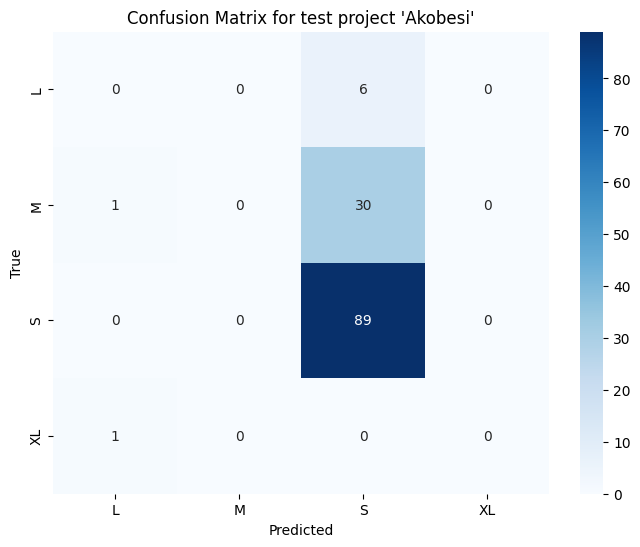

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.49      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127

Precision: 0.49110298220596443     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5775007290755322

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


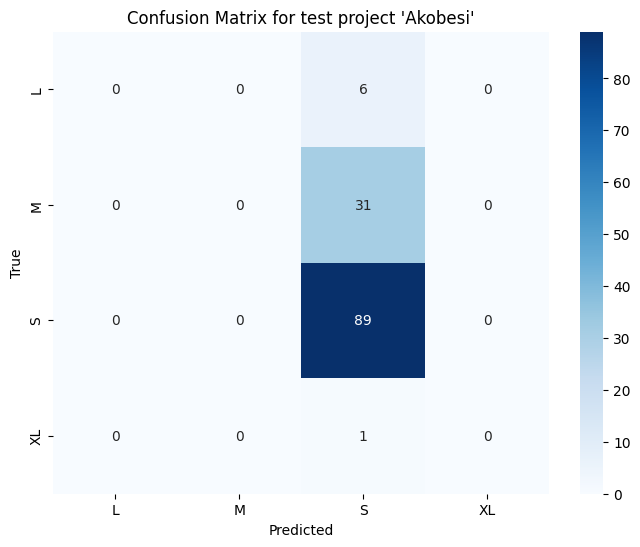

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.78      0.76      0.77        89
          XL       0.03      1.00      0.06         1

   micro avg       0.58      0.55      0.56       127
   macro avg       0.45      0.45      0.22       127
weighted avg       0.79      0.55      0.56       127
 samples avg       0.55      0.55      0.55       127

Precision: 0.7920749718197452     Recall: 0.5511811023622047      Accuracy: 0.5433070866141733      F1 Score: 0.5572366204892837

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

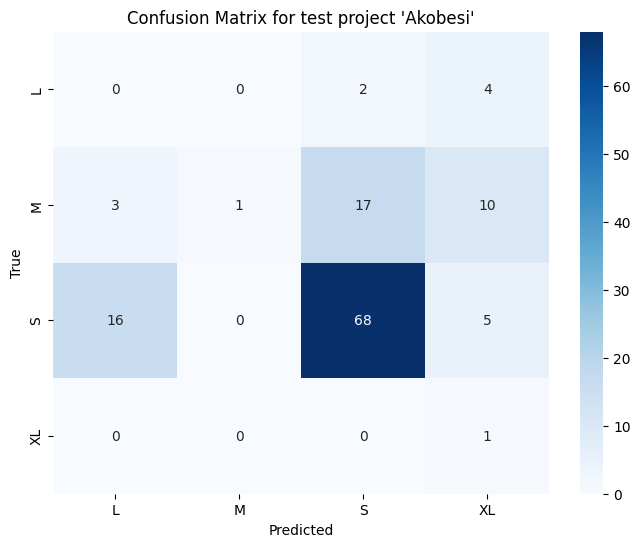

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

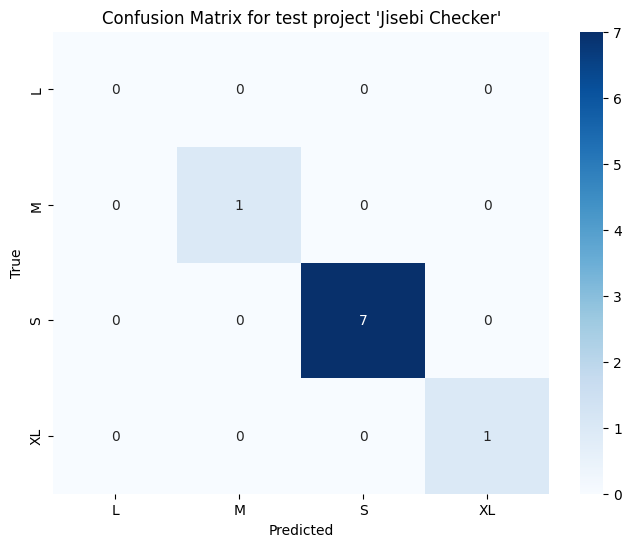

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


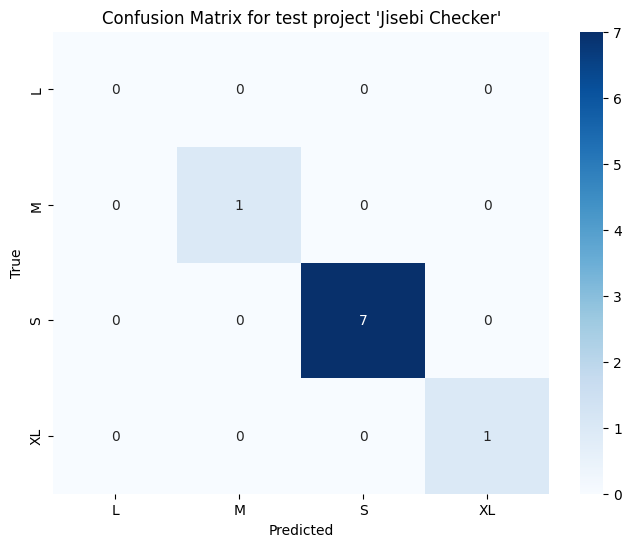

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.78      0.74         9
   macro avg       0.30      0.46      0.34         9
weighted avg       0.70      0.78      0.72         9
 samples avg       0.72      0.78      0.74         9

Precision: 0.7037037037037037     Recall: 0.7777777777777778      Accuracy: 0.6666666666666666      F1 Score: 0.7222222222222222

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

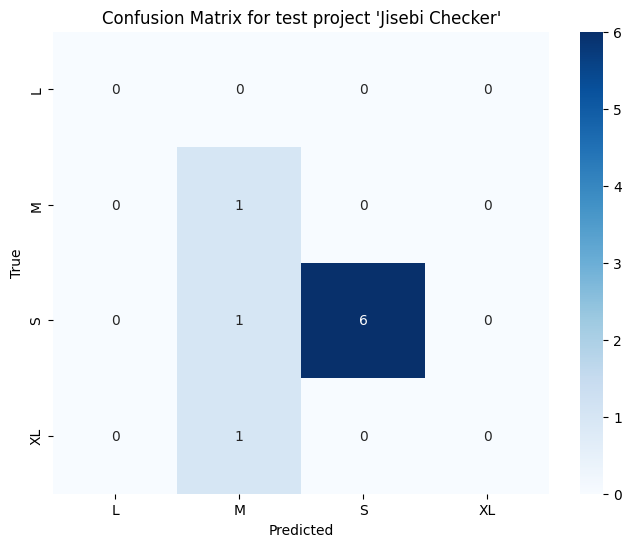

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.82      0.90        11
   macro avg       0.75      0.69      0.72        11
weighted avg       1.00      0.82      0.90        11
 samples avg       0.82      0.82      0.82        11

Precision: 1.0     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8977272727272727

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

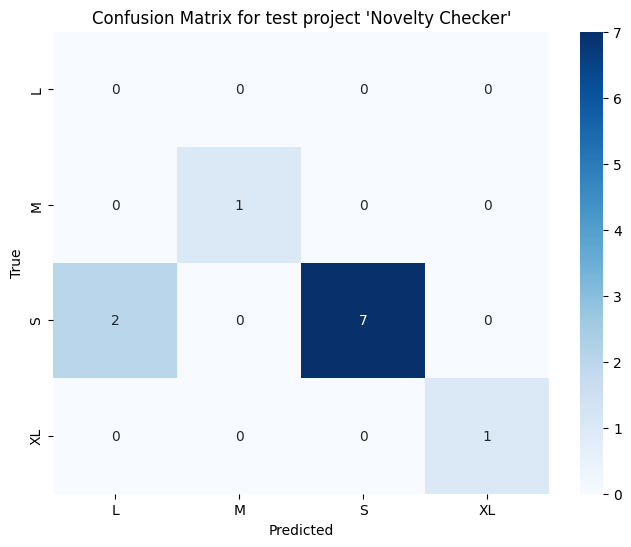

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9215686274509803

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

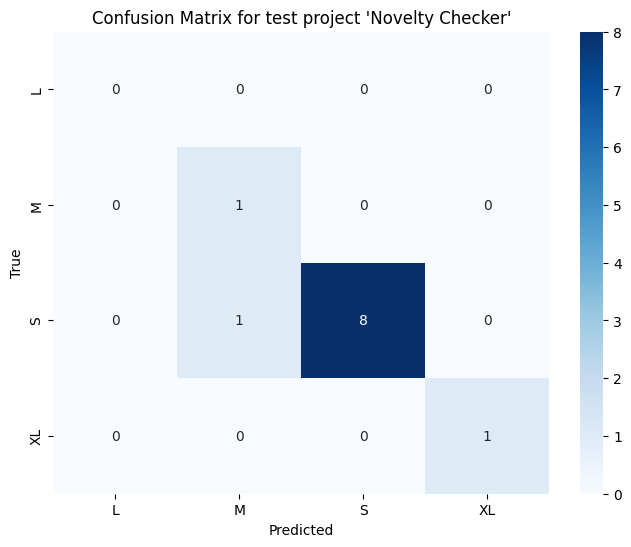

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.89      0.89      0.89         9
          XL       0.00      0.00      0.00         1

   micro avg       0.75      0.82      0.78        11
   macro avg       0.31      0.47      0.35        11
weighted avg       0.76      0.82      0.77        11
 samples avg       0.77      0.82      0.79        11

Precision: 0.7575757575757577     Recall: 0.8181818181818182      Accuracy: 0.7272727272727273      F1 Score: 0.7727272727272727

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

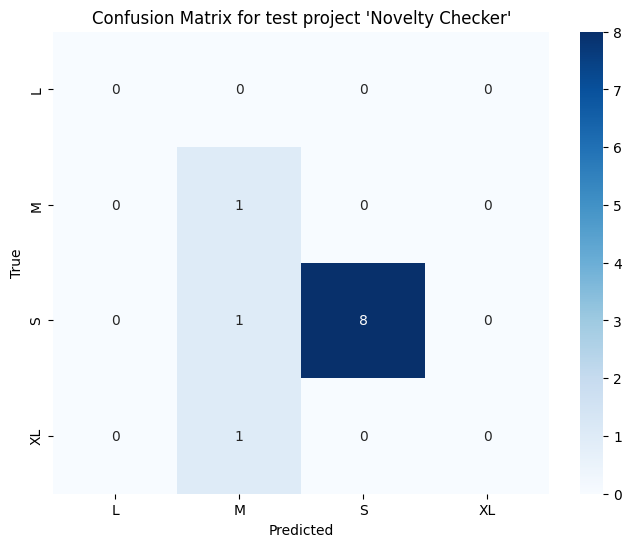

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.67      1.00      0.80         2
           S       0.77      0.91      0.83        11
          XL       1.00      1.00      1.00         1

   micro avg       0.76      0.81      0.79        16
   macro avg       0.61      0.73      0.66        16
weighted avg       0.67      0.81      0.74        16
 samples avg       0.75      0.81      0.77        16

Precision: 0.6746794871794872     Recall: 0.8125      Accuracy: 0.6875      F1 Score: 0.7354166666666666

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

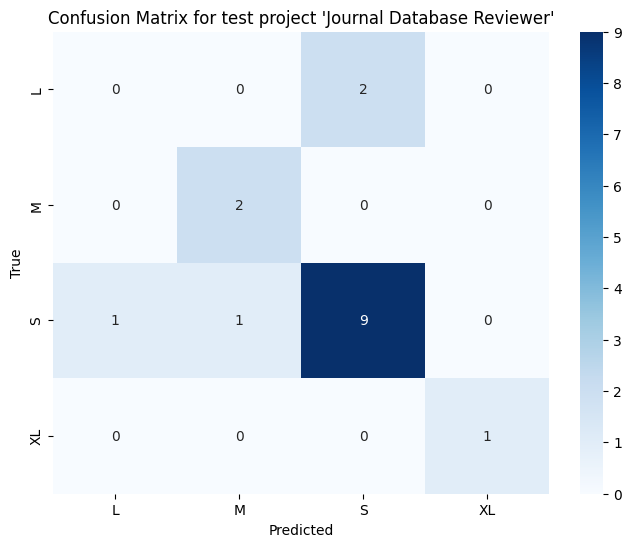

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.79      1.00      0.88        11
          XL       1.00      1.00      1.00         1

   micro avg       0.74      0.88      0.80        16
   macro avg       0.57      0.75      0.64        16
weighted avg       0.67      0.88      0.75        16
 samples avg       0.81      0.88      0.83        16

Precision: 0.6651785714285714     Recall: 0.875      Accuracy: 0.75      F1 Score: 0.7508333333333334

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


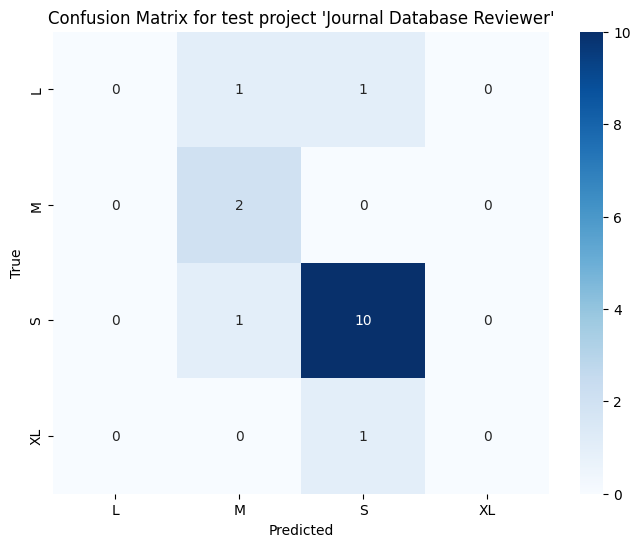

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.67      0.73      0.70        11
          XL       0.00      0.00      0.00         1

   micro avg       0.57      0.50      0.53        16
   macro avg       0.17      0.18      0.17        16
weighted avg       0.46      0.50      0.48        16
 samples avg       0.50      0.50      0.50        16

Precision: 0.4583333333333333     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4782608695652174

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

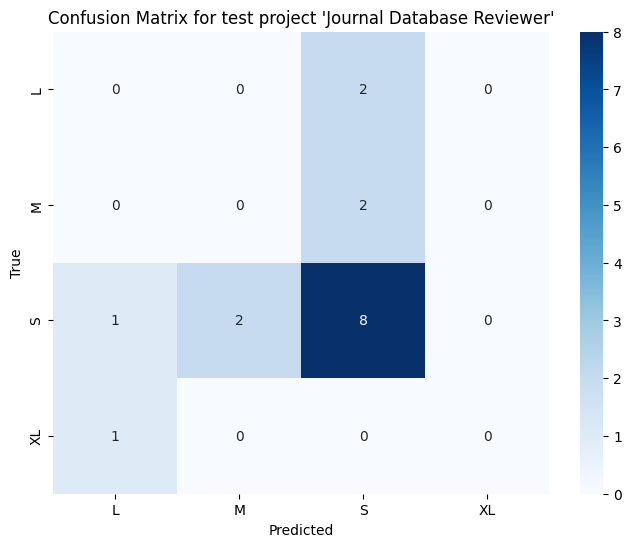

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.44      0.50      0.46         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

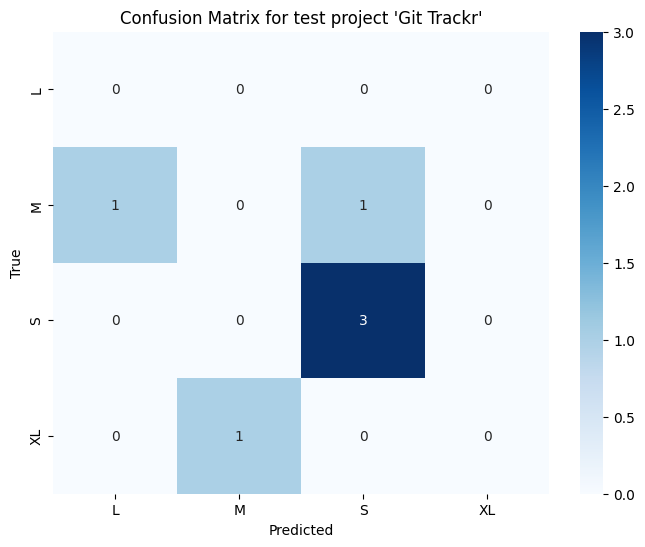

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


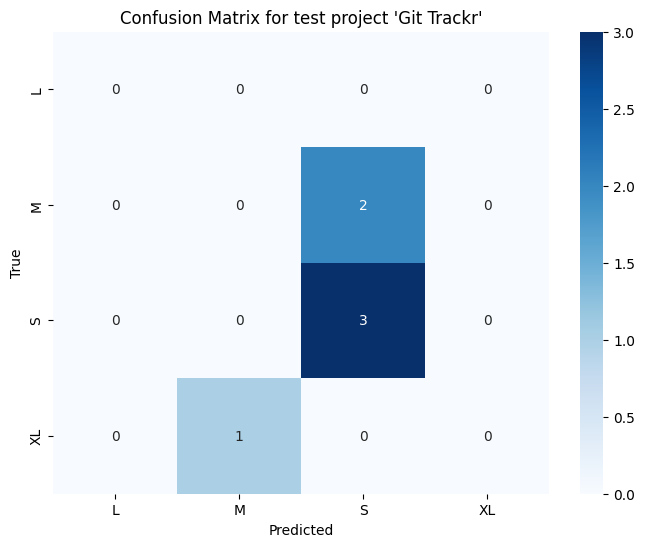

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

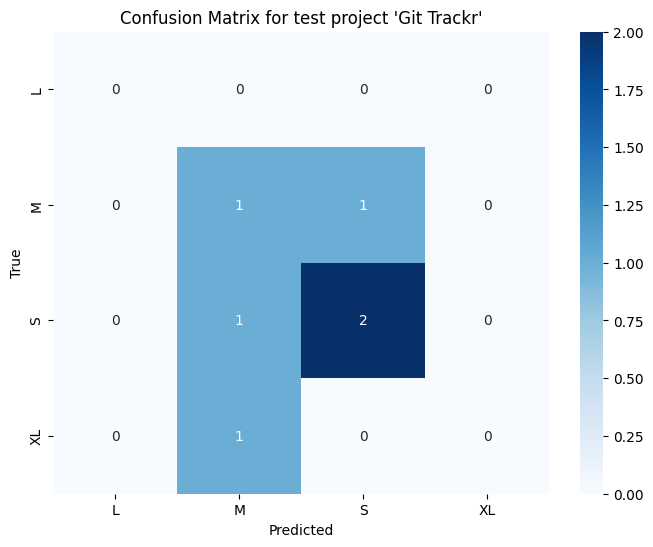

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.75      0.86         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.75      0.75      0.75         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

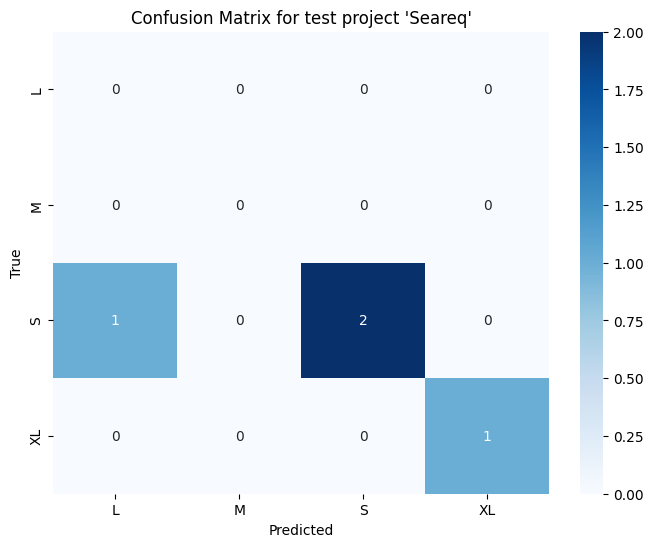

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       0.67      0.67      0.67         3
          XL       1.00      1.00      1.00         1

   micro avg       0.75      0.75      0.75         4
   macro avg       0.42      0.42      0.42         4
weighted avg       0.75      0.75      0.75         4
 samples avg       0.62      0.75      0.67         4



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.75     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.75

Confusion matrix for test project 'Seareq':


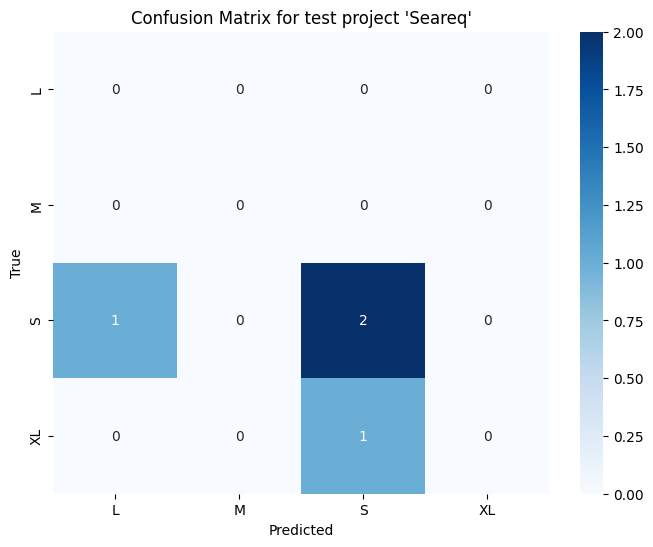

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         4
   macro avg       0.25      0.17      0.20         4
weighted avg       0.75      0.50      0.60         4
 samples avg       0.50      0.50      0.50         4

Precision: 0.75     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.6000000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

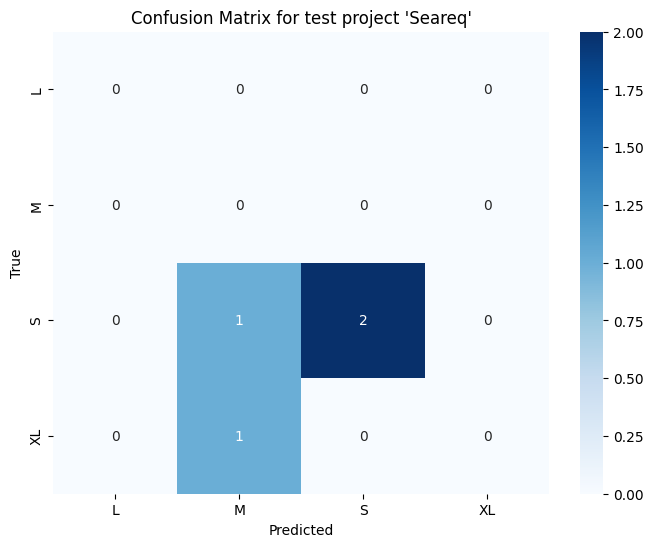

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.69      0.92      0.79        12
          XL       0.00      0.00      0.00         0

   micro avg       0.67      0.67      0.67        18
   macro avg       0.30      0.27      0.26        18
weighted avg       0.62      0.67      0.61        18
 samples avg       0.67      0.67      0.67        18

Precision: 0.625     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6071428571428572

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

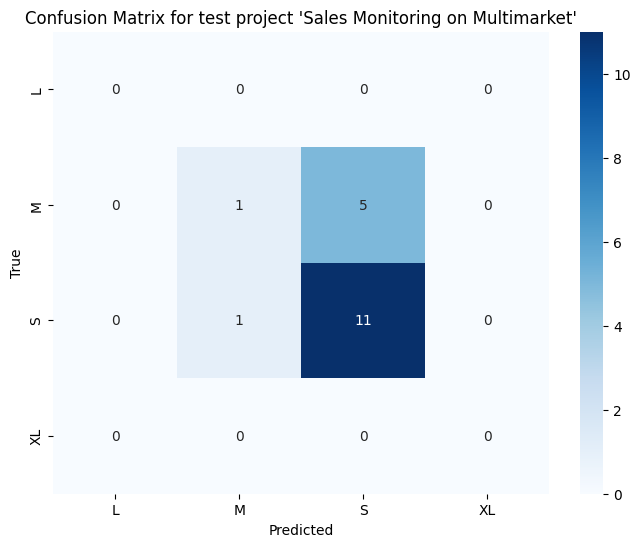

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.68      0.72      0.70        18
   macro avg       0.30      0.29      0.27        18
weighted avg       0.64      0.72      0.64        18
 samples avg       0.69      0.72      0.70        18

Precision: 0.6372549019607843     Recall: 0.7222222222222222      Accuracy: 0.6666666666666666      F1 Score: 0.6350574712643678

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

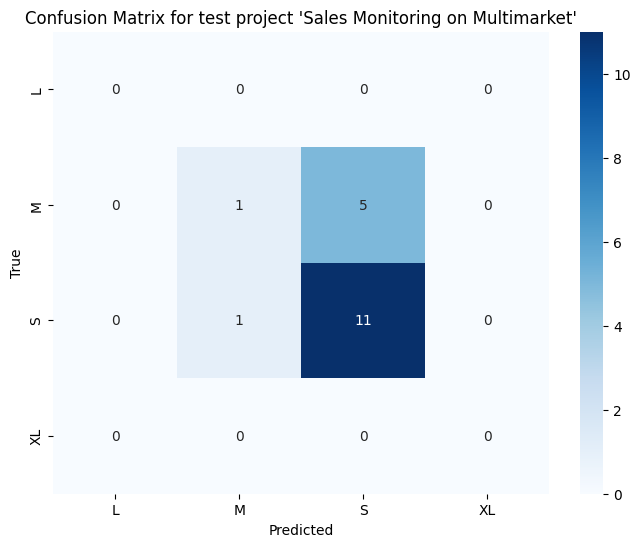

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.65      0.92      0.76        12
          XL       0.00      0.00      0.00         0

   micro avg       0.63      0.67      0.65        18
   macro avg       0.29      0.27      0.25        18
weighted avg       0.60      0.67      0.59        18
 samples avg       0.64      0.67      0.65        18



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.5980392156862746     Recall: 0.6666666666666666      Accuracy: 0.6111111111111112      F1 Score: 0.5890804597701149

Confusion matrix for test project 'Sales Monitoring on Multimarket':


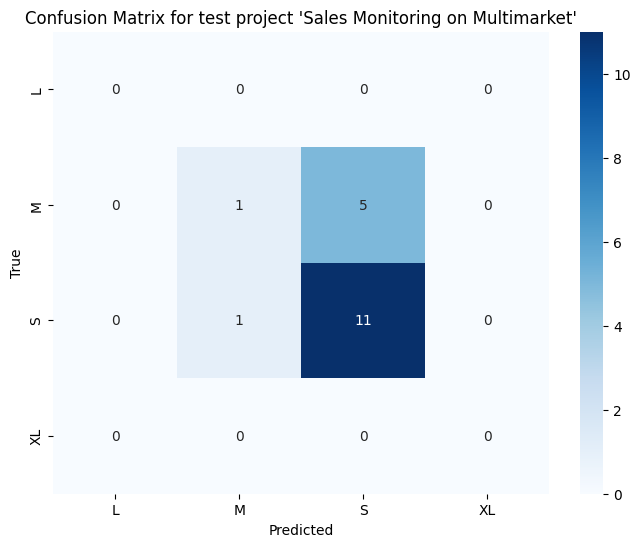

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

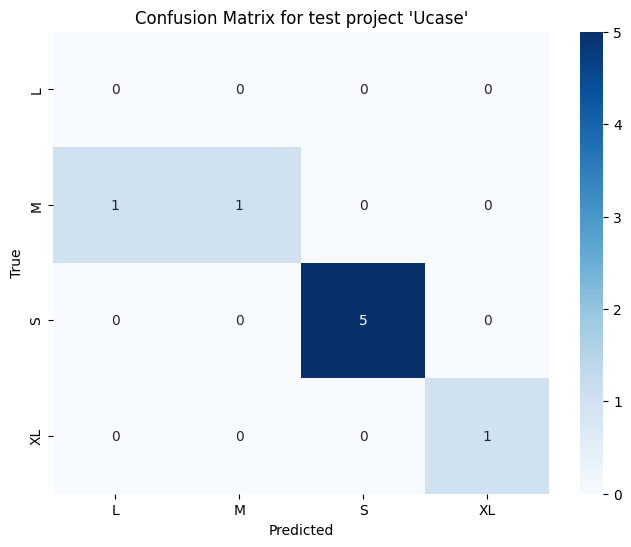

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

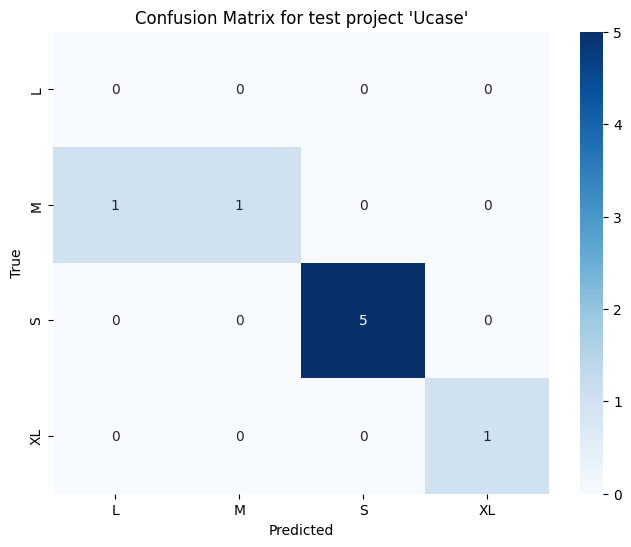

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         2
           S       0.67      0.80      0.73         5
          XL       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75         8
   macro avg       0.42      0.45      0.43         8
weighted avg       0.67      0.75      0.70         8
 samples avg       0.69      0.75      0.71         8

Precision: 0.6666666666666666     Recall: 0.75      Accuracy: 0.625      F1 Score: 0.7045454545454545

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

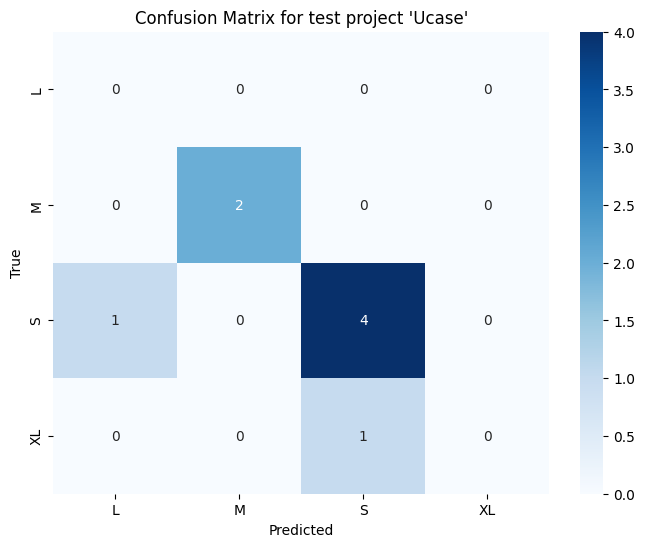

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.92      0.92        13
   macro avg       0.72      0.67      0.69        13
weighted avg       0.93      0.92      0.92        13
 samples avg       0.92      0.92      0.92        13

Precision: 0.9316239316239316     Recall: 0.9230769230769231      Accuracy: 0.9230769230769231      F1 Score: 0.9176470588235295

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

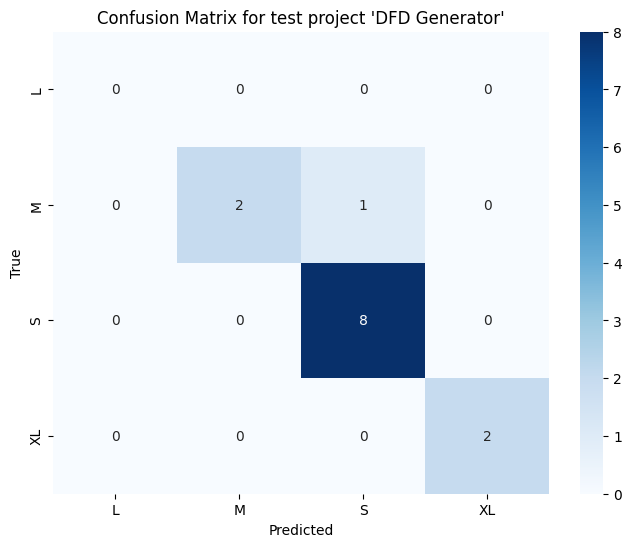

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.92      0.92        13
   macro avg       0.72      0.67      0.69        13
weighted avg       0.93      0.92      0.92        13
 samples avg       0.92      0.92      0.92        13

Precision: 0.9316239316239316     Recall: 0.9230769230769231      Accuracy: 0.9230769230769231      F1 Score: 0.9176470588235295

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

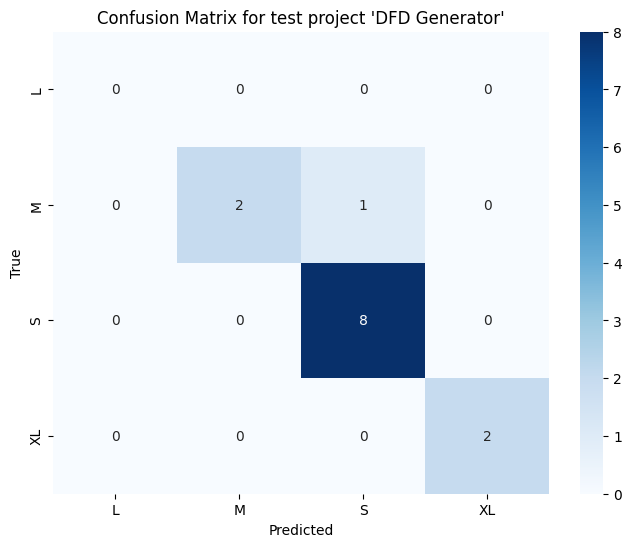

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.67      0.67      0.67         3
           S       0.78      0.88      0.82         8
          XL       0.00      0.00      0.00         2

   micro avg       0.75      0.69      0.72        13
   macro avg       0.36      0.39      0.37        13
weighted avg       0.63      0.69      0.66        13
 samples avg       0.65      0.69      0.67        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.6324786324786325     Recall: 0.6923076923076923      Accuracy: 0.6153846153846154      F1 Score: 0.660633484162896

Confusion matrix for test project 'DFD Generator':


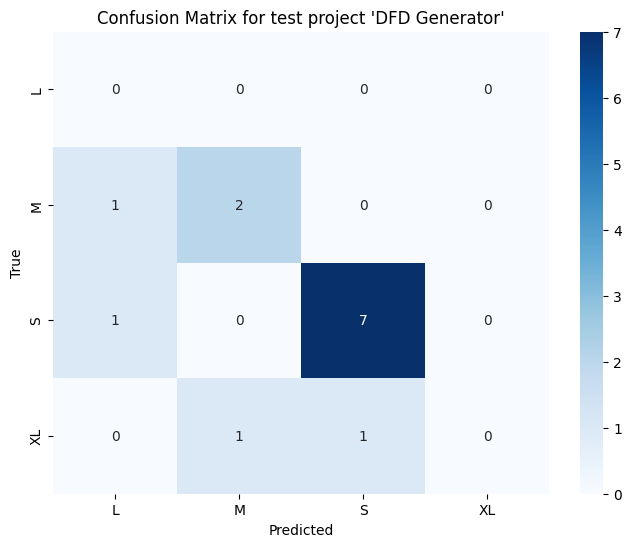

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.75      0.86         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.82      0.90        11
   macro avg       0.75      0.69      0.71        11
weighted avg       1.00      0.82      0.90        11
 samples avg       0.82      0.82      0.82        11

Precision: 1.0     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8961038961038962

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

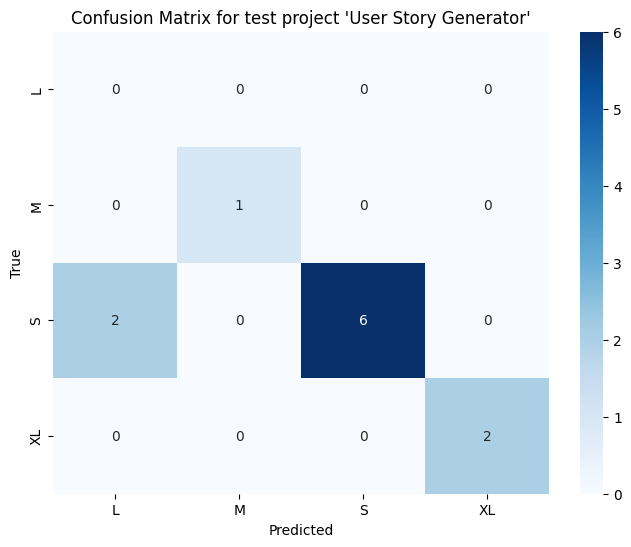

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.86      0.91      0.88        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.8181818181818182      F1 Score: 0.9212121212121211

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

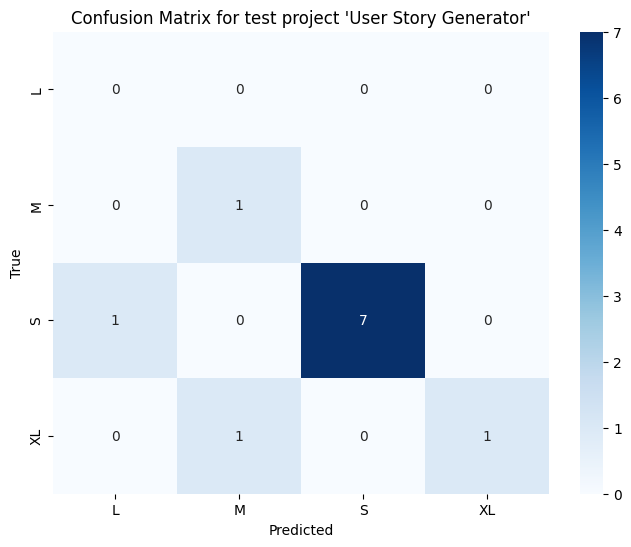

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.75      0.75      0.75         8
          XL       0.00      0.00      0.00         2

   micro avg       0.64      0.64      0.64        11
   macro avg       0.27      0.44      0.31        11
weighted avg       0.58      0.64      0.59        11
 samples avg       0.59      0.64      0.61        11

Precision: 0.5757575757575757     Recall: 0.6363636363636364      Accuracy: 0.5454545454545454      F1 Score: 0.5909090909090909

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

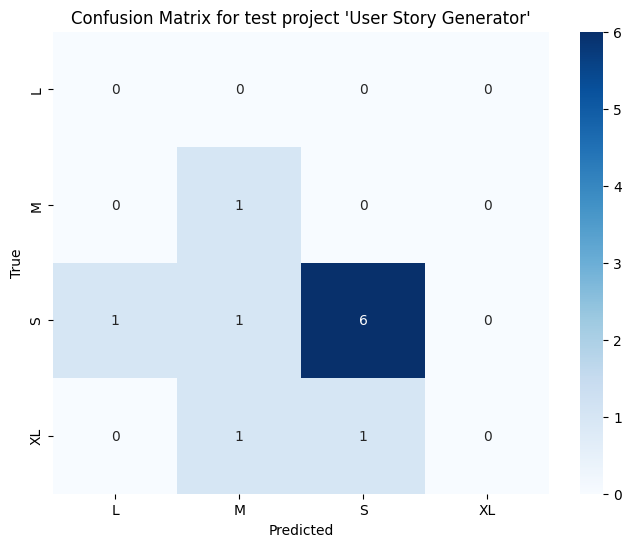

In [47]:
# Model (Numerik) <== All Features
accuracy_list_Adaboost_nt12 = []
accuracy_list_DecisionTree_nt12 = []
accuracy_list_MultinomialNB_nt12 = []
precision_list_Adaboost_nt12 = []
precision_list_DecisionTree_nt12 = []
precision_list_MultinomialNB_nt12 = []
recall_list_Adaboost_nt12 = []
recall_list_DecisionTree_nt12 = []
recall_list_MultinomialNB_nt12 = []
f1_score_list_Adaboost_nt12 = []
f1_score_list_DecisionTree_nt12 = []
f1_score_list_MultinomialNB_nt12 = []
mean_accuracy_nt12 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_user_story_num1.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_user_story_num1.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt12.append(accuracy)
    precision_list_Adaboost_nt12.append(precision)
    recall_list_Adaboost_nt12.append(recall)
    f1_score_list_Adaboost_nt12.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt12.append(accuracy)
    precision_list_DecisionTree_nt12.append(precision)
    recall_list_DecisionTree_nt12.append(recall)
    f1_score_list_DecisionTree_nt12.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt12.append(accuracy)
    precision_list_MultinomialNB_nt12.append(precision)
    recall_list_MultinomialNB_nt12.append(recall)
    f1_score_list_MultinomialNB_nt12.append(f1)

In [48]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt12': precision_list_Adaboost_nt12,
    'Recall_Adaboost_nt12': recall_list_Adaboost_nt12,
    'Accuracy_Adaboost_nt12': accuracy_list_Adaboost_nt12,
    'F1_Score_Adaboost_nt12': f1_score_list_Adaboost_nt12,
    'Precision_DecisionTree_nt12': precision_list_DecisionTree_nt12,
    'Recall_DecisionTree_nt12': recall_list_DecisionTree_nt12,
    'Accuracy_DecisionTree_nt12': accuracy_list_DecisionTree_nt12,
    'F1_Score_DecisionTree_nt12': f1_score_list_DecisionTree_nt12,
    'Precision_MultinomialNB_nt12': precision_list_MultinomialNB_nt12,
    'Recall_MultinomialNB_nt12': recall_list_MultinomialNB_nt12,
    'Accuracy_MultinomialNB_nt12': accuracy_list_MultinomialNB_nt12,
    'F1_Score_MultinomialNB_nt12': f1_score_list_MultinomialNB_nt12,
}

# Buat DataFrame
df_result_nt12 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt12


,Project,Precision_Adaboost_nt12,Recall_Adaboost_nt12,Accuracy_Adaboost_nt12,F1_Score_Adaboost_nt12,Precision_DecisionTree_nt12,Recall_DecisionTree_nt12,Accuracy_DecisionTree_nt12,F1_Score_DecisionTree_nt12,Precision_MultinomialNB_nt12,Recall_MultinomialNB_nt12,Accuracy_MultinomialNB_nt12,F1_Score_MultinomialNB_nt12
0,Akobesi,0.498961,0.700787,0.700787,0.582898,0.491103,0.700787,0.700787,0.577501,0.792075,0.551181,0.543307,0.557237
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.703704,0.777778,0.666667,0.722222
2,Novelty Checker,1.000000,0.818182,0.818182,0.897727,0.954545,0.909091,0.909091,0.921569,0.757576,0.818182,0.727273,0.772727
3,Journal Database Reviewer,0.674679,0.812500,0.687500,0.735417,0.665179,0.875000,0.750000,0.750833,0.458333,0.500000,0.500000,0.478261
4,Git Trackr,0.541667,0.666667,0.500000,0.595238,0.466667,0.666667,0.500000,0.541667,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,0.750000,0.750000,0.850000,0.750000,0.750000,0.500000,0.750000,0.750000,0.500000,0.500000,0.600000
6,Sales Monitoring on Multimarket,0.625000,0.666667,0.666667,0.607143,0.637255,0.722222,0.666667,0.635057,0.598039,0.666667,0.611111,0.589080
7,Ucase,1.000000,0.875000,0.875000,0.916667,1.000000,0.875000,0.875000,0.916667,0.666667,0.750000,0.625000,0.704545
8,DFD Generator,0.931624,0.923077,0.923077,0.917647,0.931624,0.923077,0.923077,0.917647,0.632479,0.692308,0.615385,0.660633
9,User Story Generator,1.000000,0.818182,0.818182,0.896104,0.954545,0.909091,0.818182,0.921212,0.575758,0.636364,0.545455,0.590909


In [49]:
# Mean Accuracy
mean_accuracy_nt12.append(np.mean(accuracy_list_Adaboost_nt12))
mean_accuracy_nt12.append(np.mean(accuracy_list_DecisionTree_nt12))
mean_accuracy_nt12.append(np.mean(accuracy_list_MultinomialNB_nt12))
print("Mean Accuracy")
print(mean_accuracy_nt12)

Mean Accuracy
[0.773939462768203, 0.764280371859112, 0.583419675250384]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.33      0.03      0.06        31
           S       0.69      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.68      0.63      0.65       127
   macro avg       0.26      0.23      0.21       127
weighted avg       0.56      0.63      0.56       127
 samples avg       0.63      0.63      0.63       127

Precision: 0.5627753052607555     Recall: 0.6299212598425197      Accuracy: 0.6299212598425197      F1 Score: 0.5571252122896403

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

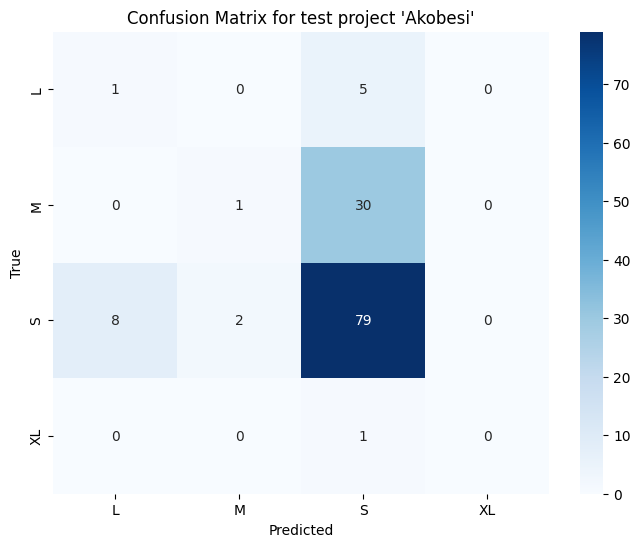

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.68      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.68      0.62      0.65       127
   macro avg       0.17      0.22      0.19       127
weighted avg       0.48      0.62      0.54       127
 samples avg       0.62      0.62      0.62       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.47726038555525385     Recall: 0.6220472440944882      Accuracy: 0.6220472440944882      F1 Score: 0.5401190704820434

Confusion matrix for test project 'Akobesi':


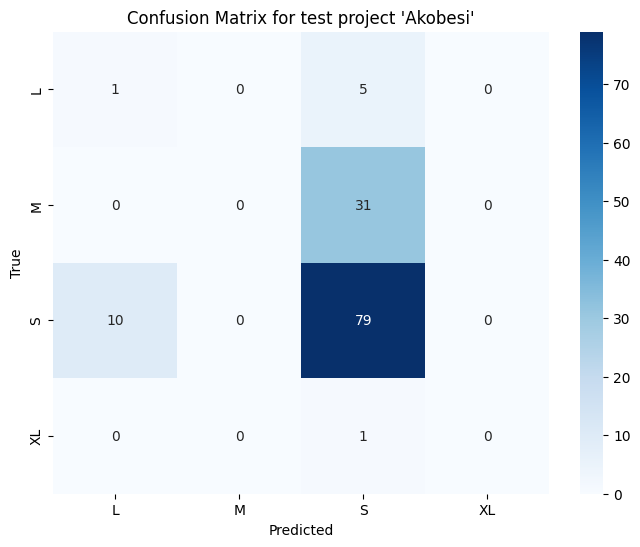

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.78      0.79      0.78        89
          XL       0.04      1.00      0.08         1

   micro avg       0.63      0.57      0.60       127
   macro avg       0.46      0.45      0.23       127
weighted avg       0.79      0.57      0.56       127
 samples avg       0.57      0.57      0.57       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.789493704591274     Recall: 0.5669291338582677      Accuracy: 0.5669291338582677      F1 Score: 0.5640139518174753

Confusion matrix for test project 'Akobesi':


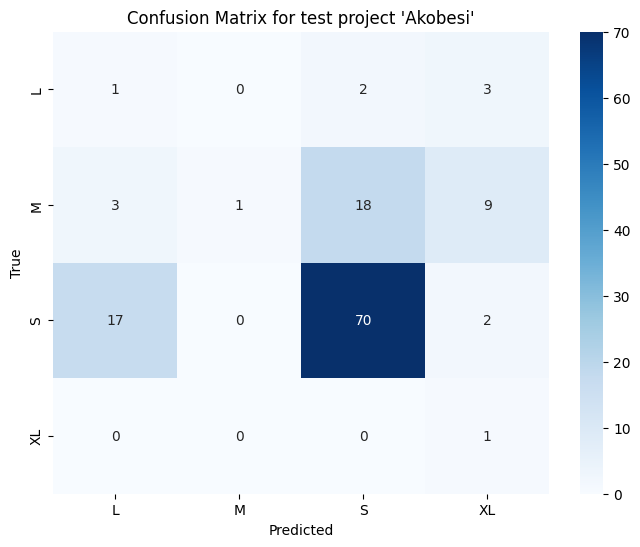

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

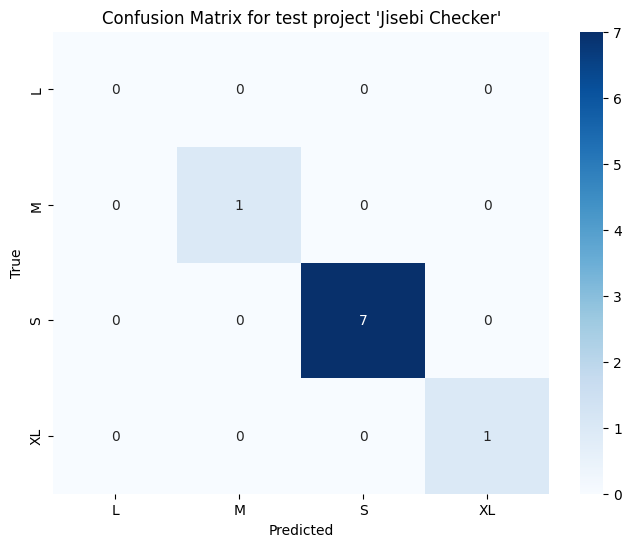

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

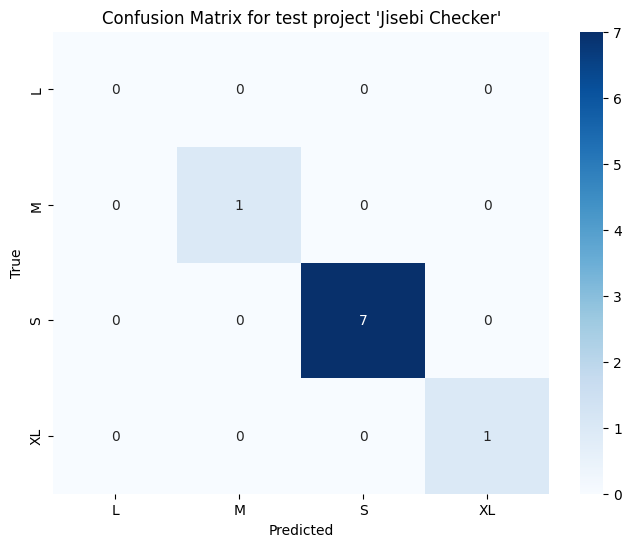

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.78      0.74         9
   macro avg       0.30      0.46      0.34         9
weighted avg       0.70      0.78      0.72         9
 samples avg       0.72      0.78      0.74         9

Precision: 0.7037037037037037     Recall: 0.7777777777777778      Accuracy: 0.6666666666666666      F1 Score: 0.7222222222222222

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

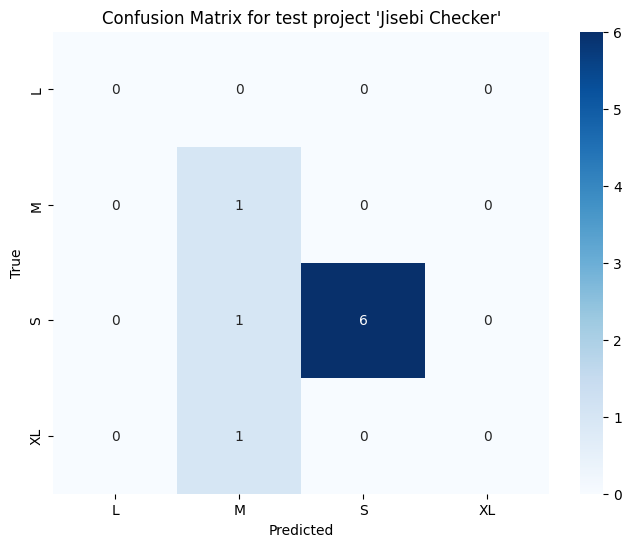

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.67      0.80         9
          XL       1.00      1.00      1.00         1

   micro avg       0.89      0.73      0.80        11
   macro avg       0.62      0.67      0.62        11
weighted avg       0.95      0.73      0.81        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.9545454545454546     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.8060606060606061

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

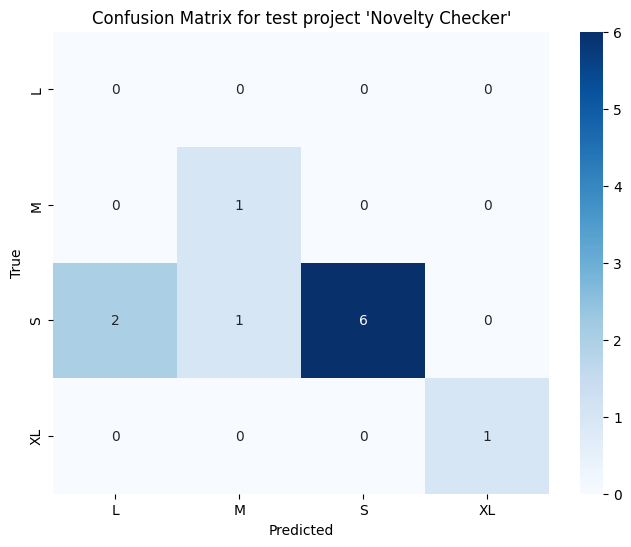

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9215686274509803

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

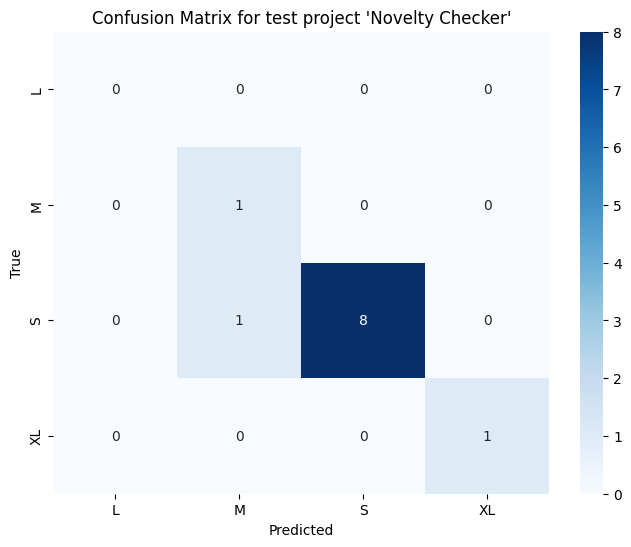

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.89      0.89      0.89         9
          XL       0.00      0.00      0.00         1

   micro avg       0.75      0.82      0.78        11
   macro avg       0.31      0.47      0.35        11
weighted avg       0.76      0.82      0.77        11
 samples avg       0.77      0.82      0.79        11

Precision: 0.7575757575757577     Recall: 0.8181818181818182      Accuracy: 0.7272727272727273      F1 Score: 0.7727272727272727

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

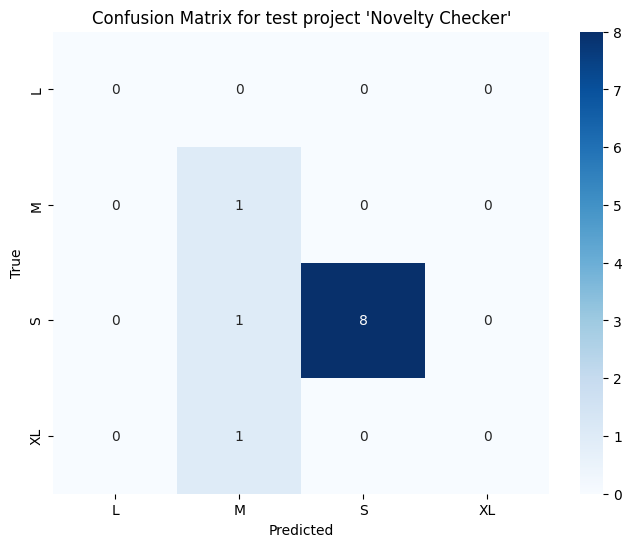

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       1.00      0.50      0.67         2
           S       0.83      0.91      0.87        11
          XL       1.00      1.00      1.00         1

   micro avg       0.86      0.75      0.80        16
   macro avg       0.71      0.60      0.63        16
weighted avg       0.76      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.7604166666666667     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7436594202898551

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

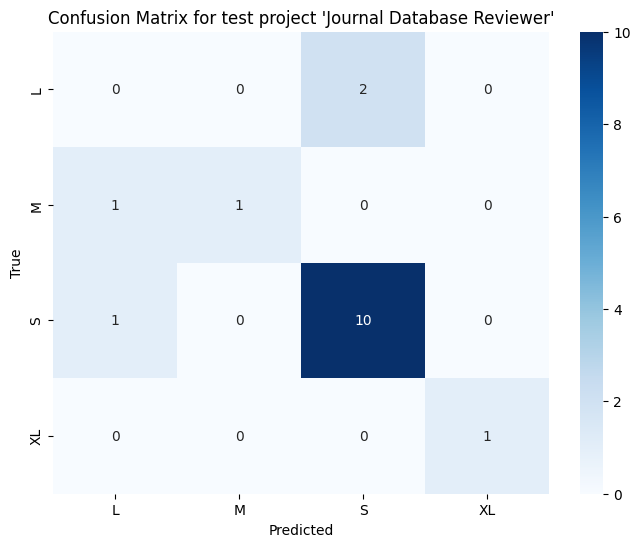

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      0.50      0.50         2
           S       0.75      0.82      0.78        11
          XL       1.00      1.00      1.00         1

   micro avg       0.73      0.69      0.71        16
   macro avg       0.56      0.58      0.57        16
weighted avg       0.64      0.69      0.66        16
 samples avg       0.66      0.69      0.67        16

Precision: 0.640625     Recall: 0.6875      Accuracy: 0.625      F1 Score: 0.6630434782608695

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

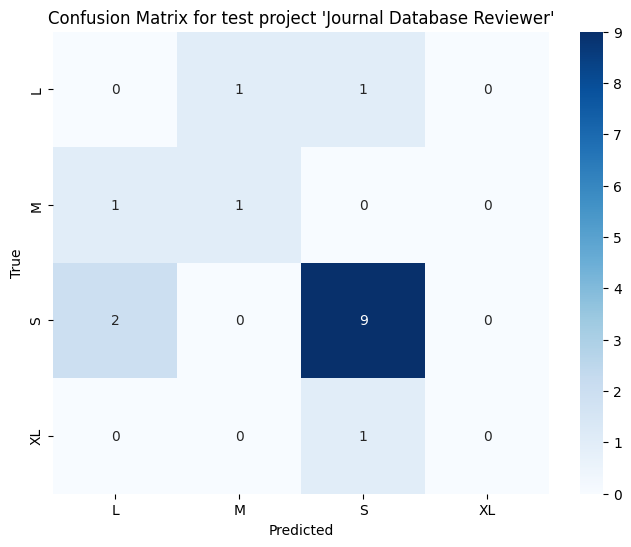

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.67      0.73      0.70        11
          XL       0.00      0.00      0.00         1

   micro avg       0.57      0.50      0.53        16
   macro avg       0.17      0.18      0.17        16
weighted avg       0.46      0.50      0.48        16
 samples avg       0.50      0.50      0.50        16

Precision: 0.4583333333333333     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4782608695652174

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

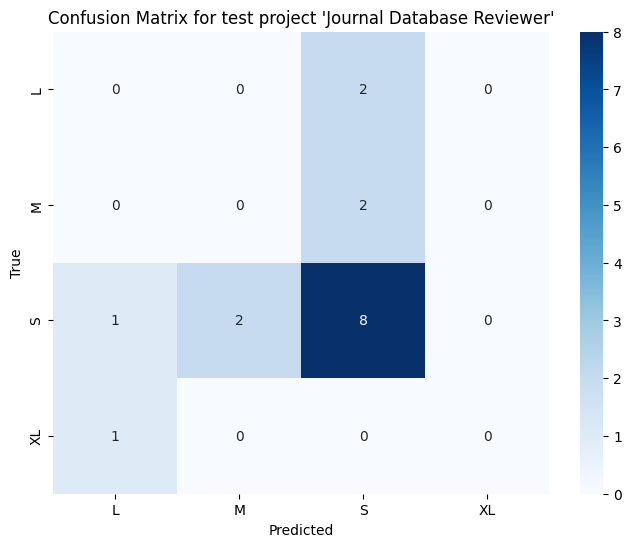

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.50      0.67      0.57         3
          XL       1.00      1.00      1.00         1

   micro avg       0.43      0.50      0.46         6
   macro avg       0.38      0.42      0.39         6
weighted avg       0.42      0.50      0.45         6
 samples avg       0.42      0.50      0.44         6

Precision: 0.4166666666666667     Recall: 0.5      Accuracy: 0.3333333333333333      F1 Score: 0.4523809523809524

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

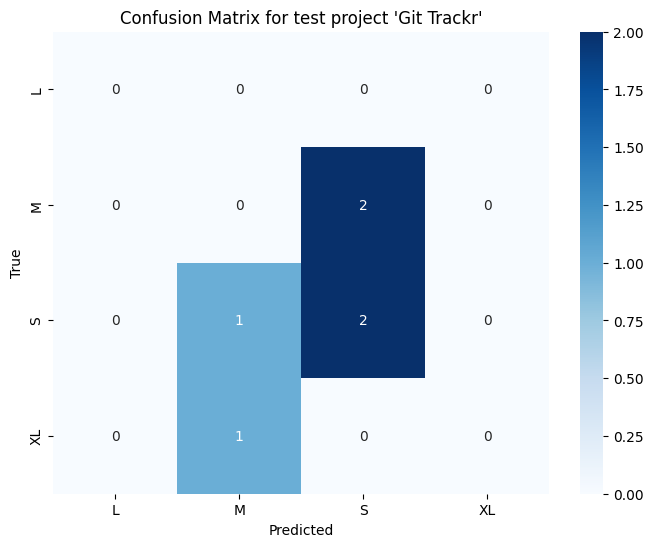

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.44      0.50      0.46         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

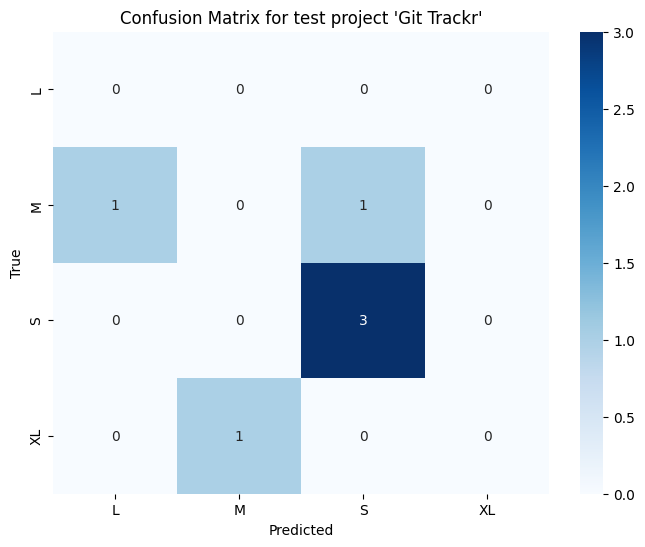

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

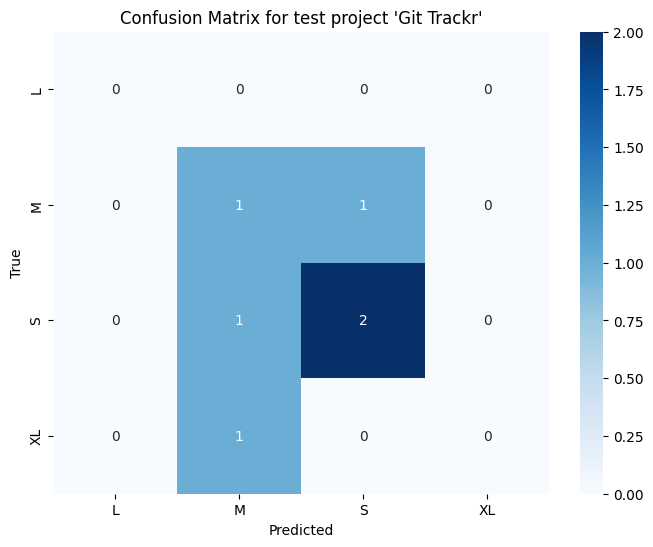

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.75      0.86         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.75      0.75      0.75         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

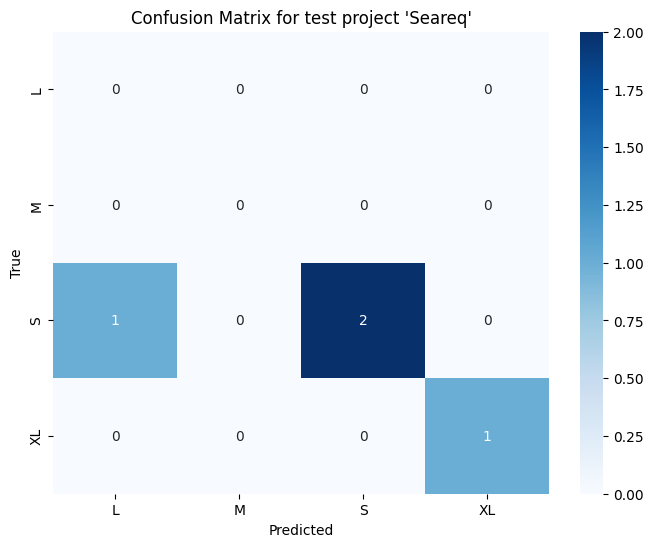

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       0.67      0.67      0.67         3
          XL       1.00      1.00      1.00         1

   micro avg       0.60      0.75      0.67         4
   macro avg       0.42      0.42      0.42         4
weighted avg       0.75      0.75      0.75         4
 samples avg       0.58      0.75      0.62         4

Precision: 0.75     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.75

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

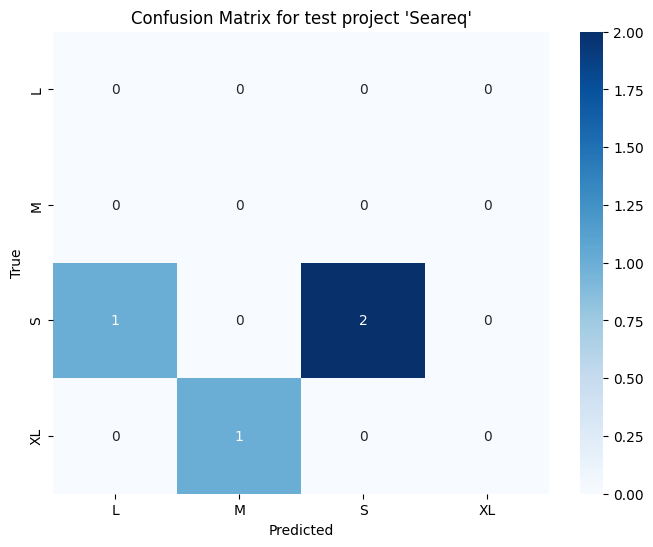

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         4
   macro avg       0.25      0.17      0.20         4
weighted avg       0.75      0.50      0.60         4
 samples avg       0.50      0.50      0.50         4

Precision: 0.75     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.6000000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

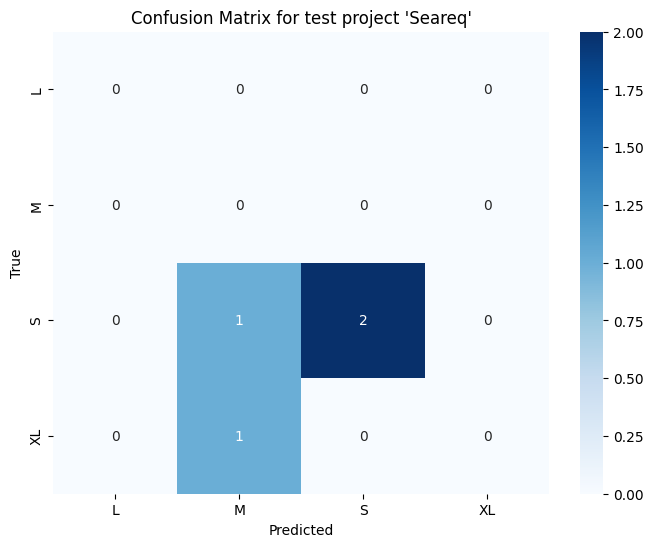

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.72      0.72      0.72        18
   macro avg       0.43      0.29      0.28        18
weighted avg       0.80      0.72      0.65        18
 samples avg       0.72      0.72      0.72        18

Precision: 0.803921568627451     Recall: 0.7222222222222222      Accuracy: 0.7222222222222222      F1 Score: 0.6469622331691297

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

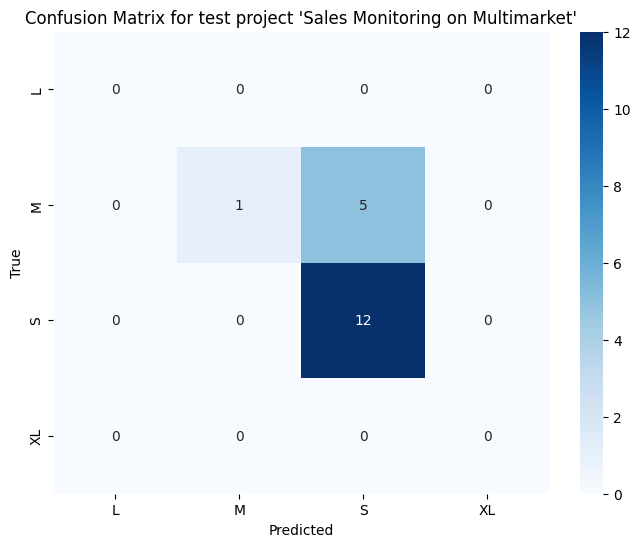

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.69      0.92      0.79        12
          XL       0.00      0.00      0.00         0

   micro avg       0.67      0.67      0.67        18
   macro avg       0.30      0.27      0.26        18
weighted avg       0.62      0.67      0.61        18
 samples avg       0.67      0.67      0.67        18



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.625     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6071428571428572

Confusion matrix for test project 'Sales Monitoring on Multimarket':


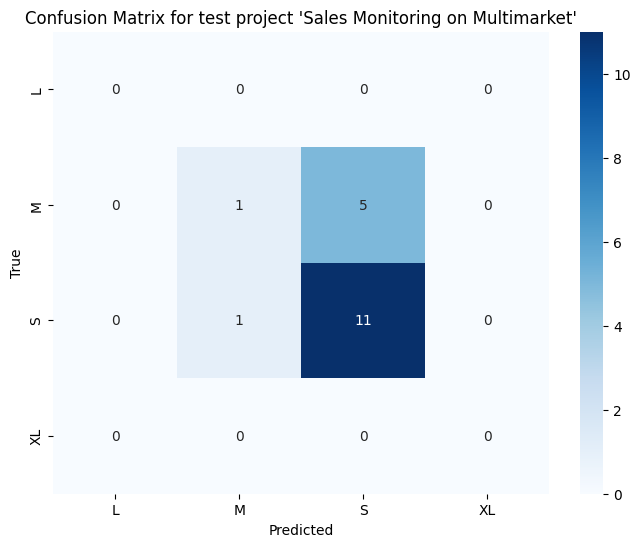

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.65      0.92      0.76        12
          XL       0.00      0.00      0.00         0

   micro avg       0.63      0.67      0.65        18
   macro avg       0.29      0.27      0.25        18
weighted avg       0.60      0.67      0.59        18
 samples avg       0.64      0.67      0.65        18



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.5980392156862746     Recall: 0.6666666666666666      Accuracy: 0.6111111111111112      F1 Score: 0.5890804597701149

Confusion matrix for test project 'Sales Monitoring on Multimarket':


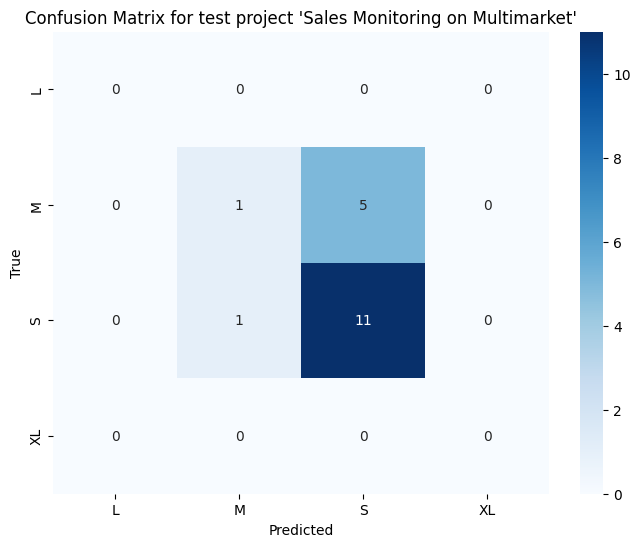

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

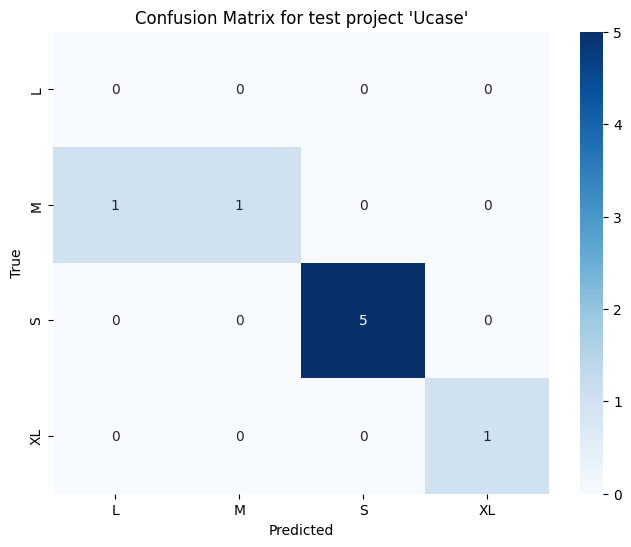

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       0.80      0.80      0.80         5
          XL       1.00      1.00      1.00         1

   micro avg       0.86      0.75      0.80         8
   macro avg       0.70      0.57      0.62         8
weighted avg       0.88      0.75      0.79         8
 samples avg       0.69      0.75      0.71         8

Precision: 0.875     Recall: 0.75      Accuracy: 0.625      F1 Score: 0.7916666666666667

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

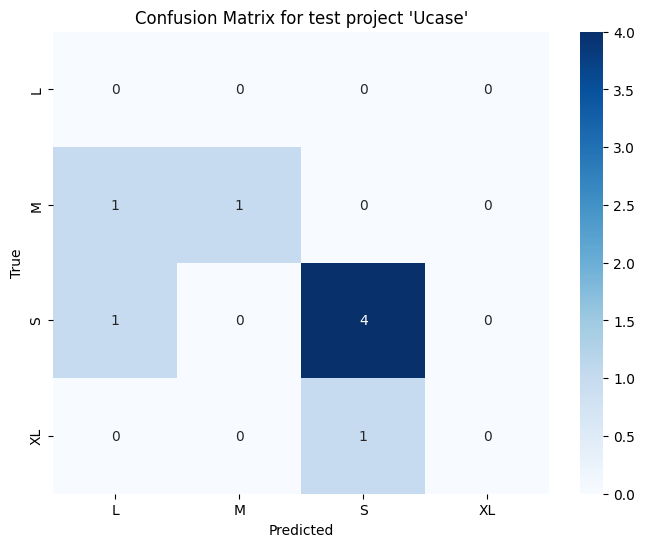

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         2
           S       0.71      1.00      0.83         5
          XL       0.00      0.00      0.00         1

   micro avg       0.78      0.88      0.82         8
   macro avg       0.43      0.50      0.46         8
weighted avg       0.70      0.88      0.77         8
 samples avg       0.81      0.88      0.83         8

Precision: 0.6964285714285714     Recall: 0.875      Accuracy: 0.75      F1 Score: 0.7708333333333333

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

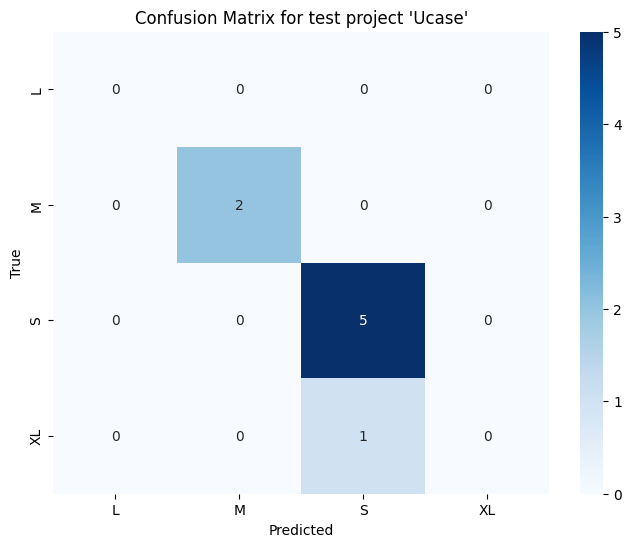

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.85      0.92        13
   macro avg       0.75      0.64      0.68        13
weighted avg       1.00      0.85      0.91        13
 samples avg       0.85      0.85      0.85        13

Precision: 1.0     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.9128205128205129

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

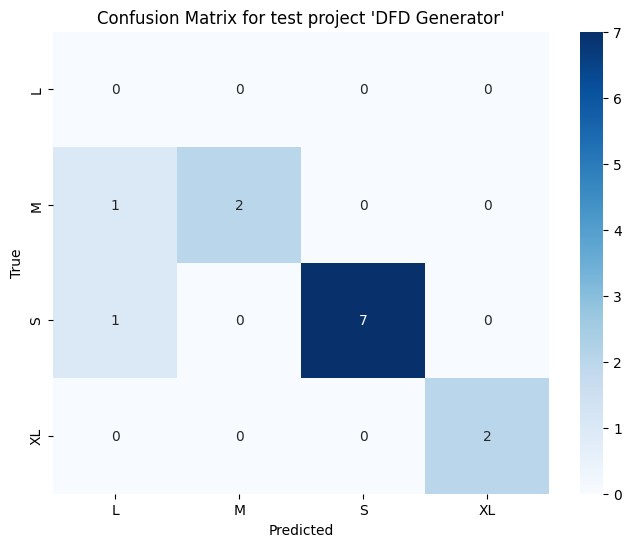

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.67      0.67      0.67         3
           S       0.88      0.88      0.88         8
          XL       1.00      1.00      1.00         2

   micro avg       0.85      0.85      0.85        13
   macro avg       0.64      0.64      0.64        13
weighted avg       0.85      0.85      0.85        13
 samples avg       0.81      0.85      0.82        13

Precision: 0.8461538461538461     Recall: 0.8461538461538461      Accuracy: 0.7692307692307693      F1 Score: 0.8461538461538461

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

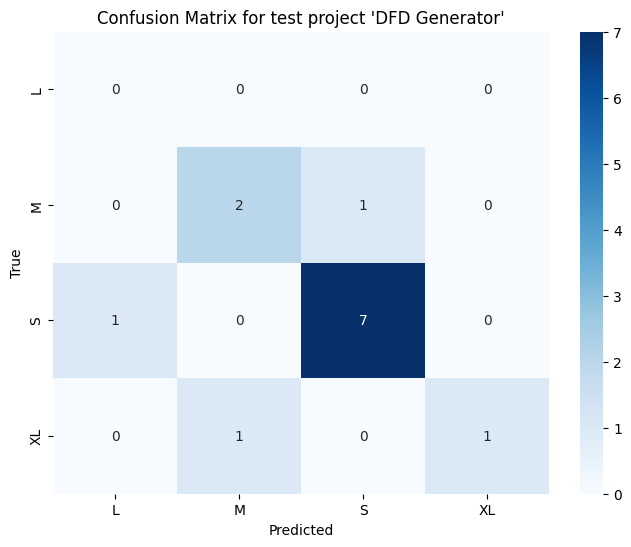

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       0.80      1.00      0.89         8
          XL       0.00      0.00      0.00         2

   micro avg       0.82      0.69      0.75        13
   macro avg       0.45      0.33      0.35        13
weighted avg       0.72      0.69      0.66        13
 samples avg       0.69      0.69      0.69        13

Precision: 0.7230769230769231     Recall: 0.6923076923076923      Accuracy: 0.6923076923076923      F1 Score: 0.6623931623931624

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

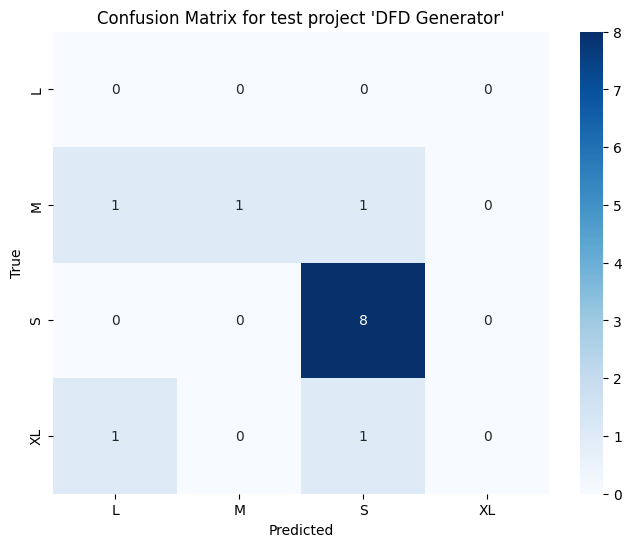

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.73        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9515151515151515

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

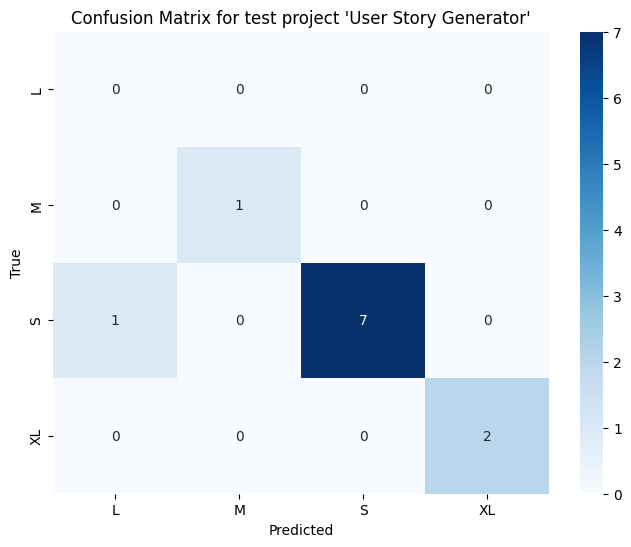

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       0.88      0.88      0.88         8
          XL       1.00      1.00      1.00         2

   micro avg       0.83      0.91      0.87        11
   macro avg       0.59      0.72      0.64        11
weighted avg       0.86      0.91      0.88        11
 samples avg       0.82      0.91      0.85        11

Precision: 0.8636363636363636     Recall: 0.9090909090909091      Accuracy: 0.7272727272727273      F1 Score: 0.8787878787878789

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

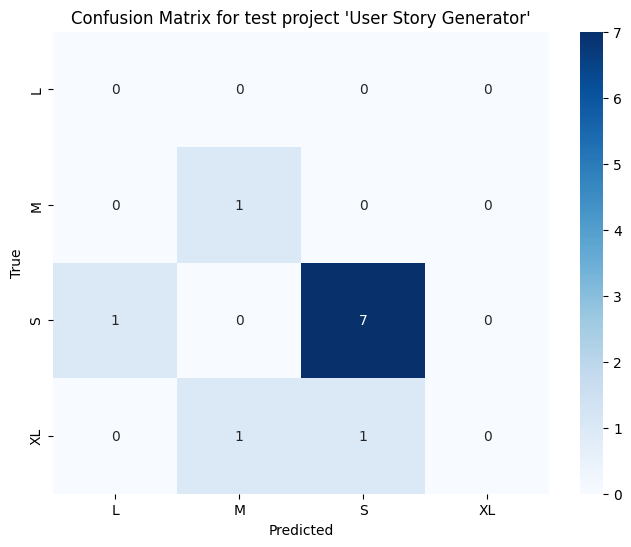

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.75      0.75      0.75         8
          XL       0.00      0.00      0.00         2

   micro avg       0.64      0.64      0.64        11
   macro avg       0.27      0.44      0.31        11
weighted avg       0.58      0.64      0.59        11
 samples avg       0.59      0.64      0.61        11

Precision: 0.5757575757575757     Recall: 0.6363636363636364      Accuracy: 0.5454545454545454      F1 Score: 0.5909090909090909

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

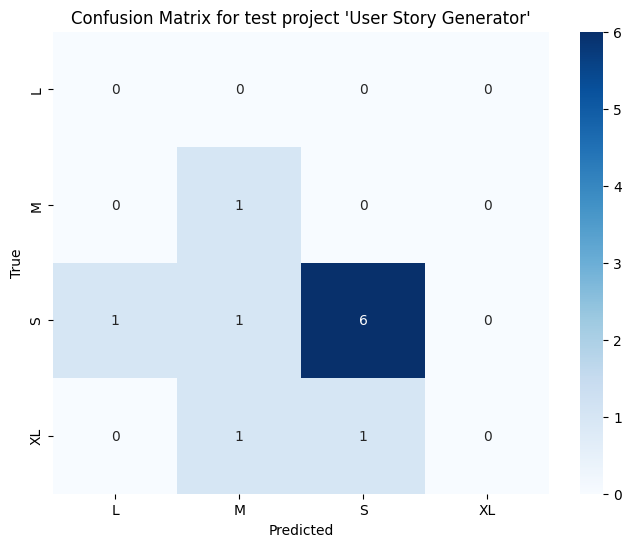

In [50]:
# Model (Numerik) <== All Features
accuracy_list_Adaboost_nt13 = []
accuracy_list_DecisionTree_nt13 = []
accuracy_list_MultinomialNB_nt13 = []
precision_list_Adaboost_nt13 = []
precision_list_DecisionTree_nt13 = []
precision_list_MultinomialNB_nt13 = []
recall_list_Adaboost_nt13 = []
recall_list_DecisionTree_nt13 = []
recall_list_MultinomialNB_nt13 = []
f1_score_list_Adaboost_nt13 = []
f1_score_list_DecisionTree_nt13 = []
f1_score_list_MultinomialNB_nt13 = []
mean_accuracy_nt13 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_scenario_num1.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_scenario_num1.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt13.append(accuracy)
    precision_list_Adaboost_nt13.append(precision)
    recall_list_Adaboost_nt13.append(recall)
    f1_score_list_Adaboost_nt13.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt13.append(accuracy)
    precision_list_DecisionTree_nt13.append(precision)
    recall_list_DecisionTree_nt13.append(recall)
    f1_score_list_DecisionTree_nt13.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt13.append(accuracy)
    precision_list_MultinomialNB_nt13.append(precision)
    recall_list_MultinomialNB_nt13.append(recall)
    f1_score_list_MultinomialNB_nt13.append(f1)

In [51]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt13': precision_list_Adaboost_nt13,
    'Recall_Adaboost_nt13': recall_list_Adaboost_nt13,
    'Accuracy_Adaboost_nt13': accuracy_list_Adaboost_nt13,
    'F1_Score_Adaboost_nt13': f1_score_list_Adaboost_nt13,
    'Precision_DecisionTree_nt13': precision_list_DecisionTree_nt13,
    'Recall_DecisionTree_nt13': recall_list_DecisionTree_nt13,
    'Accuracy_DecisionTree_nt13': accuracy_list_DecisionTree_nt13,
    'F1_Score_DecisionTree_nt13': f1_score_list_DecisionTree_nt13,
    'Precision_MultinomialNB_nt13': precision_list_MultinomialNB_nt13,
    'Recall_MultinomialNB_nt13': recall_list_MultinomialNB_nt13,
    'Accuracy_MultinomialNB_nt13': accuracy_list_MultinomialNB_nt13,
    'F1_Score_MultinomialNB_nt13': f1_score_list_MultinomialNB_nt13,
}

# Buat DataFrame
df_result_nt13 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt13


,Project,Precision_Adaboost_nt13,Recall_Adaboost_nt13,Accuracy_Adaboost_nt13,F1_Score_Adaboost_nt13,Precision_DecisionTree_nt13,Recall_DecisionTree_nt13,Accuracy_DecisionTree_nt13,F1_Score_DecisionTree_nt13,Precision_MultinomialNB_nt13,Recall_MultinomialNB_nt13,Accuracy_MultinomialNB_nt13,F1_Score_MultinomialNB_nt13
0,Akobesi,0.562775,0.629921,0.629921,0.557125,0.477260,0.622047,0.622047,0.540119,0.789494,0.566929,0.566929,0.564014
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.703704,0.777778,0.666667,0.722222
2,Novelty Checker,0.954545,0.727273,0.727273,0.806061,0.954545,0.909091,0.909091,0.921569,0.757576,0.818182,0.727273,0.772727
3,Journal Database Reviewer,0.760417,0.750000,0.750000,0.743659,0.640625,0.687500,0.625000,0.663043,0.458333,0.500000,0.500000,0.478261
4,Git Trackr,0.416667,0.500000,0.333333,0.452381,0.541667,0.666667,0.500000,0.595238,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,0.750000,0.750000,0.850000,0.750000,0.750000,0.500000,0.750000,0.750000,0.500000,0.500000,0.600000
6,Sales Monitoring on Multimarket,0.803922,0.722222,0.722222,0.646962,0.625000,0.666667,0.666667,0.607143,0.598039,0.666667,0.611111,0.589080
7,Ucase,1.000000,0.875000,0.875000,0.916667,0.875000,0.750000,0.625000,0.791667,0.696429,0.875000,0.750000,0.770833
8,DFD Generator,1.000000,0.846154,0.846154,0.912821,0.846154,0.846154,0.769231,0.846154,0.723077,0.692308,0.692308,0.662393
9,User Story Generator,1.000000,0.909091,0.909091,0.951515,0.863636,0.909091,0.727273,0.878788,0.575758,0.636364,0.545455,0.590909


In [52]:
# Mean Accuracy
mean_accuracy_nt13.append(np.mean(accuracy_list_Adaboost_nt13))
mean_accuracy_nt13.append(np.mean(accuracy_list_DecisionTree_nt13))
mean_accuracy_nt13.append(np.mean(accuracy_list_MultinomialNB_nt13))
print("Mean Accuracy")
print(mean_accuracy_nt13)

Mean Accuracy
[0.7542994297915557, 0.694430831635556, 0.605974187667101]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.33      0.06      0.11        31
           S       0.70      0.91      0.79        89
          XL       0.00      0.00      0.00         1

   micro avg       0.69      0.65      0.67       127
   macro avg       0.26      0.24      0.23       127
weighted avg       0.57      0.65      0.58       127
 samples avg       0.65      0.65      0.65       127

Precision: 0.5749629122446651     Recall: 0.6535433070866141      Accuracy: 0.6377952755905512      F1 Score: 0.5828962357447769

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

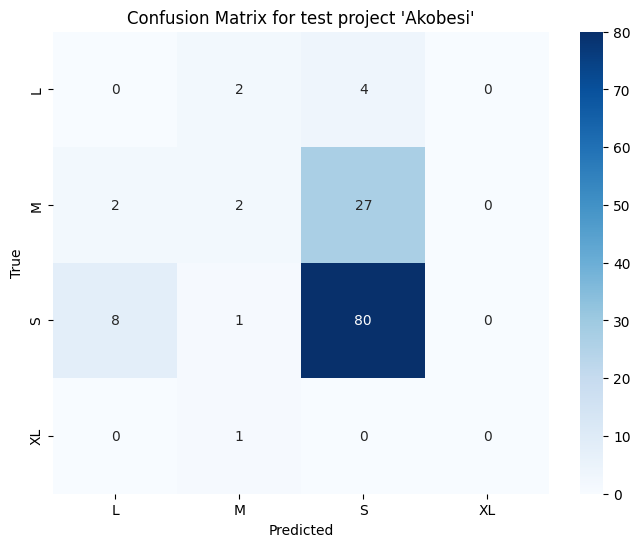

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.20      0.03      0.06        31
           S       0.77      0.81      0.79        89
          XL       0.00      0.00      0.00         1

   micro avg       0.74      0.57      0.65       127
   macro avg       0.24      0.21      0.21       127
weighted avg       0.59      0.57      0.57       127
 samples avg       0.57      0.57      0.57       127

Precision: 0.585592226503602     Recall: 0.5748031496062992      Accuracy: 0.5748031496062992      F1 Score: 0.5650000717123475

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

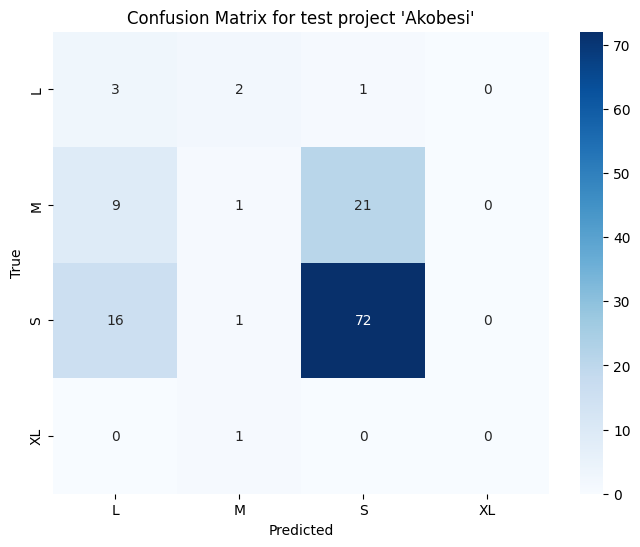

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.49      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127

Precision: 0.49110298220596443     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5775007290755322

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


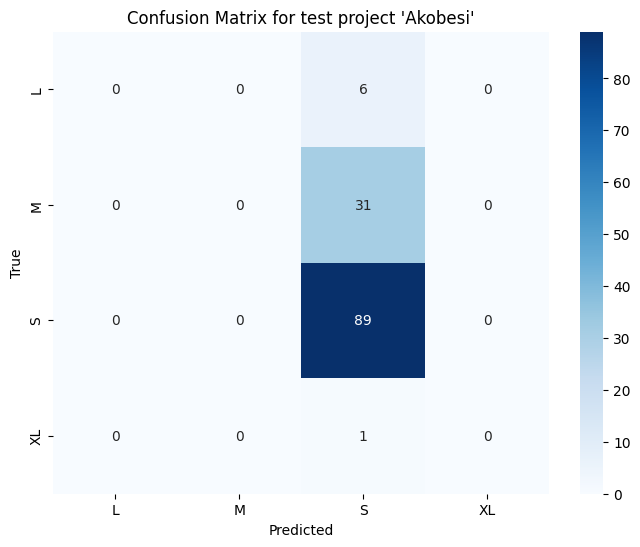

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

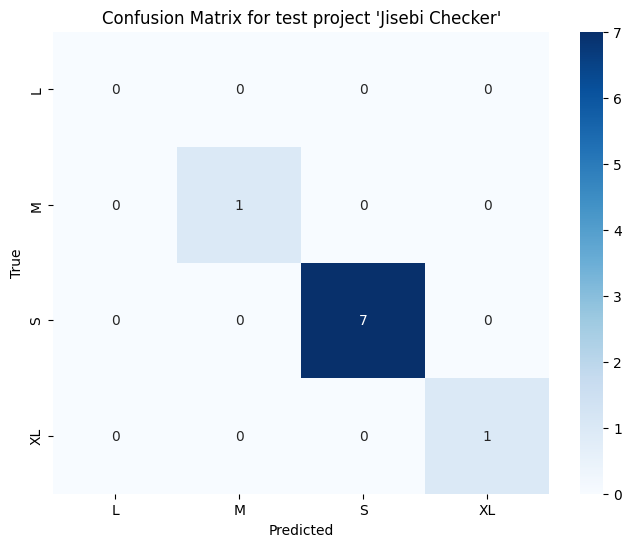

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

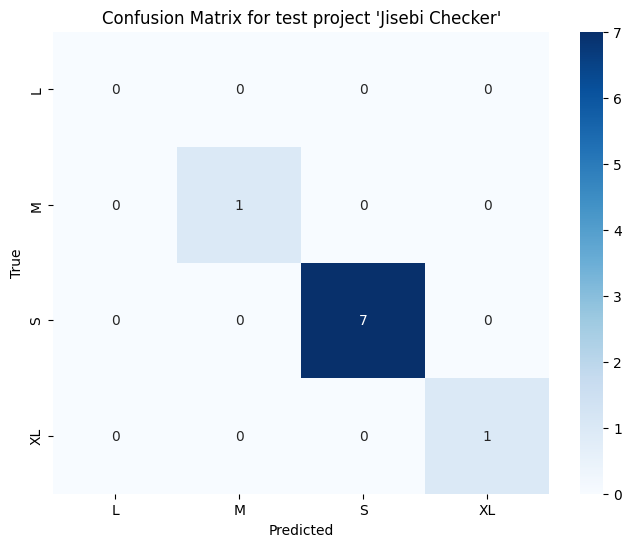

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.86      0.67      0.75         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

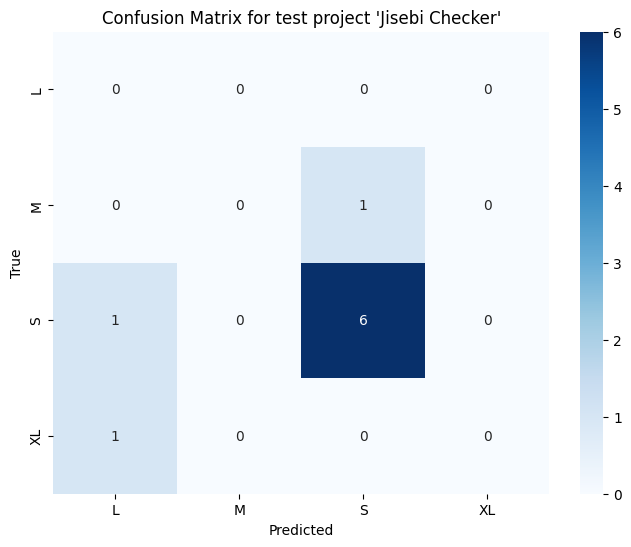

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.74        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9518716577540107

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

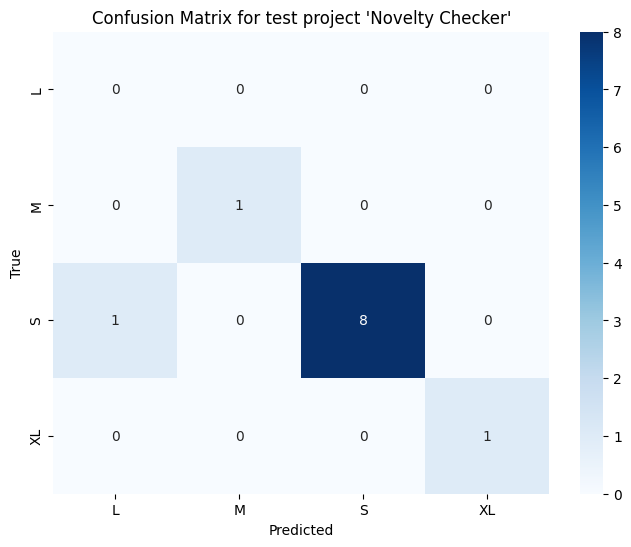

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


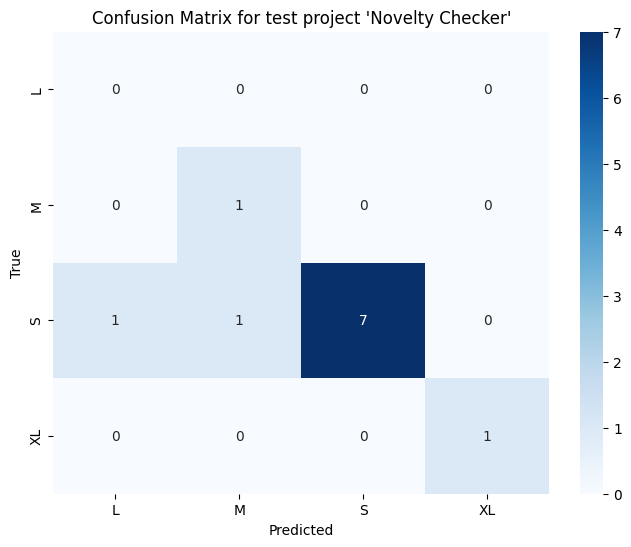

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.89      0.89      0.89         9
          XL       0.00      0.00      0.00         1

   micro avg       0.89      0.73      0.80        11
   macro avg       0.22      0.22      0.22        11
weighted avg       0.73      0.73      0.73        11
 samples avg       0.73      0.73      0.73        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.7272727272727273     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.7272727272727273

Confusion matrix for test project 'Novelty Checker':


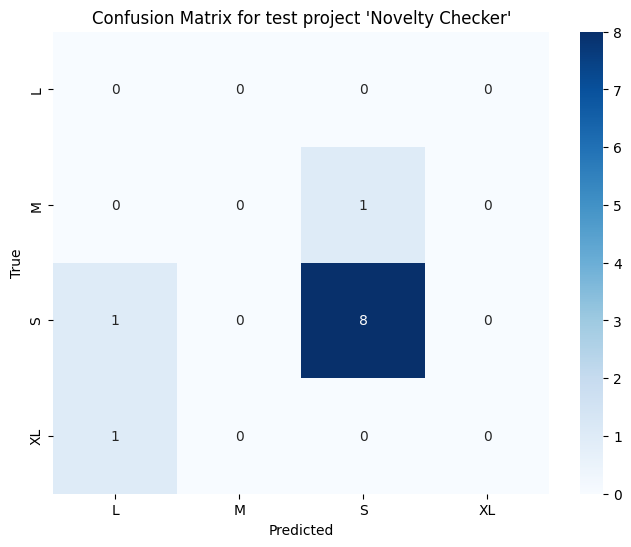

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.82      0.82      0.82        11
          XL       1.00      1.00      1.00         1

   micro avg       0.75      0.75      0.75        16
   macro avg       0.58      0.70      0.62        16
weighted avg       0.69      0.75      0.71        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.6875     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7083333333333334

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


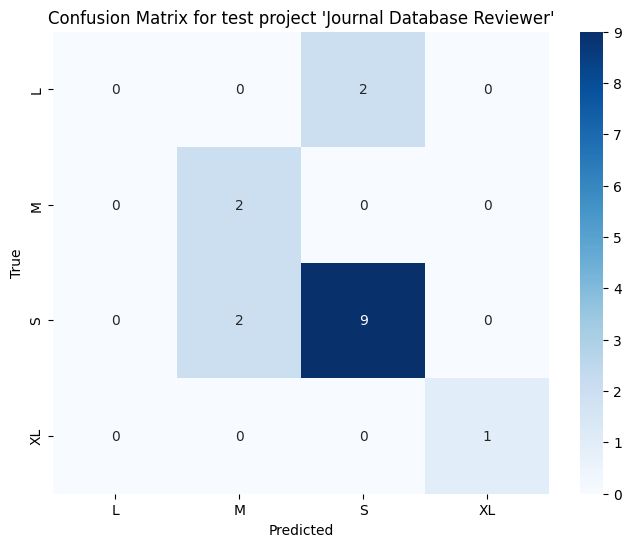

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.29      1.00      0.44         2
           S       0.80      0.73      0.76        11
          XL       1.00      1.00      1.00         1

   micro avg       0.61      0.69      0.65        16
   macro avg       0.52      0.68      0.55        16
weighted avg       0.65      0.69      0.64        16
 samples avg       0.62      0.69      0.65        16

Precision: 0.6482142857142857     Recall: 0.6875      Accuracy: 0.5625      F1 Score: 0.6418650793650794

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


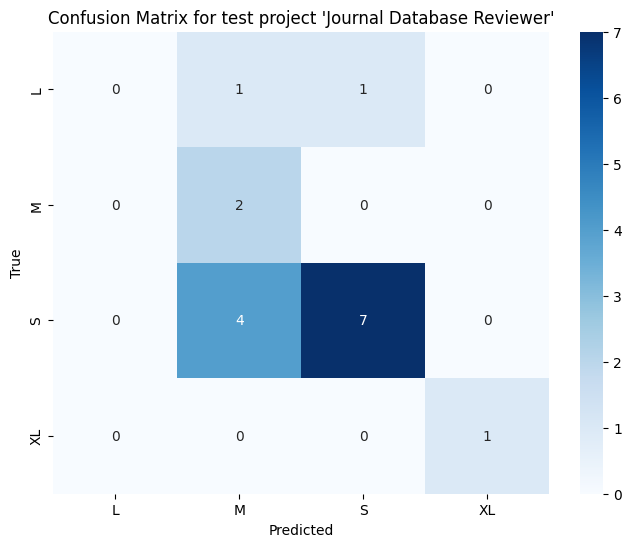

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.62      0.73      0.67        11
          XL       0.00      0.00      0.00         1

   micro avg       0.62      0.50      0.55        16
   macro avg       0.15      0.18      0.17        16
weighted avg       0.42      0.50      0.46        16
 samples avg       0.50      0.50      0.50        16

Precision: 0.42307692307692313     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.45833333333333337

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

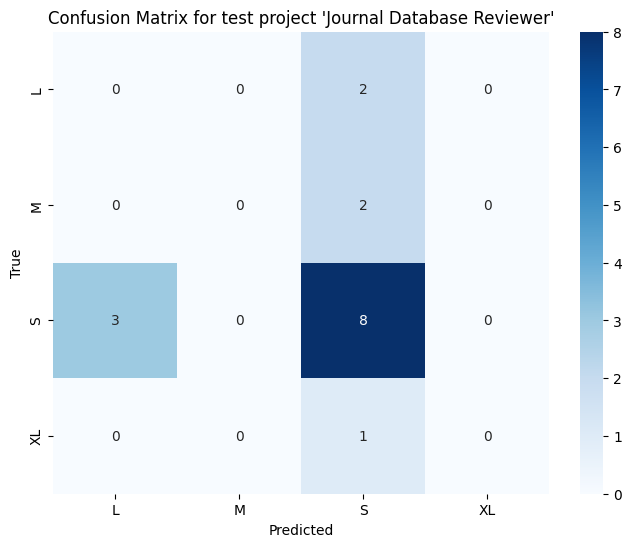

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.50      0.50         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.62      0.83      0.71         6
   macro avg       0.53      0.62      0.56         6
weighted avg       0.63      0.83      0.71         6
 samples avg       0.67      0.83      0.72         6

Precision: 0.6333333333333333     Recall: 0.8333333333333334      Accuracy: 0.5      F1 Score: 0.7083333333333334

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

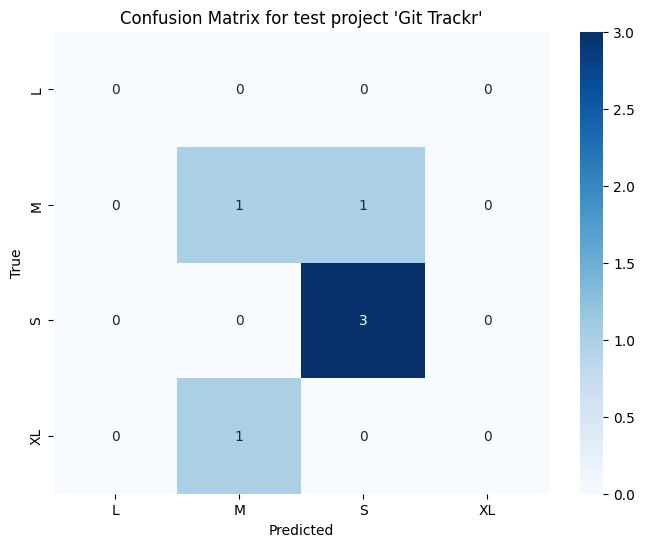

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.44      0.50      0.46         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.58      0.67      0.61         6



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


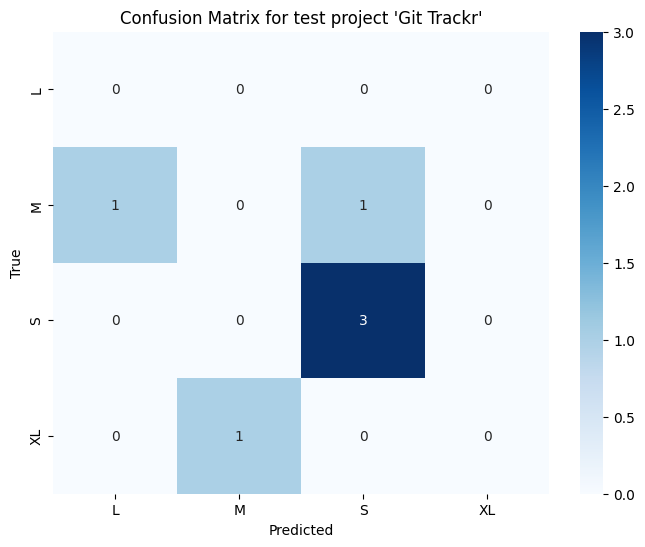

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       0.00      0.00      0.00         1

   micro avg       0.60      0.50      0.55         6
   macro avg       0.19      0.25      0.21         6
weighted avg       0.38      0.50      0.43         6
 samples avg       0.50      0.50      0.50         6



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.375     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.42857142857142855

Confusion matrix for test project 'Git Trackr':


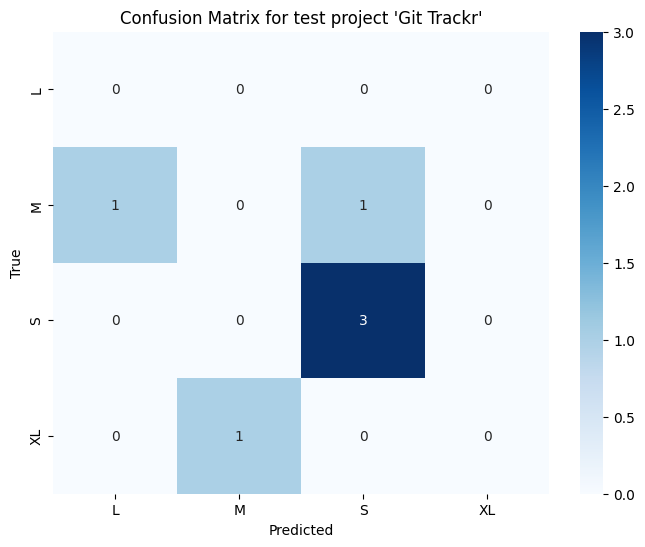

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.33      0.50         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.50      0.57         4
   macro avg       0.50      0.33      0.38         4
weighted avg       1.00      0.50      0.62         4
 samples avg       0.50      0.50      0.50         4

Precision: 1.0     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.625

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

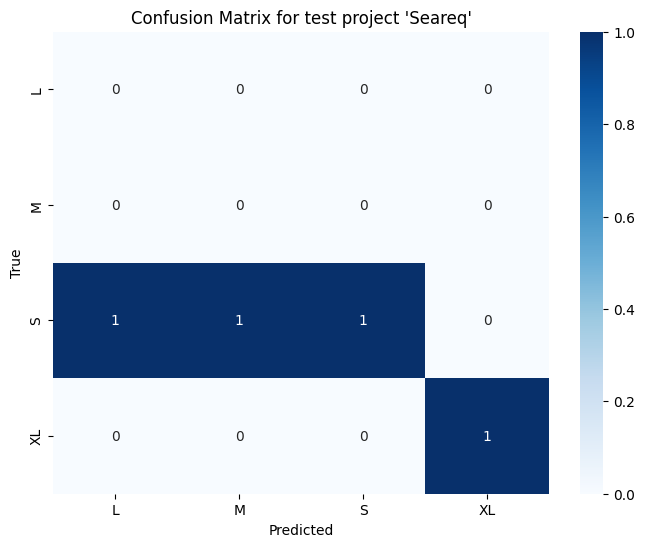

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       0.67      0.67      0.67         3
          XL       1.00      1.00      1.00         1

   micro avg       0.50      0.75      0.60         4
   macro avg       0.42      0.42      0.42         4
weighted avg       0.75      0.75      0.75         4
 samples avg       0.46      0.75      0.54         4



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.75     Recall: 0.75      Accuracy: 0.25      F1 Score: 0.75

Confusion matrix for test project 'Seareq':


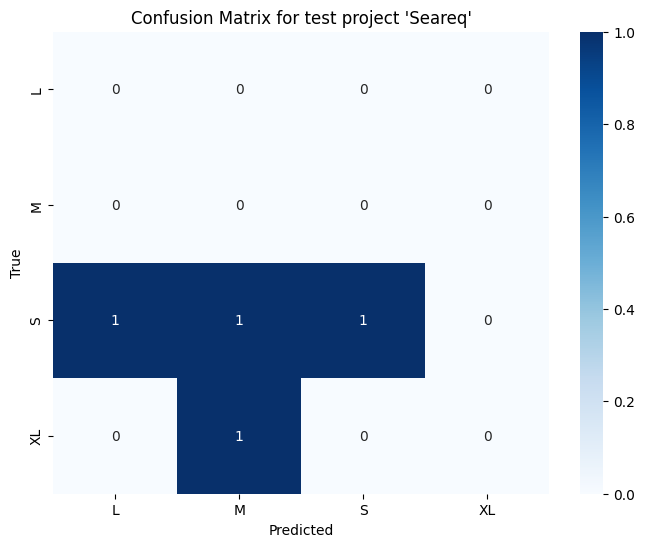

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.00      0.00      0.00         1

   micro avg       1.00      0.50      0.67         4
   macro avg       0.25      0.17      0.20         4
weighted avg       0.75      0.50      0.60         4
 samples avg       0.50      0.50      0.50         4



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.75     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.6000000000000001

Confusion matrix for test project 'Seareq':


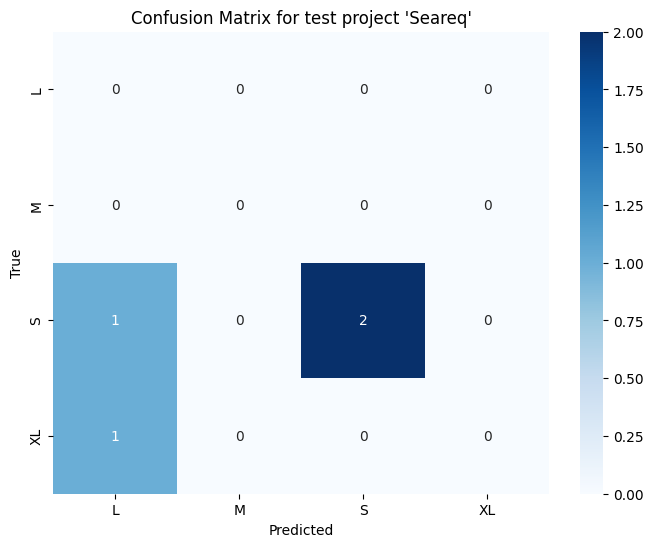

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.77      0.83      0.80        12
          XL       0.00      0.00      0.00         0

   micro avg       0.79      0.61      0.69        18
   macro avg       0.44      0.25      0.27        18
weighted avg       0.85      0.61      0.63        18
 samples avg       0.61      0.61      0.61        18

Precision: 0.8461538461538463     Recall: 0.6111111111111112      Accuracy: 0.6111111111111112      F1 Score: 0.6285714285714286

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

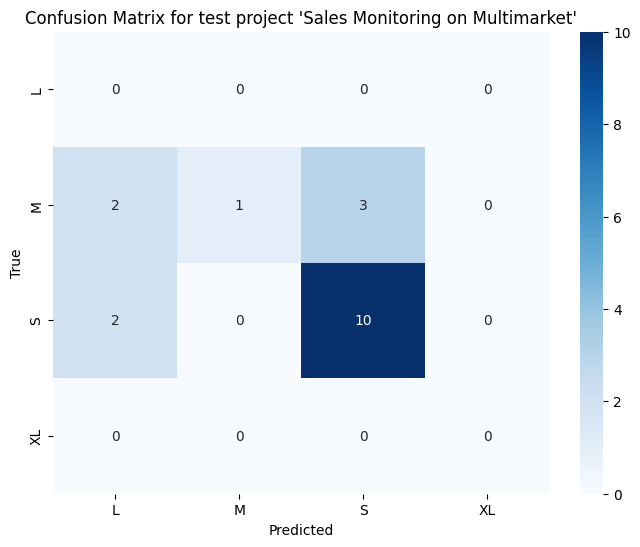

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.17      0.22         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.65      0.72      0.68        18
   macro avg       0.26      0.29      0.26        18
weighted avg       0.58      0.72      0.63        18
 samples avg       0.67      0.72      0.69        18



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.5816993464052288     Recall: 0.7222222222222222      Accuracy: 0.6111111111111112      F1 Score: 0.6257982120051087

Confusion matrix for test project 'Sales Monitoring on Multimarket':


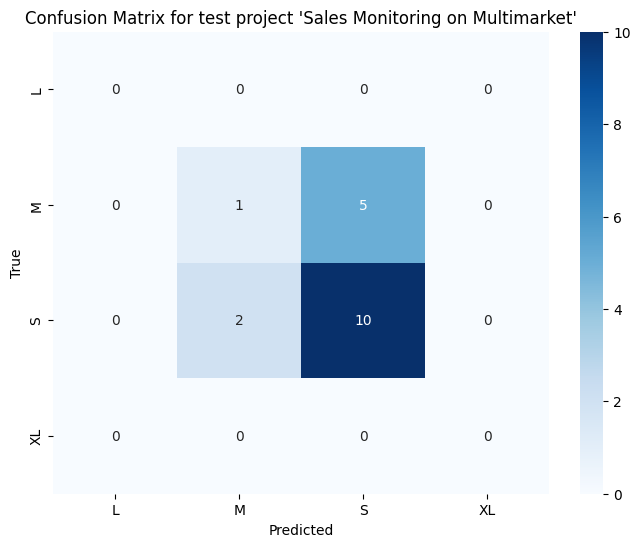

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         6
           S       0.65      0.92      0.76        12
          XL       0.00      0.00      0.00         0

   micro avg       0.65      0.61      0.63        18
   macro avg       0.16      0.23      0.19        18
weighted avg       0.43      0.61      0.51        18
 samples avg       0.61      0.61      0.61        18



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.43137254901960786     Recall: 0.6111111111111112      Accuracy: 0.6111111111111112      F1 Score: 0.5057471264367815

Confusion matrix for test project 'Sales Monitoring on Multimarket':


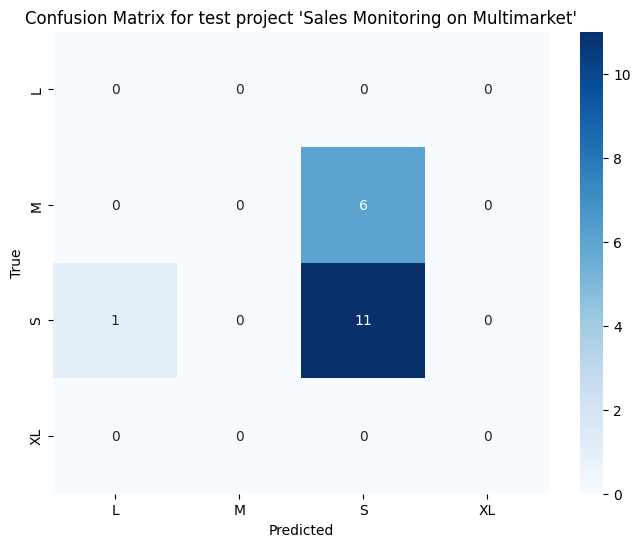

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         8
   macro avg       0.75      0.75      0.75         8
weighted avg       1.00      1.00      1.00         8
 samples avg       1.00      1.00      1.00         8

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

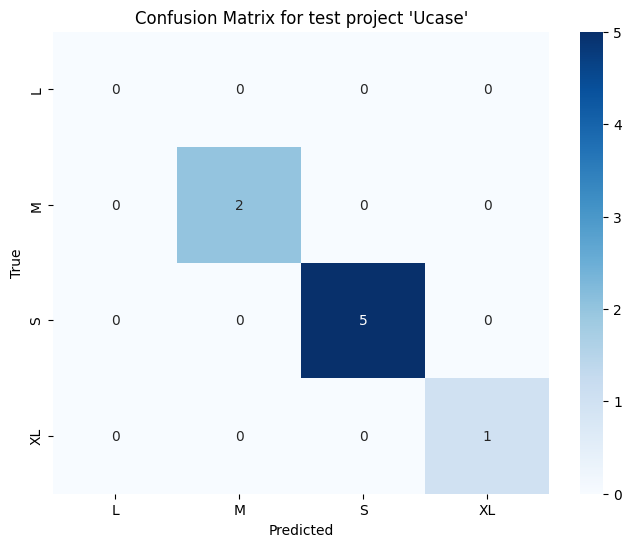

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         2
           S       0.83      1.00      0.91         5
          XL       1.00      1.00      1.00         1

   micro avg       0.89      1.00      0.94         8
   macro avg       0.71      0.75      0.73         8
weighted avg       0.90      1.00      0.94         8
 samples avg       0.94      1.00      0.96         8



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.8958333333333334     Recall: 1.0      Accuracy: 0.875      F1 Score: 0.9431818181818181

Confusion matrix for test project 'Ucase':


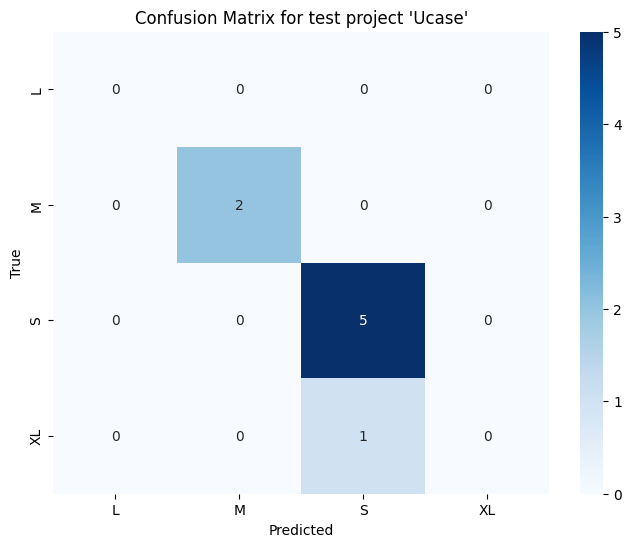

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.71      1.00      0.83         5
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.62      0.67         8
   macro avg       0.18      0.25      0.21         8
weighted avg       0.45      0.62      0.52         8
 samples avg       0.62      0.62      0.62         8

Precision: 0.44642857142857145     Recall: 0.625      Accuracy: 0.625      F1 Score: 0.5208333333333333

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

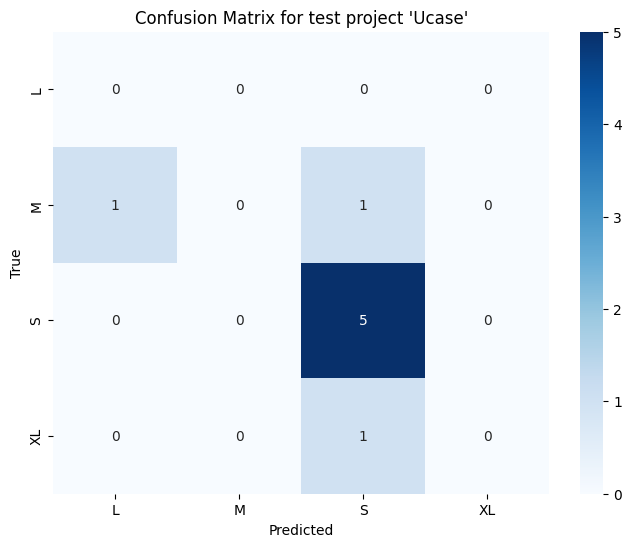

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.88      0.88      0.88         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.85      0.88        13
   macro avg       0.72      0.64      0.67        13
weighted avg       0.92      0.85      0.88        13
 samples avg       0.85      0.85      0.85        13

Precision: 0.9230769230769231     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.8769230769230769

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

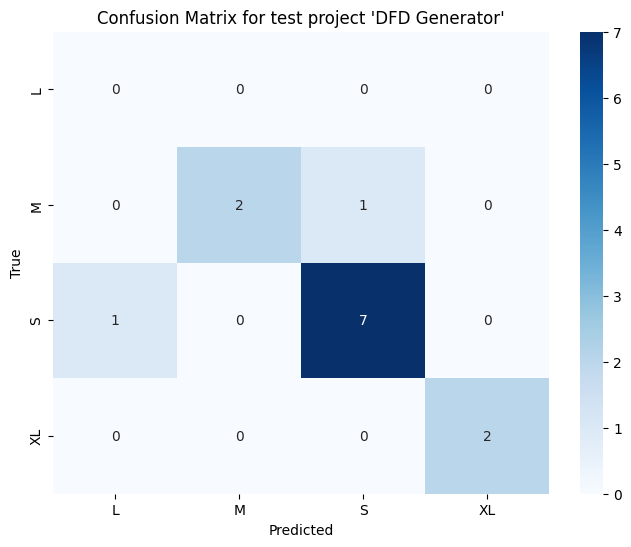

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.77      0.87        13
   macro avg       0.75      0.55      0.61        13
weighted avg       1.00      0.77      0.84        13
 samples avg       0.77      0.77      0.77        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 1.0     Recall: 0.7692307692307693      Accuracy: 0.7692307692307693      F1 Score: 0.8435897435897436

Confusion matrix for test project 'DFD Generator':


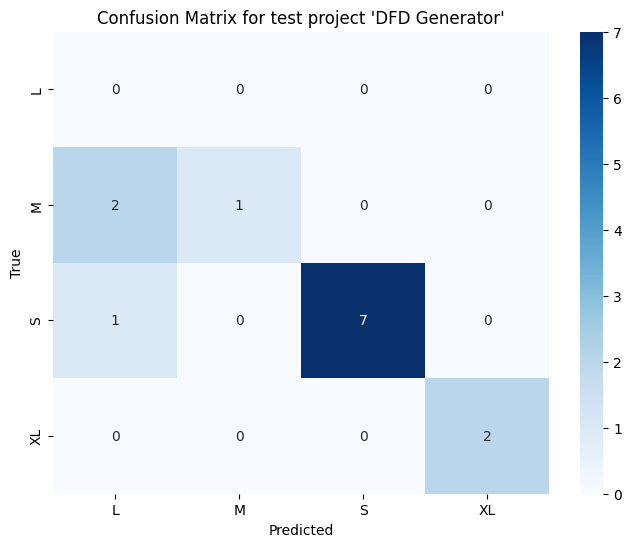

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.73      1.00      0.84         8
          XL       0.00      0.00      0.00         2

   micro avg       0.73      0.62      0.67        13
   macro avg       0.18      0.25      0.21        13
weighted avg       0.45      0.62      0.52        13
 samples avg       0.62      0.62      0.62        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.44755244755244755     Recall: 0.6153846153846154      Accuracy: 0.6153846153846154      F1 Score: 0.5182186234817814

Confusion matrix for test project 'DFD Generator':


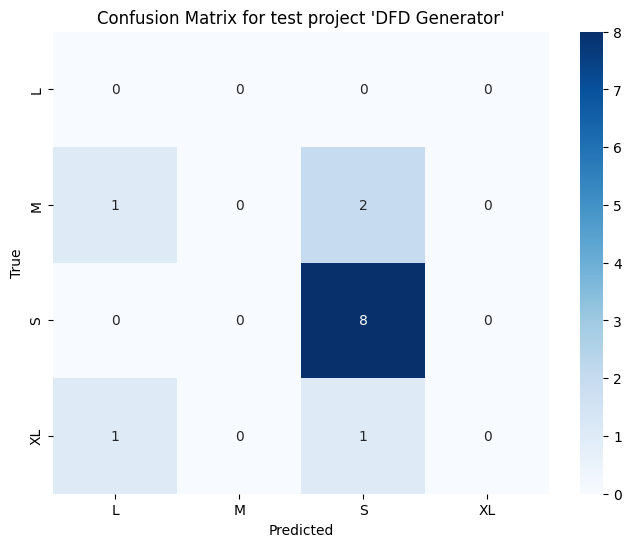

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.80      1.00      0.89         8
          XL       1.00      1.00      1.00         2

   micro avg       0.85      1.00      0.92        11
   macro avg       0.70      0.75      0.72        11
weighted avg       0.85      1.00      0.92        11
 samples avg       0.91      1.00      0.94        11

Precision: 0.8545454545454546     Recall: 1.0      Accuracy: 0.8181818181818182      F1 Score: 0.9191919191919191

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

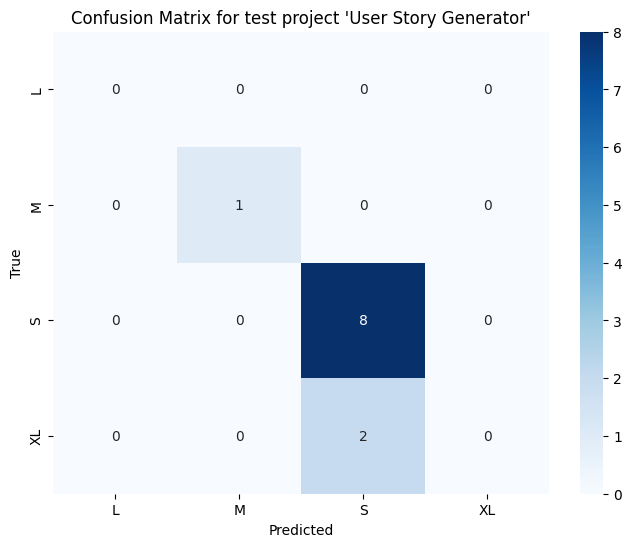

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.20      1.00      0.33         1
           S       0.80      1.00      0.89         8
          XL       1.00      1.00      1.00         2

   micro avg       0.65      1.00      0.79        11
   macro avg       0.50      0.75      0.56        11
weighted avg       0.78      1.00      0.86        11
 samples avg       0.79      1.00      0.85        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.781818181818182     Recall: 1.0      Accuracy: 0.6363636363636364      F1 Score: 0.8585858585858586

Confusion matrix for test project 'User Story Generator':


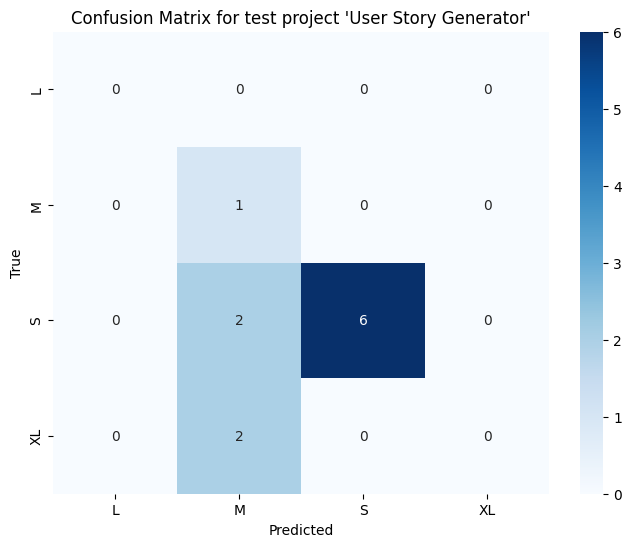

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.78      0.88      0.82         8
          XL       0.00      0.00      0.00         2

   micro avg       0.78      0.64      0.70        11
   macro avg       0.19      0.22      0.21        11
weighted avg       0.57      0.64      0.60        11
 samples avg       0.64      0.64      0.64        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.5656565656565656     Recall: 0.6363636363636364      Accuracy: 0.6363636363636364      F1 Score: 0.5989304812834225

Confusion matrix for test project 'User Story Generator':


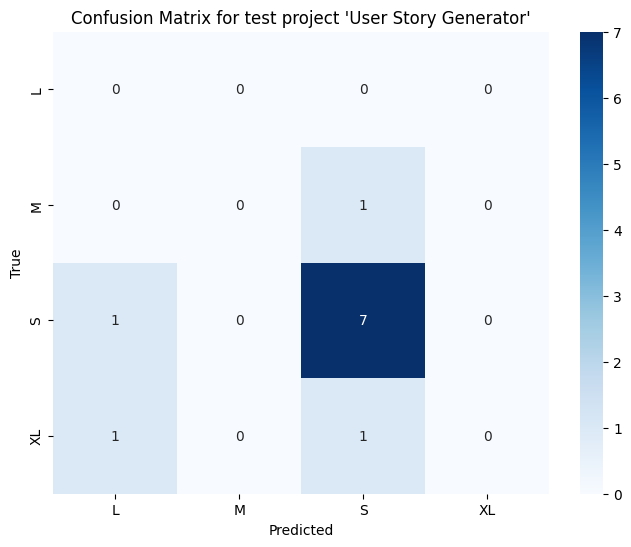

In [53]:
# Model (Numerik 2)
accuracy_list_Adaboost_nt21 = []
accuracy_list_DecisionTree_nt21 = []
accuracy_list_MultinomialNB_nt21 = []
precision_list_Adaboost_nt21 = []
precision_list_DecisionTree_nt21 = []
precision_list_MultinomialNB_nt21 = []
recall_list_Adaboost_nt21 = []
recall_list_DecisionTree_nt21 = []
recall_list_MultinomialNB_nt21 = []
f1_score_list_Adaboost_nt21 = []
f1_score_list_DecisionTree_nt21 = []
f1_score_list_MultinomialNB_nt21 = []
mean_accuracy_nt21 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_num2.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_num2.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt21.append(accuracy)
    precision_list_Adaboost_nt21.append(precision)
    recall_list_Adaboost_nt21.append(recall)
    f1_score_list_Adaboost_nt21.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt21.append(accuracy)
    precision_list_DecisionTree_nt21.append(precision)
    recall_list_DecisionTree_nt21.append(recall)
    f1_score_list_DecisionTree_nt21.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt21.append(accuracy)
    precision_list_MultinomialNB_nt21.append(precision)
    recall_list_MultinomialNB_nt21.append(recall)
    f1_score_list_MultinomialNB_nt21.append(f1)

In [54]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt21': precision_list_Adaboost_nt21,
    'Recall_Adaboost_nt21': recall_list_Adaboost_nt21,
    'Accuracy_Adaboost_nt21': accuracy_list_Adaboost_nt21,
    'F1_Score_Adaboost_nt21': f1_score_list_Adaboost_nt21,
    'Precision_DecisionTree_nt21': precision_list_DecisionTree_nt21,
    'Recall_DecisionTree_nt21': recall_list_DecisionTree_nt21,
    'Accuracy_DecisionTree_nt21': accuracy_list_DecisionTree_nt21,
    'F1_Score_DecisionTree_nt21': f1_score_list_DecisionTree_nt21,
    'Precision_MultinomialNB_nt21': precision_list_MultinomialNB_nt21,
    'Recall_MultinomialNB_nt21': recall_list_MultinomialNB_nt21,
    'Accuracy_MultinomialNB_nt21': accuracy_list_MultinomialNB_nt21,
    'F1_Score_MultinomialNB_nt21': f1_score_list_MultinomialNB_nt21,
}

# Buat DataFrame
df_result_nt21 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt21


,Project,Precision_Adaboost_nt21,Recall_Adaboost_nt21,Accuracy_Adaboost_nt21,F1_Score_Adaboost_nt21,Precision_DecisionTree_nt21,Recall_DecisionTree_nt21,Accuracy_DecisionTree_nt21,F1_Score_DecisionTree_nt21,Precision_MultinomialNB_nt21,Recall_MultinomialNB_nt21,Accuracy_MultinomialNB_nt21,F1_Score_MultinomialNB_nt21
0,Akobesi,0.574963,0.653543,0.637795,0.582896,0.585592,0.574803,0.574803,0.565000,0.491103,0.700787,0.700787,0.577501
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,1.000000,0.909091,0.909091,0.951872,0.954545,0.818182,0.818182,0.867424,0.727273,0.727273,0.727273,0.727273
3,Journal Database Reviewer,0.687500,0.750000,0.750000,0.708333,0.648214,0.687500,0.562500,0.641865,0.423077,0.500000,0.500000,0.458333
4,Git Trackr,0.633333,0.833333,0.500000,0.708333,0.541667,0.666667,0.500000,0.595238,0.375000,0.500000,0.500000,0.428571
5,Seareq,1.000000,0.500000,0.500000,0.625000,0.750000,0.750000,0.250000,0.750000,0.750000,0.500000,0.500000,0.600000
6,Sales Monitoring on Multimarket,0.846154,0.611111,0.611111,0.628571,0.581699,0.722222,0.611111,0.625798,0.431373,0.611111,0.611111,0.505747
7,Ucase,1.000000,1.000000,1.000000,1.000000,0.895833,1.000000,0.875000,0.943182,0.446429,0.625000,0.625000,0.520833
8,DFD Generator,0.923077,0.846154,0.846154,0.876923,1.000000,0.769231,0.769231,0.843590,0.447552,0.615385,0.615385,0.518219
9,User Story Generator,0.854545,1.000000,0.818182,0.919192,0.781818,1.000000,0.636364,0.858586,0.565657,0.636364,0.636364,0.598930


In [55]:
# Mean Accuracy
mean_accuracy_nt21.append(np.mean(accuracy_list_Adaboost_nt21))
mean_accuracy_nt21.append(np.mean(accuracy_list_DecisionTree_nt21))
mean_accuracy_nt21.append(np.mean(accuracy_list_MultinomialNB_nt21))
print("Mean Accuracy")
print(mean_accuracy_nt21)

Mean Accuracy
[0.7572332960128235, 0.6597190484493635, 0.6082586158373561]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.71      1.00      0.83        89
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.70      0.71       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.50      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127

Precision: 0.4989606299212598     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5828979321510044

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

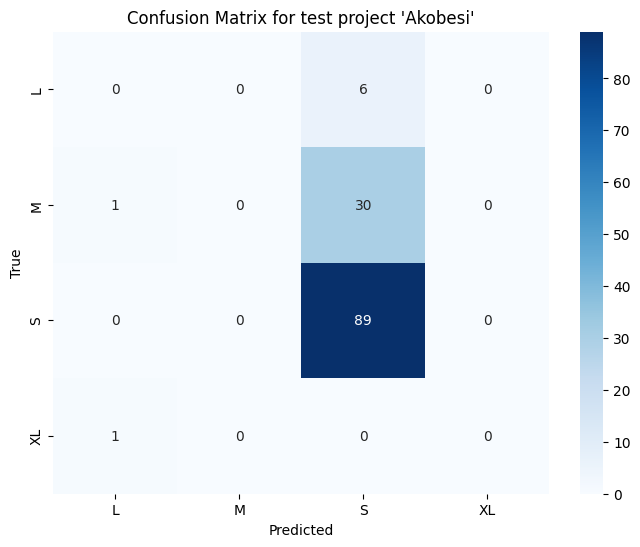

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.49      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127

Precision: 0.49110298220596443     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5775007290755322

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


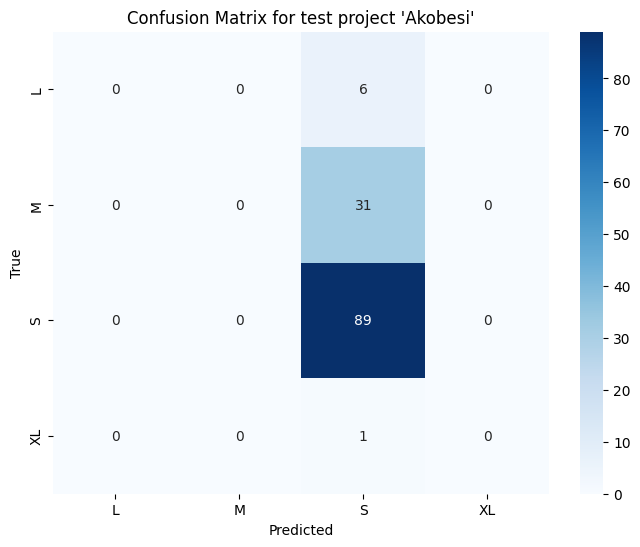

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.79      0.87      0.83        89
          XL       0.04      1.00      0.08         1

   micro avg       0.64      0.62      0.63       127
   macro avg       0.46      0.47      0.24       127
weighted avg       0.80      0.62      0.60       127
 samples avg       0.62      0.62      0.62       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.8007046026463187     Recall: 0.6220472440944882      Accuracy: 0.6141732283464567      F1 Score: 0.5960834261412112

Confusion matrix for test project 'Akobesi':


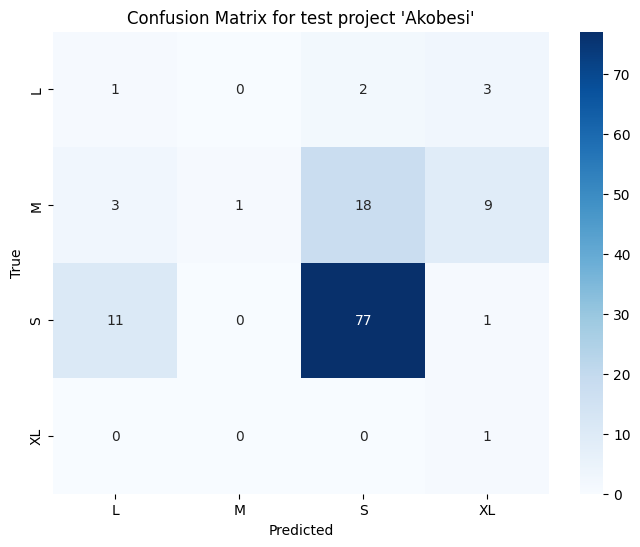

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

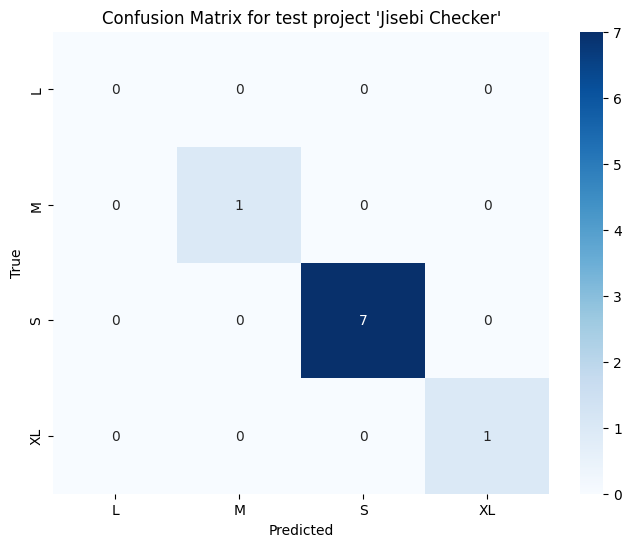

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

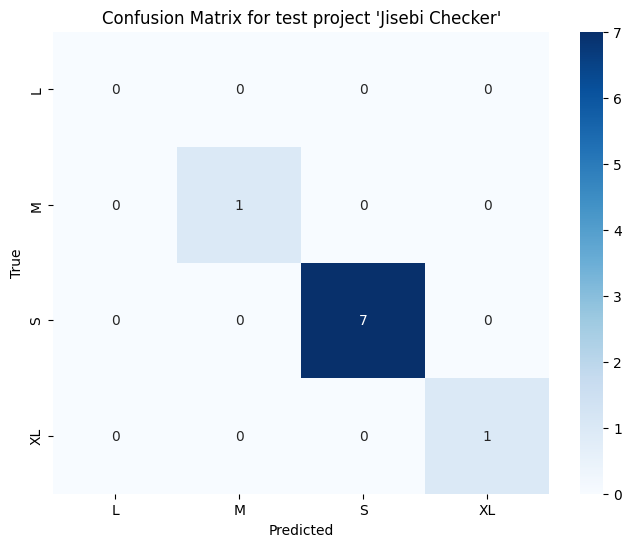

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.78      0.74         9
   macro avg       0.30      0.46      0.34         9
weighted avg       0.70      0.78      0.72         9
 samples avg       0.72      0.78      0.74         9

Precision: 0.7037037037037037     Recall: 0.7777777777777778      Accuracy: 0.6666666666666666      F1 Score: 0.7222222222222222

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

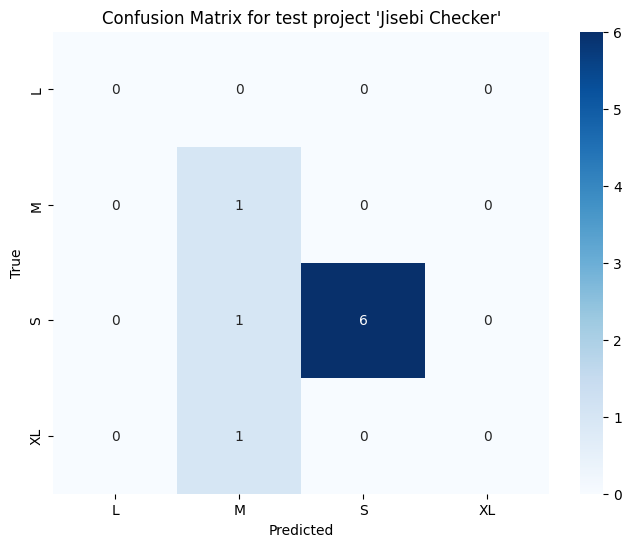

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

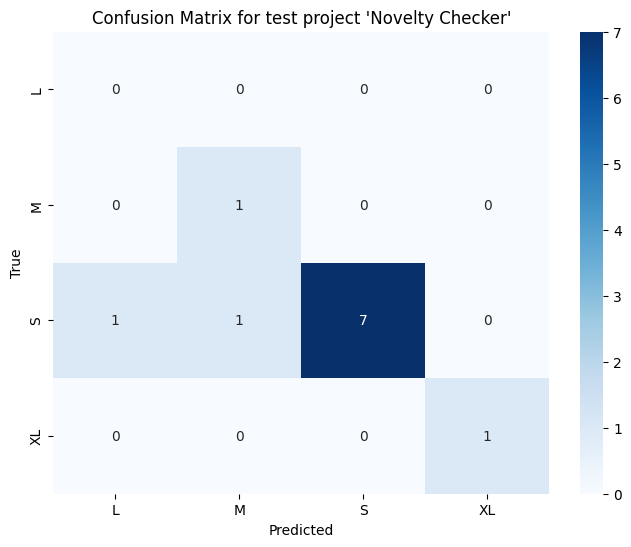

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.83      0.91      0.87        11
   macro avg       0.58      0.72      0.61        11
weighted avg       0.94      0.91      0.91        11
 samples avg       0.86      0.91      0.88        11

Precision: 0.9393939393939394     Recall: 0.9090909090909091      Accuracy: 0.8181818181818182      F1 Score: 0.9064171122994652

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

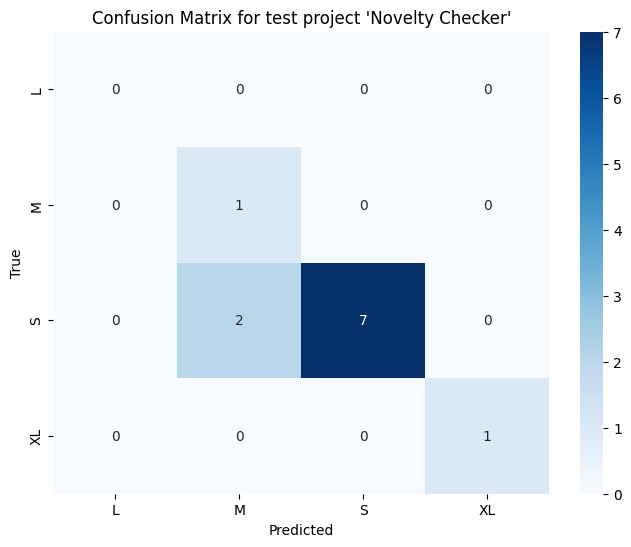

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.89      0.89      0.89         9
          XL       0.00      0.00      0.00         1

   micro avg       0.75      0.82      0.78        11
   macro avg       0.31      0.47      0.35        11
weighted avg       0.76      0.82      0.77        11
 samples avg       0.77      0.82      0.79        11

Precision: 0.7575757575757577     Recall: 0.8181818181818182      Accuracy: 0.7272727272727273      F1 Score: 0.7727272727272727

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

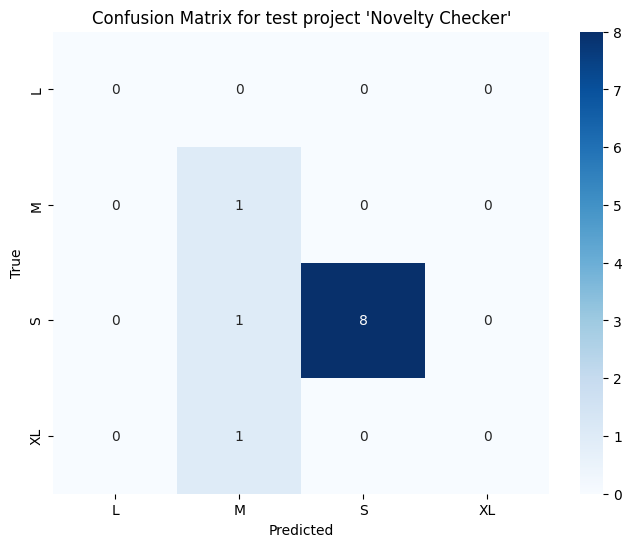

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.67      1.00      0.80         2
           S       0.82      0.82      0.82        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.62      0.70      0.65        16
weighted avg       0.71      0.75      0.72        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.7083333333333334     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.725

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

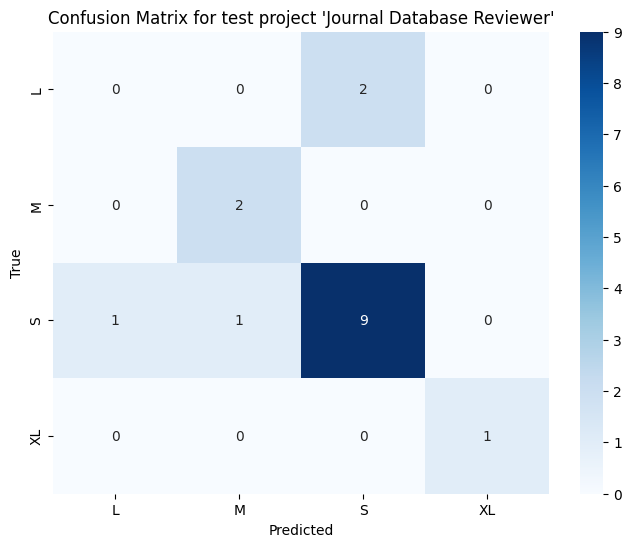

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.79      1.00      0.88        11
          XL       1.00      1.00      1.00         1

   micro avg       0.74      0.88      0.80        16
   macro avg       0.57      0.75      0.64        16
weighted avg       0.67      0.88      0.75        16
 samples avg       0.81      0.88      0.83        16

Precision: 0.6651785714285714     Recall: 0.875      Accuracy: 0.75      F1 Score: 0.7508333333333334

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


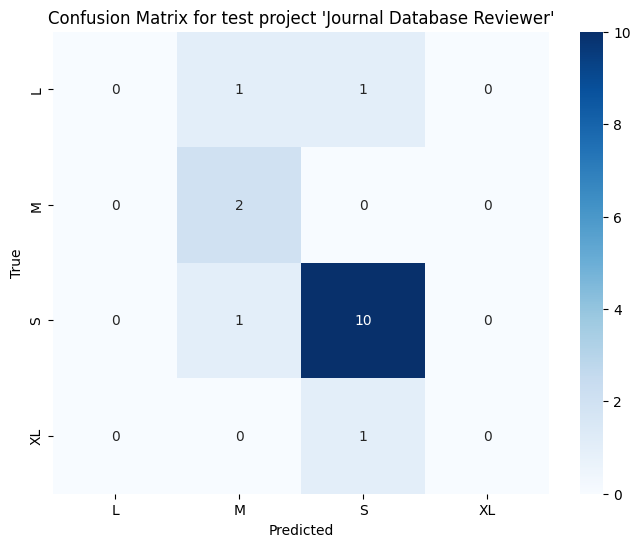

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.62      0.73      0.67        11
          XL       0.00      0.00      0.00         1

   micro avg       0.53      0.50      0.52        16
   macro avg       0.15      0.18      0.17        16
weighted avg       0.42      0.50      0.46        16
 samples avg       0.50      0.50      0.50        16

Precision: 0.42307692307692313     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.45833333333333337

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

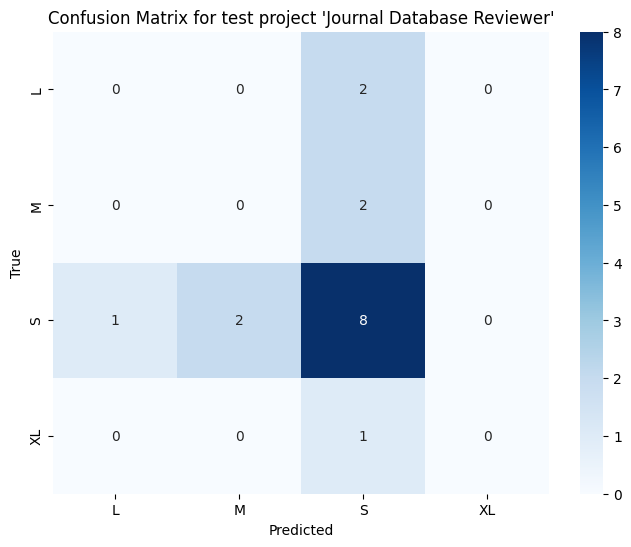

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.44      0.50      0.46         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

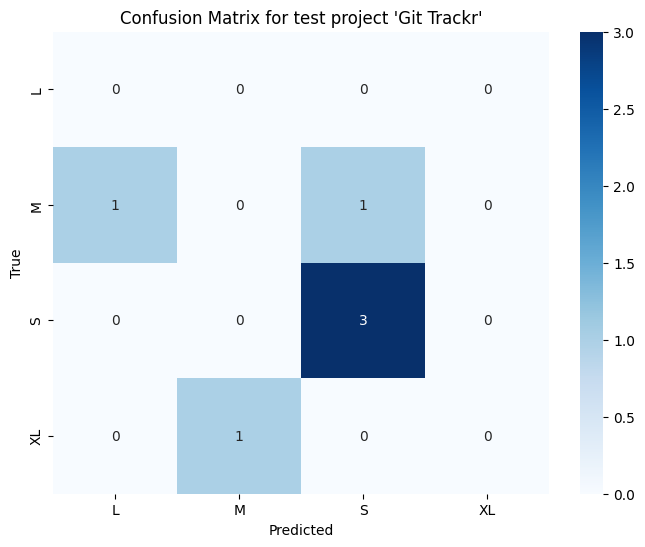

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.44      0.50      0.46         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

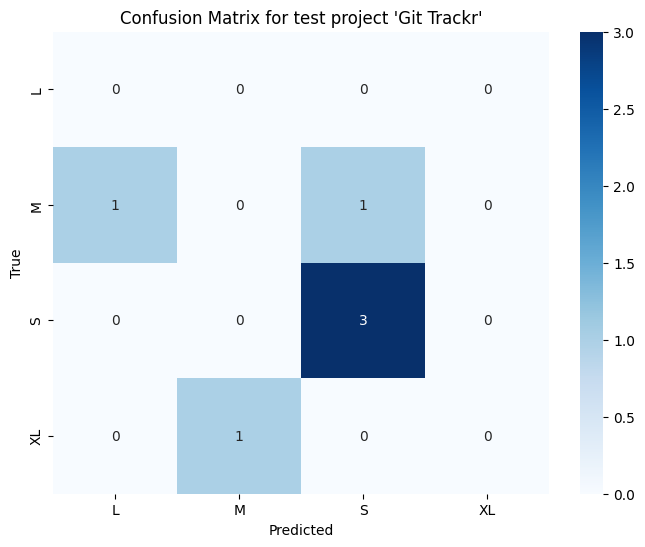

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

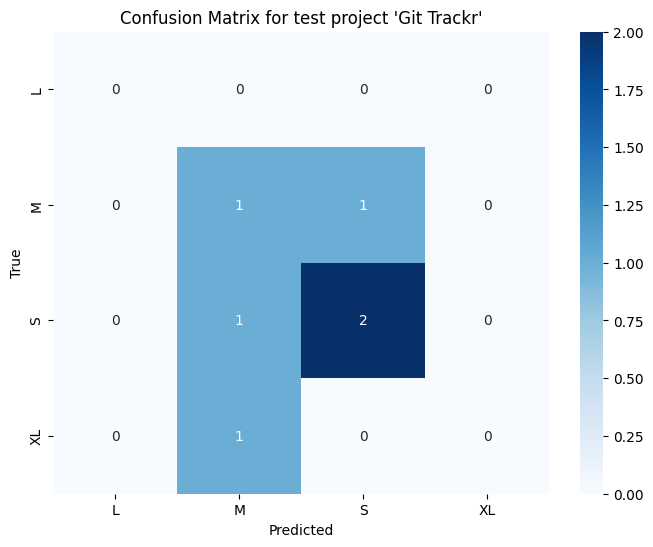

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.75      0.75      0.75         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.75      0.75      0.75         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

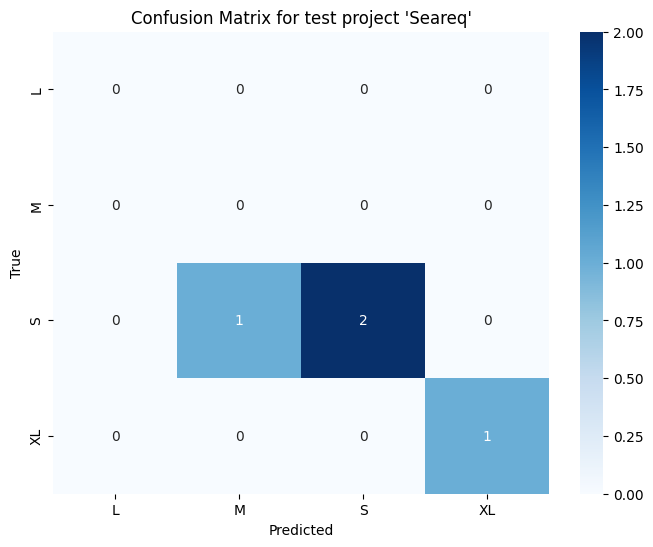

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.60      0.75      0.67         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.62      0.75      0.67         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

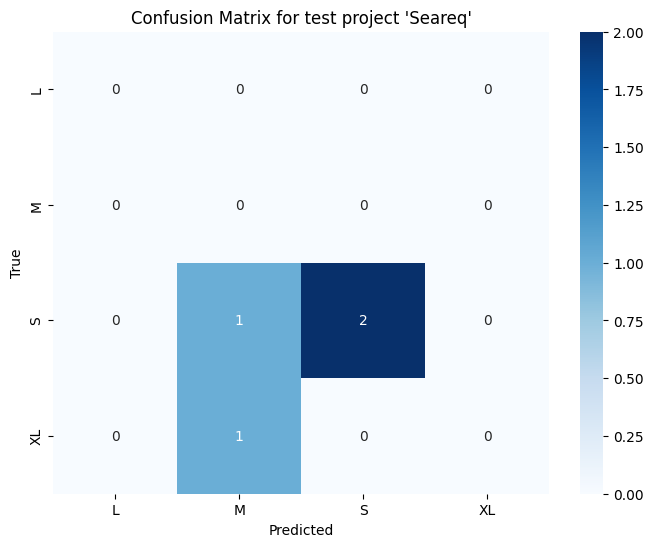

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         4
   macro avg       0.25      0.17      0.20         4
weighted avg       0.75      0.50      0.60         4
 samples avg       0.50      0.50      0.50         4



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.75     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.6000000000000001

Confusion matrix for test project 'Seareq':


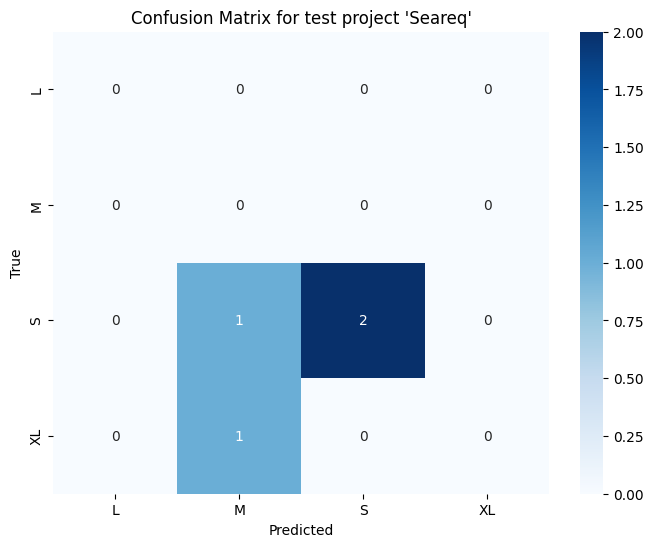

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.69      0.92      0.79        12
          XL       0.00      0.00      0.00         0

   micro avg       0.71      0.67      0.69        18
   macro avg       0.42      0.27      0.27        18
weighted avg       0.79      0.67      0.62        18
 samples avg       0.67      0.67      0.67        18

Precision: 0.7916666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6190476190476191

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

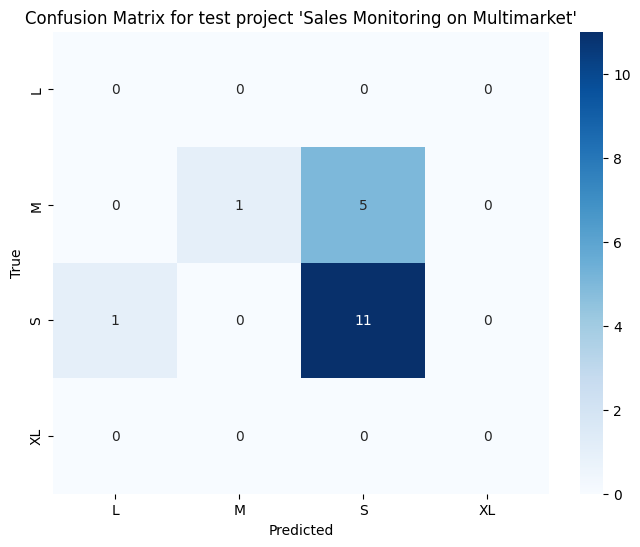

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.75      1.00      0.86        12
          XL       0.00      0.00      0.00         0

   micro avg       0.72      0.72      0.72        18
   macro avg       0.31      0.29      0.28        18
weighted avg       0.67      0.72      0.65        18
 samples avg       0.69      0.72      0.70        18

Precision: 0.6666666666666666     Recall: 0.7222222222222222      Accuracy: 0.6666666666666666      F1 Score: 0.6547619047619047

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

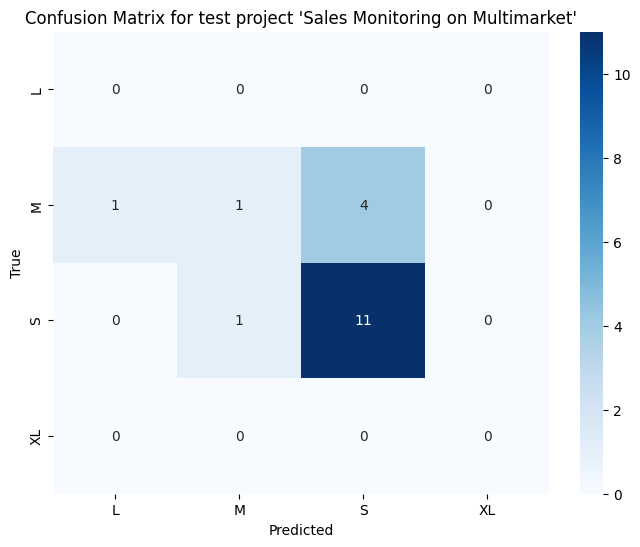

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.65      0.92      0.76        12
          XL       0.00      0.00      0.00         0

   micro avg       0.63      0.67      0.65        18
   macro avg       0.29      0.27      0.25        18
weighted avg       0.60      0.67      0.59        18
 samples avg       0.64      0.67      0.65        18



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.5980392156862746     Recall: 0.6666666666666666      Accuracy: 0.6111111111111112      F1 Score: 0.5890804597701149

Confusion matrix for test project 'Sales Monitoring on Multimarket':


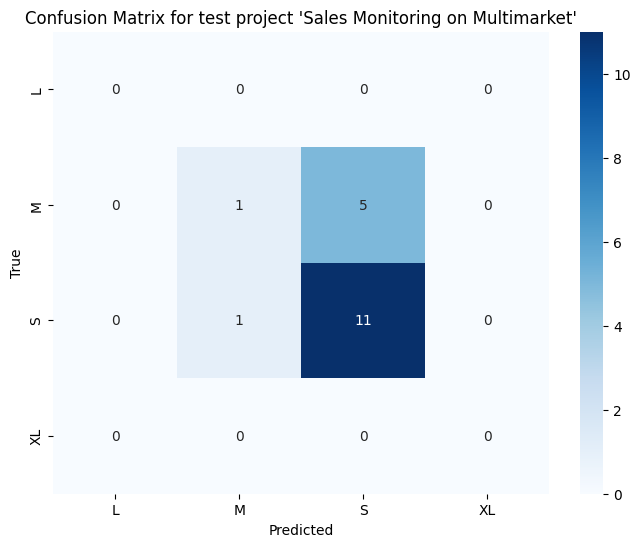

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

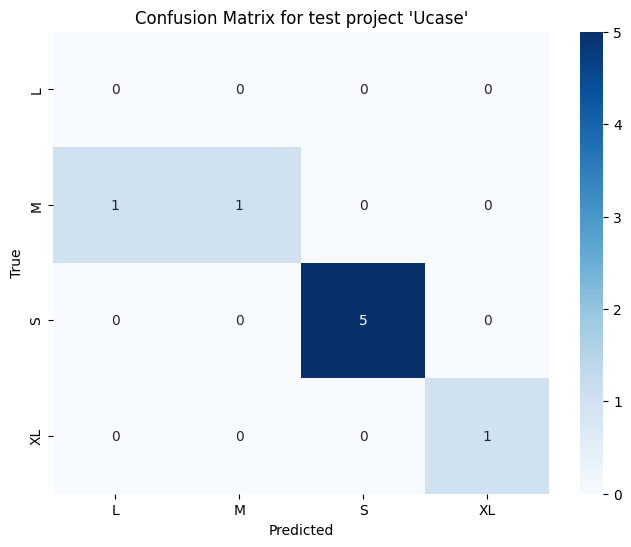

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


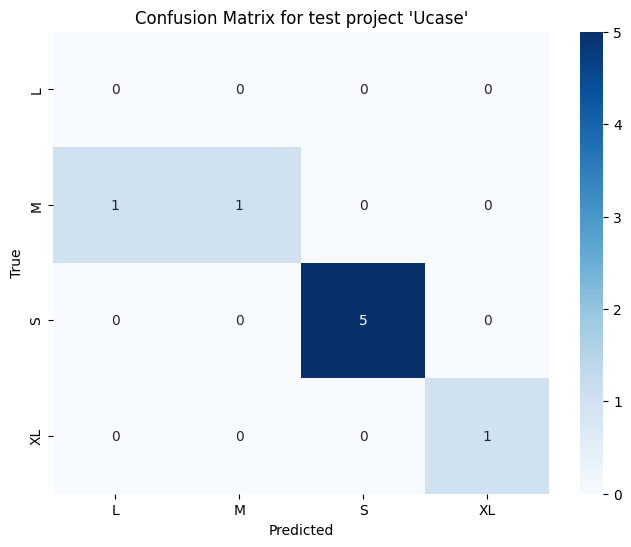

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         2
           S       0.67      0.80      0.73         5
          XL       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75         8
   macro avg       0.42      0.45      0.43         8
weighted avg       0.67      0.75      0.70         8
 samples avg       0.69      0.75      0.71         8



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.6666666666666666     Recall: 0.75      Accuracy: 0.625      F1 Score: 0.7045454545454545

Confusion matrix for test project 'Ucase':


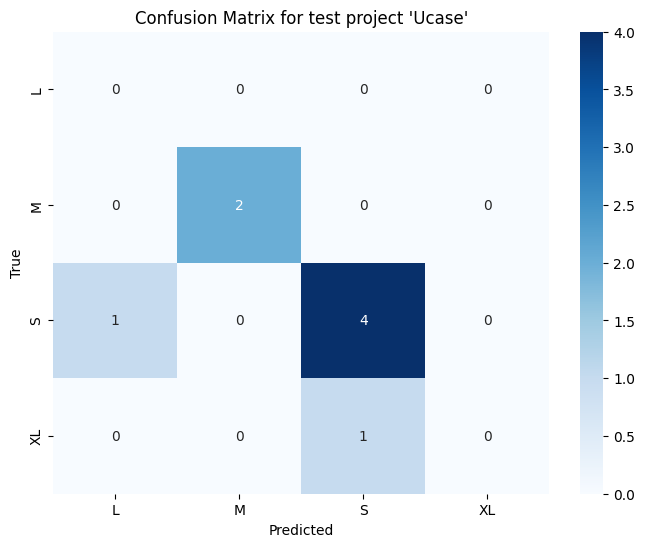

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.92      0.92        13
   macro avg       0.72      0.67      0.69        13
weighted avg       0.93      0.92      0.92        13
 samples avg       0.92      0.92      0.92        13

Precision: 0.9316239316239316     Recall: 0.9230769230769231      Accuracy: 0.9230769230769231      F1 Score: 0.9176470588235295

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

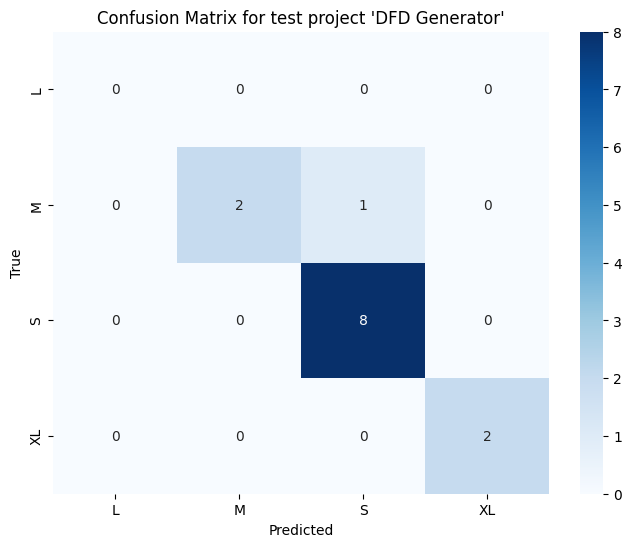

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.92      0.92        13
   macro avg       0.72      0.67      0.69        13
weighted avg       0.93      0.92      0.92        13
 samples avg       0.92      0.92      0.92        13

Precision: 0.9316239316239316     Recall: 0.9230769230769231      Accuracy: 0.9230769230769231      F1 Score: 0.9176470588235295

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

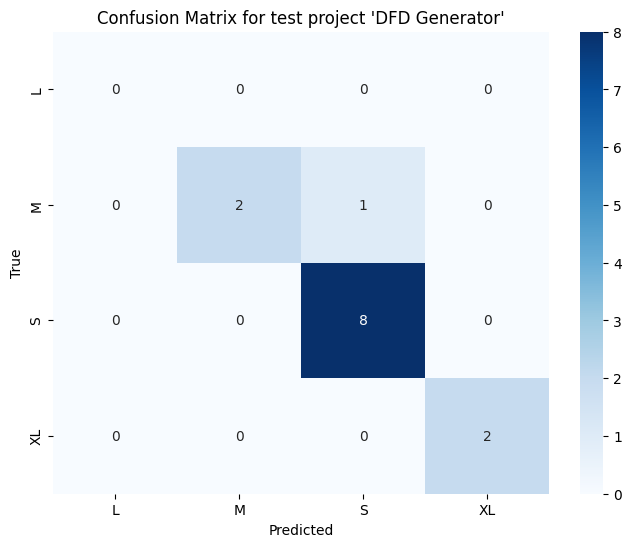

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.78      0.88      0.82         8
          XL       0.00      0.00      0.00         2

   micro avg       0.82      0.69      0.75        13
   macro avg       0.44      0.39      0.41        13
weighted avg       0.71      0.69      0.69        13
 samples avg       0.65      0.69      0.67        13

Precision: 0.7094017094017093     Recall: 0.6923076923076923      Accuracy: 0.6153846153846154      F1 Score: 0.6914027149321267

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

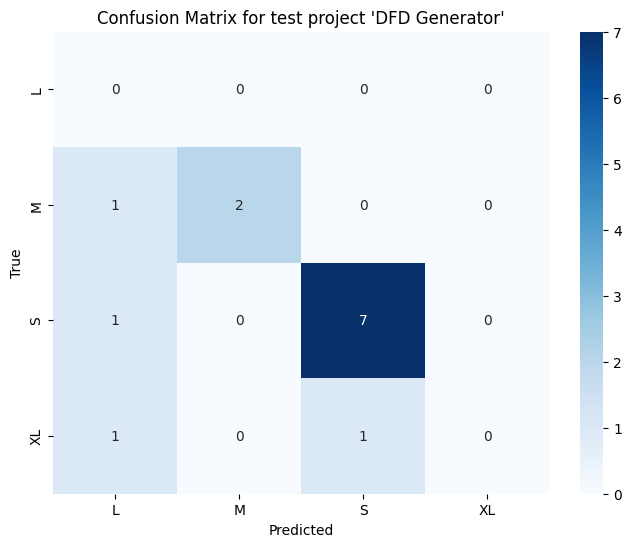

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.75      0.86         8
          XL       1.00      1.00      1.00         2

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.63        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8658008658008658

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

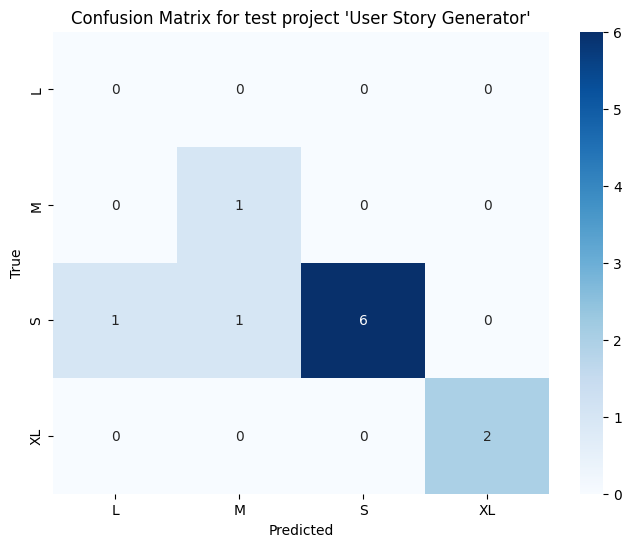

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.86      0.91      0.88        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.8181818181818182      F1 Score: 0.9212121212121211

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

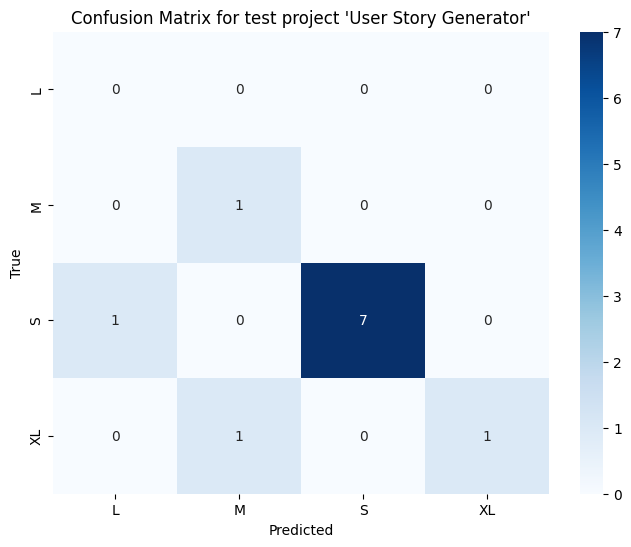

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      1.00      0.50         1
           S       0.78      0.88      0.82         8
          XL       0.00      0.00      0.00         2

   micro avg       0.67      0.73      0.70        11
   macro avg       0.28      0.47      0.33        11
weighted avg       0.60      0.73      0.64        11
 samples avg       0.68      0.73      0.70        11

Precision: 0.5959595959595959     Recall: 0.7272727272727273      Accuracy: 0.6363636363636364      F1 Score: 0.6443850267379679

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

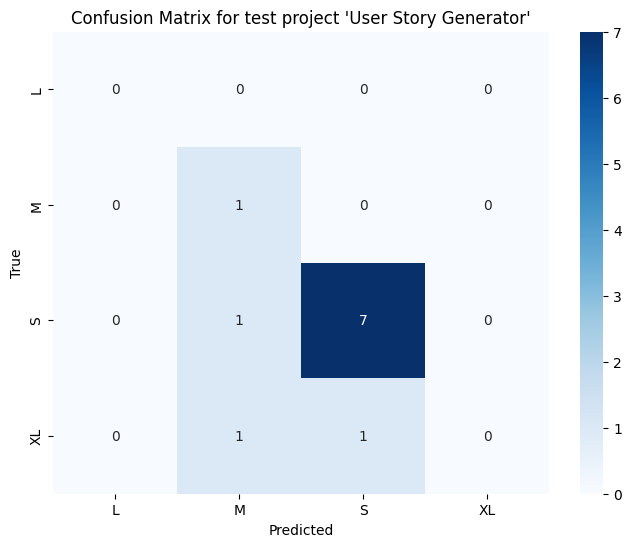

In [56]:
# Model (Numerik 2)
accuracy_list_Adaboost_nt22 = []
accuracy_list_DecisionTree_nt22 = []
accuracy_list_MultinomialNB_nt22 = []
precision_list_Adaboost_nt22 = []
precision_list_DecisionTree_nt22 = []
precision_list_MultinomialNB_nt22 = []
recall_list_Adaboost_nt22 = []
recall_list_DecisionTree_nt22 = []
recall_list_MultinomialNB_nt22 = []
f1_score_list_Adaboost_nt22 = []
f1_score_list_DecisionTree_nt22 = []
f1_score_list_MultinomialNB_nt22 = []
mean_accuracy_nt22 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_user_story_num2.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_user_story_num2.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt22.append(accuracy)
    precision_list_Adaboost_nt22.append(precision)
    recall_list_Adaboost_nt22.append(recall)
    f1_score_list_Adaboost_nt22.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt22.append(accuracy)
    precision_list_DecisionTree_nt22.append(precision)
    recall_list_DecisionTree_nt22.append(recall)
    f1_score_list_DecisionTree_nt22.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt22.append(accuracy)
    precision_list_MultinomialNB_nt22.append(precision)
    recall_list_MultinomialNB_nt22.append(recall)
    f1_score_list_MultinomialNB_nt22.append(f1)

In [57]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt22': precision_list_Adaboost_nt22,
    'Recall_Adaboost_nt22': recall_list_Adaboost_nt22,
    'Accuracy_Adaboost_nt22': accuracy_list_Adaboost_nt22,
    'F1_Score_Adaboost_nt22': f1_score_list_Adaboost_nt22,
    'Precision_DecisionTree_nt22': precision_list_DecisionTree_nt22,
    'Recall_DecisionTree_nt22': recall_list_DecisionTree_nt22,
    'Accuracy_DecisionTree_nt22': accuracy_list_DecisionTree_nt22,
    'F1_Score_DecisionTree_nt22': f1_score_list_DecisionTree_nt22,
    'Precision_MultinomialNB_nt22': precision_list_MultinomialNB_nt22,
    'Recall_MultinomialNB_nt22': recall_list_MultinomialNB_nt22,
    'Accuracy_MultinomialNB_nt22': accuracy_list_MultinomialNB_nt22,
    'F1_Score_MultinomialNB_nt22': f1_score_list_MultinomialNB_nt22,
}

# Buat DataFrame
df_result_nt22 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt22


,Project,Precision_Adaboost_nt22,Recall_Adaboost_nt22,Accuracy_Adaboost_nt22,F1_Score_Adaboost_nt22,Precision_DecisionTree_nt22,Recall_DecisionTree_nt22,Accuracy_DecisionTree_nt22,F1_Score_DecisionTree_nt22,Precision_MultinomialNB_nt22,Recall_MultinomialNB_nt22,Accuracy_MultinomialNB_nt22,F1_Score_MultinomialNB_nt22
0,Akobesi,0.498961,0.700787,0.700787,0.582898,0.491103,0.700787,0.700787,0.577501,0.800705,0.622047,0.614173,0.596083
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.703704,0.777778,0.666667,0.722222
2,Novelty Checker,0.954545,0.818182,0.818182,0.867424,0.939394,0.909091,0.818182,0.906417,0.757576,0.818182,0.727273,0.772727
3,Journal Database Reviewer,0.708333,0.750000,0.750000,0.725000,0.665179,0.875000,0.750000,0.750833,0.423077,0.500000,0.500000,0.458333
4,Git Trackr,0.541667,0.666667,0.500000,0.595238,0.541667,0.666667,0.500000,0.595238,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,0.750000,0.750000,0.850000,1.000000,0.750000,0.500000,0.850000,0.750000,0.500000,0.500000,0.600000
6,Sales Monitoring on Multimarket,0.791667,0.666667,0.666667,0.619048,0.666667,0.722222,0.666667,0.654762,0.598039,0.666667,0.611111,0.589080
7,Ucase,1.000000,0.875000,0.875000,0.916667,1.000000,0.875000,0.875000,0.916667,0.666667,0.750000,0.625000,0.704545
8,DFD Generator,0.931624,0.923077,0.923077,0.917647,0.931624,0.923077,0.923077,0.917647,0.709402,0.692308,0.615385,0.691403
9,User Story Generator,0.954545,0.818182,0.818182,0.865801,0.954545,0.909091,0.818182,0.921212,0.595960,0.727273,0.636364,0.644385


In [58]:
# Mean Accuracy
mean_accuracy_nt22.append(np.mean(accuracy_list_Adaboost_nt22))
mean_accuracy_nt22.append(np.mean(accuracy_list_DecisionTree_nt22))
mean_accuracy_nt22.append(np.mean(accuracy_list_MultinomialNB_nt22))
print("Mean Accuracy")
print(mean_accuracy_nt22)

Mean Accuracy
[0.780189462768203, 0.755189462768203, 0.5995971985145214]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.33      0.03      0.06        31
           S       0.69      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.68      0.63      0.65       127
   macro avg       0.26      0.23      0.21       127
weighted avg       0.56      0.63      0.56       127
 samples avg       0.63      0.63      0.63       127

Precision: 0.5627753052607555     Recall: 0.6299212598425197      Accuracy: 0.6299212598425197      F1 Score: 0.5571252122896403

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

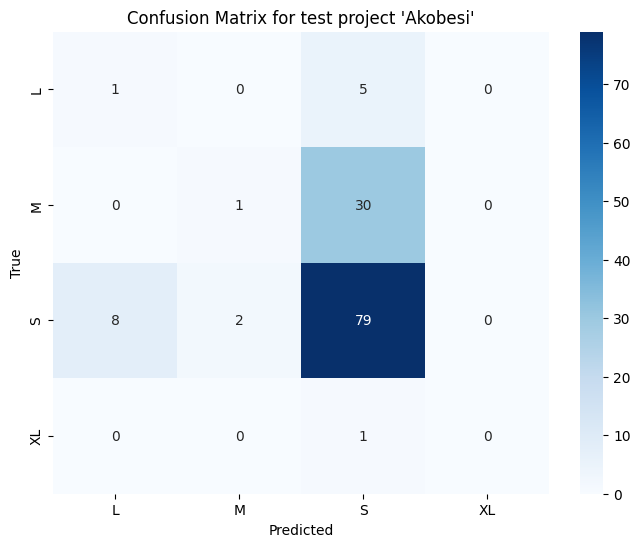

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.68      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.68      0.62      0.65       127
   macro avg       0.17      0.22      0.19       127
weighted avg       0.48      0.62      0.54       127
 samples avg       0.62      0.62      0.62       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.47726038555525385     Recall: 0.6220472440944882      Accuracy: 0.6220472440944882      F1 Score: 0.5401190704820434

Confusion matrix for test project 'Akobesi':


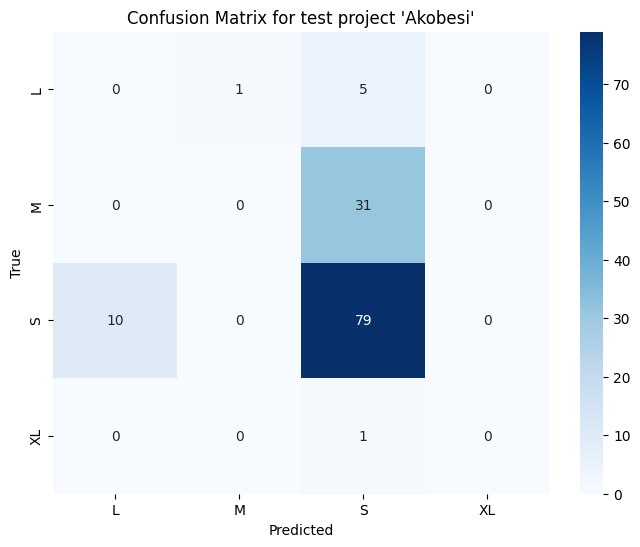

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.79      0.91      0.84        89
          XL       0.06      1.00      0.12         1

   micro avg       0.69      0.65      0.67       127
   macro avg       0.46      0.49      0.26       127
weighted avg       0.80      0.65      0.61       127
 samples avg       0.65      0.65      0.65       127

Precision: 0.7956912697805979     Recall: 0.6535433070866141      Accuracy: 0.6456692913385826      F1 Score: 0.6074716303844373

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

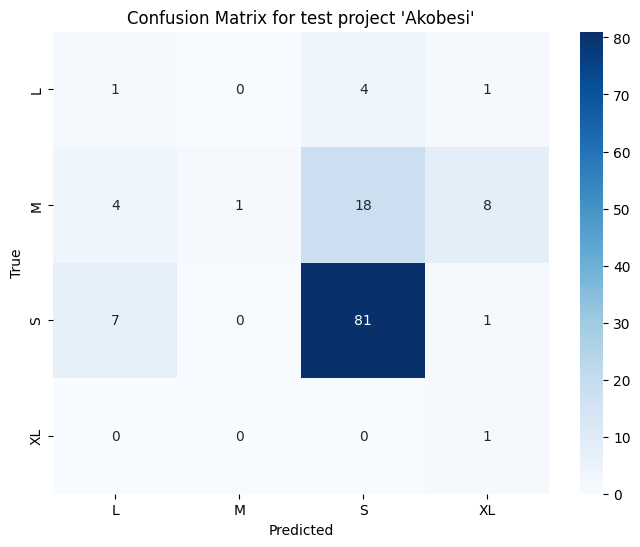

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

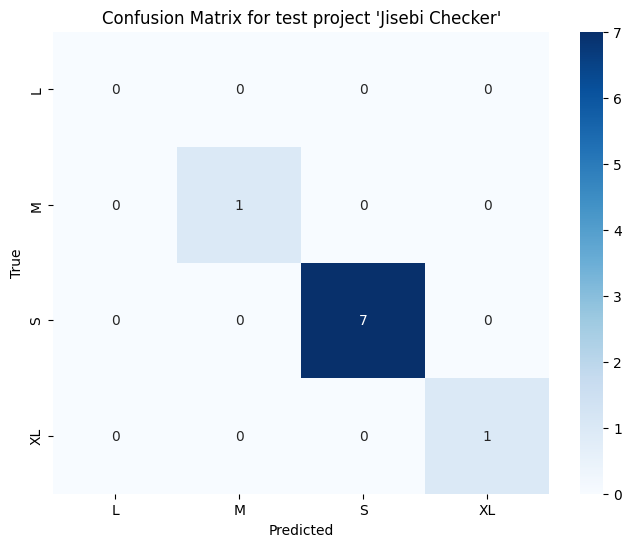

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.88      1.00      0.93         7
          XL       1.00      1.00      1.00         1

   micro avg       0.90      1.00      0.95         9
   macro avg       0.72      0.75      0.73         9
weighted avg       0.90      1.00      0.95         9
 samples avg       0.94      1.00      0.96         9

Precision: 0.9027777777777778     Recall: 1.0      Accuracy: 0.8888888888888888      F1 Score: 0.9481481481481482

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

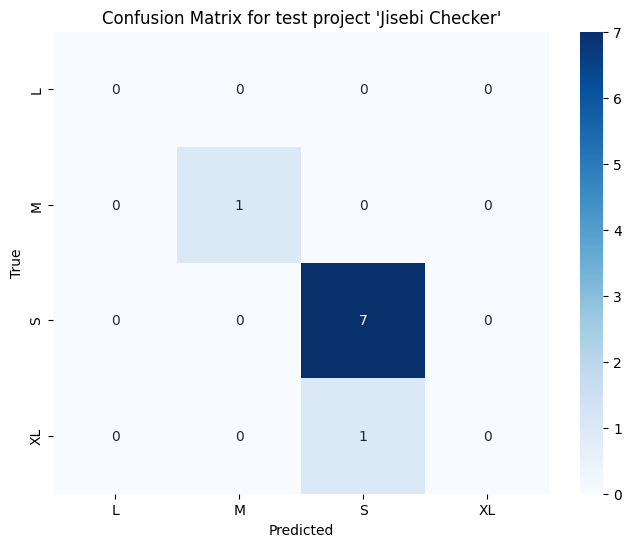

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.67      0.67         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

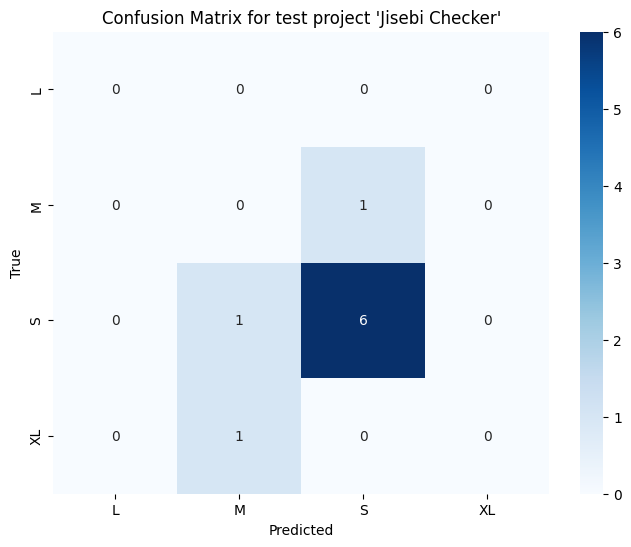

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.67      0.80         9
          XL       1.00      1.00      1.00         1

   micro avg       0.89      0.73      0.80        11
   macro avg       0.62      0.67      0.62        11
weighted avg       0.95      0.73      0.81        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.9545454545454546     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.8060606060606061

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

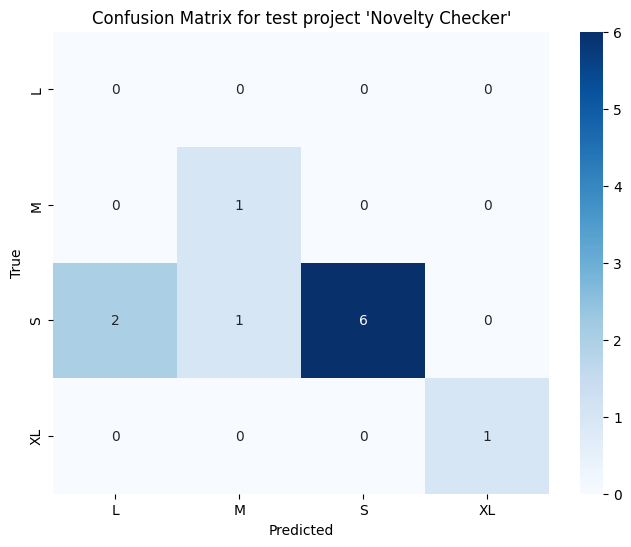

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9215686274509803

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

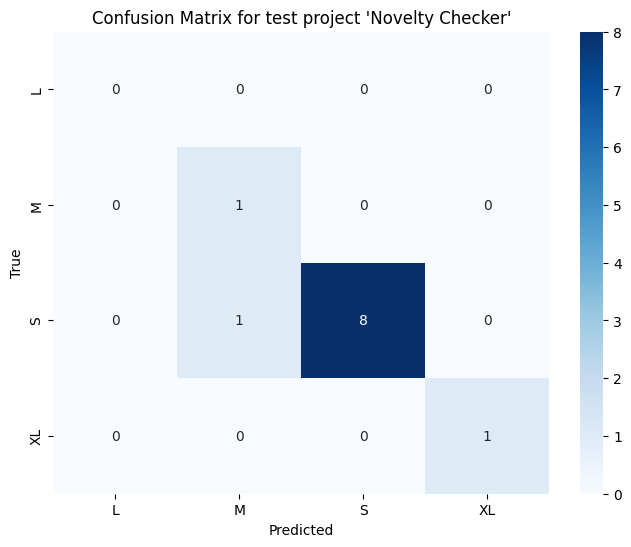

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       0.89      0.89      0.89         9
          XL       0.00      0.00      0.00         1

   micro avg       0.82      0.82      0.82        11
   macro avg       0.35      0.47      0.39        11
weighted avg       0.77      0.82      0.79        11
 samples avg       0.77      0.82      0.79        11

Precision: 0.7727272727272727     Recall: 0.8181818181818182      Accuracy: 0.7272727272727273      F1 Score: 0.7878787878787878

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

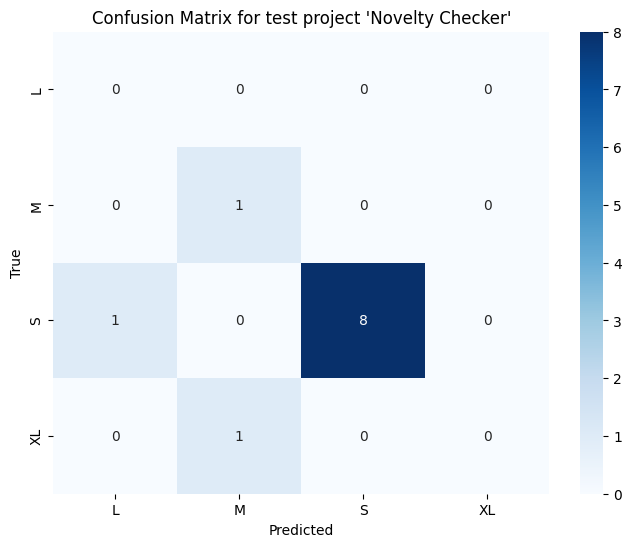

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       1.00      0.50      0.67         2
           S       0.83      0.91      0.87        11
          XL       1.00      1.00      1.00         1

   micro avg       0.86      0.75      0.80        16
   macro avg       0.71      0.60      0.63        16
weighted avg       0.76      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.7604166666666667     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7436594202898551

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

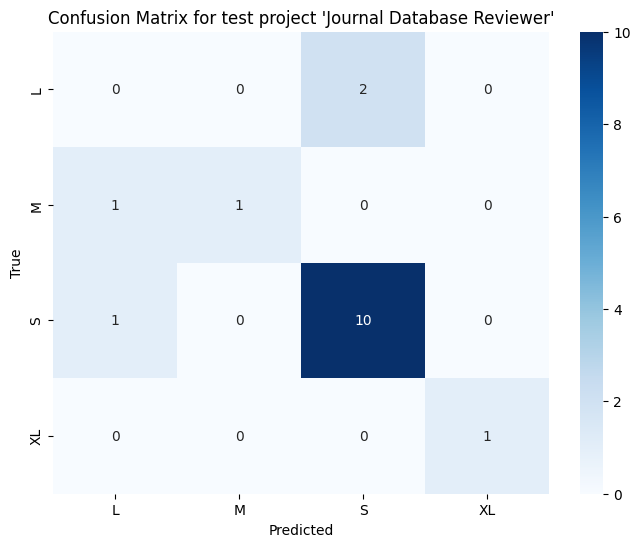

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.75      0.82      0.78        11
          XL       1.00      1.00      1.00         1

   micro avg       0.71      0.62      0.67        16
   macro avg       0.44      0.45      0.45        16
weighted avg       0.58      0.62      0.60        16
 samples avg       0.59      0.62      0.60        16

Precision: 0.578125     Recall: 0.625      Accuracy: 0.5625      F1 Score: 0.6005434782608695

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

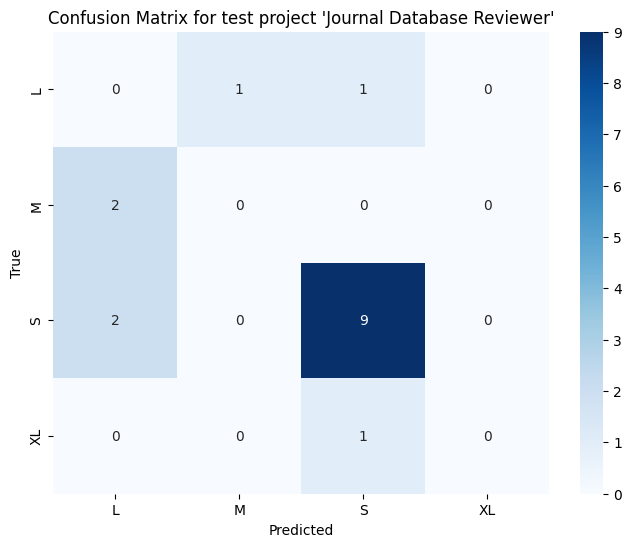

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.62      0.73      0.67        11
          XL       0.00      0.00      0.00         1

   micro avg       0.53      0.50      0.52        16
   macro avg       0.15      0.18      0.17        16
weighted avg       0.42      0.50      0.46        16
 samples avg       0.50      0.50      0.50        16

Precision: 0.42307692307692313     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.45833333333333337

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

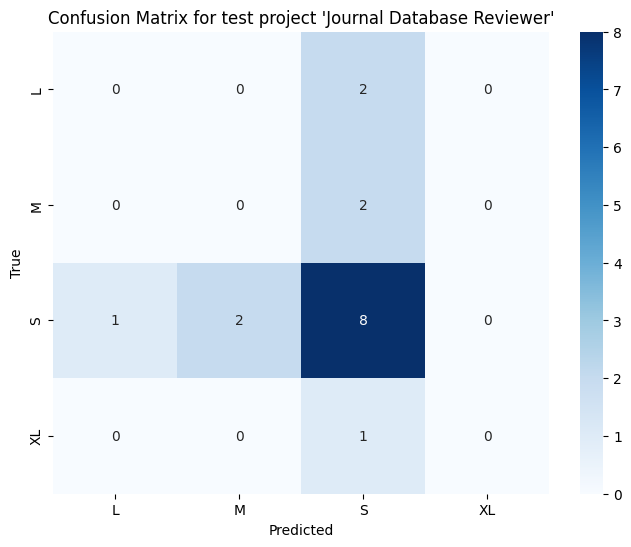

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.50      0.67      0.57         3
          XL       1.00      1.00      1.00         1

   micro avg       0.50      0.67      0.57         6
   macro avg       0.46      0.54      0.49         6
weighted avg       0.53      0.67      0.59         6
 samples avg       0.50      0.67      0.56         6

Precision: 0.5277777777777778     Recall: 0.6666666666666666      Accuracy: 0.3333333333333333      F1 Score: 0.5857142857142857

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

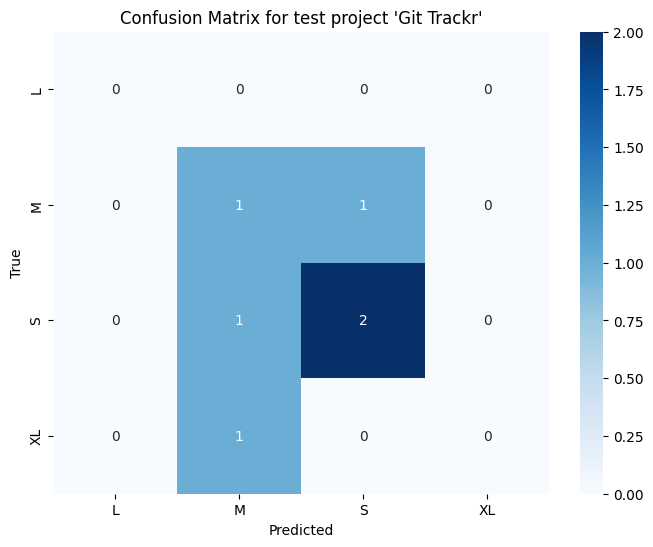

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

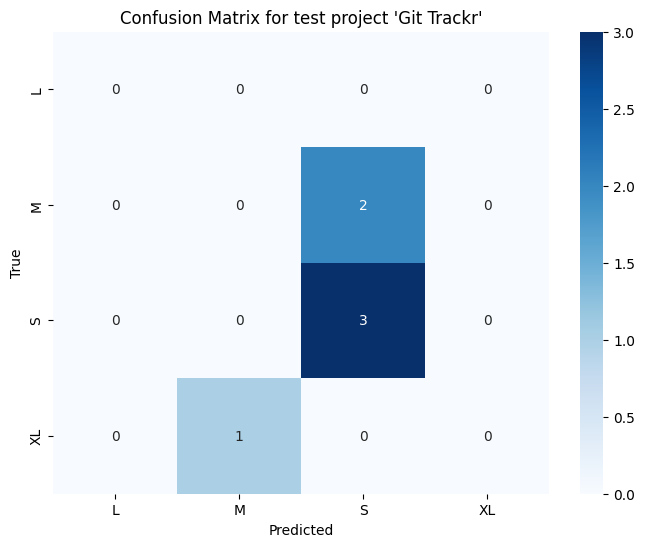

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

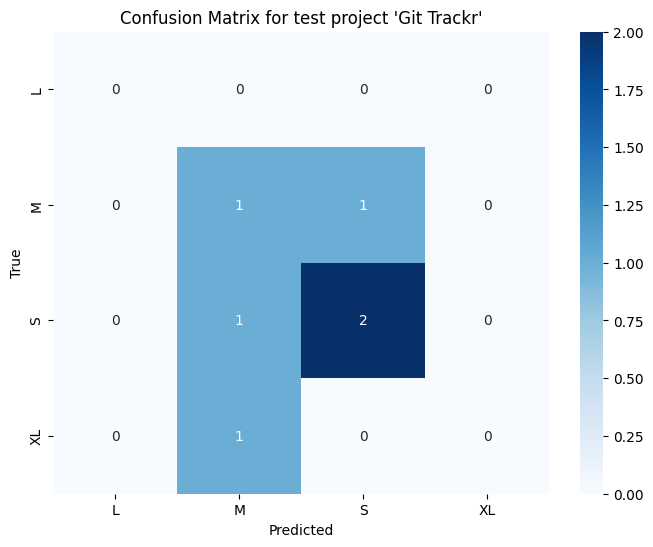

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.75      0.75      0.75         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.75      0.75      0.75         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

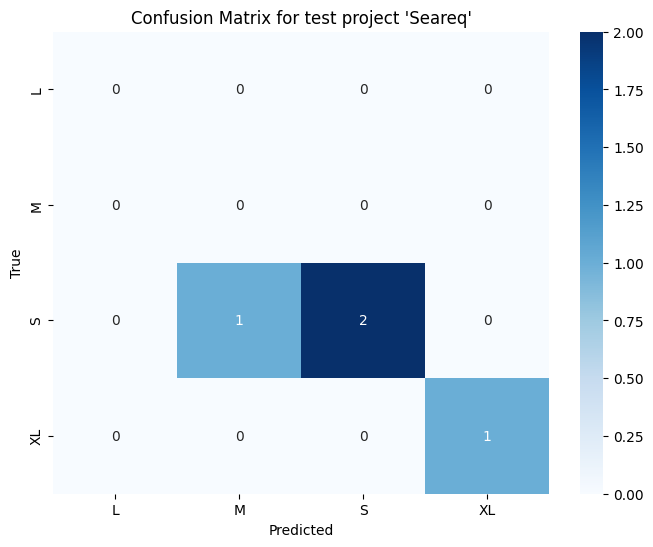

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       0.67      0.67      0.67         3
          XL       1.00      1.00      1.00         1

   micro avg       0.50      0.75      0.60         4
   macro avg       0.42      0.42      0.42         4
weighted avg       0.75      0.75      0.75         4
 samples avg       0.58      0.75      0.62         4

Precision: 0.75     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.75

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

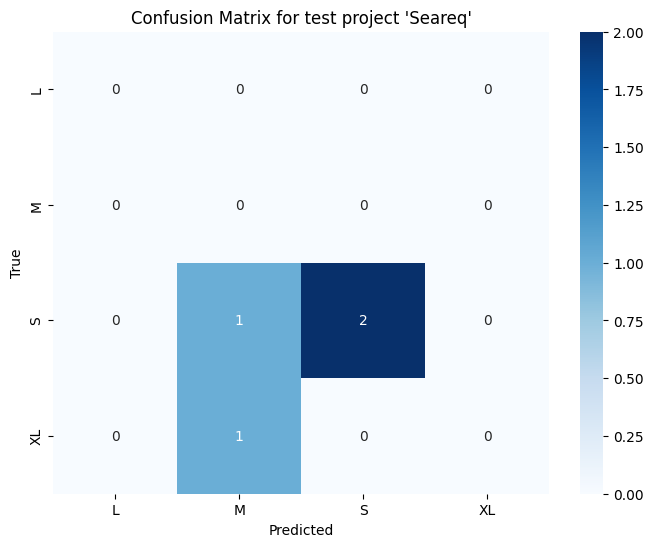

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         4
   macro avg       0.25      0.17      0.20         4
weighted avg       0.75      0.50      0.60         4
 samples avg       0.50      0.50      0.50         4

Precision: 0.75     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.6000000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

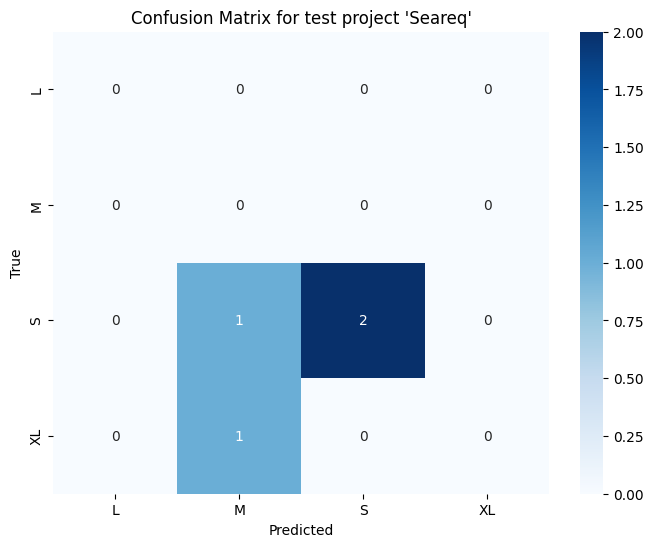

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.72      0.72      0.72        18
   macro avg       0.43      0.29      0.28        18
weighted avg       0.80      0.72      0.65        18
 samples avg       0.72      0.72      0.72        18

Precision: 0.803921568627451     Recall: 0.7222222222222222      Accuracy: 0.7222222222222222      F1 Score: 0.6469622331691297

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

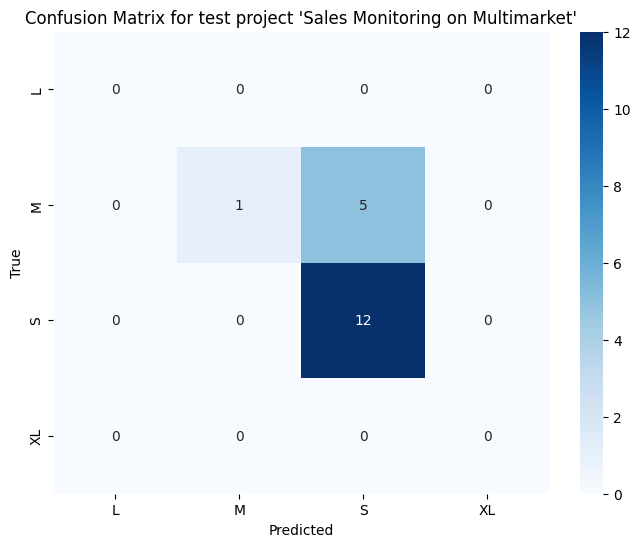

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.67      0.33      0.44         6
           S       0.73      0.92      0.81        12
          XL       0.00      0.00      0.00         0

   micro avg       0.72      0.72      0.72        18
   macro avg       0.35      0.31      0.31        18
weighted avg       0.71      0.72      0.69        18
 samples avg       0.72      0.72      0.72        18

Precision: 0.711111111111111     Recall: 0.7222222222222222      Accuracy: 0.7222222222222222      F1 Score: 0.691358024691358

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

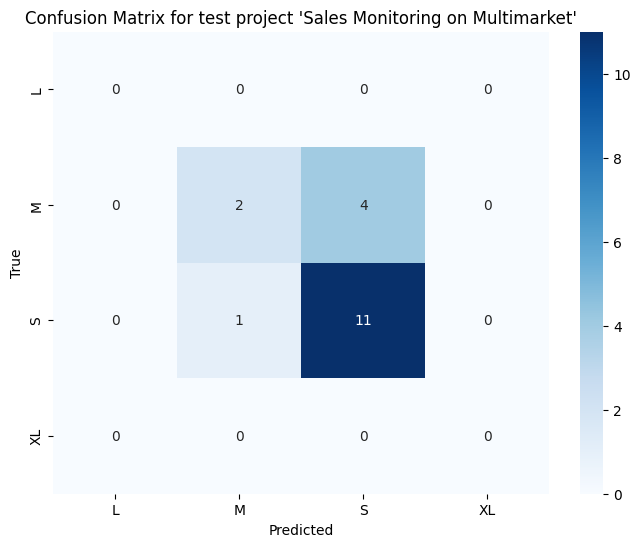

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.65      0.92      0.76        12
          XL       0.00      0.00      0.00         0

   micro avg       0.63      0.67      0.65        18
   macro avg       0.29      0.27      0.25        18
weighted avg       0.60      0.67      0.59        18
 samples avg       0.64      0.67      0.65        18

Precision: 0.5980392156862746     Recall: 0.6666666666666666      Accuracy: 0.6111111111111112      F1 Score: 0.5890804597701149

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

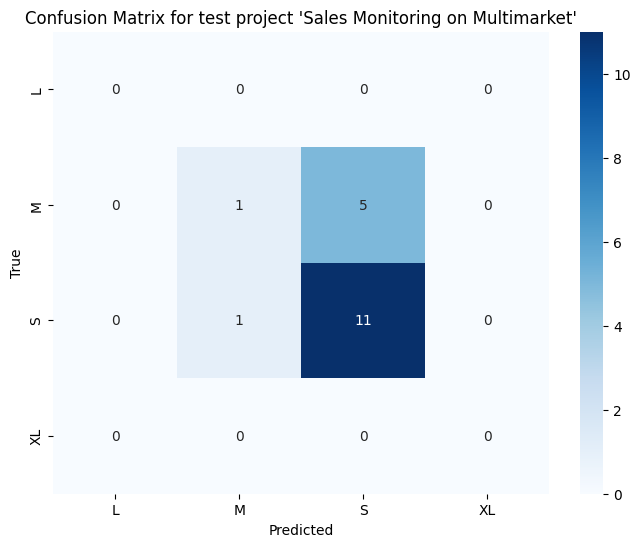

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

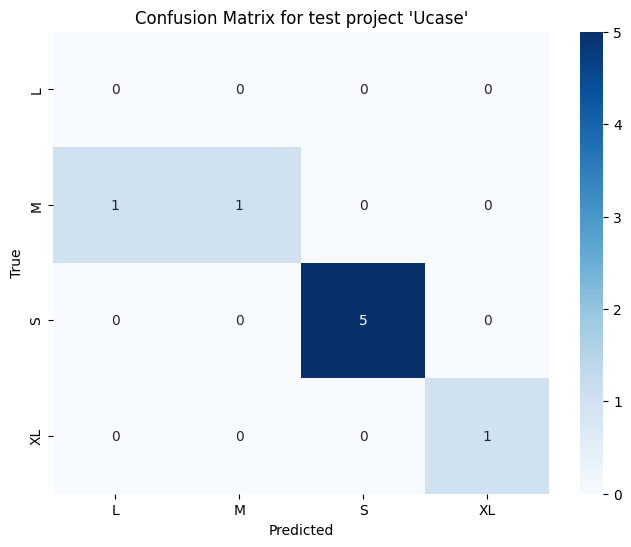

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      0.80      0.89         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.75      0.86         8
   macro avg       0.75      0.57      0.64         8
weighted avg       1.00      0.75      0.85         8
 samples avg       0.75      0.75      0.75         8

Precision: 1.0     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.8472222222222222

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

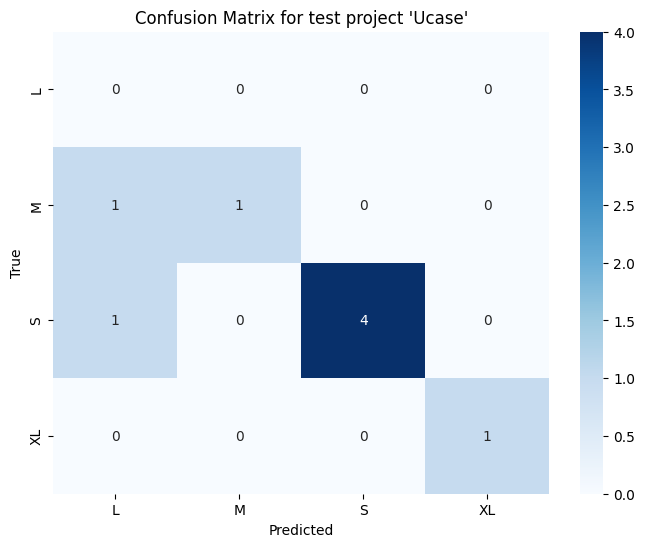

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.71      1.00      0.83         5
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.62      0.67         8
   macro avg       0.18      0.25      0.21         8
weighted avg       0.45      0.62      0.52         8
 samples avg       0.62      0.62      0.62         8

Precision: 0.44642857142857145     Recall: 0.625      Accuracy: 0.625      F1 Score: 0.5208333333333333

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

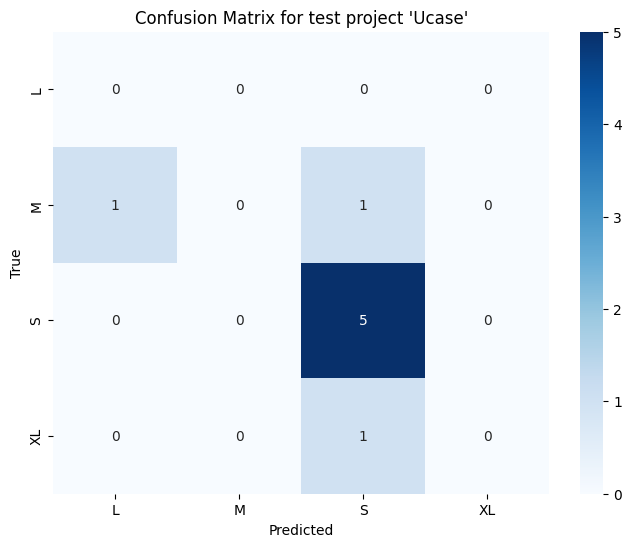

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.85      0.92        13
   macro avg       0.75      0.64      0.68        13
weighted avg       1.00      0.85      0.91        13
 samples avg       0.85      0.85      0.85        13

Precision: 1.0     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.9128205128205129

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

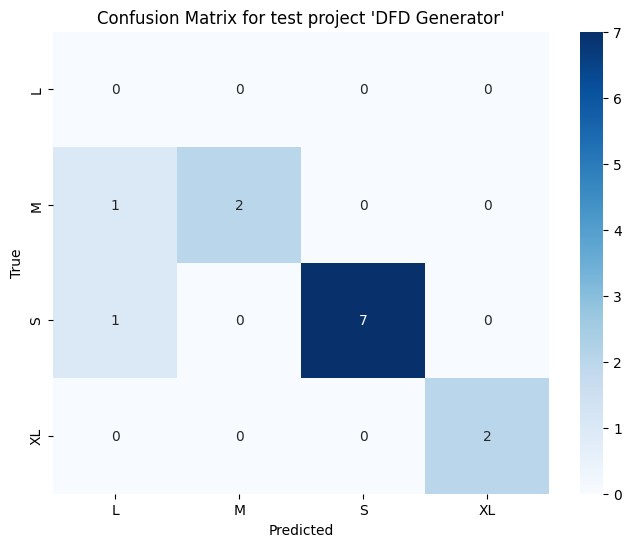

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.67      0.67      0.67         3
           S       0.88      0.88      0.88         8
          XL       1.00      1.00      1.00         2

   micro avg       0.85      0.85      0.85        13
   macro avg       0.64      0.64      0.64        13
weighted avg       0.85      0.85      0.85        13
 samples avg       0.81      0.85      0.82        13

Precision: 0.8461538461538461     Recall: 0.8461538461538461      Accuracy: 0.7692307692307693      F1 Score: 0.8461538461538461

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

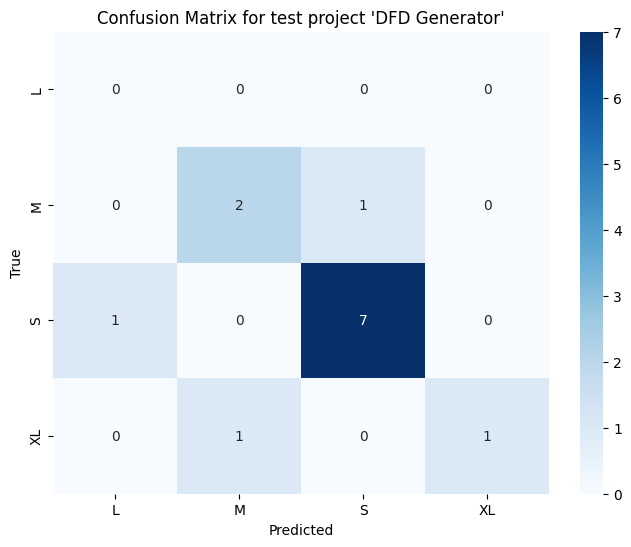

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.80      1.00      0.89         8
          XL       0.00      0.00      0.00         2

   micro avg       0.80      0.62      0.70        13
   macro avg       0.20      0.25      0.22        13
weighted avg       0.49      0.62      0.55        13
 samples avg       0.62      0.62      0.62        13

Precision: 0.49230769230769234     Recall: 0.6153846153846154      Accuracy: 0.6153846153846154      F1 Score: 0.5470085470085471

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

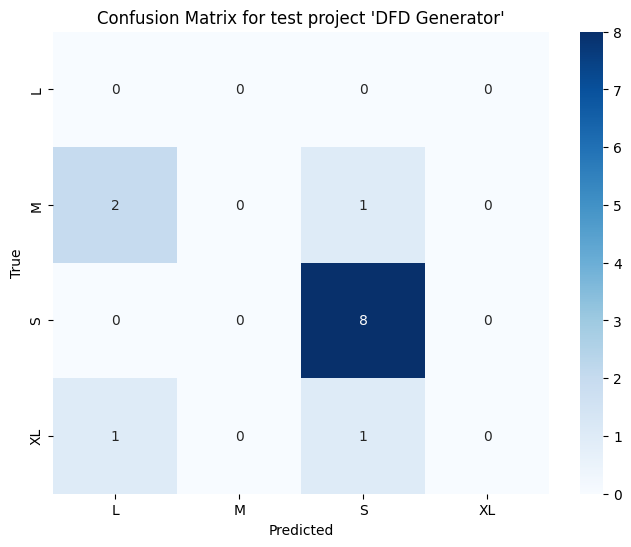

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9212121212121211

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

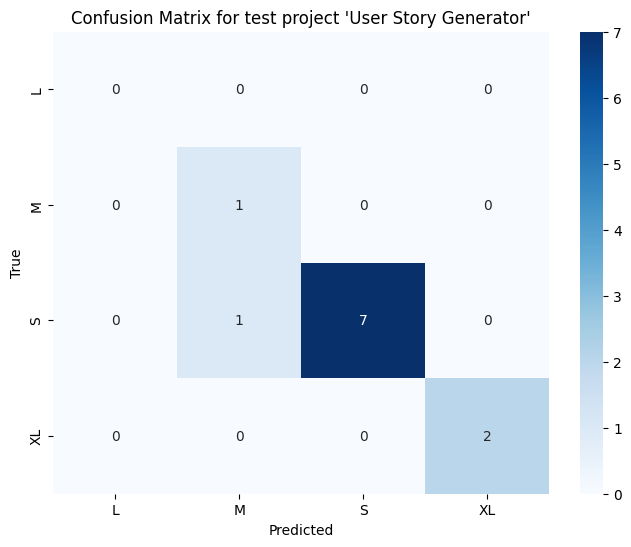

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.73        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9515151515151515

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

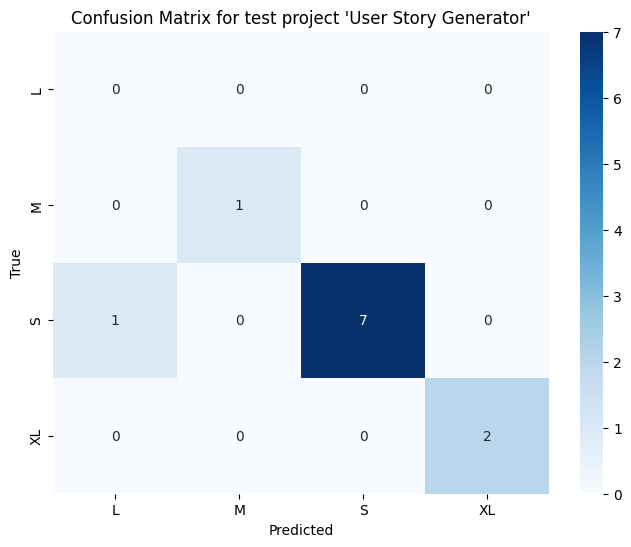

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.78      0.88      0.82         8
          XL       0.00      0.00      0.00         2

   micro avg       0.80      0.73      0.76        11
   macro avg       0.44      0.47      0.46        11
weighted avg       0.66      0.73      0.69        11
 samples avg       0.68      0.73      0.70        11

Precision: 0.6565656565656566     Recall: 0.7272727272727273      Accuracy: 0.6363636363636364      F1 Score: 0.6898395721925135

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

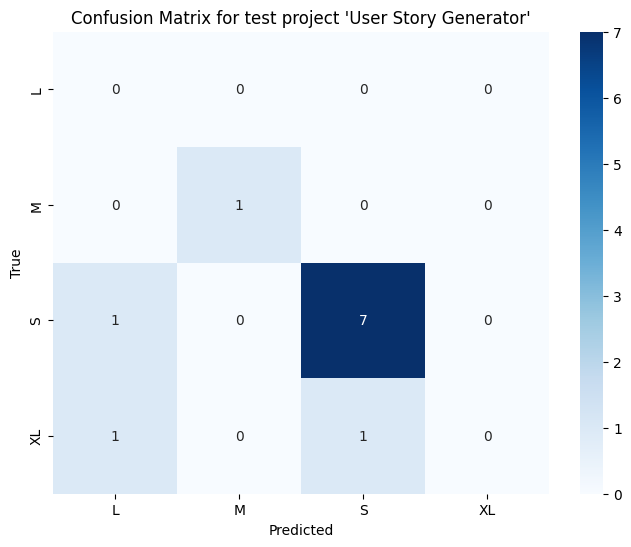

In [59]:
# Model (Numerik 2)
accuracy_list_Adaboost_nt23 = []
accuracy_list_DecisionTree_nt23 = []
accuracy_list_MultinomialNB_nt23 = []
precision_list_Adaboost_nt23 = []
precision_list_DecisionTree_nt23 = []
precision_list_MultinomialNB_nt23 = []
recall_list_Adaboost_nt23 = []
recall_list_DecisionTree_nt23 = []
recall_list_MultinomialNB_nt23 = []
f1_score_list_Adaboost_nt23 = []
f1_score_list_DecisionTree_nt23 = []
f1_score_list_MultinomialNB_nt23 = []
mean_accuracy_nt23 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_scenario_num2.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_scenario_num2.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt23.append(accuracy)
    precision_list_Adaboost_nt23.append(precision)
    recall_list_Adaboost_nt23.append(recall)
    f1_score_list_Adaboost_nt23.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt23.append(accuracy)
    precision_list_DecisionTree_nt23.append(precision)
    recall_list_DecisionTree_nt23.append(recall)
    f1_score_list_DecisionTree_nt23.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt23.append(accuracy)
    precision_list_MultinomialNB_nt23.append(precision)
    recall_list_MultinomialNB_nt23.append(recall)
    f1_score_list_MultinomialNB_nt23.append(f1)

In [60]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt23': precision_list_Adaboost_nt23,
    'Recall_Adaboost_nt23': recall_list_Adaboost_nt23,
    'Accuracy_Adaboost_nt23': accuracy_list_Adaboost_nt23,
    'F1_Score_Adaboost_nt23': f1_score_list_Adaboost_nt23,
    'Precision_DecisionTree_nt23': precision_list_DecisionTree_nt23,
    'Recall_DecisionTree_nt23': recall_list_DecisionTree_nt23,
    'Accuracy_DecisionTree_nt23': accuracy_list_DecisionTree_nt23,
    'F1_Score_DecisionTree_nt23': f1_score_list_DecisionTree_nt23,
    'Precision_MultinomialNB_nt23': precision_list_MultinomialNB_nt23,
    'Recall_MultinomialNB_nt23': recall_list_MultinomialNB_nt23,
    'Accuracy_MultinomialNB_nt23': accuracy_list_MultinomialNB_nt23,
    'F1_Score_MultinomialNB_nt23': f1_score_list_MultinomialNB_nt23,
}

# Buat DataFrame
df_result_nt23 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt23


,Project,Precision_Adaboost_nt23,Recall_Adaboost_nt23,Accuracy_Adaboost_nt23,F1_Score_Adaboost_nt23,Precision_DecisionTree_nt23,Recall_DecisionTree_nt23,Accuracy_DecisionTree_nt23,F1_Score_DecisionTree_nt23,Precision_MultinomialNB_nt23,Recall_MultinomialNB_nt23,Accuracy_MultinomialNB_nt23,F1_Score_MultinomialNB_nt23
0,Akobesi,0.562775,0.629921,0.629921,0.557125,0.477260,0.622047,0.622047,0.540119,0.795691,0.653543,0.645669,0.607472
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,0.902778,1.000000,0.888889,0.948148,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,0.954545,0.727273,0.727273,0.806061,0.954545,0.909091,0.909091,0.921569,0.772727,0.818182,0.727273,0.787879
3,Journal Database Reviewer,0.760417,0.750000,0.750000,0.743659,0.578125,0.625000,0.562500,0.600543,0.423077,0.500000,0.500000,0.458333
4,Git Trackr,0.527778,0.666667,0.333333,0.585714,0.466667,0.666667,0.500000,0.541667,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,0.750000,0.750000,0.850000,0.750000,0.750000,0.500000,0.750000,0.750000,0.500000,0.500000,0.600000
6,Sales Monitoring on Multimarket,0.803922,0.722222,0.722222,0.646962,0.711111,0.722222,0.722222,0.691358,0.598039,0.666667,0.611111,0.589080
7,Ucase,1.000000,0.875000,0.875000,0.916667,1.000000,0.750000,0.750000,0.847222,0.446429,0.625000,0.625000,0.520833
8,DFD Generator,1.000000,0.846154,0.846154,0.912821,0.846154,0.846154,0.769231,0.846154,0.492308,0.615385,0.615385,0.547009
9,User Story Generator,0.954545,0.909091,0.909091,0.921212,1.000000,0.909091,0.909091,0.951515,0.656566,0.727273,0.636364,0.689840


In [61]:
# Mean Accuracy
mean_accuracy_nt23.append(np.mean(accuracy_list_Adaboost_nt23))
mean_accuracy_nt23.append(np.mean(accuracy_list_DecisionTree_nt23))
mean_accuracy_nt23.append(np.mean(accuracy_list_MultinomialNB_nt23))
print("Mean Accuracy")
print(mean_accuracy_nt23)

Mean Accuracy
[0.7542994297915557, 0.7133070942618187, 0.602746804813734]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.17      0.10      0.12        31
           S       0.70      0.99      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.64      0.72      0.67       127
   macro avg       0.22      0.27      0.24       127
weighted avg       0.53      0.72      0.61       127
 samples avg       0.67      0.72      0.68       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.5340367454068241     Recall: 0.7165354330708661      Accuracy: 0.6141732283464567      F1 Score: 0.6062376381857475

Confusion matrix for test project 'Akobesi':


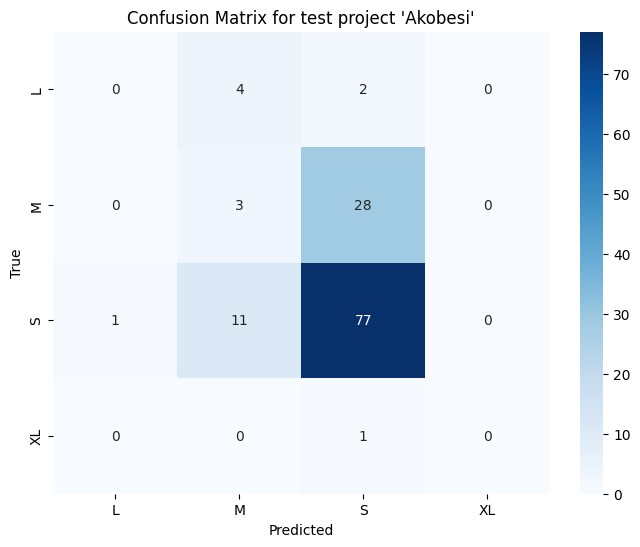

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.20      0.03      0.06        31
           S       0.77      0.81      0.79        89
          XL       0.00      0.00      0.00         1

   micro avg       0.74      0.57      0.65       127
   macro avg       0.24      0.21      0.21       127
weighted avg       0.59      0.57      0.57       127
 samples avg       0.57      0.57      0.57       127

Precision: 0.585592226503602     Recall: 0.5748031496062992      Accuracy: 0.5748031496062992      F1 Score: 0.5650000717123475

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

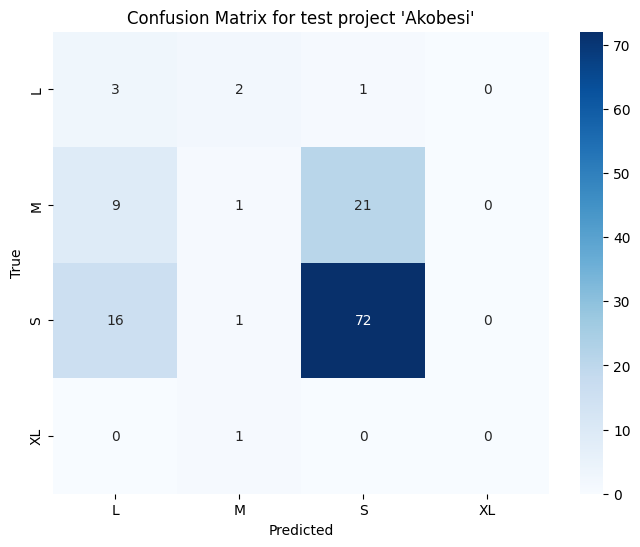

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.49      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.49110298220596443     Recall: 0.7007874015748031      Accuracy: 0.6929133858267716      F1 Score: 0.5775007290755322

Confusion matrix for test project 'Akobesi':


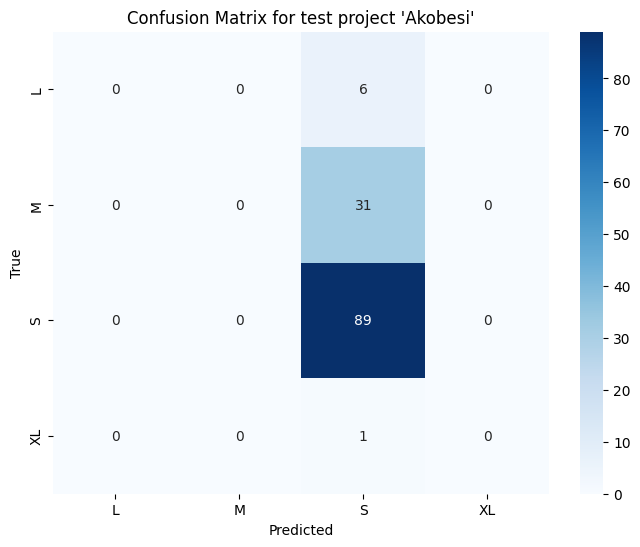

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

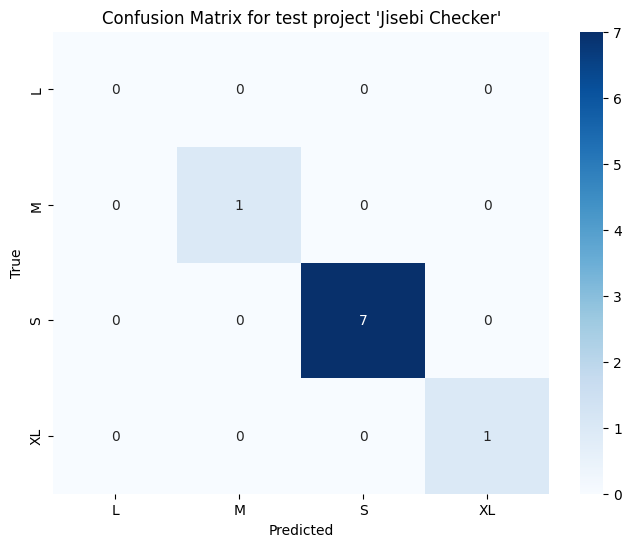

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

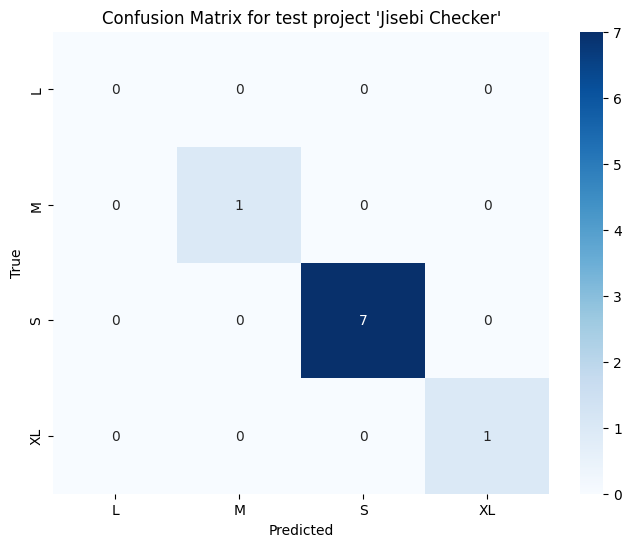

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.75      0.67      0.71         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

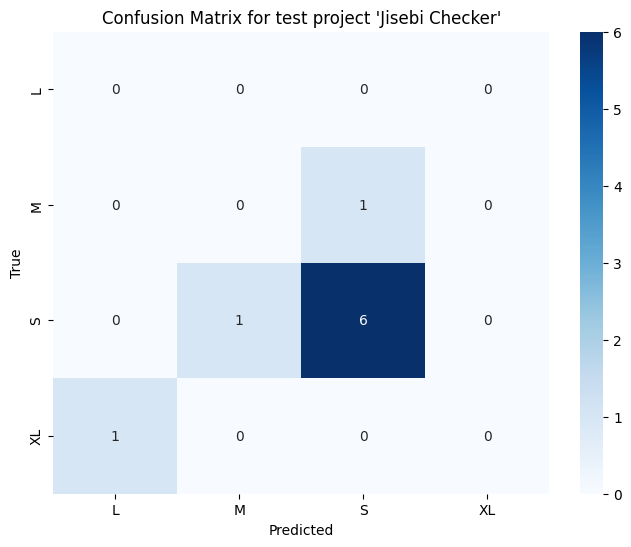

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.74        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9518716577540107

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

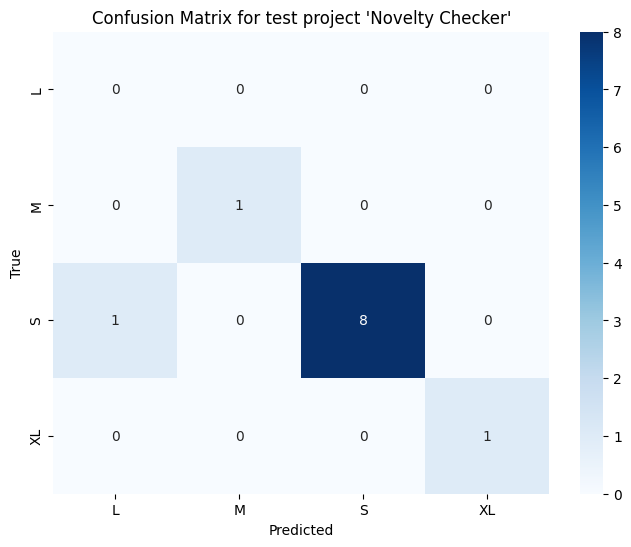

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.82      0.90        11
   macro avg       0.75      0.69      0.72        11
weighted avg       1.00      0.82      0.90        11
 samples avg       0.82      0.82      0.82        11

Precision: 1.0     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8977272727272727

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

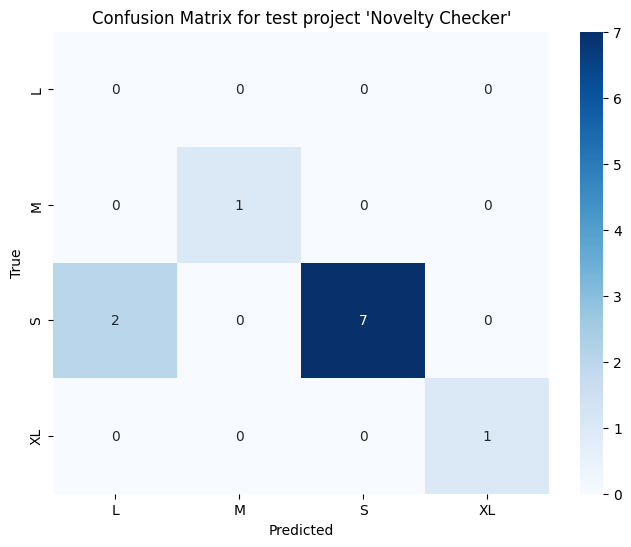

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.82      1.00      0.90         9
          XL       0.00      0.00      0.00         1

   micro avg       0.82      0.82      0.82        11
   macro avg       0.20      0.25      0.23        11
weighted avg       0.67      0.82      0.74        11
 samples avg       0.82      0.82      0.82        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.6694214876033059     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.7363636363636363

Confusion matrix for test project 'Novelty Checker':


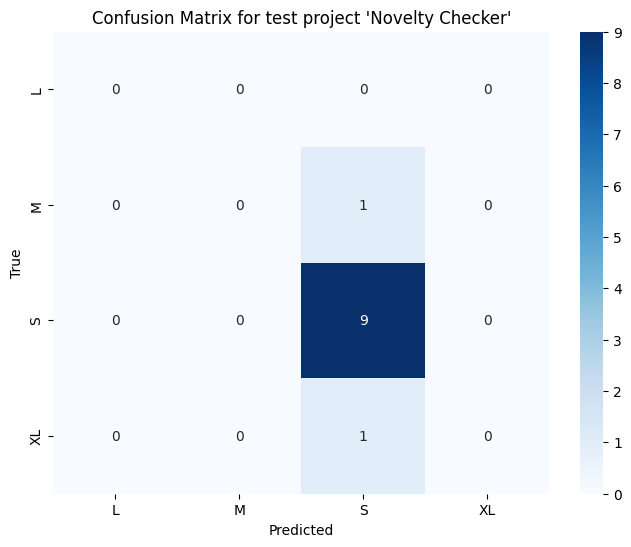

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.40      1.00      0.57         2
           S       0.83      0.91      0.87        11
          XL       1.00      1.00      1.00         1

   micro avg       0.72      0.81      0.76        16
   macro avg       0.56      0.73      0.61        16
weighted avg       0.69      0.81      0.73        16
 samples avg       0.72      0.81      0.75        16

Precision: 0.6854166666666668     Recall: 0.8125      Accuracy: 0.625      F1 Score: 0.7317546583850931

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

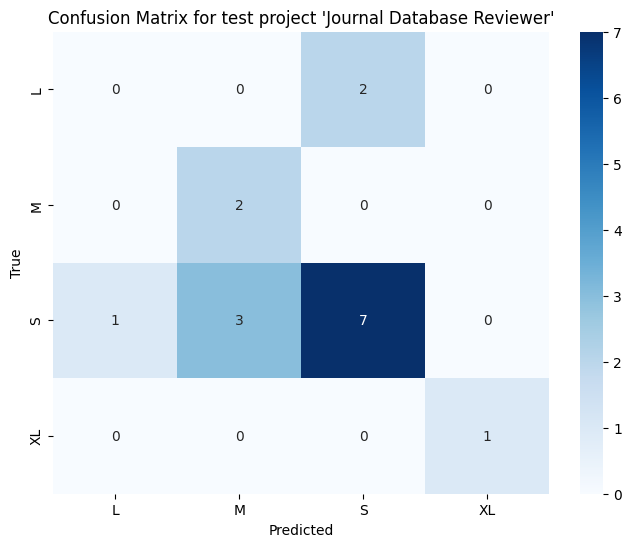

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.20      0.50      0.29         2
           S       0.82      0.82      0.82        11
          XL       1.00      1.00      1.00         1

   micro avg       0.65      0.69      0.67        16
   macro avg       0.50      0.58      0.53        16
weighted avg       0.65      0.69      0.66        16
 samples avg       0.66      0.69      0.67        16



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.65     Recall: 0.6875      Accuracy: 0.625      F1 Score: 0.6607142857142857

Confusion matrix for test project 'Journal Database Reviewer':


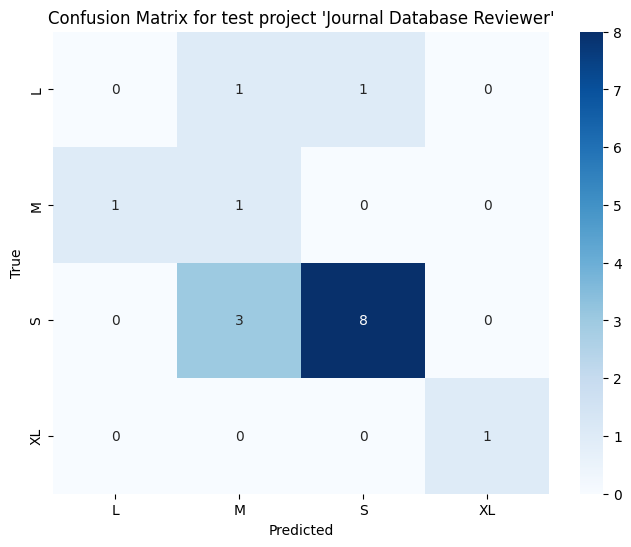

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.55      0.55      0.55        11
          XL       0.00      0.00      0.00         1

   micro avg       0.55      0.38      0.44        16
   macro avg       0.14      0.14      0.14        16
weighted avg       0.38      0.38      0.38        16
 samples avg       0.38      0.38      0.38        16



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.375     Recall: 0.375      Accuracy: 0.375      F1 Score: 0.375

Confusion matrix for test project 'Journal Database Reviewer':


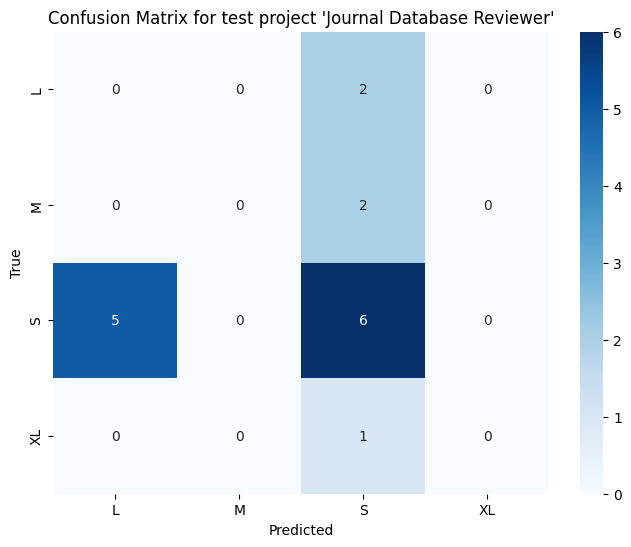

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.67      0.67      0.67         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

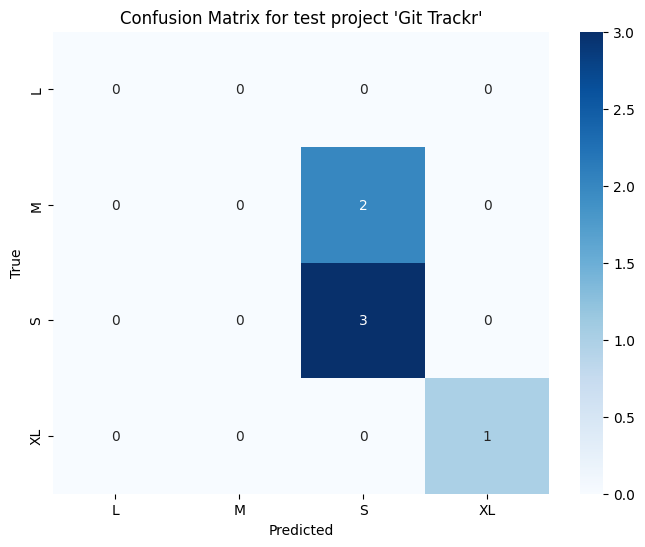

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.44      0.50      0.46         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

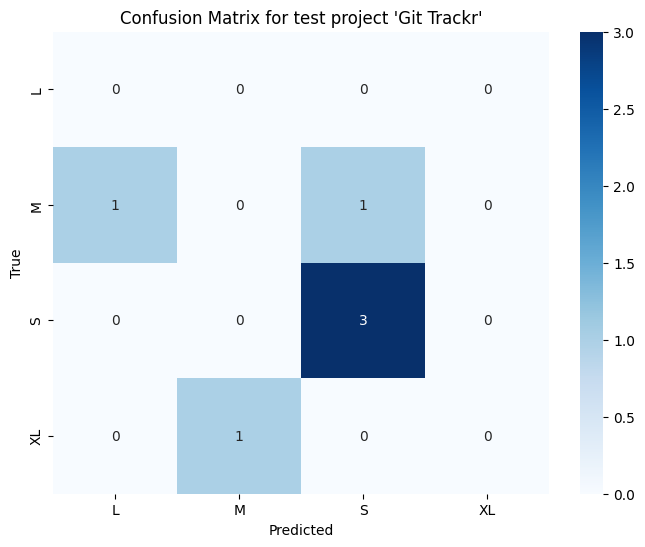

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.33      0.44         6
   macro avg       0.17      0.17      0.17         6
weighted avg       0.33      0.33      0.33         6
 samples avg       0.33      0.33      0.33         6

Precision: 0.3333333333333333     Recall: 0.3333333333333333      Accuracy: 0.3333333333333333      F1 Score: 0.3333333333333333

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

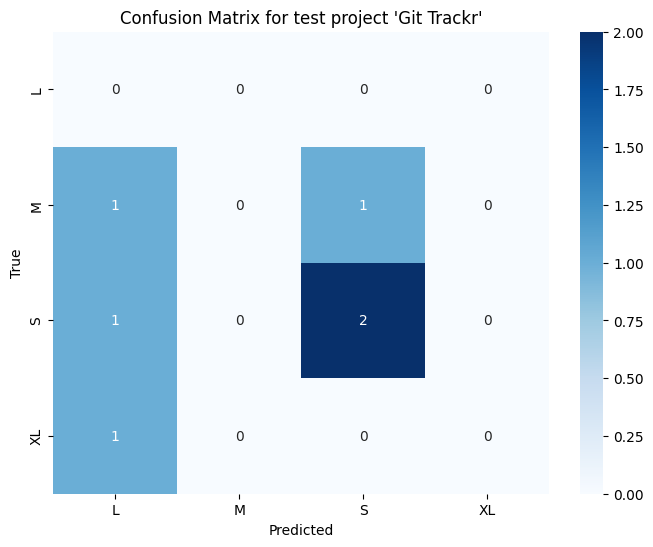

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.50      0.75      0.60         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.50      0.75      0.58         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.25      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

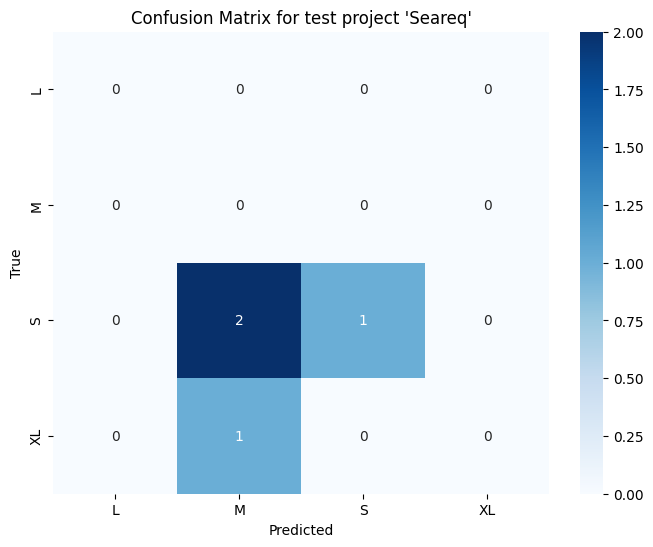

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       0.67      0.67      0.67         3
          XL       1.00      1.00      1.00         1

   micro avg       0.50      0.75      0.60         4
   macro avg       0.42      0.42      0.42         4
weighted avg       0.75      0.75      0.75         4
 samples avg       0.46      0.75      0.54         4

Precision: 0.75     Recall: 0.75      Accuracy: 0.25      F1 Score: 0.75

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

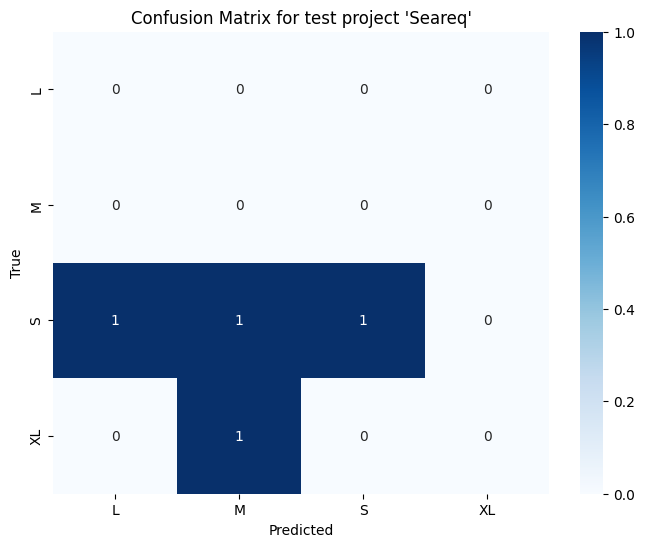

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.50      0.57         4
   macro avg       0.25      0.17      0.20         4
weighted avg       0.75      0.50      0.60         4
 samples avg       0.50      0.50      0.50         4



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.75     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.6000000000000001

Confusion matrix for test project 'Seareq':


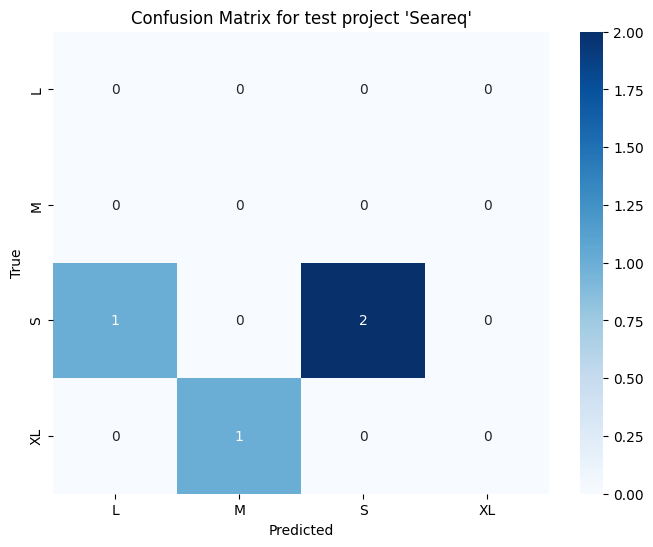

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.75      1.00      0.86        12
          XL       0.00      0.00      0.00         0

   micro avg       0.76      0.72      0.74        18
   macro avg       0.44      0.29      0.29        18
weighted avg       0.83      0.72      0.67        18
 samples avg       0.72      0.72      0.72        18

Precision: 0.8333333333333334     Recall: 0.7222222222222222      Accuracy: 0.7222222222222222      F1 Score: 0.6666666666666665

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

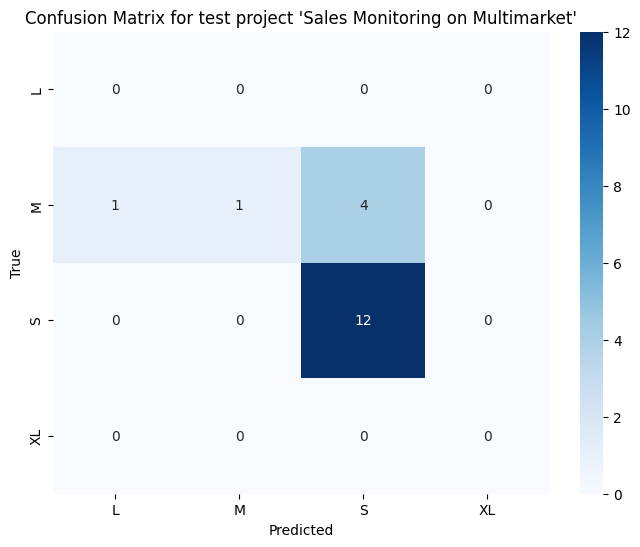

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         6
           S       0.77      0.83      0.80        12
          XL       0.00      0.00      0.00         0

   micro avg       0.80      0.67      0.73        18
   macro avg       0.44      0.29      0.33        18
weighted avg       0.85      0.67      0.70        18
 samples avg       0.64      0.67      0.65        18

Precision: 0.8461538461538463     Recall: 0.6666666666666666      Accuracy: 0.6111111111111112      F1 Score: 0.7000000000000001

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

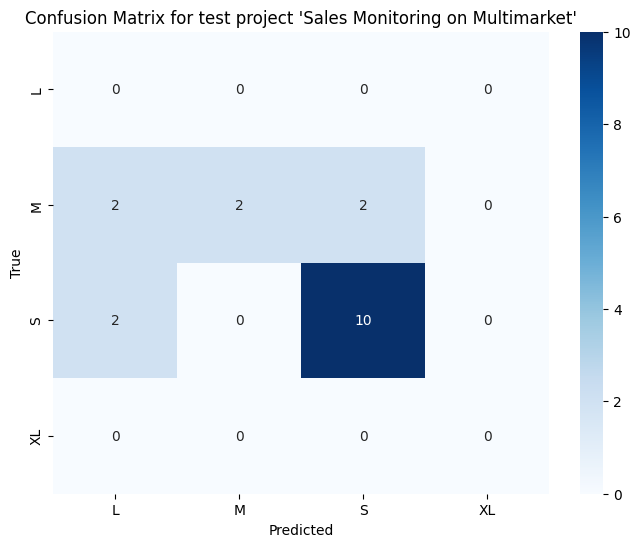

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         6
           S       0.75      0.75      0.75        12
          XL       0.00      0.00      0.00         0

   micro avg       0.75      0.50      0.60        18
   macro avg       0.19      0.19      0.19        18
weighted avg       0.50      0.50      0.50        18
 samples avg       0.50      0.50      0.50        18

Precision: 0.5     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.5

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

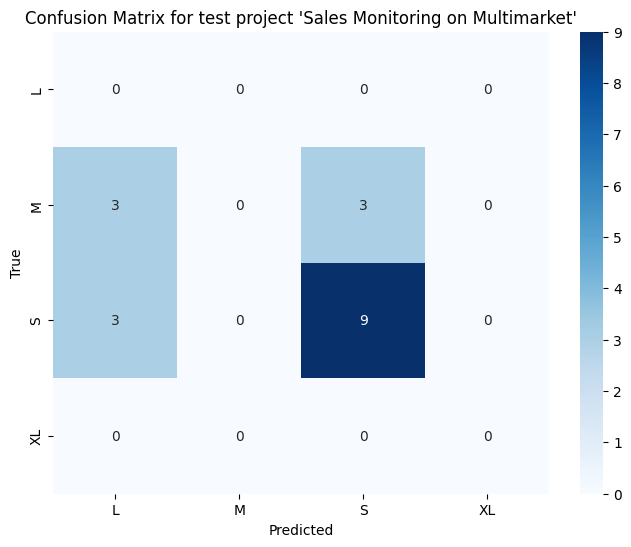

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         8
   macro avg       0.75      0.75      0.75         8
weighted avg       1.00      1.00      1.00         8
 samples avg       1.00      1.00      1.00         8

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

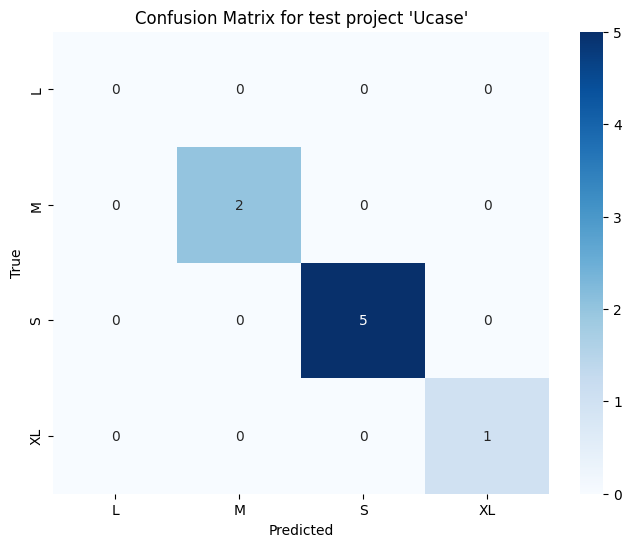

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       0.83      1.00      0.91         5
          XL       1.00      1.00      1.00         1

   micro avg       0.88      0.88      0.88         8
   macro avg       0.71      0.62      0.64         8
weighted avg       0.90      0.88      0.86         8
 samples avg       0.81      0.88      0.83         8

Precision: 0.8958333333333334     Recall: 0.875      Accuracy: 0.75      F1 Score: 0.8598484848484848

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

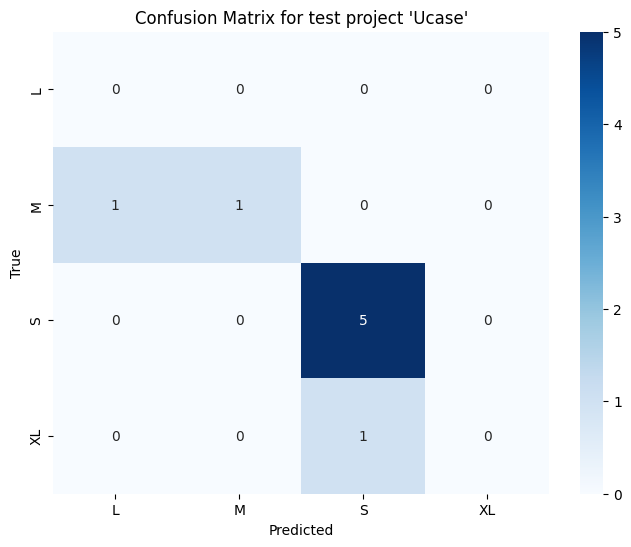

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.57      0.80      0.67         5
          XL       0.00      0.00      0.00         1

   micro avg       0.57      0.50      0.53         8
   macro avg       0.14      0.20      0.17         8
weighted avg       0.36      0.50      0.42         8
 samples avg       0.50      0.50      0.50         8

Precision: 0.3571428571428571     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.41666666666666663

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

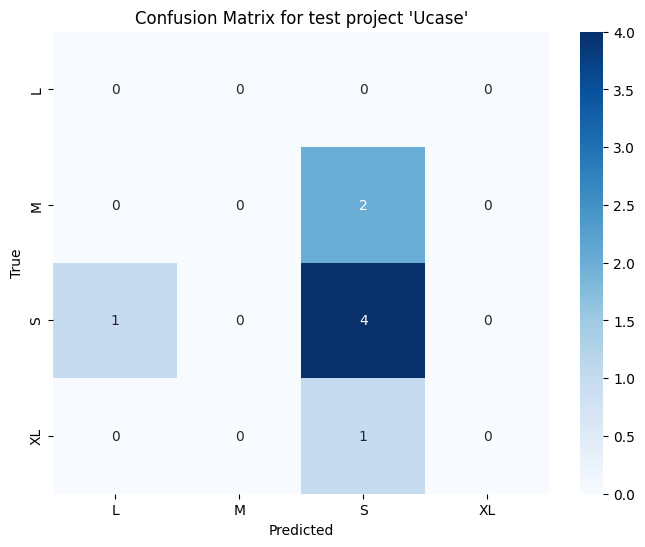

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       0.80      1.00      0.89         8
          XL       1.00      1.00      1.00         2

   micro avg       0.85      0.85      0.85        13
   macro avg       0.70      0.58      0.60        13
weighted avg       0.88      0.85      0.82        13
 samples avg       0.85      0.85      0.85        13

Precision: 0.8769230769230769     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.8162393162393162

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

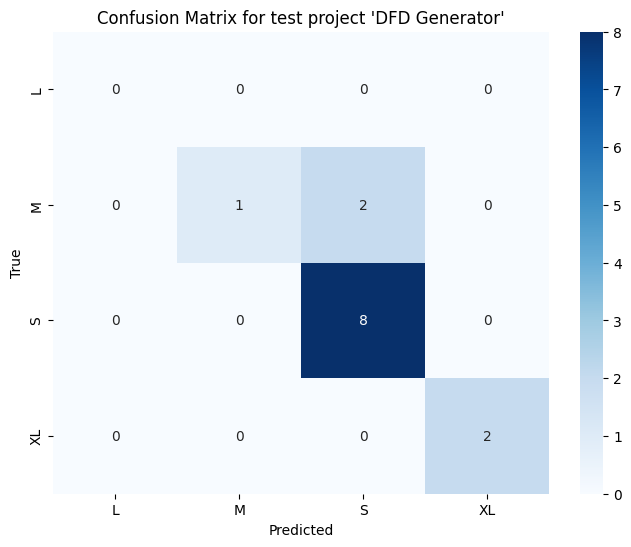

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       0.77      0.77      0.77        13
   macro avg       0.75      0.55      0.61        13
weighted avg       1.00      0.77      0.84        13
 samples avg       0.73      0.77      0.74        13

Precision: 1.0     Recall: 0.7692307692307693      Accuracy: 0.6923076923076923      F1 Score: 0.8435897435897436

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(

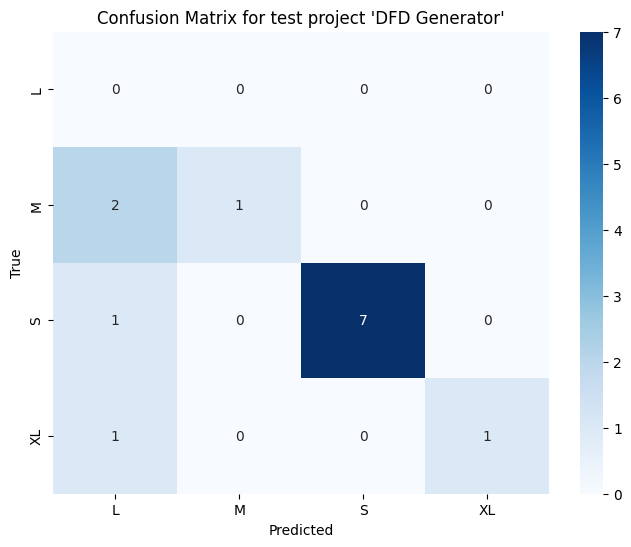

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.62      1.00      0.76         8
          XL       0.00      0.00      0.00         2

   micro avg       0.62      0.62      0.62        13
   macro avg       0.15      0.25      0.19        13
weighted avg       0.38      0.62      0.47        13
 samples avg       0.62      0.62      0.62        13

Precision: 0.37869822485207105     Recall: 0.6153846153846154      Accuracy: 0.6153846153846154      F1 Score: 0.4688644688644689

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

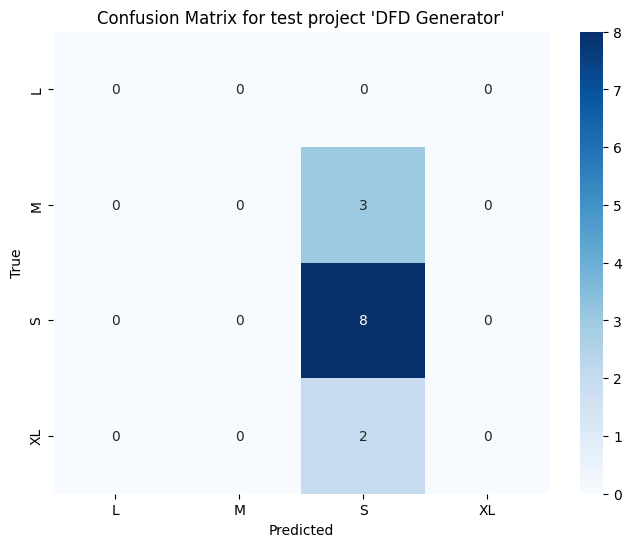

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.75      0.86         8
          XL       1.00      1.00      1.00         2

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.63        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8658008658008658

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

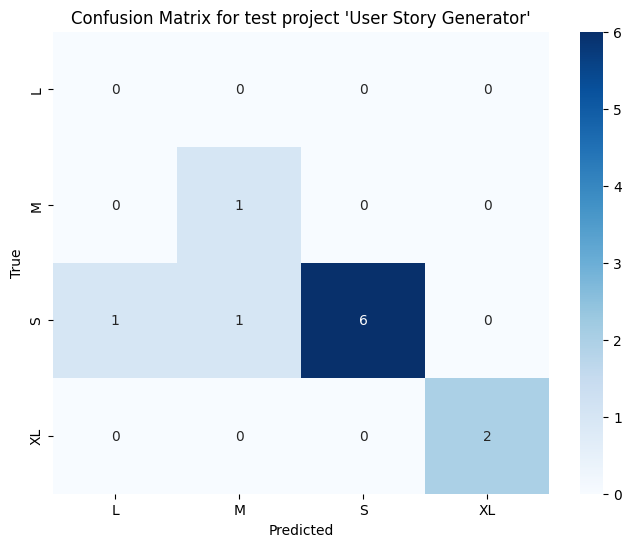

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.20      1.00      0.33         1
           S       0.80      1.00      0.89         8
          XL       1.00      1.00      1.00         2

   micro avg       0.65      1.00      0.79        11
   macro avg       0.50      0.75      0.56        11
weighted avg       0.78      1.00      0.86        11
 samples avg       0.79      1.00      0.85        11

Precision: 0.781818181818182     Recall: 1.0      Accuracy: 0.6363636363636364      F1 Score: 0.8585858585858586

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

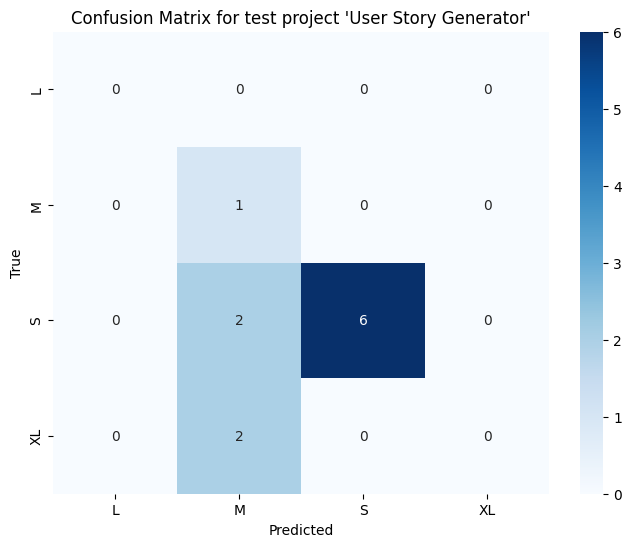

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.73      1.00      0.84         8
          XL       0.00      0.00      0.00         2

   micro avg       0.73      0.73      0.73        11
   macro avg       0.18      0.25      0.21        11
weighted avg       0.53      0.73      0.61        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.5289256198347108     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.6124401913875599

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

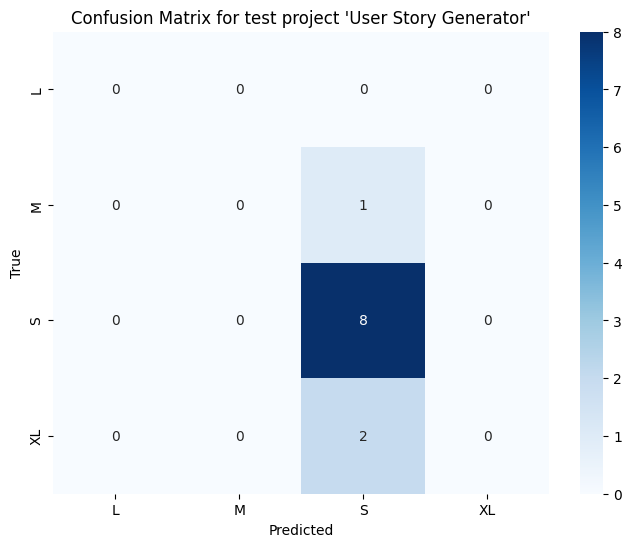

In [62]:
# Model (Numerik 3)
accuracy_list_Adaboost_nt31 = []
accuracy_list_DecisionTree_nt31 = []
accuracy_list_MultinomialNB_nt31 = []
precision_list_Adaboost_nt31 = []
precision_list_DecisionTree_nt31 = []
precision_list_MultinomialNB_nt31 = []
recall_list_Adaboost_nt31 = []
recall_list_DecisionTree_nt31 = []
recall_list_MultinomialNB_nt31 = []
f1_score_list_Adaboost_nt31 = []
f1_score_list_DecisionTree_nt31 = []
f1_score_list_MultinomialNB_nt31 = []
mean_accuracy_nt31 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_num3.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_num3.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt31.append(accuracy)
    precision_list_Adaboost_nt31.append(precision)
    recall_list_Adaboost_nt31.append(recall)
    f1_score_list_Adaboost_nt31.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt31.append(accuracy)
    precision_list_DecisionTree_nt31.append(precision)
    recall_list_DecisionTree_nt31.append(recall)
    f1_score_list_DecisionTree_nt31.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt31.append(accuracy)
    precision_list_MultinomialNB_nt31.append(precision)
    recall_list_MultinomialNB_nt31.append(recall)
    f1_score_list_MultinomialNB_nt31.append(f1)

In [63]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt31': precision_list_Adaboost_nt31,
    'Recall_Adaboost_nt31': recall_list_Adaboost_nt31,
    'Accuracy_Adaboost_nt31': accuracy_list_Adaboost_nt31,
    'F1_Score_Adaboost_nt31': f1_score_list_Adaboost_nt31,
    'Precision_DecisionTree_nt31': precision_list_DecisionTree_nt31,
    'Recall_DecisionTree_nt31': recall_list_DecisionTree_nt31,
    'Accuracy_DecisionTree_nt31': accuracy_list_DecisionTree_nt31,
    'F1_Score_DecisionTree_nt31': f1_score_list_DecisionTree_nt31,
    'Precision_MultinomialNB_nt31': precision_list_MultinomialNB_nt31,
    'Recall_MultinomialNB_nt31': recall_list_MultinomialNB_nt31,
    'Accuracy_MultinomialNB_nt31': accuracy_list_MultinomialNB_nt31,
    'F1_Score_MultinomialNB_nt31': f1_score_list_MultinomialNB_nt31,
}

# Buat DataFrame
df_result_nt31 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt31


,Project,Precision_Adaboost_nt31,Recall_Adaboost_nt31,Accuracy_Adaboost_nt31,F1_Score_Adaboost_nt31,Precision_DecisionTree_nt31,Recall_DecisionTree_nt31,Accuracy_DecisionTree_nt31,F1_Score_DecisionTree_nt31,Precision_MultinomialNB_nt31,Recall_MultinomialNB_nt31,Accuracy_MultinomialNB_nt31,F1_Score_MultinomialNB_nt31
0,Akobesi,0.534037,0.716535,0.614173,0.606238,0.585592,0.574803,0.574803,0.565000,0.491103,0.700787,0.692913,0.577501
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,1.000000,0.909091,0.909091,0.951872,1.000000,0.818182,0.818182,0.897727,0.669421,0.818182,0.818182,0.736364
3,Journal Database Reviewer,0.685417,0.812500,0.625000,0.731755,0.650000,0.687500,0.625000,0.660714,0.375000,0.375000,0.375000,0.375000
4,Git Trackr,0.466667,0.666667,0.666667,0.541667,0.541667,0.666667,0.500000,0.595238,0.333333,0.333333,0.333333,0.333333
5,Seareq,1.000000,0.750000,0.250000,0.850000,0.750000,0.750000,0.250000,0.750000,0.750000,0.500000,0.500000,0.600000
6,Sales Monitoring on Multimarket,0.833333,0.722222,0.722222,0.666667,0.846154,0.666667,0.611111,0.700000,0.500000,0.500000,0.500000,0.500000
7,Ucase,1.000000,1.000000,1.000000,1.000000,0.895833,0.875000,0.750000,0.859848,0.357143,0.500000,0.500000,0.416667
8,DFD Generator,0.876923,0.846154,0.846154,0.816239,1.000000,0.769231,0.692308,0.843590,0.378698,0.615385,0.615385,0.468864
9,User Story Generator,0.954545,0.818182,0.818182,0.865801,0.781818,1.000000,0.636364,0.858586,0.528926,0.727273,0.727273,0.612440


In [64]:
# Mean Accuracy
mean_accuracy_nt31.append(np.mean(accuracy_list_Adaboost_nt31))
mean_accuracy_nt31.append(np.mean(accuracy_list_DecisionTree_nt31))
mean_accuracy_nt31.append(np.mean(accuracy_list_MultinomialNB_nt31))
print("Mean Accuracy")
print(mean_accuracy_nt31)

Mean Accuracy
[0.7451488690661919, 0.6457767407570558, 0.5728752546665933]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.71      0.71       127
   macro avg       0.43      0.26      0.22       127
weighted avg       0.74      0.71      0.59       127
 samples avg       0.70      0.71      0.71       127

Precision: 0.7351974703949408     Recall: 0.7086614173228346      Accuracy: 0.7007874015748031      F1 Score: 0.5927566345873432

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


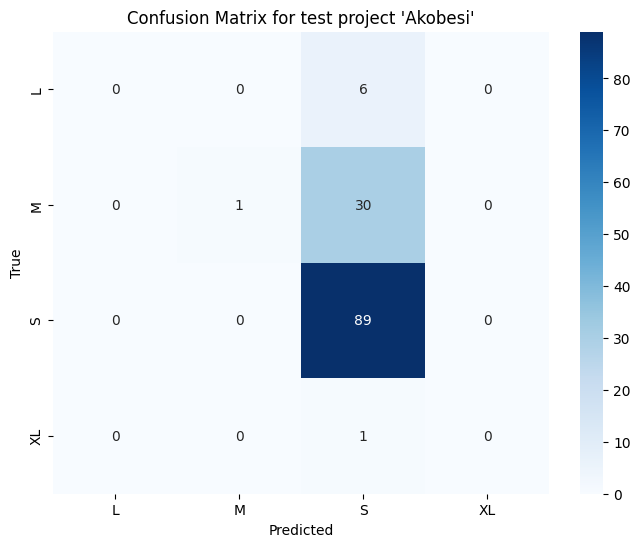

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.49      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127

Precision: 0.49110298220596443     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5775007290755322

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


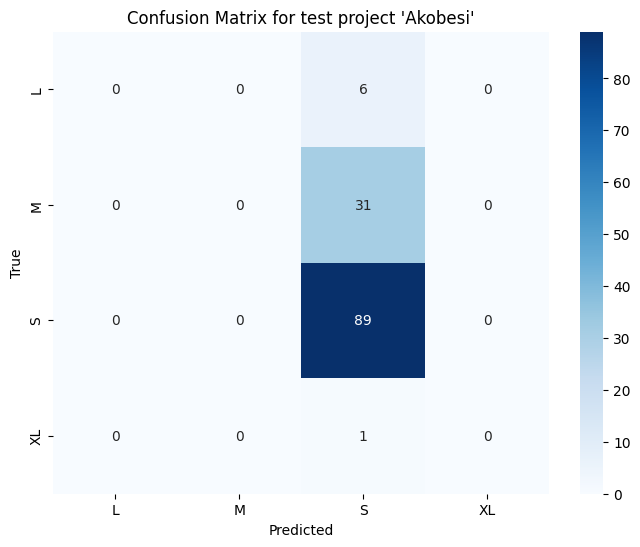

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.72      0.87      0.79        89
          XL       0.03      1.00      0.05         1

   micro avg       0.54      0.62      0.58       127
   macro avg       0.44      0.47      0.22       127
weighted avg       0.75      0.62      0.57       127
 samples avg       0.57      0.62      0.59       127

Precision: 0.7486013385638081     Recall: 0.6220472440944882      Accuracy: 0.5118110236220472      F1 Score: 0.5662682789651293

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

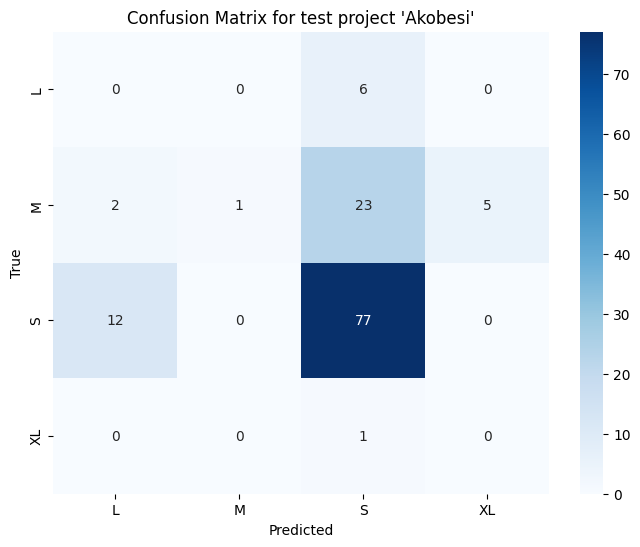

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

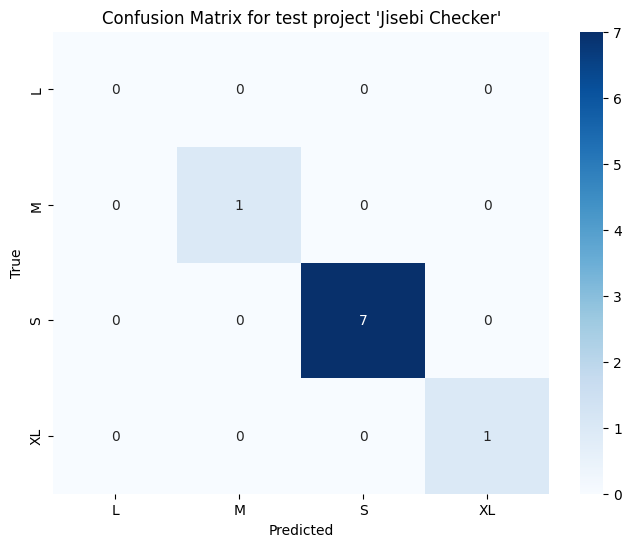

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

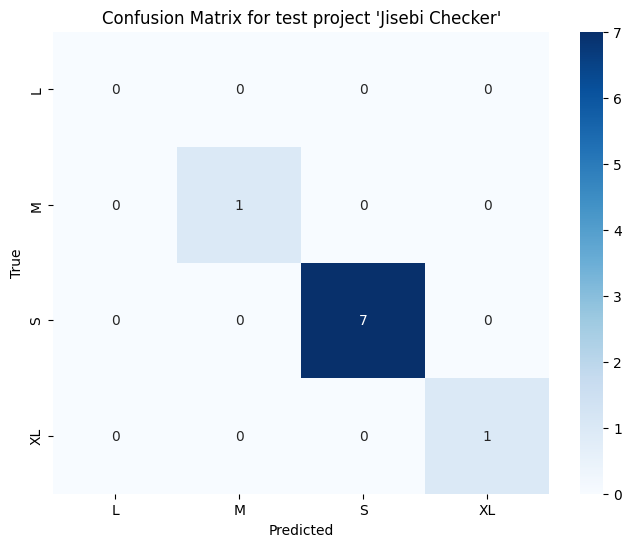

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.60      0.67      0.63         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1760: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", 

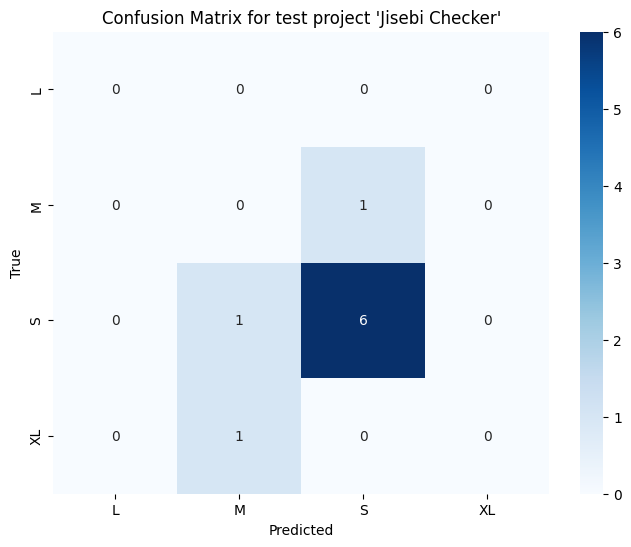

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9215686274509803

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

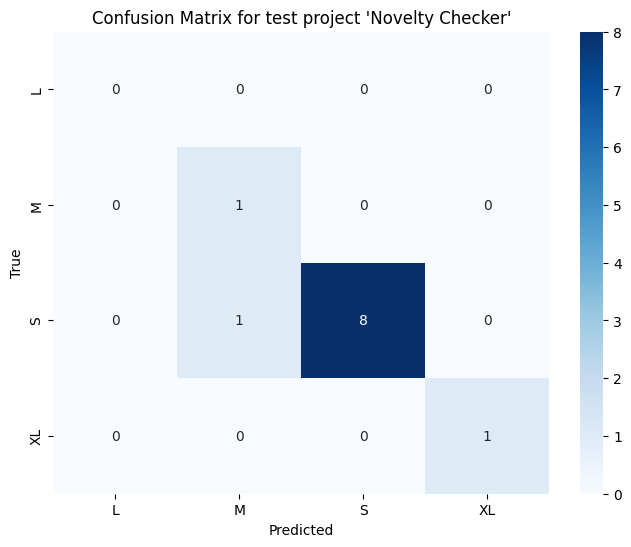

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9215686274509803

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

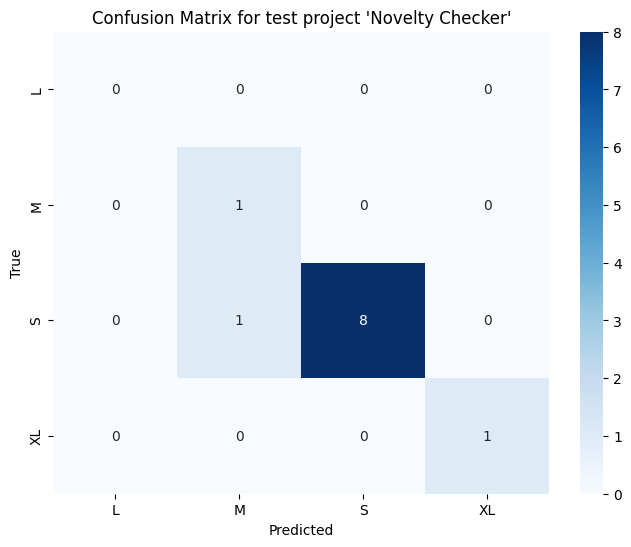

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.80      0.89      0.84         9
          XL       0.00      0.00      0.00         1

   micro avg       0.80      0.73      0.76        11
   macro avg       0.20      0.22      0.21        11
weighted avg       0.65      0.73      0.69        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.6545454545454545     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.6889952153110048

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

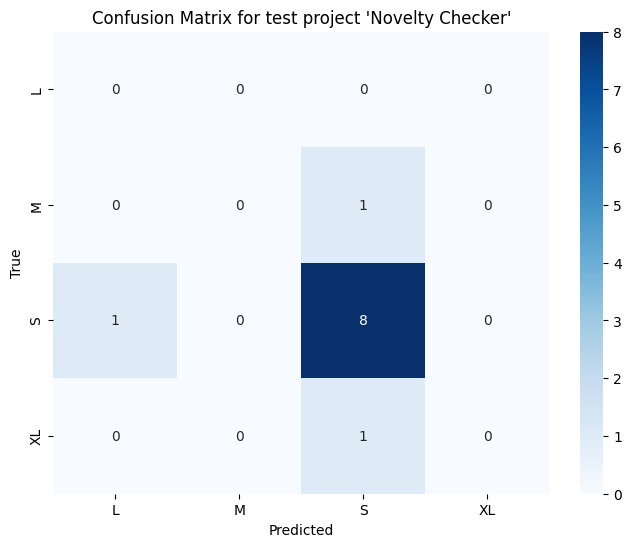

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


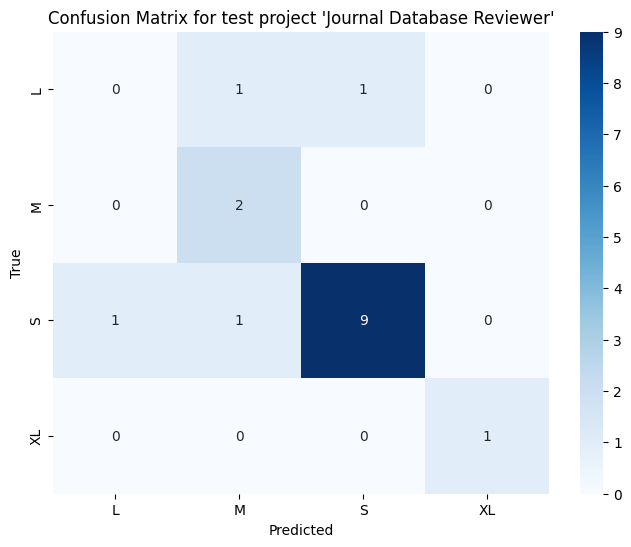

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

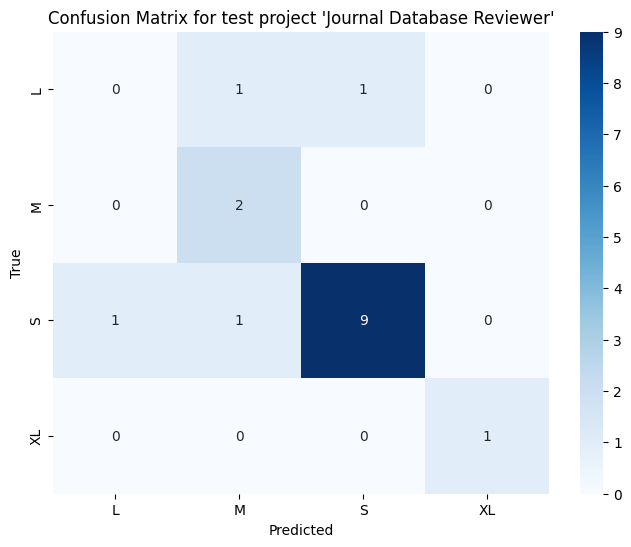

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       1.00      0.50      0.67         2
           M       0.00      0.00      0.00         2
           S       0.62      0.73      0.67        11
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.56      0.53        16
   macro avg       0.40      0.31      0.33        16
weighted avg       0.55      0.56      0.54        16
 samples avg       0.52      0.56      0.53        16



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.5480769230769231     Recall: 0.5625      Accuracy: 0.5      F1 Score: 0.5416666666666667

Confusion matrix for test project 'Journal Database Reviewer':


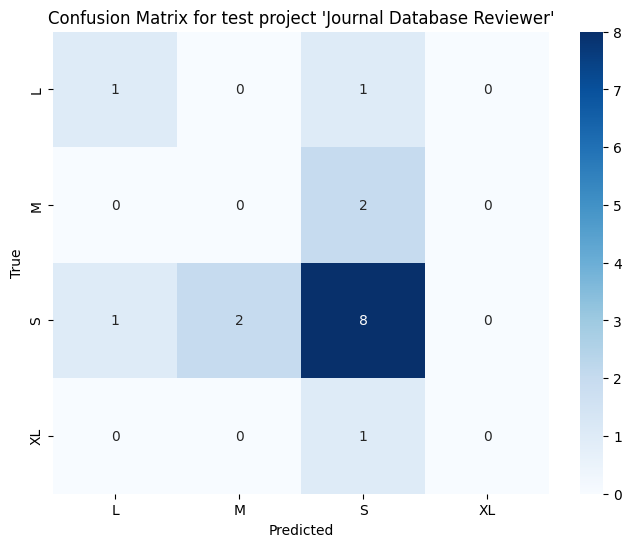

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

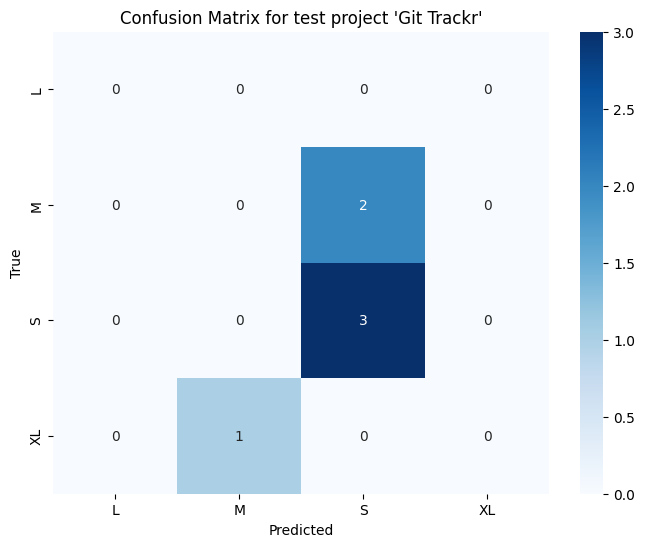

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.67      0.67      0.67         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

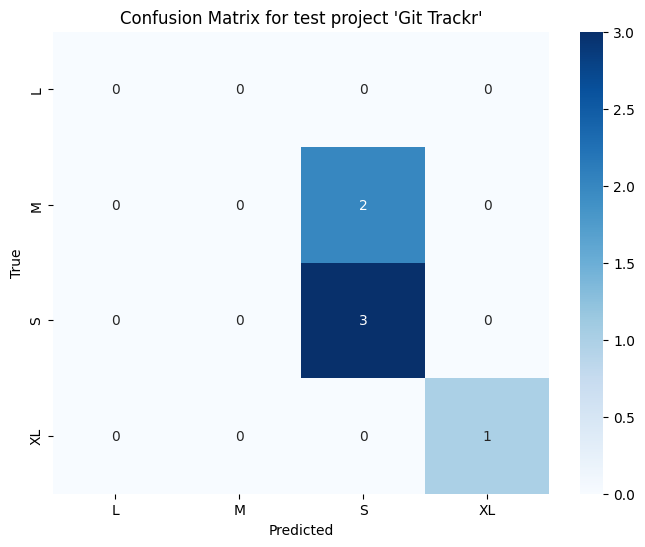

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

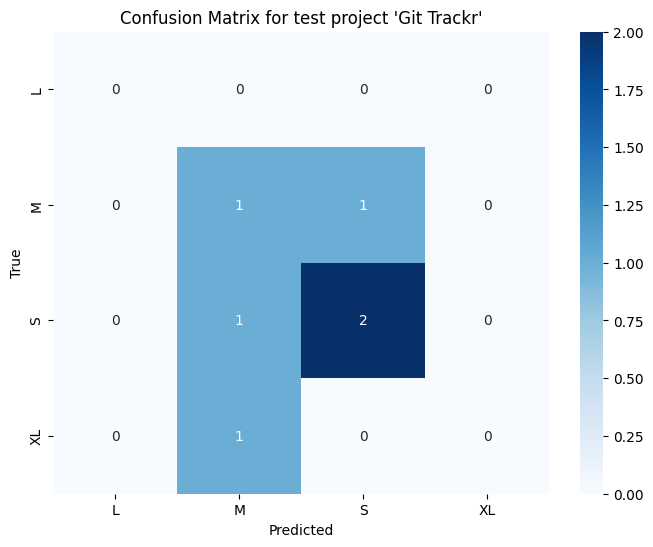

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      1.00      1.00         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         4
   macro avg       0.50      0.50      0.50         4
weighted avg       1.00      1.00      1.00         4
 samples avg       1.00      1.00      1.00         4

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

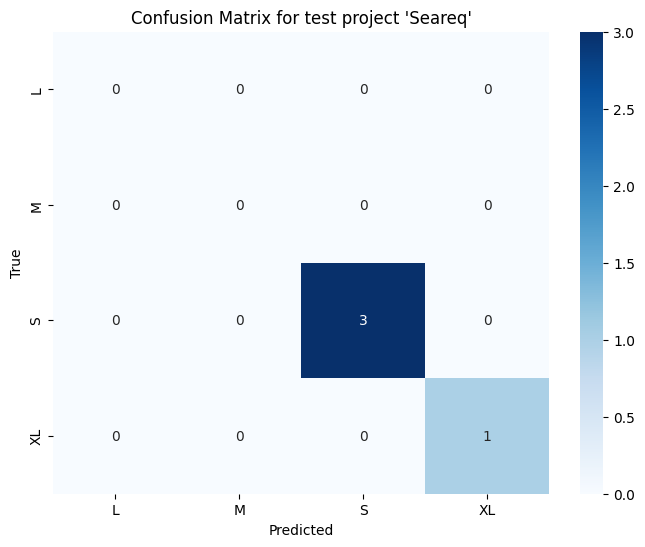

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      1.00      1.00         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      1.00      0.80         4
   macro avg       0.50      0.50      0.50         4
weighted avg       1.00      1.00      1.00         4
 samples avg       0.75      1.00      0.83         4

Precision: 1.0     Recall: 1.0      Accuracy: 0.5      F1 Score: 1.0

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

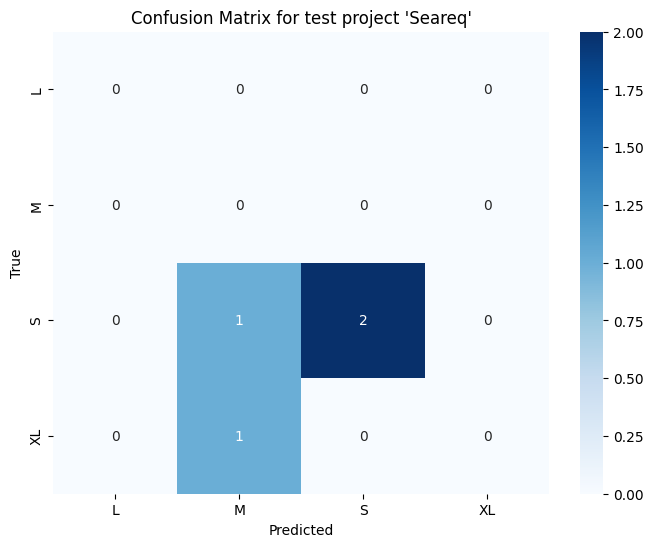

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.50      1.00      0.67         1

   micro avg       0.50      0.75      0.60         4
   macro avg       0.38      0.42      0.37         4
weighted avg       0.88      0.75      0.77         4
 samples avg       0.62      0.75      0.67         4

Precision: 0.875     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.7666666666666667

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

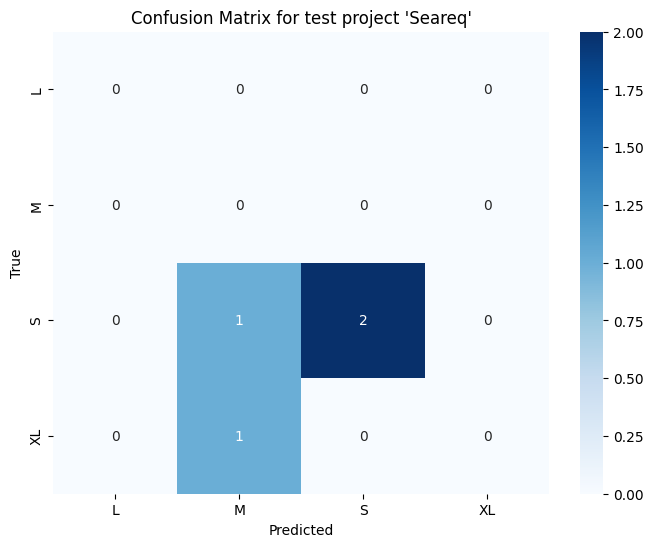

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.72      0.72      0.72        18
   macro avg       0.43      0.29      0.28        18
weighted avg       0.80      0.72      0.65        18
 samples avg       0.72      0.72      0.72        18

Precision: 0.803921568627451     Recall: 0.7222222222222222      Accuracy: 0.7222222222222222      F1 Score: 0.6469622331691297

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

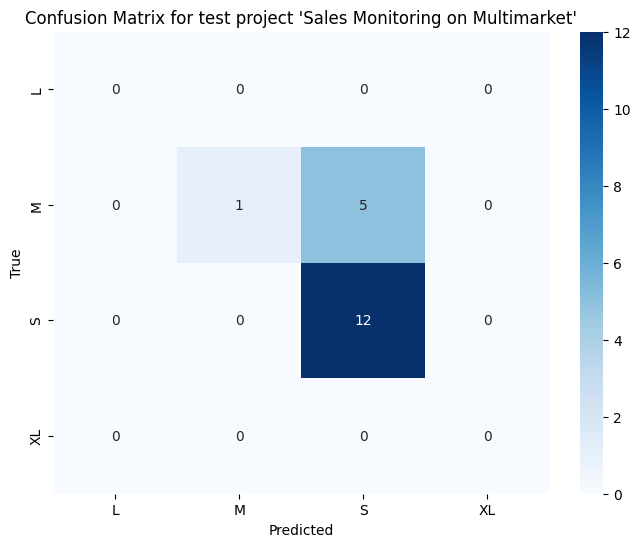

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.74      0.78      0.76        18
   macro avg       0.43      0.33      0.33        18
weighted avg       0.80      0.78      0.72        18
 samples avg       0.75      0.78      0.76        18

Precision: 0.803921568627451     Recall: 0.7777777777777778      Accuracy: 0.7222222222222222      F1 Score: 0.7183908045977012

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

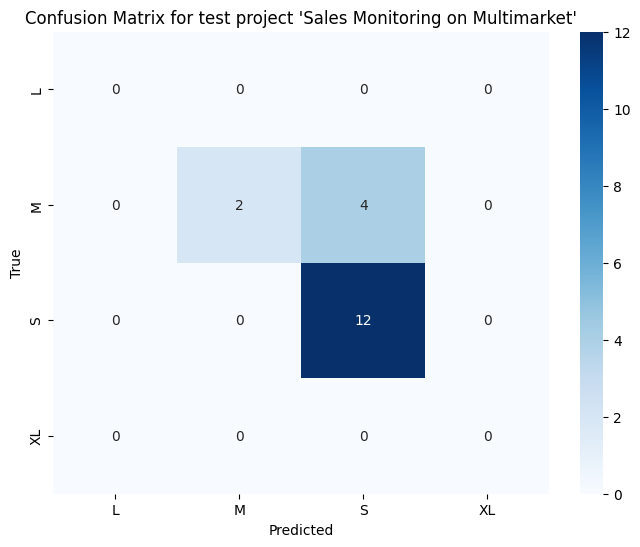

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.75      0.75      0.75        12
          XL       0.00      0.00      0.00         0

   micro avg       0.67      0.56      0.61        18
   macro avg       0.44      0.23      0.26        18
weighted avg       0.83      0.56      0.60        18
 samples avg       0.56      0.56      0.56        18

Precision: 0.8333333333333334     Recall: 0.5555555555555556      Accuracy: 0.5555555555555556      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

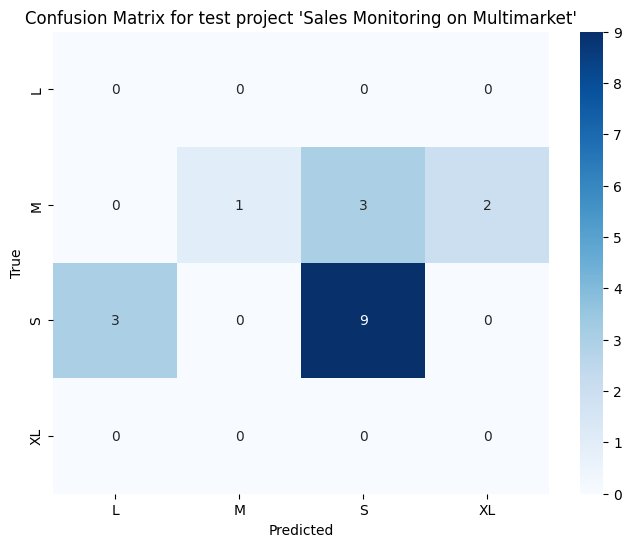

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

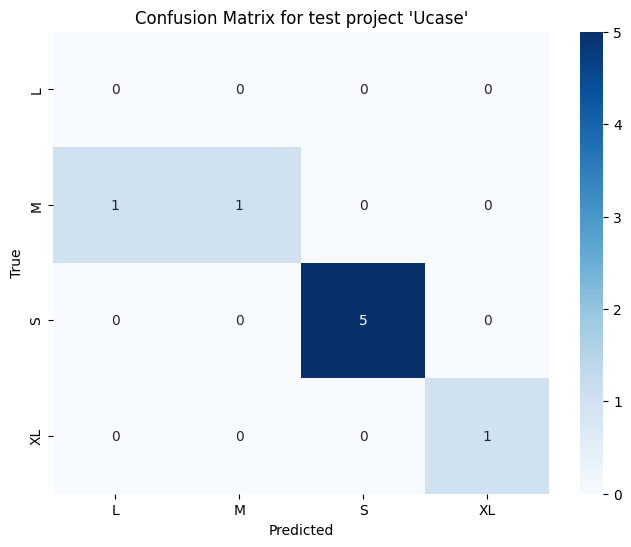

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

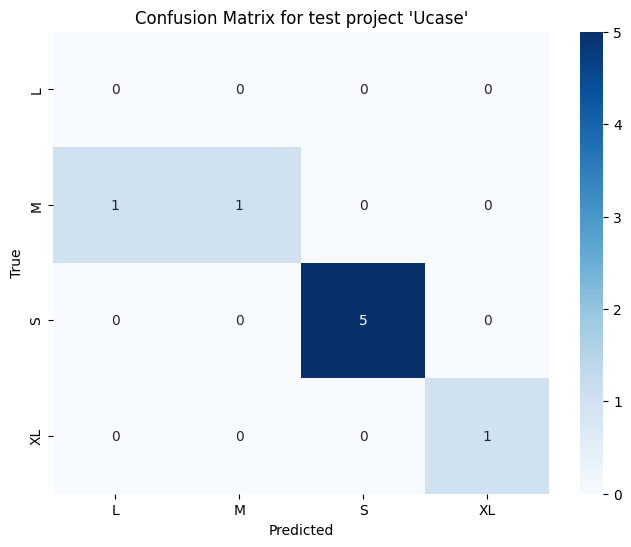

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.57      0.80      0.67         5
          XL       0.00      0.00      0.00         1

   micro avg       0.57      0.50      0.53         8
   macro avg       0.14      0.20      0.17         8
weighted avg       0.36      0.50      0.42         8
 samples avg       0.50      0.50      0.50         8

Precision: 0.3571428571428571     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.41666666666666663

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

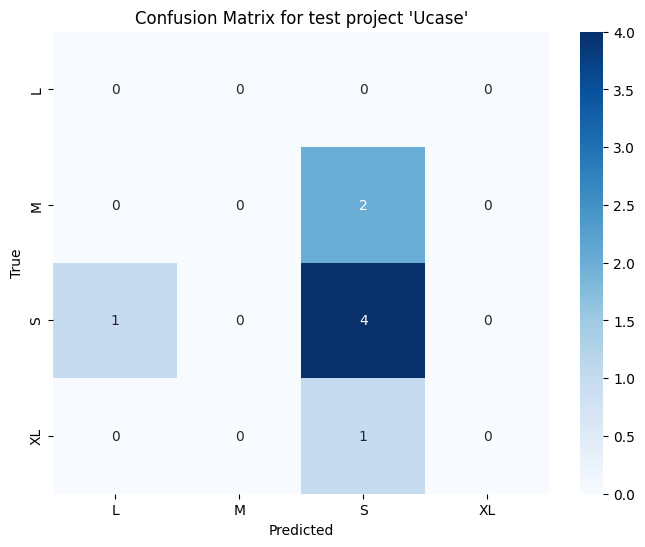

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.85      0.88        13
   macro avg       0.72      0.58      0.61        13
weighted avg       0.93      0.85      0.85        13
 samples avg       0.85      0.85      0.85        13

Precision: 0.9316239316239316     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.8484162895927602

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

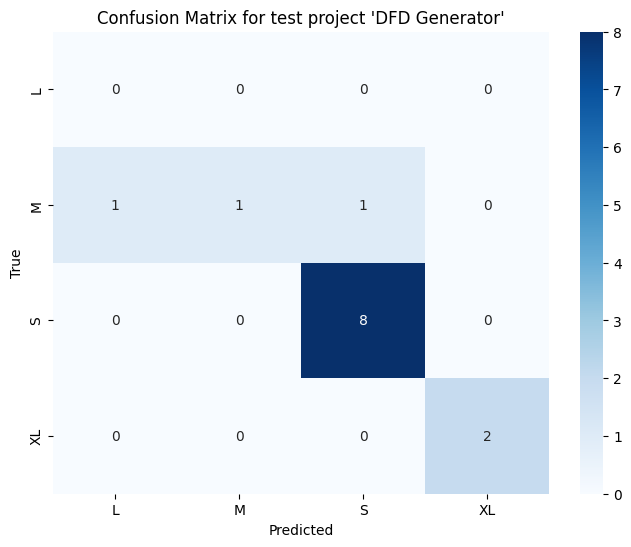

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.92      0.92        13
   macro avg       0.72      0.67      0.69        13
weighted avg       0.93      0.92      0.92        13
 samples avg       0.92      0.92      0.92        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.9316239316239316     Recall: 0.9230769230769231      Accuracy: 0.9230769230769231      F1 Score: 0.9176470588235295

Confusion matrix for test project 'DFD Generator':


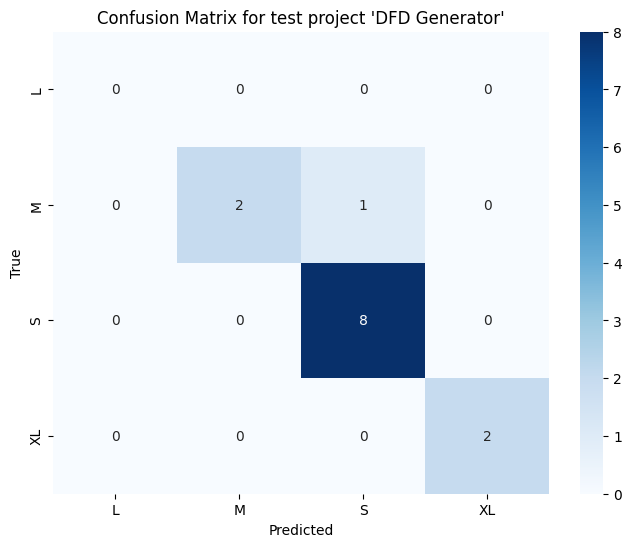

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.58      0.88      0.70         8
          XL       0.00      0.00      0.00         2

   micro avg       0.58      0.54      0.56        13
   macro avg       0.15      0.22      0.18        13
weighted avg       0.36      0.54      0.43        13
 samples avg       0.54      0.54      0.54        13

Precision: 0.358974358974359     Recall: 0.5384615384615384      Accuracy: 0.5384615384615384      F1 Score: 0.4307692307692308

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

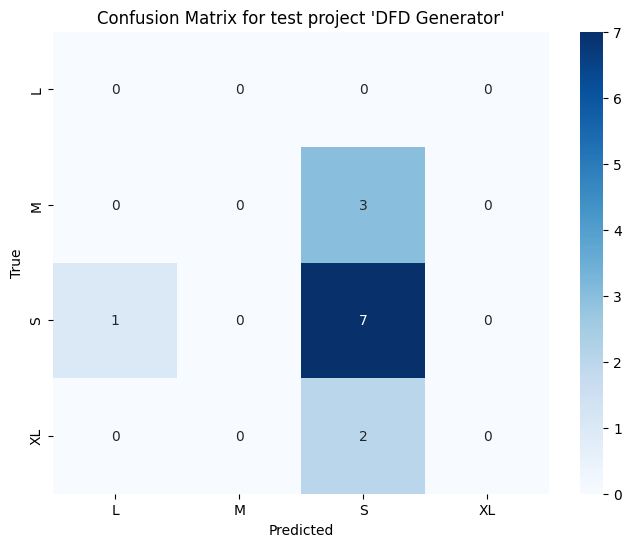

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.73        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9515151515151515

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

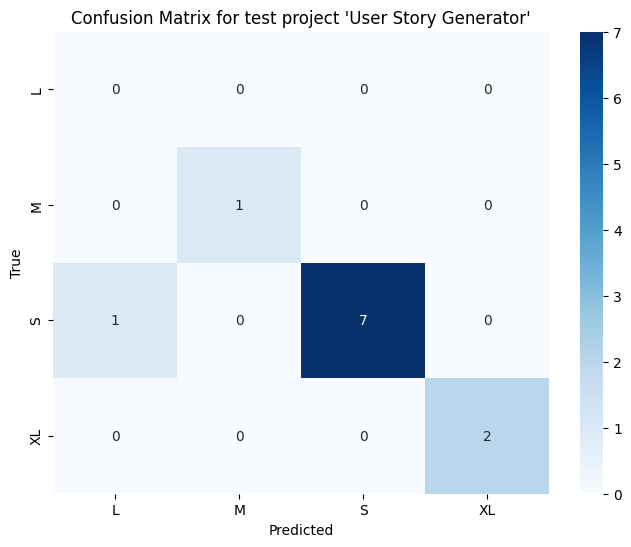

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      1.00      1.00         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      1.00      0.96        11
   macro avg       0.62      0.75      0.67        11
weighted avg       0.95      1.00      0.97        11
 samples avg       0.95      1.00      0.97        11

Precision: 0.9545454545454546     Recall: 1.0      Accuracy: 0.9090909090909091      F1 Score: 0.9696969696969696

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

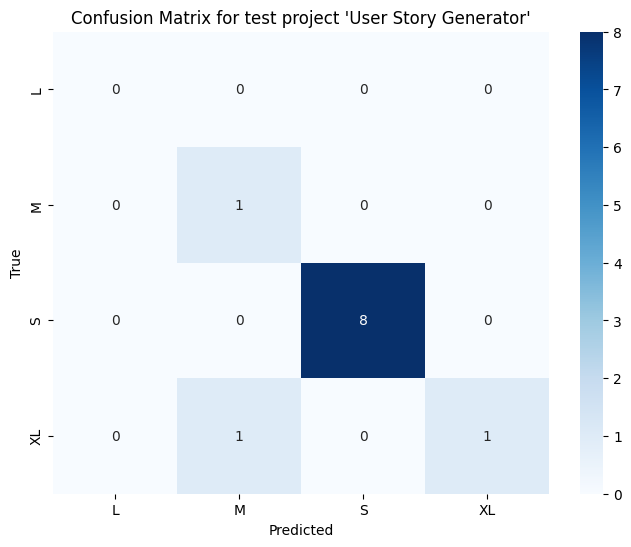

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.70      0.88      0.78         8
          XL       0.00      0.00      0.00         2

   micro avg       0.70      0.64      0.67        11
   macro avg       0.17      0.22      0.19        11
weighted avg       0.51      0.64      0.57        11
 samples avg       0.64      0.64      0.64        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.509090909090909     Recall: 0.6363636363636364      Accuracy: 0.6363636363636364      F1 Score: 0.5656565656565656

Confusion matrix for test project 'User Story Generator':


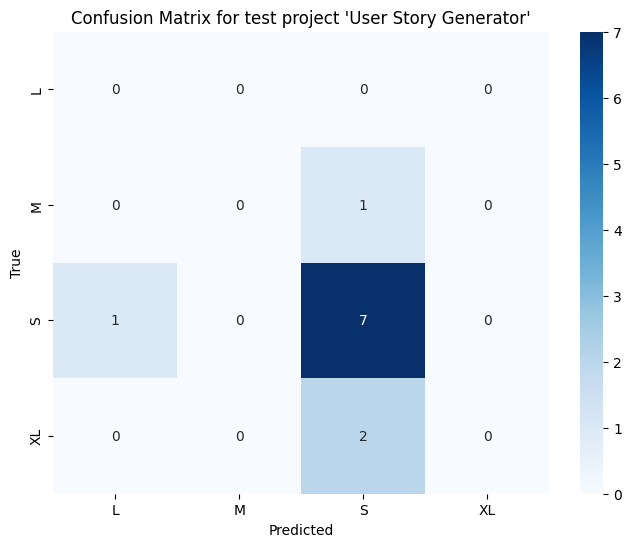

In [65]:
# Model (Numerik 3)
accuracy_list_Adaboost_nt32 = []
accuracy_list_DecisionTree_nt32 = []
accuracy_list_MultinomialNB_nt32 = []
precision_list_Adaboost_nt32 = []
precision_list_DecisionTree_nt32 = []
precision_list_MultinomialNB_nt32 = []
recall_list_Adaboost_nt32 = []
recall_list_DecisionTree_nt32 = []
recall_list_MultinomialNB_nt32 = []
f1_score_list_Adaboost_nt32 = []
f1_score_list_DecisionTree_nt32 = []
f1_score_list_MultinomialNB_nt32 = []
mean_accuracy_nt32 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_user_story_num3.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_user_story_num3.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt32.append(accuracy)
    precision_list_Adaboost_nt32.append(precision)
    recall_list_Adaboost_nt32.append(recall)
    f1_score_list_Adaboost_nt32.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt32.append(accuracy)
    precision_list_DecisionTree_nt32.append(precision)
    recall_list_DecisionTree_nt32.append(recall)
    f1_score_list_DecisionTree_nt32.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt32.append(accuracy)
    precision_list_MultinomialNB_nt32.append(precision)
    recall_list_MultinomialNB_nt32.append(recall)
    f1_score_list_MultinomialNB_nt32.append(f1)

In [66]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt32': precision_list_Adaboost_nt32,
    'Recall_Adaboost_nt32': recall_list_Adaboost_nt32,
    'Accuracy_Adaboost_nt32': accuracy_list_Adaboost_nt32,
    'F1_Score_Adaboost_nt32': f1_score_list_Adaboost_nt32,
    'Precision_DecisionTree_nt32': precision_list_DecisionTree_nt32,
    'Recall_DecisionTree_nt32': recall_list_DecisionTree_nt32,
    'Accuracy_DecisionTree_nt32': accuracy_list_DecisionTree_nt32,
    'F1_Score_DecisionTree_nt32': f1_score_list_DecisionTree_nt32,
    'Precision_MultinomialNB_nt32': precision_list_MultinomialNB_nt32,
    'Recall_MultinomialNB_nt32': recall_list_MultinomialNB_nt32,
    'Accuracy_MultinomialNB_nt32': accuracy_list_MultinomialNB_nt32,
    'F1_Score_MultinomialNB_nt32': f1_score_list_MultinomialNB_nt32,
}

# Buat DataFrame
df_result_nt32 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt32


,Project,Precision_Adaboost_nt32,Recall_Adaboost_nt32,Accuracy_Adaboost_nt32,F1_Score_Adaboost_nt32,Precision_DecisionTree_nt32,Recall_DecisionTree_nt32,Accuracy_DecisionTree_nt32,F1_Score_DecisionTree_nt32,Precision_MultinomialNB_nt32,Recall_MultinomialNB_nt32,Accuracy_MultinomialNB_nt32,F1_Score_MultinomialNB_nt32
0,Akobesi,0.735197,0.708661,0.700787,0.592757,0.491103,0.700787,0.700787,0.577501,0.748601,0.622047,0.511811,0.566268
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,0.954545,0.909091,0.909091,0.921569,0.954545,0.909091,0.909091,0.921569,0.654545,0.727273,0.727273,0.688995
3,Journal Database Reviewer,0.743750,0.750000,0.750000,0.735119,0.743750,0.750000,0.750000,0.735119,0.548077,0.562500,0.500000,0.541667
4,Git Trackr,0.466667,0.666667,0.500000,0.541667,0.466667,0.666667,0.666667,0.541667,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.500000,1.000000,0.875000,0.750000,0.500000,0.766667
6,Sales Monitoring on Multimarket,0.803922,0.722222,0.722222,0.646962,0.803922,0.777778,0.722222,0.718391,0.833333,0.555556,0.555556,0.595238
7,Ucase,1.000000,0.875000,0.875000,0.916667,1.000000,0.875000,0.875000,0.916667,0.357143,0.500000,0.500000,0.416667
8,DFD Generator,0.931624,0.846154,0.846154,0.848416,0.931624,0.923077,0.923077,0.917647,0.358974,0.538462,0.538462,0.430769
9,User Story Generator,1.000000,0.909091,0.909091,0.951515,0.954545,1.000000,0.909091,0.969697,0.509091,0.636364,0.636364,0.565657


In [67]:
# Mean Accuracy
mean_accuracy_nt32.append(np.mean(accuracy_list_Adaboost_nt32))
mean_accuracy_nt32.append(np.mean(accuracy_list_DecisionTree_nt32))
mean_accuracy_nt32.append(np.mean(accuracy_list_MultinomialNB_nt32))
print("Mean Accuracy")
print(mean_accuracy_nt32)

Mean Accuracy
[0.821234528813269, 0.7955935031722434, 0.5636131147942172]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.33      0.03      0.06        31
           S       0.68      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.63      0.65       127
   macro avg       0.25      0.23      0.21       127
weighted avg       0.56      0.63      0.55       127
 samples avg       0.63      0.63      0.63       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.5586252149515792     Recall: 0.6299212598425197      Accuracy: 0.6299212598425197      F1 Score: 0.5544775697872774

Confusion matrix for test project 'Akobesi':


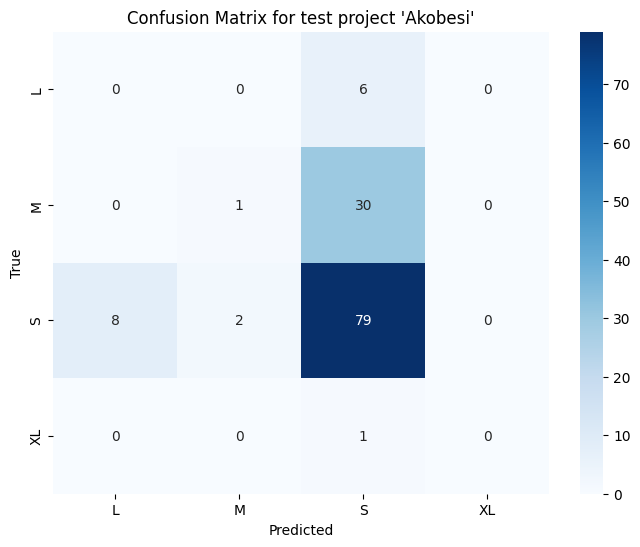

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.68      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.68      0.62      0.65       127
   macro avg       0.17      0.22      0.19       127
weighted avg       0.48      0.62      0.54       127
 samples avg       0.62      0.62      0.62       127

Precision: 0.47726038555525385     Recall: 0.6220472440944882      Accuracy: 0.6220472440944882      F1 Score: 0.5401190704820434

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

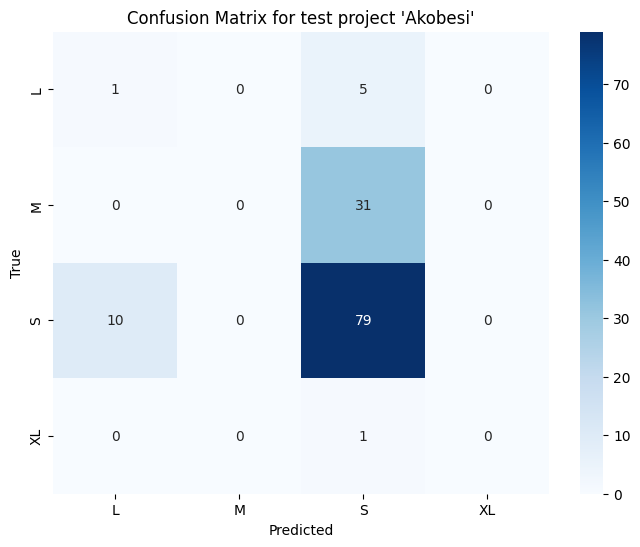

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.71      0.88      0.78        89
          XL       0.04      1.00      0.08         1

   micro avg       0.60      0.63      0.61       127
   macro avg       0.44      0.48      0.23       127
weighted avg       0.74      0.63      0.57       127
 samples avg       0.61      0.63      0.62       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.7413588123618935     Recall: 0.6299212598425197      Accuracy: 0.5984251968503937      F1 Score: 0.5652730516097547

Confusion matrix for test project 'Akobesi':


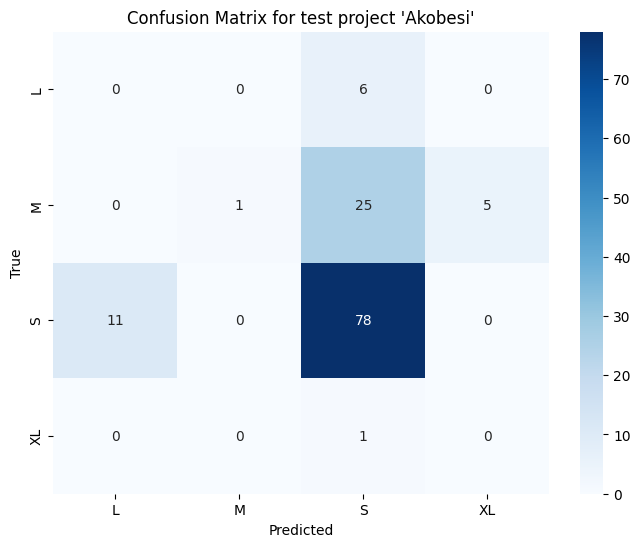

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

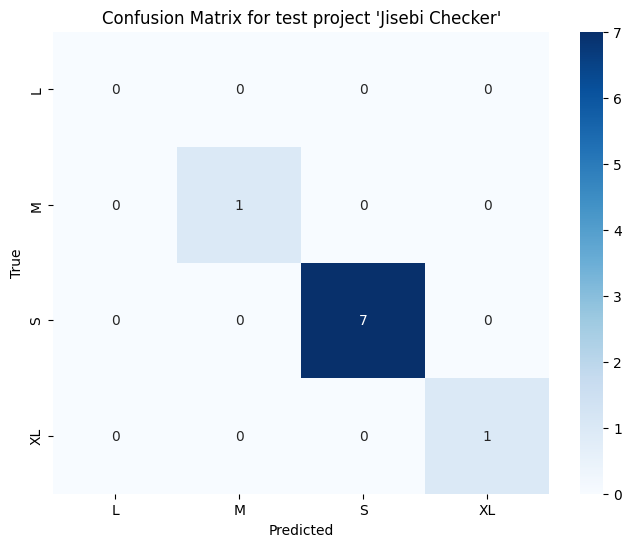

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

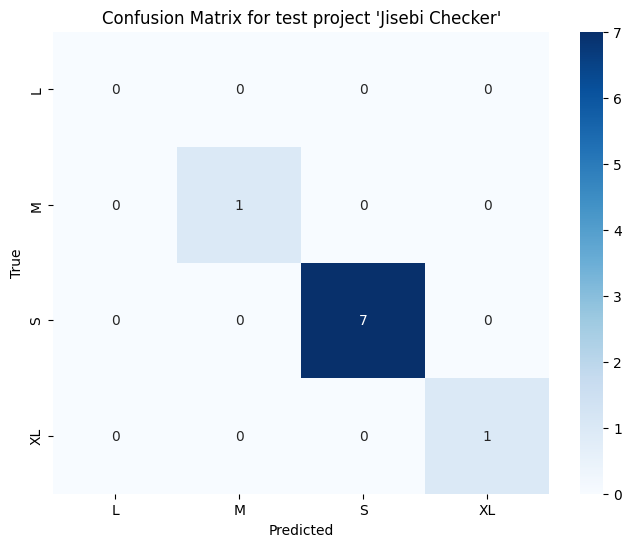

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.67      0.67         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


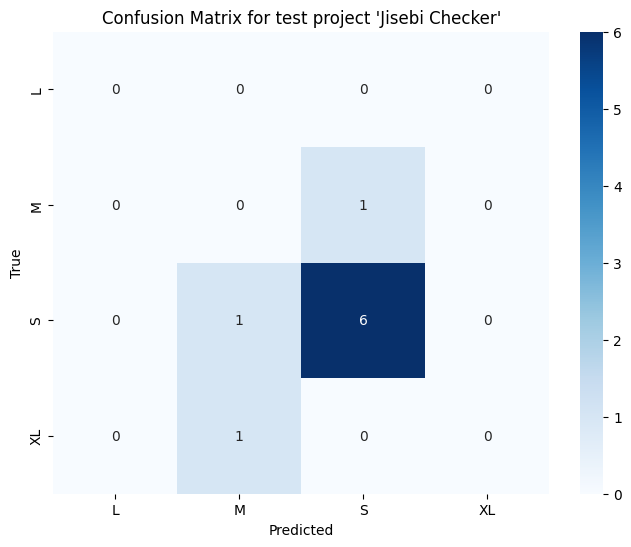

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

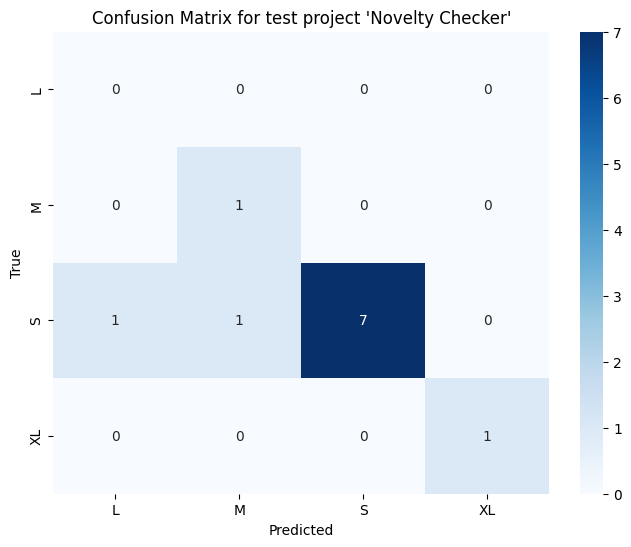

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

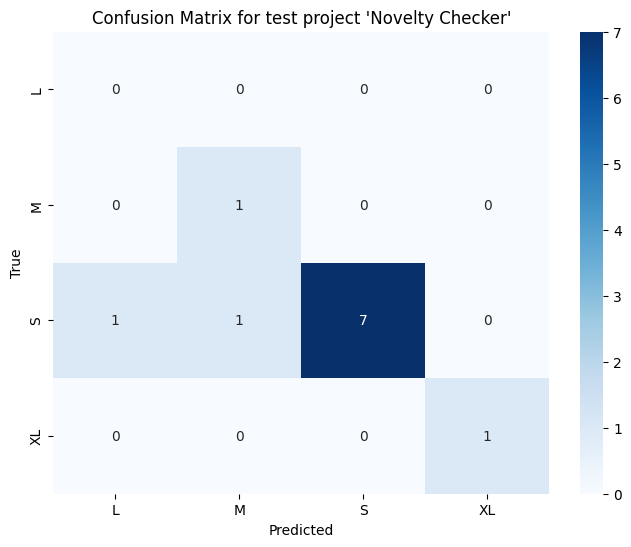

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.80      0.89      0.84         9
          XL       0.00      0.00      0.00         1

   micro avg       0.80      0.73      0.76        11
   macro avg       0.20      0.22      0.21        11
weighted avg       0.65      0.73      0.69        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.6545454545454545     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.6889952153110048

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

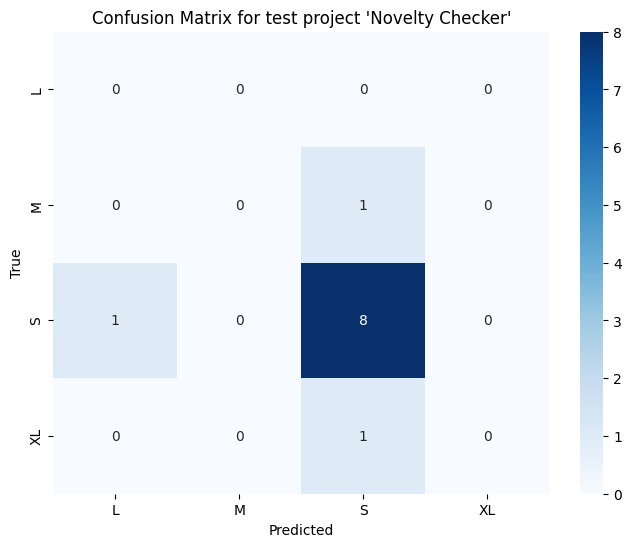

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

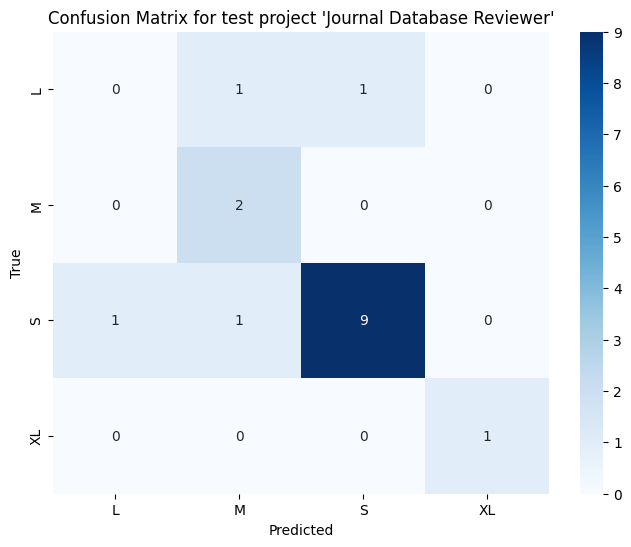

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

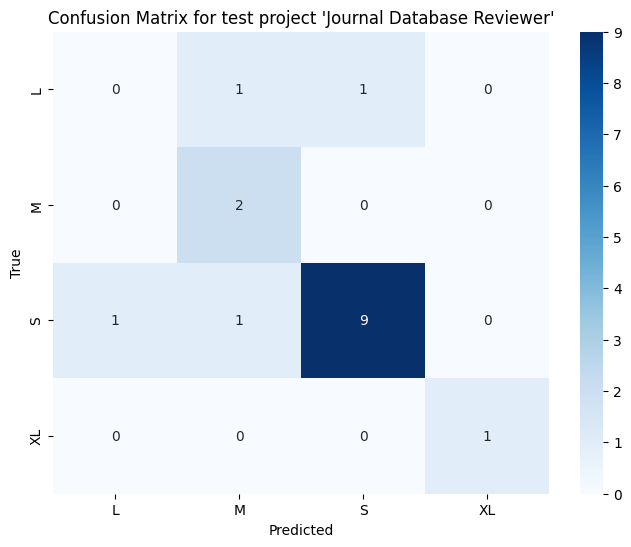

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.58      0.64      0.61        11
          XL       0.00      0.00      0.00         1

   micro avg       0.44      0.44      0.44        16
   macro avg       0.15      0.16      0.15        16
weighted avg       0.40      0.44      0.42        16
 samples avg       0.44      0.44      0.44        16

Precision: 0.4010416666666667     Recall: 0.4375      Accuracy: 0.4375      F1 Score: 0.41847826086956524

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

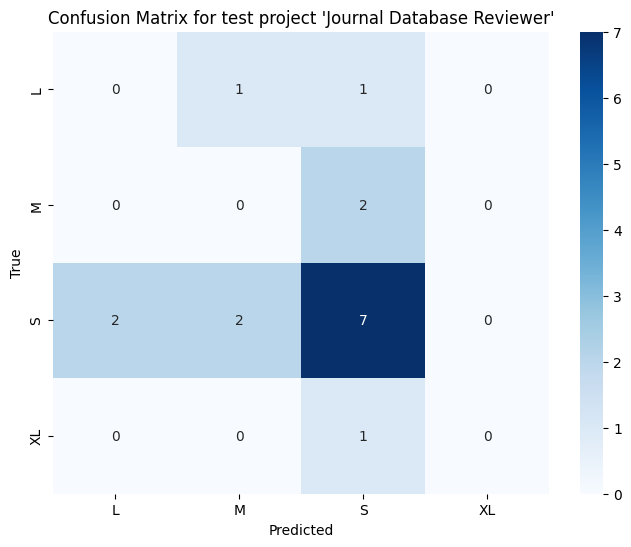

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

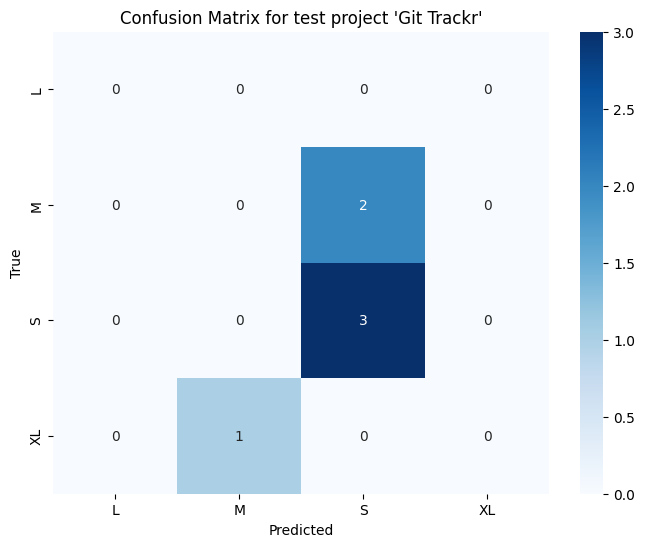

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.50      1.00      0.67         3
          XL       1.00      1.00      1.00         1

   micro avg       0.50      0.67      0.57         6
   macro avg       0.38      0.50      0.42         6
weighted avg       0.42      0.67      0.50         6
 samples avg       0.56      0.67      0.58         6

Precision: 0.4166666666666667     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

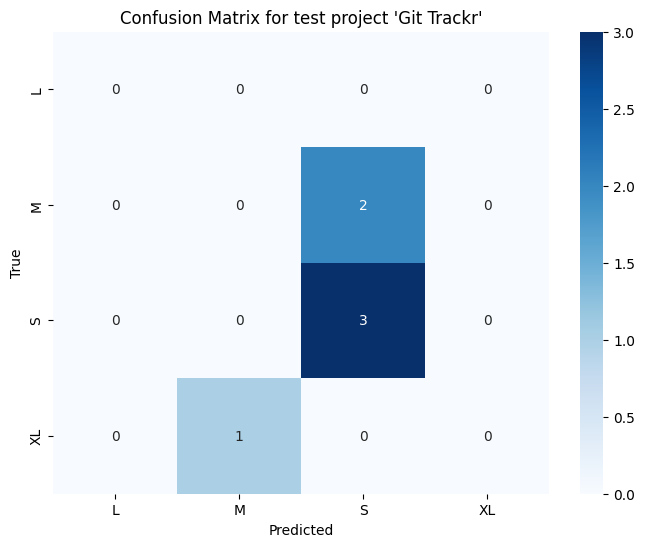

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

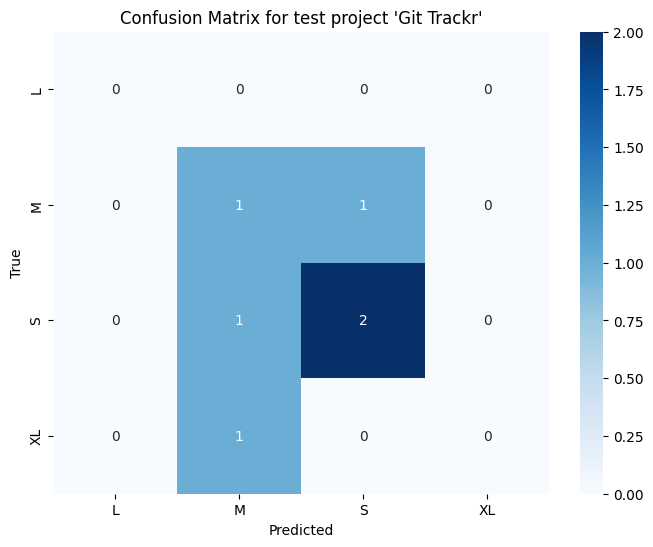

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      1.00      1.00         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         4
   macro avg       0.50      0.50      0.50         4
weighted avg       1.00      1.00      1.00         4
 samples avg       1.00      1.00      1.00         4

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

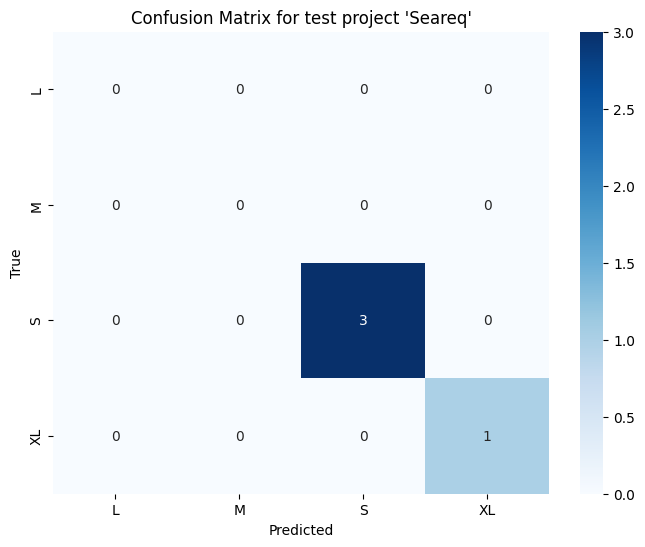

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.60      0.75      0.67         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.62      0.75      0.67         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

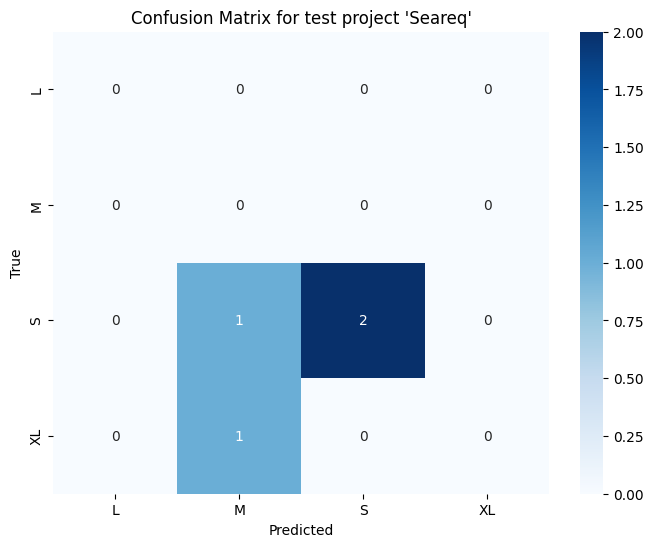

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.60      0.75      0.67         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.62      0.75      0.67         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

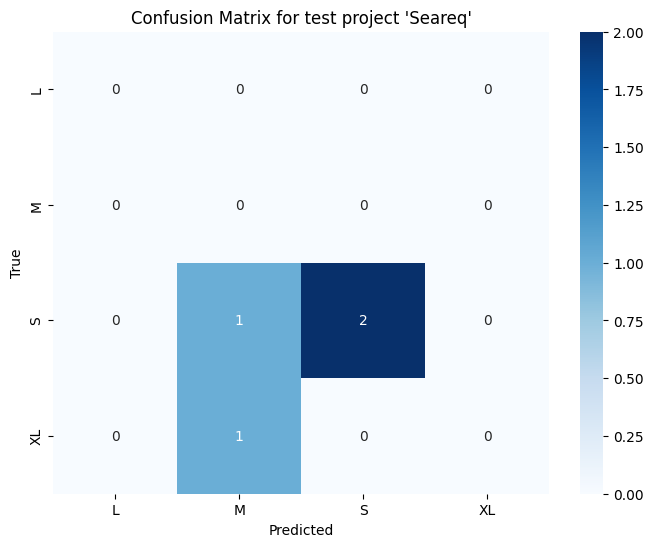

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.68      0.72      0.70        18
   macro avg       0.30      0.29      0.27        18
weighted avg       0.64      0.72      0.64        18
 samples avg       0.69      0.72      0.70        18

Precision: 0.6372549019607843     Recall: 0.7222222222222222      Accuracy: 0.6666666666666666      F1 Score: 0.6350574712643678

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

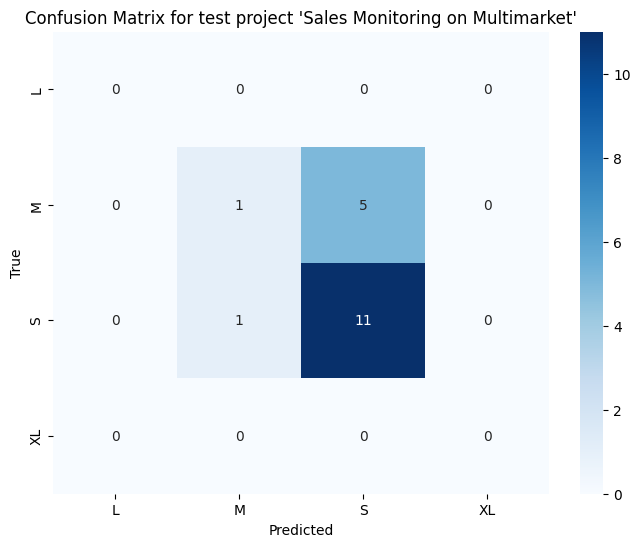

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         6
           S       0.75      1.00      0.86        12
          XL       0.00      0.00      0.00         0

   micro avg       0.78      0.78      0.78        18
   macro avg       0.44      0.33      0.34        18
weighted avg       0.83      0.78      0.74        18
 samples avg       0.78      0.78      0.78        18

Precision: 0.8333333333333334     Recall: 0.7777777777777778      Accuracy: 0.7777777777777778      F1 Score: 0.738095238095238

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

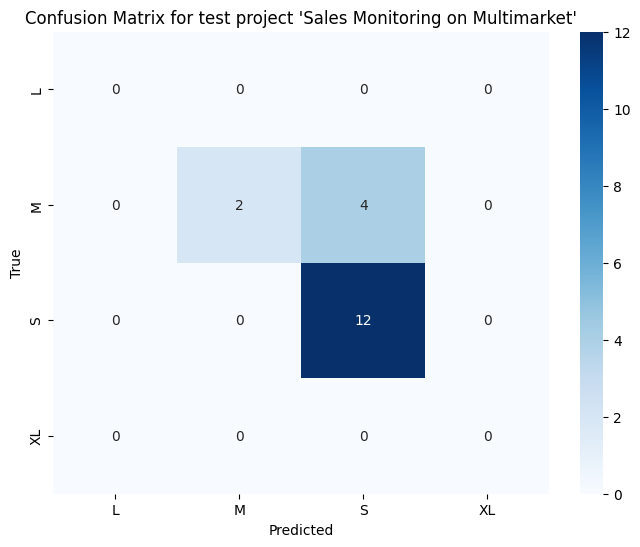

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.75      0.75      0.75        12
          XL       0.00      0.00      0.00         0

   micro avg       0.77      0.56      0.65        18
   macro avg       0.44      0.23      0.26        18
weighted avg       0.83      0.56      0.60        18
 samples avg       0.56      0.56      0.56        18

Precision: 0.8333333333333334     Recall: 0.5555555555555556      Accuracy: 0.5555555555555556      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

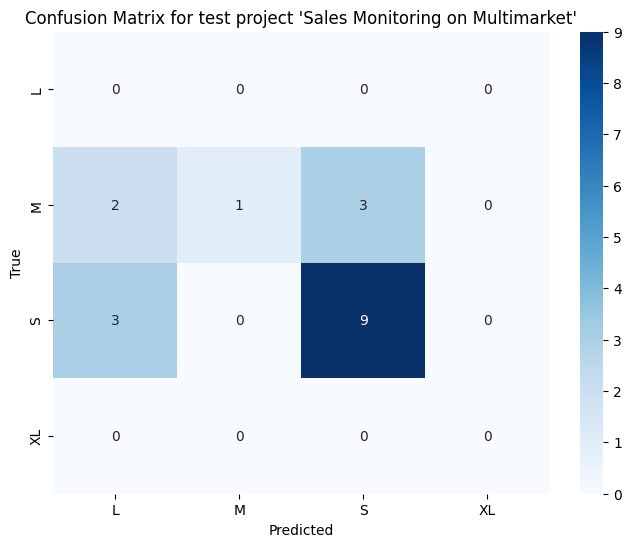

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

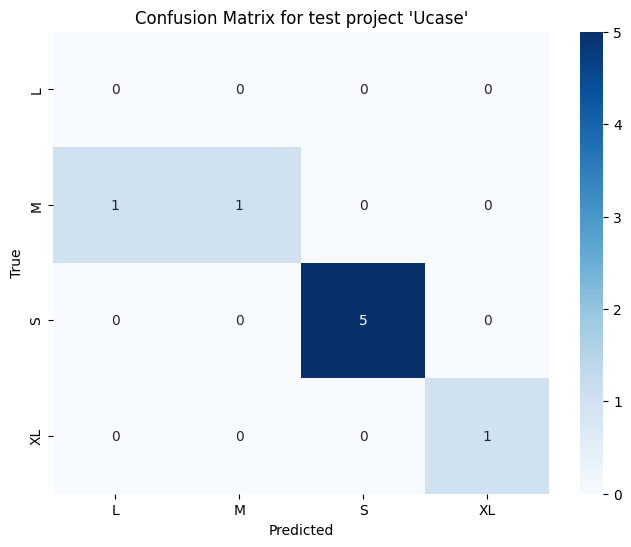

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       0.80      1.00      0.89         8
   macro avg       0.62      0.75      0.67         8
weighted avg       0.88      1.00      0.92         8
 samples avg       0.88      1.00      0.92         8

Precision: 0.875     Recall: 1.0      Accuracy: 0.75      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

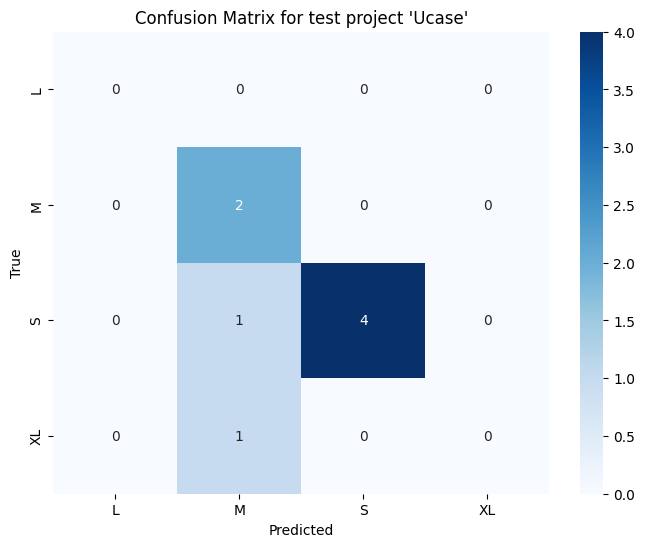

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.57      0.80      0.67         5
          XL       0.00      0.00      0.00         1

   micro avg       0.57      0.50      0.53         8
   macro avg       0.14      0.20      0.17         8
weighted avg       0.36      0.50      0.42         8
 samples avg       0.50      0.50      0.50         8

Precision: 0.3571428571428571     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.41666666666666663

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

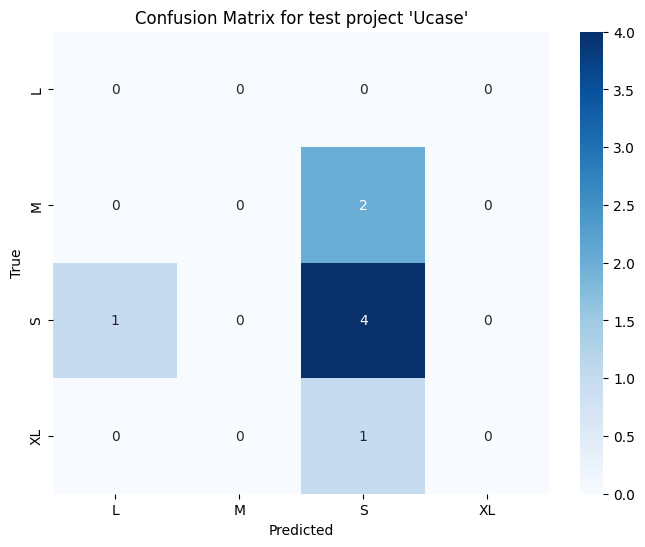

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.85      0.88        13
   macro avg       0.72      0.58      0.61        13
weighted avg       0.93      0.85      0.85        13
 samples avg       0.85      0.85      0.85        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.9316239316239316     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.8484162895927602

Confusion matrix for test project 'DFD Generator':


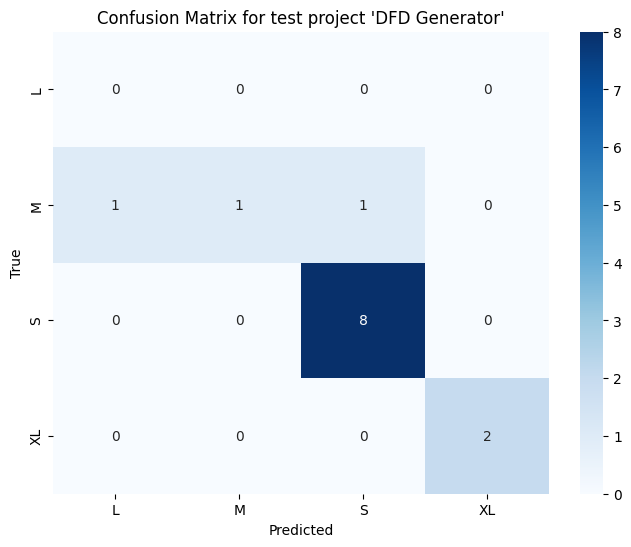

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.33      0.40         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.85      0.85      0.85        13
   macro avg       0.60      0.58      0.59        13
weighted avg       0.82      0.85      0.83        13
 samples avg       0.81      0.85      0.82        13

Precision: 0.8162393162393162     Recall: 0.8461538461538461      Accuracy: 0.7692307692307693      F1 Score: 0.8253393665158372

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

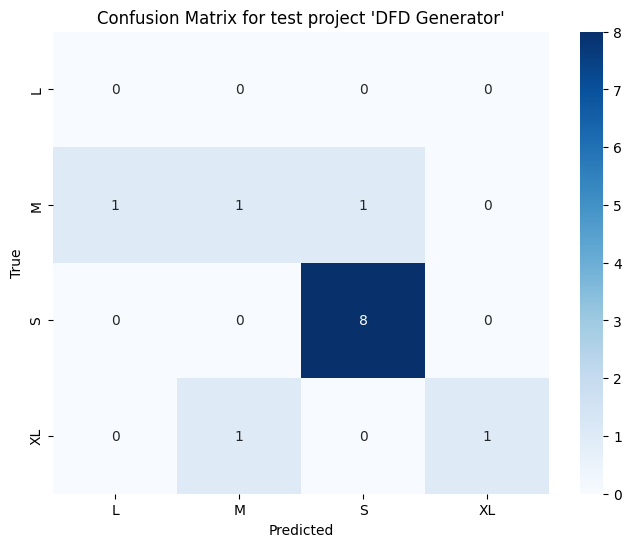

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.58      0.88      0.70         8
          XL       0.00      0.00      0.00         2

   micro avg       0.58      0.54      0.56        13
   macro avg       0.15      0.22      0.18        13
weighted avg       0.36      0.54      0.43        13
 samples avg       0.54      0.54      0.54        13

Precision: 0.358974358974359     Recall: 0.5384615384615384      Accuracy: 0.5384615384615384      F1 Score: 0.4307692307692308

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

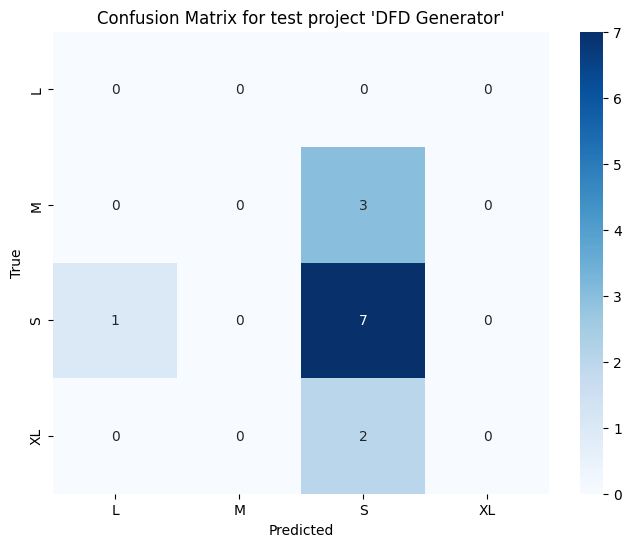

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      1.00      0.96        11
   macro avg       0.72      0.75      0.74        11
weighted avg       0.92      1.00      0.96        11
 samples avg       0.95      1.00      0.97        11

Precision: 0.9191919191919191     Recall: 1.0      Accuracy: 0.9090909090909091      F1 Score: 0.9572192513368983

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

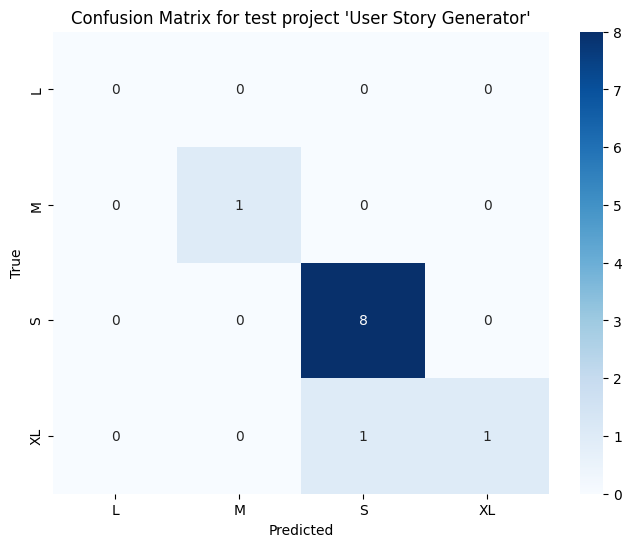

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.86      0.75      0.80         8
          XL       1.00      1.00      1.00         2

   micro avg       0.90      0.82      0.86        11
   macro avg       0.71      0.69      0.70        11
weighted avg       0.90      0.82      0.85        11
 samples avg       0.77      0.82      0.79        11

Precision: 0.8961038961038962     Recall: 0.8181818181818182      Accuracy: 0.7272727272727273      F1 Score: 0.8545454545454544

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

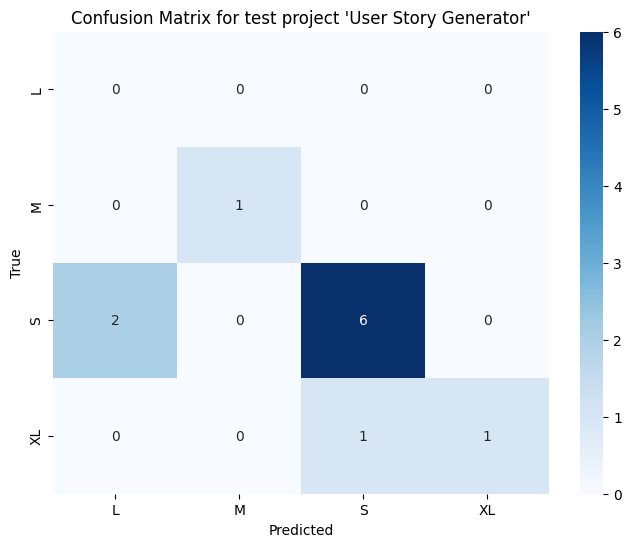

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.73      1.00      0.84         8
          XL       0.00      0.00      0.00         2

   micro avg       0.73      0.73      0.73        11
   macro avg       0.18      0.25      0.21        11
weighted avg       0.53      0.73      0.61        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.5289256198347108     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.6124401913875599

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

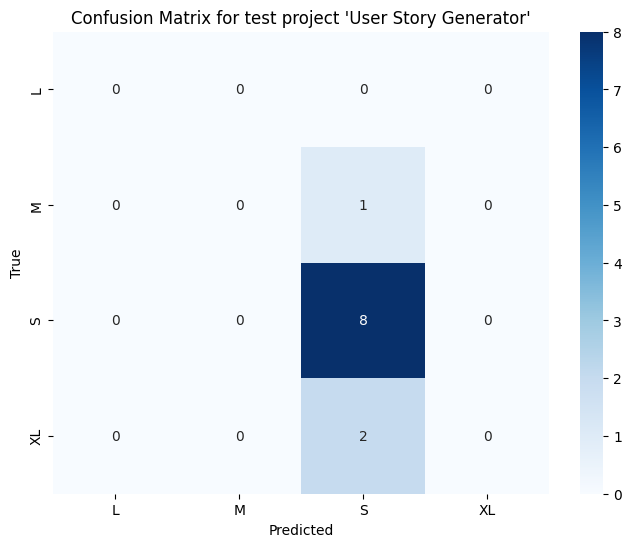

In [68]:
# Model (Numerik 3)
accuracy_list_Adaboost_nt33 = []
accuracy_list_DecisionTree_nt33 = []
accuracy_list_MultinomialNB_nt33 = []
precision_list_Adaboost_nt33 = []
precision_list_DecisionTree_nt33 = []
precision_list_MultinomialNB_nt33 = []
recall_list_Adaboost_nt33 = []
recall_list_DecisionTree_nt33 = []
recall_list_MultinomialNB_nt33 = []
f1_score_list_Adaboost_nt33 = []
f1_score_list_DecisionTree_nt33 = []
f1_score_list_MultinomialNB_nt33 = []
mean_accuracy_nt33 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_scenario_num3.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_scenario_num3.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt33.append(accuracy)
    precision_list_Adaboost_nt33.append(precision)
    recall_list_Adaboost_nt33.append(recall)
    f1_score_list_Adaboost_nt33.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt33.append(accuracy)
    precision_list_DecisionTree_nt33.append(precision)
    recall_list_DecisionTree_nt33.append(recall)
    f1_score_list_DecisionTree_nt33.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt33.append(accuracy)
    precision_list_MultinomialNB_nt33.append(precision)
    recall_list_MultinomialNB_nt33.append(recall)
    f1_score_list_MultinomialNB_nt33.append(f1)

In [69]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt33': precision_list_Adaboost_nt33,
    'Recall_Adaboost_nt33': recall_list_Adaboost_nt33,
    'Accuracy_Adaboost_nt33': accuracy_list_Adaboost_nt33,
    'F1_Score_Adaboost_nt33': f1_score_list_Adaboost_nt33,
    'Precision_DecisionTree_nt33': precision_list_DecisionTree_nt33,
    'Recall_DecisionTree_nt33': recall_list_DecisionTree_nt33,
    'Accuracy_DecisionTree_nt33': accuracy_list_DecisionTree_nt33,
    'F1_Score_DecisionTree_nt33': f1_score_list_DecisionTree_nt33,
    'Precision_MultinomialNB_nt33': precision_list_MultinomialNB_nt33,
    'Recall_MultinomialNB_nt33': recall_list_MultinomialNB_nt33,
    'Accuracy_MultinomialNB_nt33': accuracy_list_MultinomialNB_nt33,
    'F1_Score_MultinomialNB_nt33': f1_score_list_MultinomialNB_nt33,
}

# Buat DataFrame
df_result_nt33 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt33


,Project,Precision_Adaboost_nt33,Recall_Adaboost_nt33,Accuracy_Adaboost_nt33,F1_Score_Adaboost_nt33,Precision_DecisionTree_nt33,Recall_DecisionTree_nt33,Accuracy_DecisionTree_nt33,F1_Score_DecisionTree_nt33,Precision_MultinomialNB_nt33,Recall_MultinomialNB_nt33,Accuracy_MultinomialNB_nt33,F1_Score_MultinomialNB_nt33
0,Akobesi,0.558625,0.629921,0.629921,0.554478,0.477260,0.622047,0.622047,0.540119,0.741359,0.629921,0.598425,0.565273
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,0.954545,0.818182,0.818182,0.867424,0.954545,0.818182,0.818182,0.867424,0.654545,0.727273,0.727273,0.688995
3,Journal Database Reviewer,0.743750,0.750000,0.750000,0.735119,0.743750,0.750000,0.750000,0.735119,0.401042,0.437500,0.437500,0.418478
4,Git Trackr,0.466667,0.666667,0.500000,0.541667,0.416667,0.666667,0.500000,0.500000,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,1.000000,1.000000,1.000000,1.000000,0.750000,0.500000,0.850000,1.000000,0.750000,0.500000,0.850000
6,Sales Monitoring on Multimarket,0.637255,0.722222,0.666667,0.635057,0.833333,0.777778,0.777778,0.738095,0.833333,0.555556,0.555556,0.595238
7,Ucase,1.000000,0.875000,0.875000,0.916667,0.875000,1.000000,0.750000,0.916667,0.357143,0.500000,0.500000,0.416667
8,DFD Generator,0.931624,0.846154,0.846154,0.848416,0.816239,0.846154,0.769231,0.825339,0.358974,0.538462,0.538462,0.430769
9,User Story Generator,0.919192,1.000000,0.909091,0.957219,0.896104,0.818182,0.727273,0.854545,0.528926,0.727273,0.727273,0.612440


In [70]:
# Mean Accuracy
mean_accuracy_nt33.append(np.mean(accuracy_list_Adaboost_nt33))
mean_accuracy_nt33.append(np.mean(accuracy_list_DecisionTree_nt33))
mean_accuracy_nt33.append(np.mean(accuracy_list_MultinomialNB_nt33))
print("Mean Accuracy")
print(mean_accuracy_nt33)

Mean Accuracy
[0.799501449993576, 0.721451033655758, 0.5751154412079609]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.27      0.10      0.14        31
           S       0.70      0.82      0.76        89
          XL       0.00      0.00      0.00         1

   micro avg       0.66      0.60      0.63       127
   macro avg       0.24      0.23      0.22       127
weighted avg       0.56      0.60      0.56       127
 samples avg       0.59      0.60      0.59       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.5584700732338527     Recall: 0.5984251968503937      Accuracy: 0.5748031496062992      F1 Score: 0.5649999708585649

Confusion matrix for test project 'Akobesi':


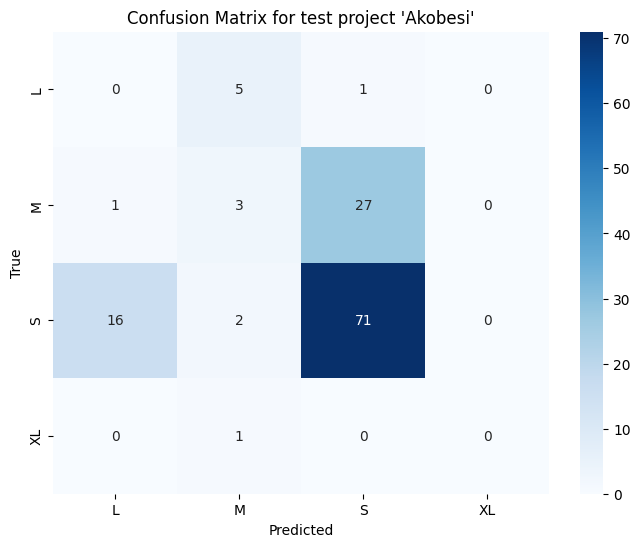

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.20      0.03      0.06        31
           S       0.77      0.81      0.79        89
          XL       0.00      0.00      0.00         1

   micro avg       0.74      0.57      0.65       127
   macro avg       0.24      0.21      0.21       127
weighted avg       0.59      0.57      0.57       127
 samples avg       0.57      0.57      0.57       127

Precision: 0.585592226503602     Recall: 0.5748031496062992      Accuracy: 0.5748031496062992      F1 Score: 0.5650000717123475

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

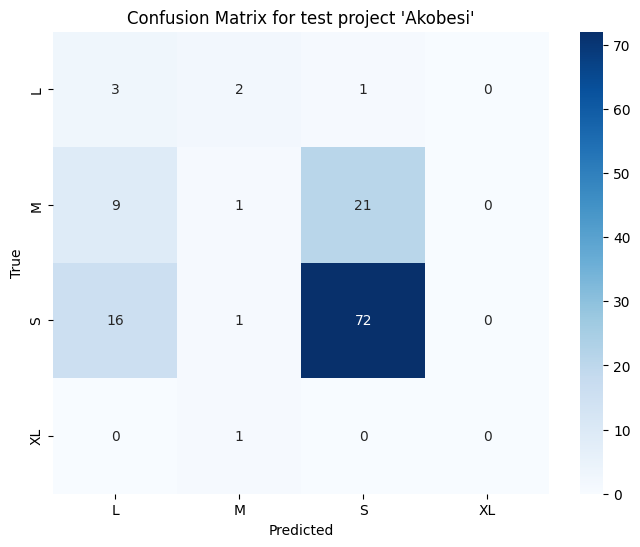

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.71      0.98      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.69      0.70       127
   macro avg       0.18      0.24      0.21       127
weighted avg       0.50      0.69      0.58       127
 samples avg       0.69      0.69      0.69       127

Precision: 0.4997418355492449     Recall: 0.6850393700787402      Accuracy: 0.6850393700787402      F1 Score: 0.5779005112512594

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

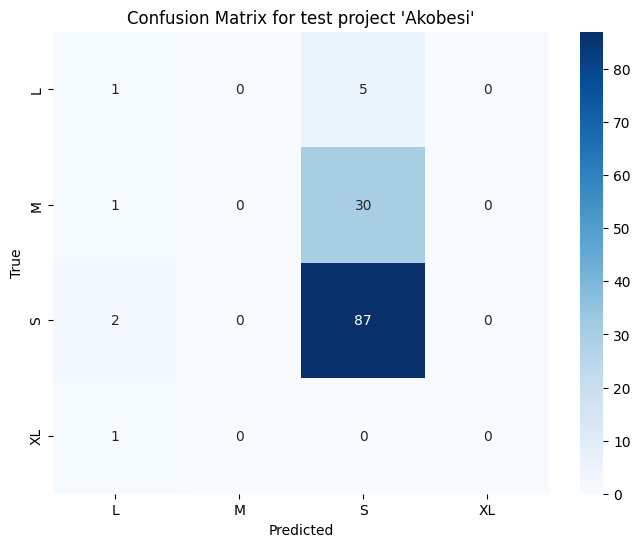

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

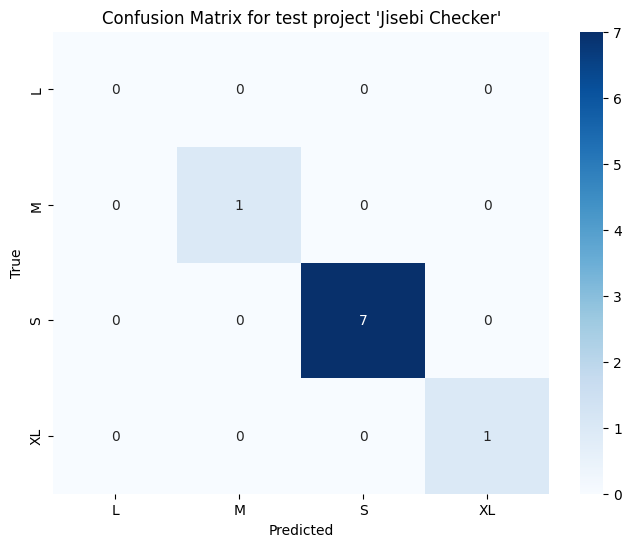

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

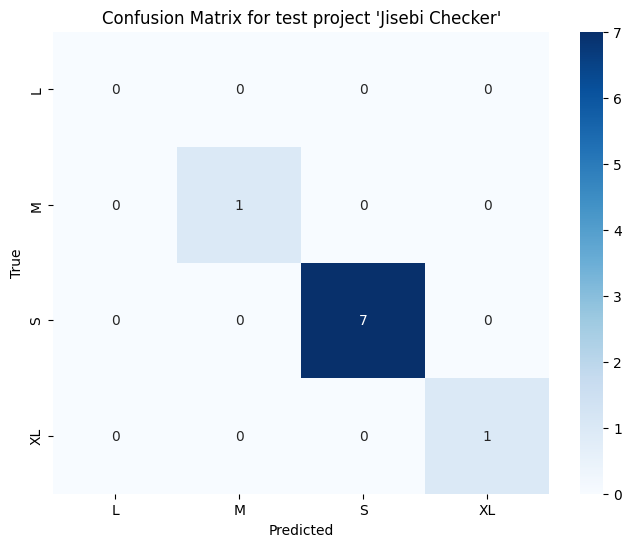

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.88      1.00      0.93         7
          XL       0.00      0.00      0.00         1

   micro avg       0.88      0.78      0.82         9
   macro avg       0.22      0.25      0.23         9
weighted avg       0.68      0.78      0.73         9
 samples avg       0.78      0.78      0.78         9

Precision: 0.6805555555555556     Recall: 0.7777777777777778      Accuracy: 0.7777777777777778      F1 Score: 0.7259259259259259

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

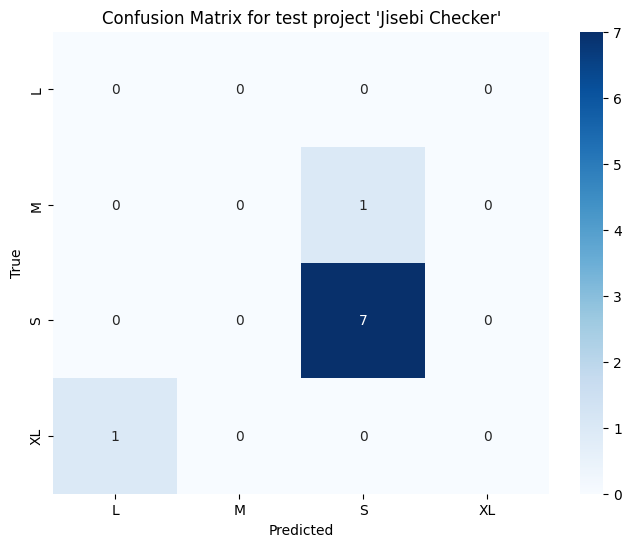

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.74        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9518716577540107

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

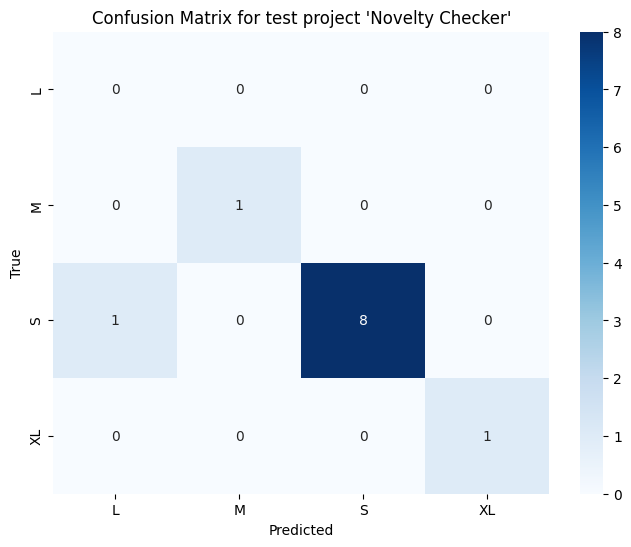

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.77      0.82      0.79        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.7272727272727273      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

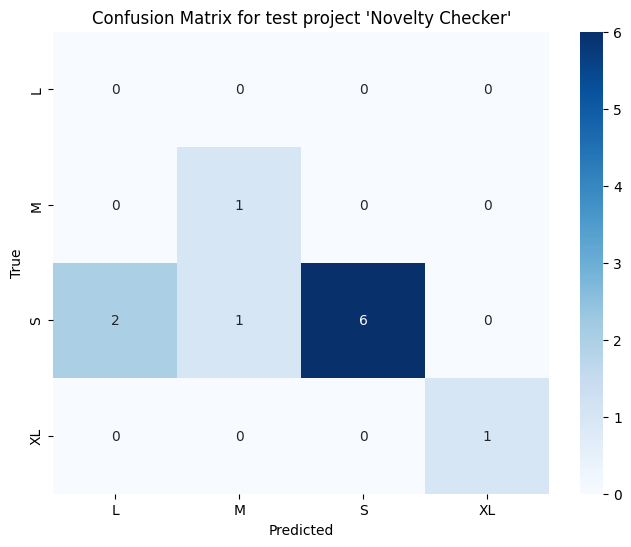

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.67      0.75         9
          XL       0.00      0.00      0.00         1

   micro avg       0.86      0.55      0.67        11
   macro avg       0.21      0.17      0.19        11
weighted avg       0.70      0.55      0.61        11
 samples avg       0.55      0.55      0.55        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.7012987012987012     Recall: 0.5454545454545454      Accuracy: 0.5454545454545454      F1 Score: 0.6136363636363636

Confusion matrix for test project 'Novelty Checker':


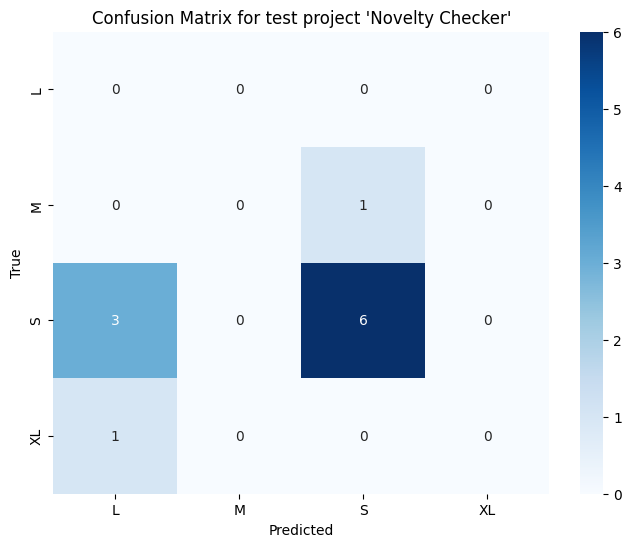

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.82      0.82      0.82        11
          XL       1.00      1.00      1.00         1

   micro avg       0.75      0.75      0.75        16
   macro avg       0.58      0.70      0.62        16
weighted avg       0.69      0.75      0.71        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.6875     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7083333333333334

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


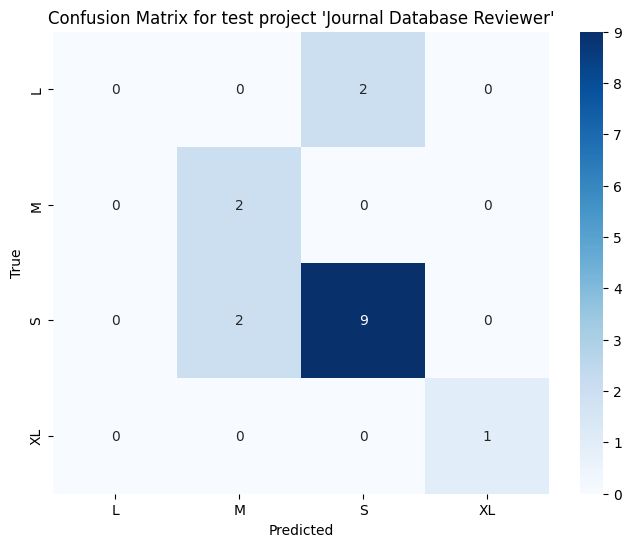

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.33      1.00      0.50         2
           S       0.80      0.73      0.76        11
          XL       1.00      1.00      1.00         1

   micro avg       0.65      0.69      0.67        16
   macro avg       0.53      0.68      0.57        16
weighted avg       0.65      0.69      0.65        16
 samples avg       0.62      0.69      0.65        16

Precision: 0.6541666666666667     Recall: 0.6875      Accuracy: 0.5625      F1 Score: 0.6488095238095238

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

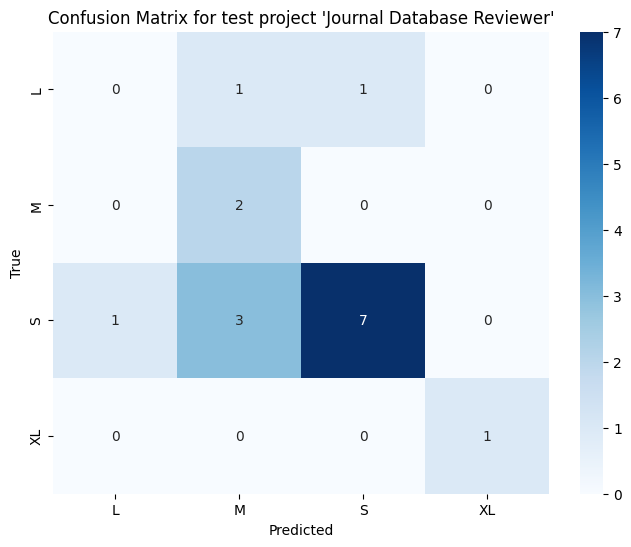

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.69      0.82      0.75        11
          XL       0.00      0.00      0.00         1

   micro avg       0.69      0.56      0.62        16
   macro avg       0.17      0.20      0.19        16
weighted avg       0.48      0.56      0.52        16
 samples avg       0.56      0.56      0.56        16

Precision: 0.47596153846153844     Recall: 0.5625      Accuracy: 0.5625      F1 Score: 0.5156250000000001

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

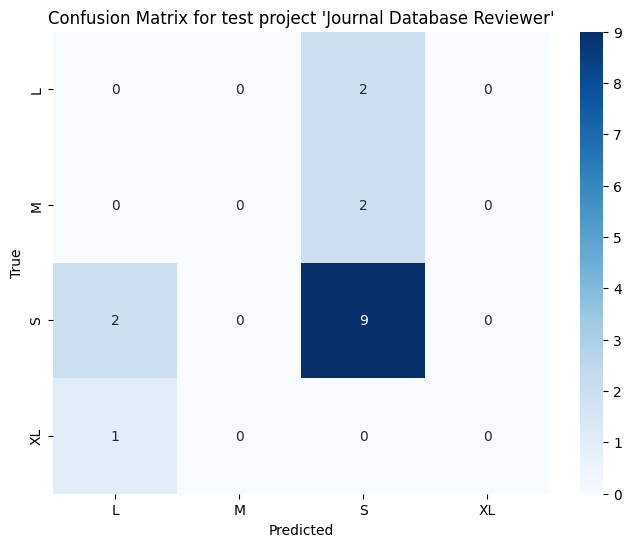

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

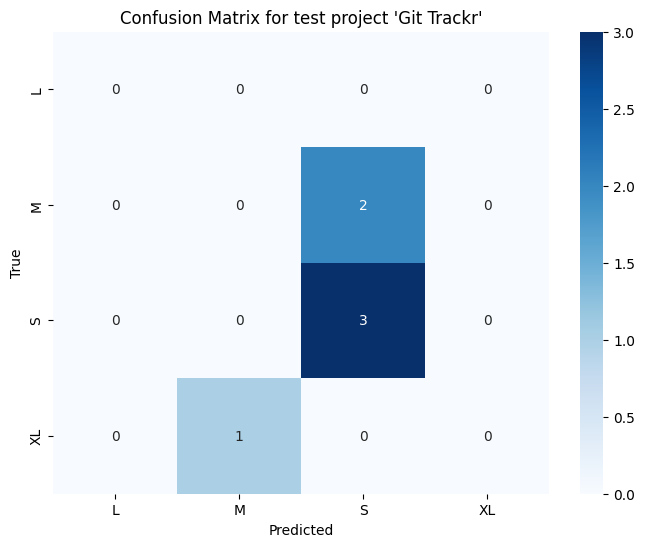

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.75      1.00      0.86         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.44      0.50      0.46         6
weighted avg       0.54      0.67      0.60         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.5416666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

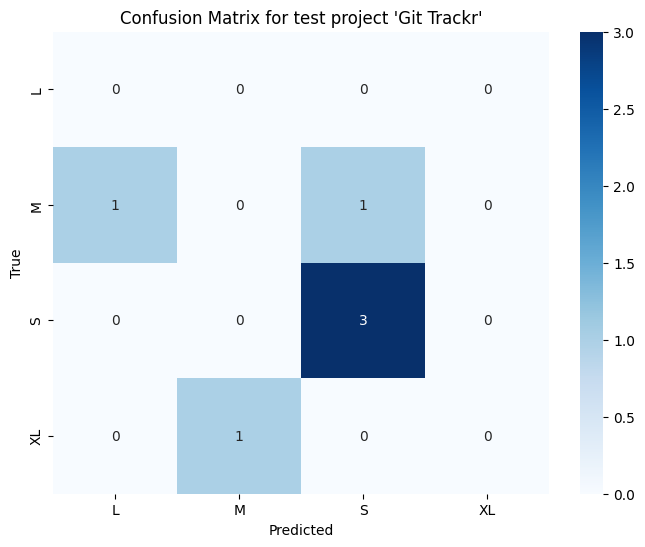

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       0.00      0.00      0.00         1

   micro avg       0.60      0.50      0.55         6
   macro avg       0.15      0.25      0.19         6
weighted avg       0.30      0.50      0.37         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.3     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.37499999999999994

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

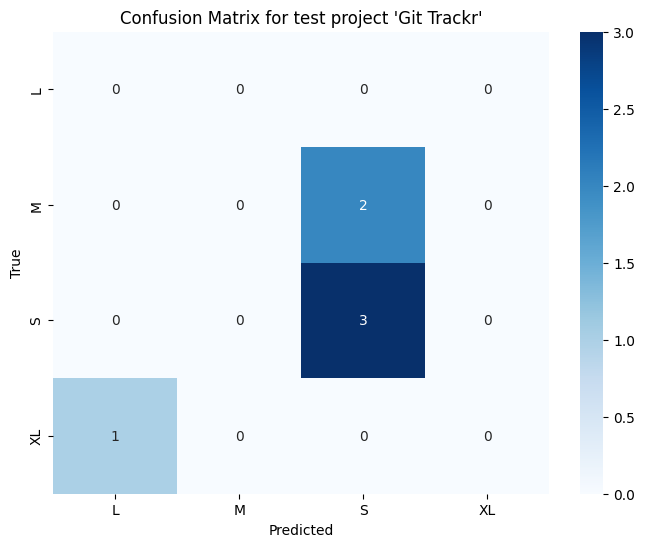

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.75      0.86         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.75      0.75      0.75         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

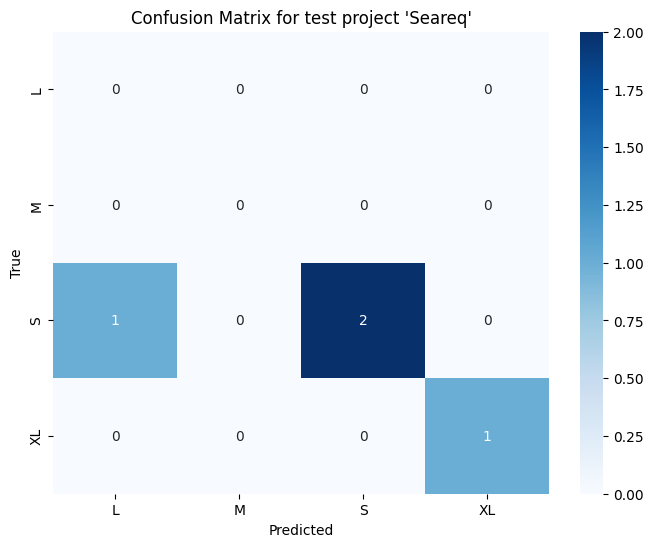

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.75      0.86         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.75      0.75      0.75         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

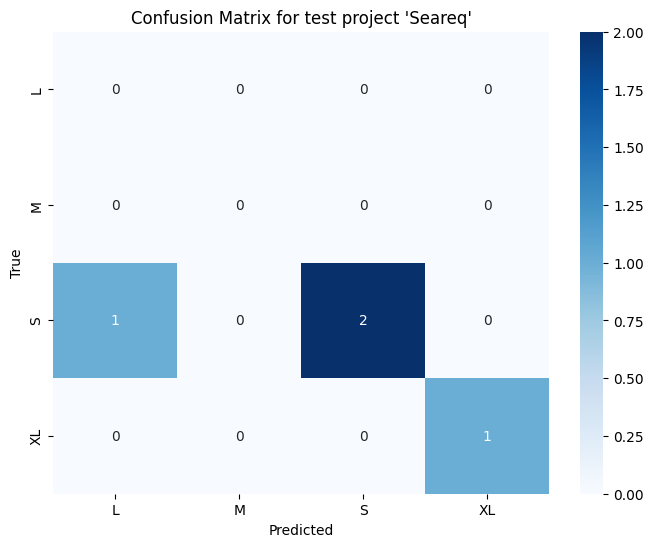

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       0.75      1.00      0.86         3
          XL       0.00      0.00      0.00         1

   micro avg       0.75      0.75      0.75         4
   macro avg       0.19      0.25      0.21         4
weighted avg       0.56      0.75      0.64         4
 samples avg       0.75      0.75      0.75         4



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.5625     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.6428571428571428

Confusion matrix for test project 'Seareq':


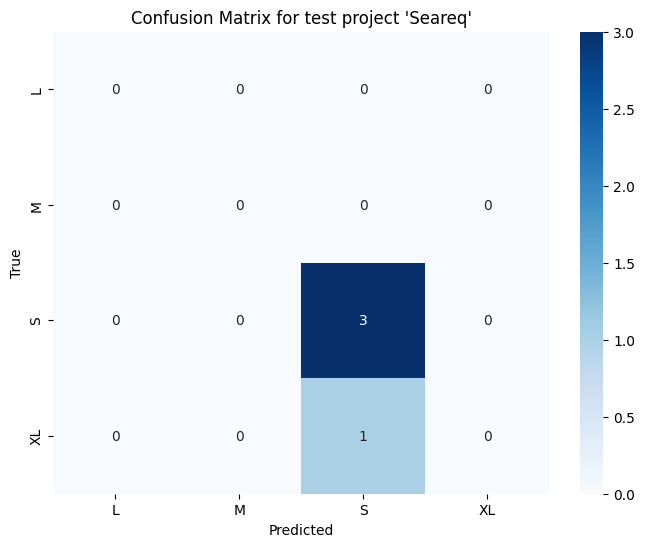

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.77      0.83      0.80        12
          XL       0.00      0.00      0.00         0

   micro avg       0.79      0.61      0.69        18
   macro avg       0.44      0.25      0.27        18
weighted avg       0.85      0.61      0.63        18
 samples avg       0.61      0.61      0.61        18

Precision: 0.8461538461538463     Recall: 0.6111111111111112      Accuracy: 0.6111111111111112      F1 Score: 0.6285714285714286

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

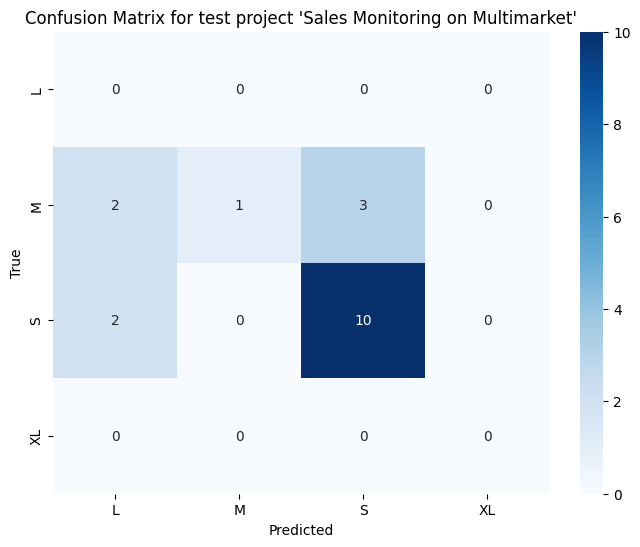

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.17      0.22         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.65      0.72      0.68        18
   macro avg       0.26      0.29      0.26        18
weighted avg       0.58      0.72      0.63        18
 samples avg       0.67      0.72      0.69        18

Precision: 0.5816993464052288     Recall: 0.7222222222222222      Accuracy: 0.6111111111111112      F1 Score: 0.6257982120051087

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

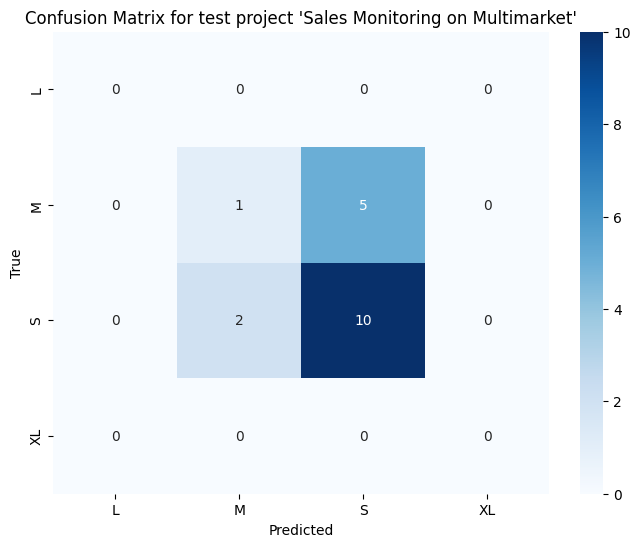

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         6
           S       0.67      1.00      0.80        12
          XL       0.00      0.00      0.00         0

   micro avg       0.67      0.67      0.67        18
   macro avg       0.17      0.25      0.20        18
weighted avg       0.44      0.67      0.53        18
 samples avg       0.67      0.67      0.67        18

Precision: 0.4444444444444444     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.5333333333333334

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

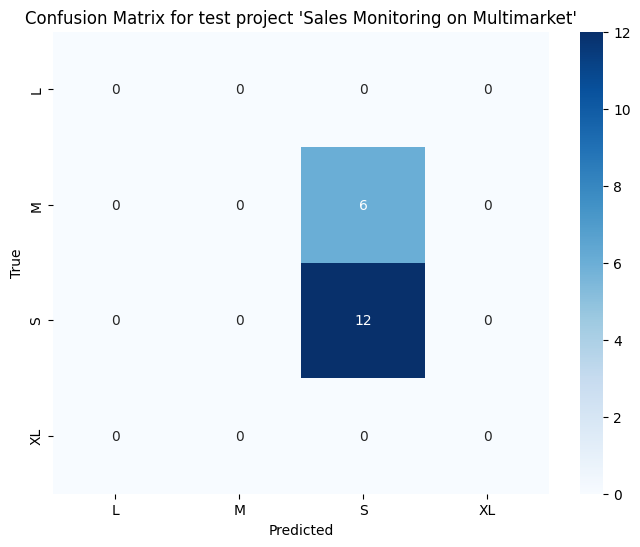

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         8
   macro avg       0.75      0.75      0.75         8
weighted avg       1.00      1.00      1.00         8
 samples avg       1.00      1.00      1.00         8

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

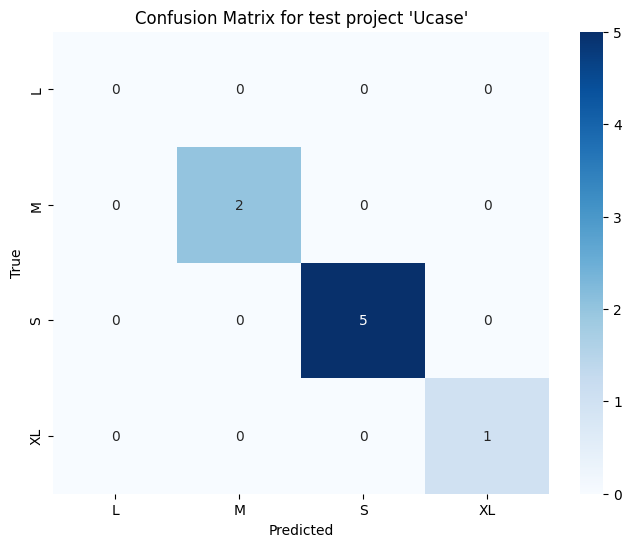

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       0.83      1.00      0.91         5
          XL       1.00      1.00      1.00         1

   micro avg       0.88      0.88      0.88         8
   macro avg       0.71      0.62      0.64         8
weighted avg       0.90      0.88      0.86         8
 samples avg       0.81      0.88      0.83         8

Precision: 0.8958333333333334     Recall: 0.875      Accuracy: 0.75      F1 Score: 0.8598484848484848

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

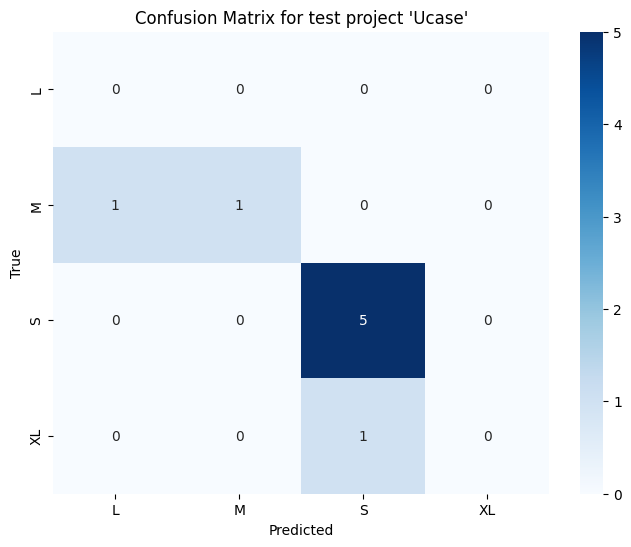

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.71      1.00      0.83         5
          XL       0.00      0.00      0.00         1

   micro avg       0.71      0.62      0.67         8
   macro avg       0.18      0.25      0.21         8
weighted avg       0.45      0.62      0.52         8
 samples avg       0.62      0.62      0.62         8



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.44642857142857145     Recall: 0.625      Accuracy: 0.625      F1 Score: 0.5208333333333333

Confusion matrix for test project 'Ucase':


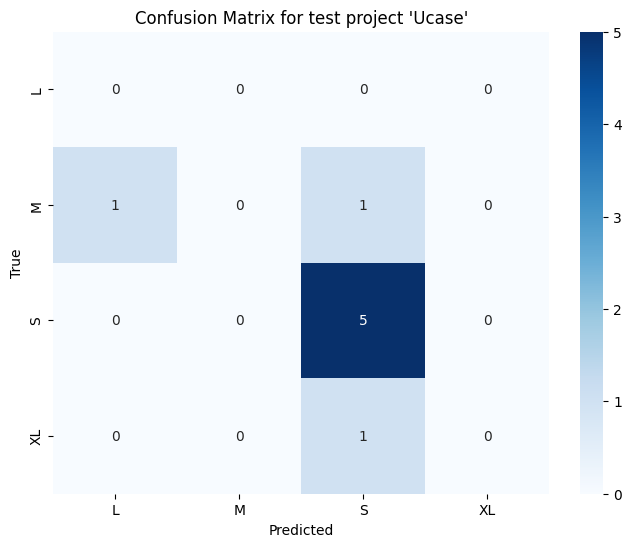

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.85      0.92        13
   macro avg       0.75      0.64      0.68        13
weighted avg       1.00      0.85      0.91        13
 samples avg       0.85      0.85      0.85        13

Precision: 1.0     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.9128205128205129

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

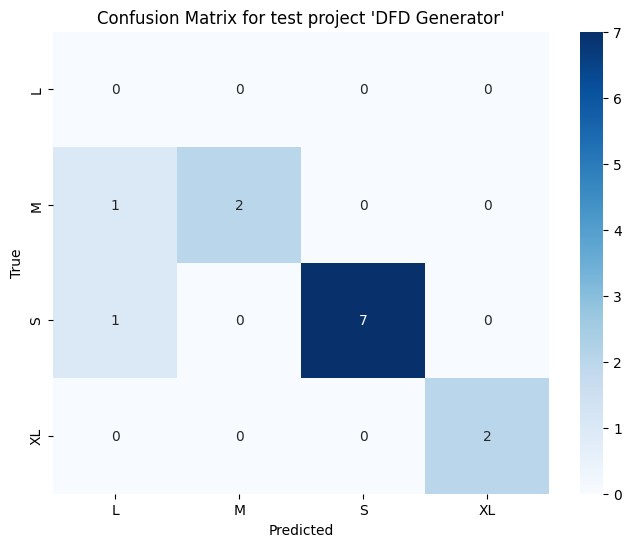

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.75      1.00      0.86         3
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.92      0.92        13
   macro avg       0.69      0.72      0.70        13
weighted avg       0.94      0.92      0.93        13
 samples avg       0.92      0.92      0.92        13

Precision: 0.9423076923076923     Recall: 0.9230769230769231      Accuracy: 0.9230769230769231      F1 Score: 0.926007326007326

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

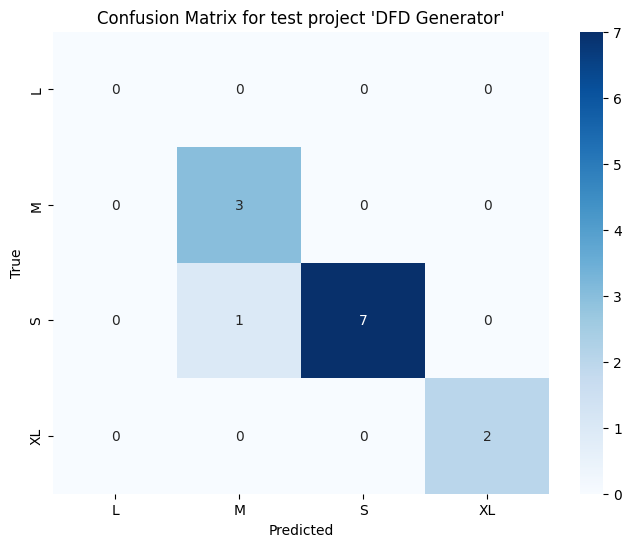

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.80      1.00      0.89         8
          XL       0.00      0.00      0.00         2

   micro avg       0.80      0.62      0.70        13
   macro avg       0.20      0.25      0.22        13
weighted avg       0.49      0.62      0.55        13
 samples avg       0.62      0.62      0.62        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.49230769230769234     Recall: 0.6153846153846154      Accuracy: 0.6153846153846154      F1 Score: 0.5470085470085471

Confusion matrix for test project 'DFD Generator':


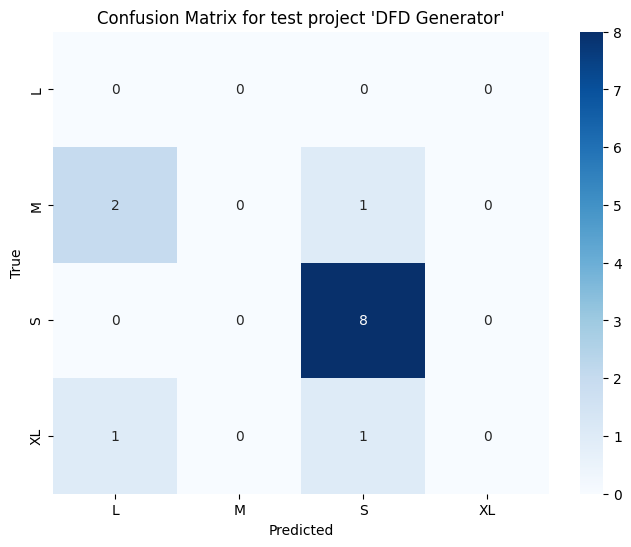

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.75      0.86         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.82      0.90        11
   macro avg       0.75      0.69      0.71        11
weighted avg       1.00      0.82      0.90        11
 samples avg       0.82      0.82      0.82        11

Precision: 1.0     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8961038961038962

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

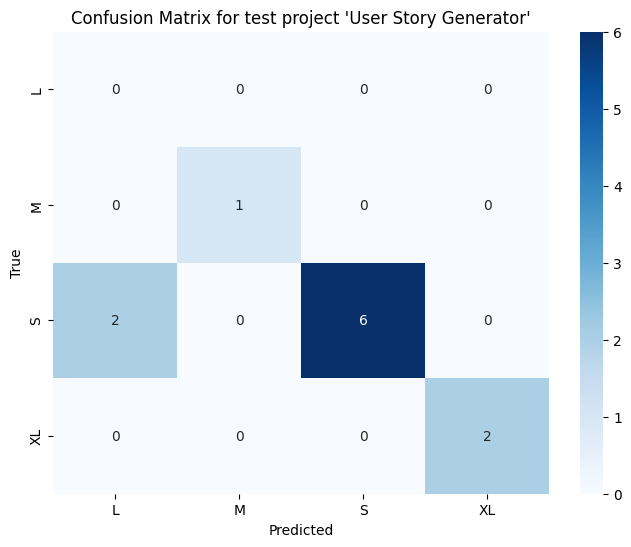

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.78      0.88      0.82         8
          XL       1.00      1.00      1.00         2

   micro avg       0.83      0.91      0.87        11
   macro avg       0.69      0.72      0.71        11
weighted avg       0.84      0.91      0.87        11
 samples avg       0.82      0.91      0.85        11

Precision: 0.8383838383838383     Recall: 0.9090909090909091      Accuracy: 0.7272727272727273      F1 Score: 0.8716577540106953

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

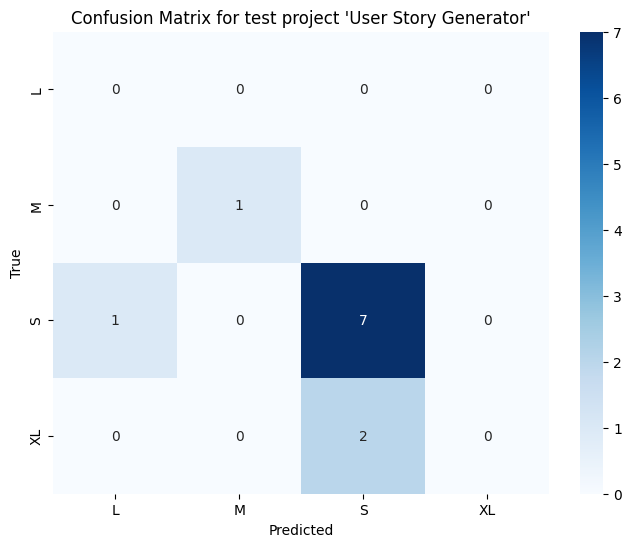

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.75      0.75      0.75         8
          XL       0.00      0.00      0.00         2

   micro avg       0.75      0.55      0.63        11
   macro avg       0.19      0.19      0.19        11
weighted avg       0.55      0.55      0.55        11
 samples avg       0.55      0.55      0.55        11

Precision: 0.5454545454545454     Recall: 0.5454545454545454      Accuracy: 0.5454545454545454      F1 Score: 0.5454545454545454

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

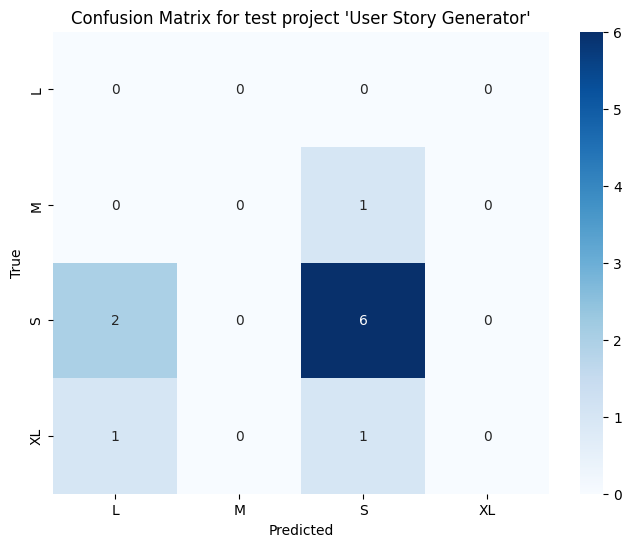

In [71]:
# Model (Numerik 4)
accuracy_list_Adaboost_nt41 = []
accuracy_list_DecisionTree_nt41 = []
accuracy_list_MultinomialNB_nt41 = []
precision_list_Adaboost_nt41 = []
precision_list_DecisionTree_nt41 = []
precision_list_MultinomialNB_nt41 = []
recall_list_Adaboost_nt41 = []
recall_list_DecisionTree_nt41 = []
recall_list_MultinomialNB_nt41 = []
f1_score_list_Adaboost_nt41 = []
f1_score_list_DecisionTree_nt41 = []
f1_score_list_MultinomialNB_nt41 = []
mean_accuracy_nt41 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_num4.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_num4.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt41.append(accuracy)
    precision_list_Adaboost_nt41.append(precision)
    recall_list_Adaboost_nt41.append(recall)
    f1_score_list_Adaboost_nt41.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt41.append(accuracy)
    precision_list_DecisionTree_nt41.append(precision)
    recall_list_DecisionTree_nt41.append(recall)
    f1_score_list_DecisionTree_nt41.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt41.append(accuracy)
    precision_list_MultinomialNB_nt41.append(precision)
    recall_list_MultinomialNB_nt41.append(recall)
    f1_score_list_MultinomialNB_nt41.append(f1)

In [72]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt41': precision_list_Adaboost_nt41,
    'Recall_Adaboost_nt41': recall_list_Adaboost_nt41,
    'Accuracy_Adaboost_nt41': accuracy_list_Adaboost_nt41,
    'F1_Score_Adaboost_nt41': f1_score_list_Adaboost_nt41,
    'Precision_DecisionTree_nt41': precision_list_DecisionTree_nt41,
    'Recall_DecisionTree_nt41': recall_list_DecisionTree_nt41,
    'Accuracy_DecisionTree_nt41': accuracy_list_DecisionTree_nt41,
    'F1_Score_DecisionTree_nt41': f1_score_list_DecisionTree_nt41,
    'Precision_MultinomialNB_nt41': precision_list_MultinomialNB_nt41,
    'Recall_MultinomialNB_nt41': recall_list_MultinomialNB_nt41,
    'Accuracy_MultinomialNB_nt41': accuracy_list_MultinomialNB_nt41,
    'F1_Score_MultinomialNB_nt41': f1_score_list_MultinomialNB_nt41,
}

# Buat DataFrame
df_result_nt41 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt41

,Project,Precision_Adaboost_nt41,Recall_Adaboost_nt41,Accuracy_Adaboost_nt41,F1_Score_Adaboost_nt41,Precision_DecisionTree_nt41,Recall_DecisionTree_nt41,Accuracy_DecisionTree_nt41,F1_Score_DecisionTree_nt41,Precision_MultinomialNB_nt41,Recall_MultinomialNB_nt41,Accuracy_MultinomialNB_nt41,F1_Score_MultinomialNB_nt41
0,Akobesi,0.558470,0.598425,0.574803,0.565000,0.585592,0.574803,0.574803,0.565000,0.499742,0.685039,0.685039,0.577901
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.680556,0.777778,0.777778,0.725926
2,Novelty Checker,1.000000,0.909091,0.909091,0.951872,0.954545,0.818182,0.727273,0.867424,0.701299,0.545455,0.545455,0.613636
3,Journal Database Reviewer,0.687500,0.750000,0.750000,0.708333,0.654167,0.687500,0.562500,0.648810,0.475962,0.562500,0.562500,0.515625
4,Git Trackr,0.466667,0.666667,0.500000,0.541667,0.541667,0.666667,0.500000,0.595238,0.300000,0.500000,0.500000,0.375000
5,Seareq,1.000000,0.750000,0.750000,0.850000,1.000000,0.750000,0.750000,0.850000,0.562500,0.750000,0.750000,0.642857
6,Sales Monitoring on Multimarket,0.846154,0.611111,0.611111,0.628571,0.581699,0.722222,0.611111,0.625798,0.444444,0.666667,0.666667,0.533333
7,Ucase,1.000000,1.000000,1.000000,1.000000,0.895833,0.875000,0.750000,0.859848,0.446429,0.625000,0.625000,0.520833
8,DFD Generator,1.000000,0.846154,0.846154,0.912821,0.942308,0.923077,0.923077,0.926007,0.492308,0.615385,0.615385,0.547009
9,User Story Generator,1.000000,0.818182,0.818182,0.896104,0.838384,0.909091,0.727273,0.871658,0.545455,0.545455,0.545455,0.545455


In [73]:
# Mean Accuracy
mean_accuracy_nt41.append(np.mean(accuracy_list_Adaboost_nt41))
mean_accuracy_nt41.append(np.mean(accuracy_list_DecisionTree_nt41))
mean_accuracy_nt41.append(np.mean(accuracy_list_MultinomialNB_nt41))
print("Mean Accuracy")
print(mean_accuracy_nt41)

Mean Accuracy
[0.7759340834143983, 0.7126036638339788, 0.627327752081689]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.71      0.71       127
   macro avg       0.43      0.26      0.22       127
weighted avg       0.74      0.71      0.59       127
 samples avg       0.70      0.71      0.71       127

Precision: 0.7351974703949408     Recall: 0.7086614173228346      Accuracy: 0.7007874015748031      F1 Score: 0.5927566345873432

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


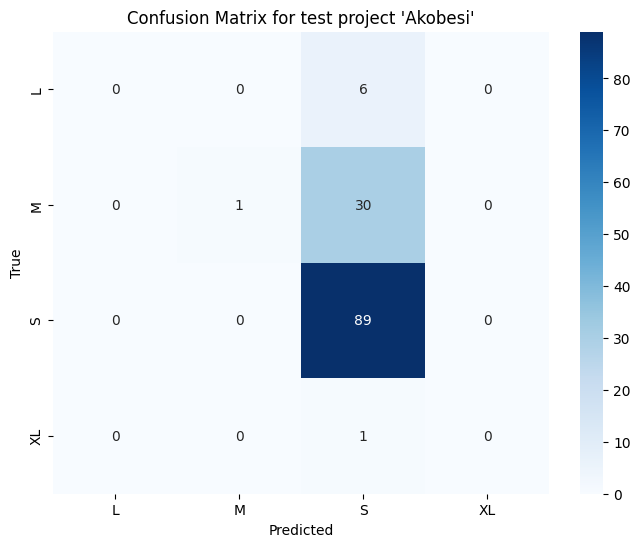

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.70      1.00      0.82        89
          XL       0.00      0.00      0.00         1

   micro avg       0.70      0.70      0.70       127
   macro avg       0.18      0.25      0.21       127
weighted avg       0.49      0.70      0.58       127
 samples avg       0.70      0.70      0.70       127

Precision: 0.49110298220596443     Recall: 0.7007874015748031      Accuracy: 0.7007874015748031      F1 Score: 0.5775007290755322

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


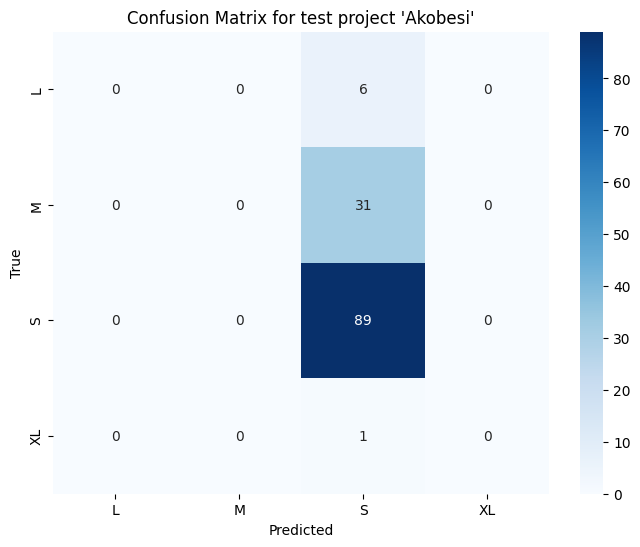

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.72      0.87      0.79        89
          XL       0.03      1.00      0.05         1

   micro avg       0.54      0.62      0.58       127
   macro avg       0.44      0.47      0.22       127
weighted avg       0.75      0.62      0.57       127
 samples avg       0.57      0.62      0.59       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.7486013385638081     Recall: 0.6220472440944882      Accuracy: 0.5118110236220472      F1 Score: 0.5662682789651293

Confusion matrix for test project 'Akobesi':


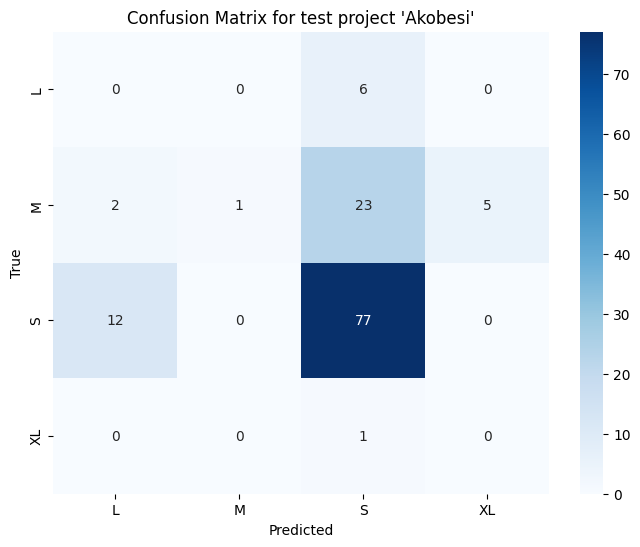

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

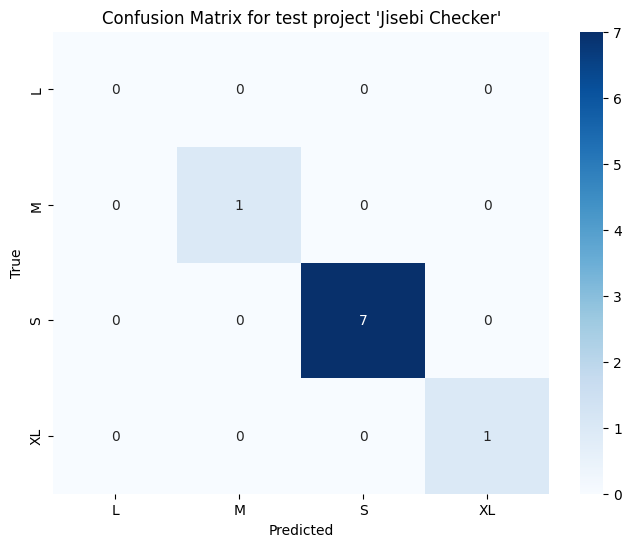

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

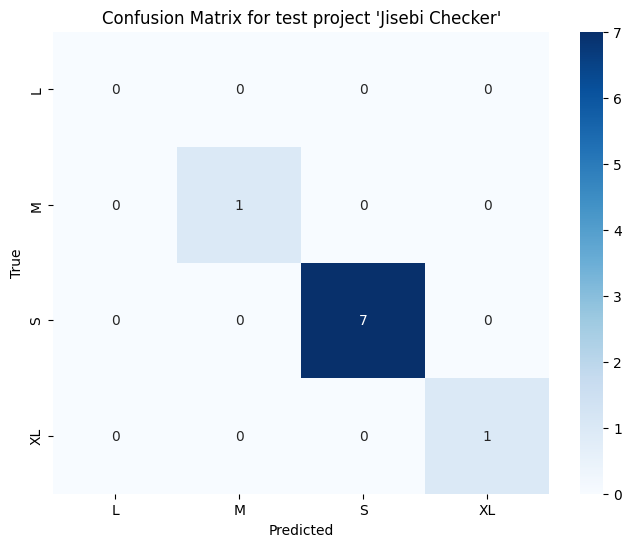

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.60      0.67      0.63         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

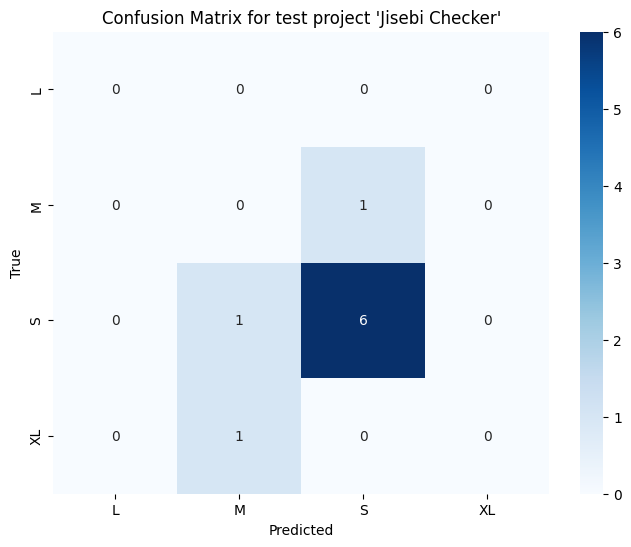

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9215686274509803

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

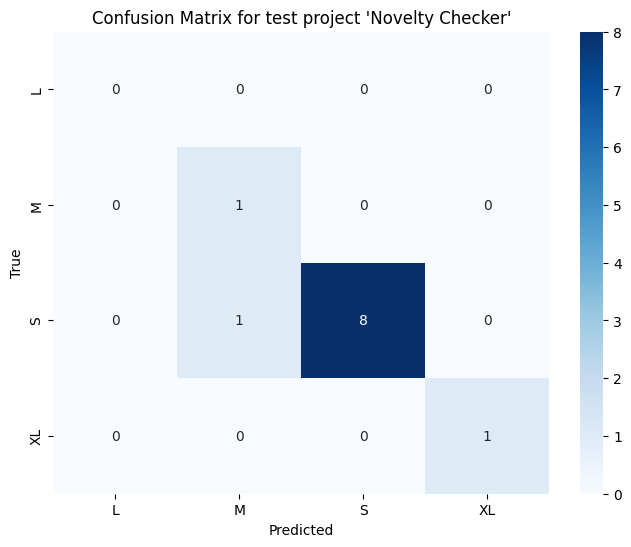

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.89      0.94         9
          XL       1.00      1.00      1.00         1

   micro avg       0.91      0.91      0.91        11
   macro avg       0.62      0.72      0.65        11
weighted avg       0.95      0.91      0.92        11
 samples avg       0.91      0.91      0.91        11

Precision: 0.9545454545454546     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9215686274509803

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

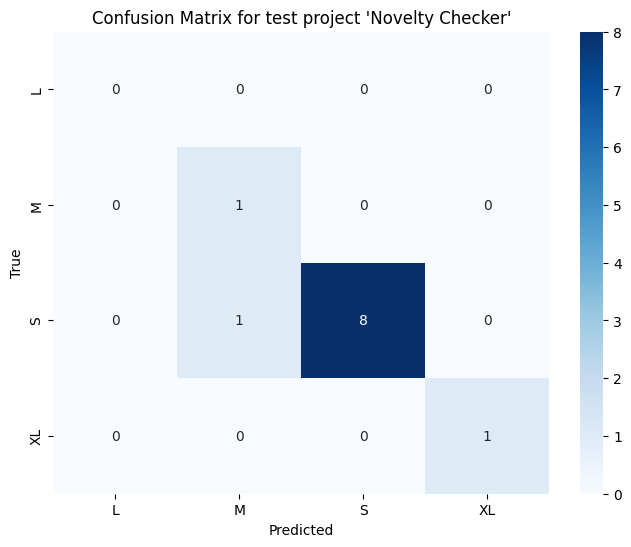

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.80      0.89      0.84         9
          XL       0.00      0.00      0.00         1

   micro avg       0.80      0.73      0.76        11
   macro avg       0.20      0.22      0.21        11
weighted avg       0.65      0.73      0.69        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.6545454545454545     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.6889952153110048

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

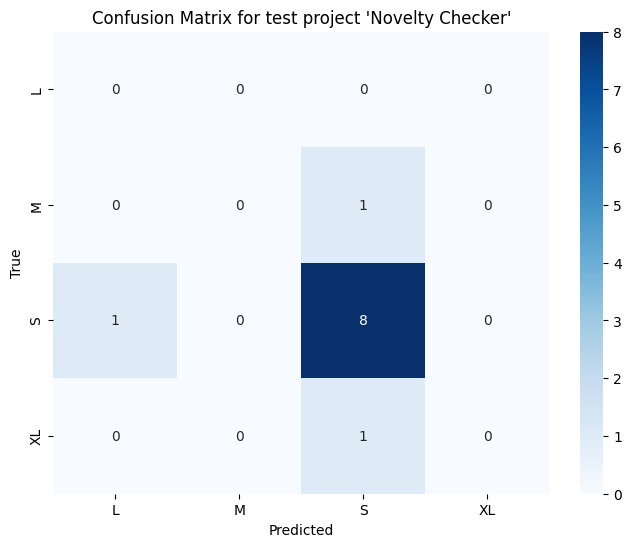

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

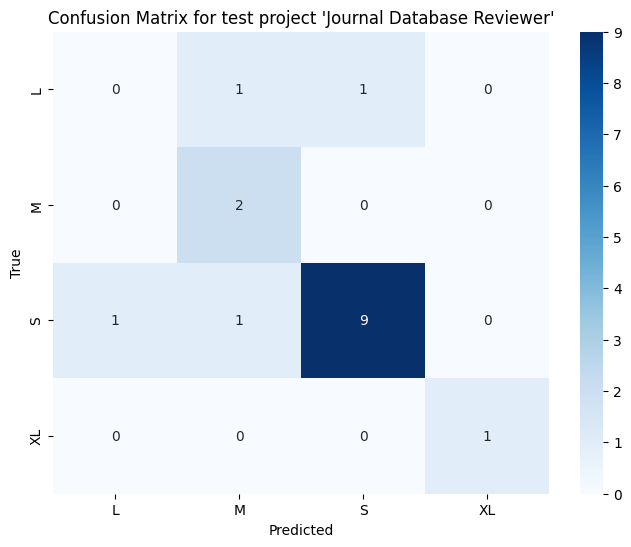

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

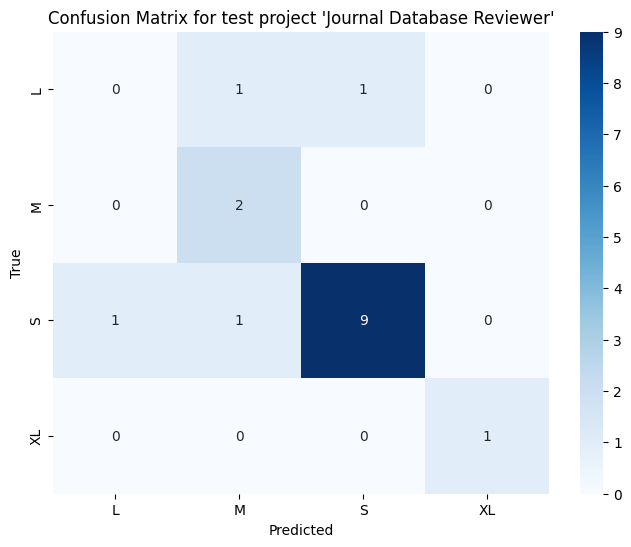

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       1.00      0.50      0.67         2
           M       0.00      0.00      0.00         2
           S       0.62      0.73      0.67        11
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.56      0.53        16
   macro avg       0.40      0.31      0.33        16
weighted avg       0.55      0.56      0.54        16
 samples avg       0.52      0.56      0.53        16

Precision: 0.5480769230769231     Recall: 0.5625      Accuracy: 0.5      F1 Score: 0.5416666666666667

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


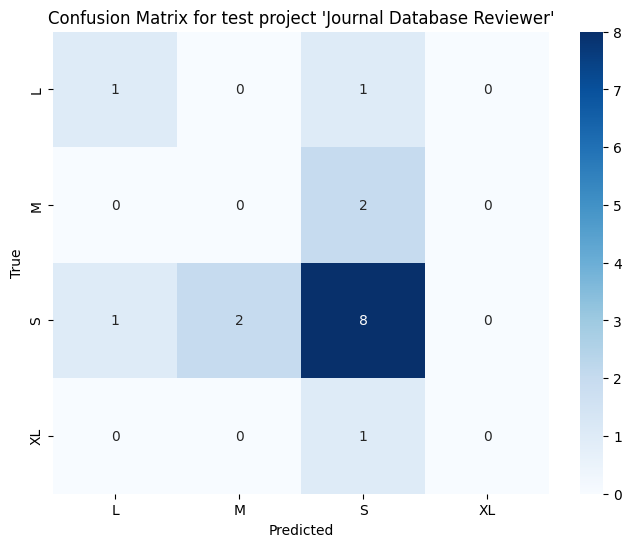

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

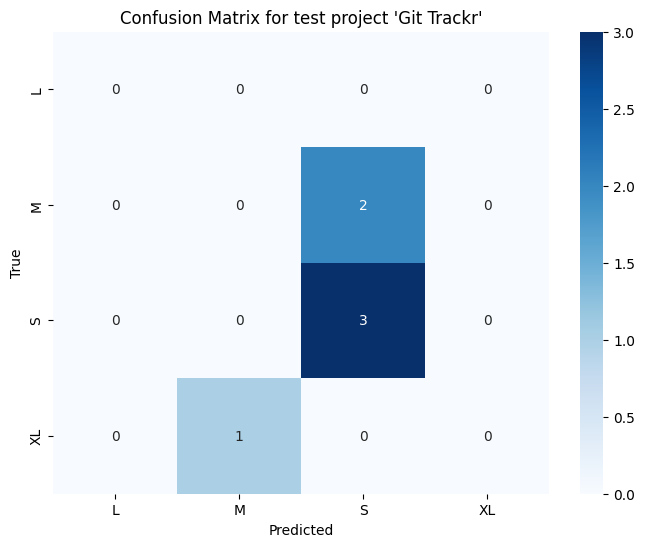

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      0.67      0.67         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.67      0.67      0.67         6

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

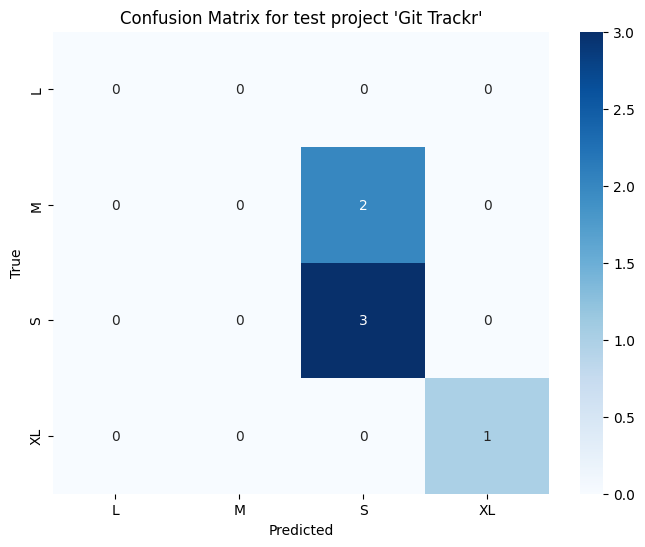

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

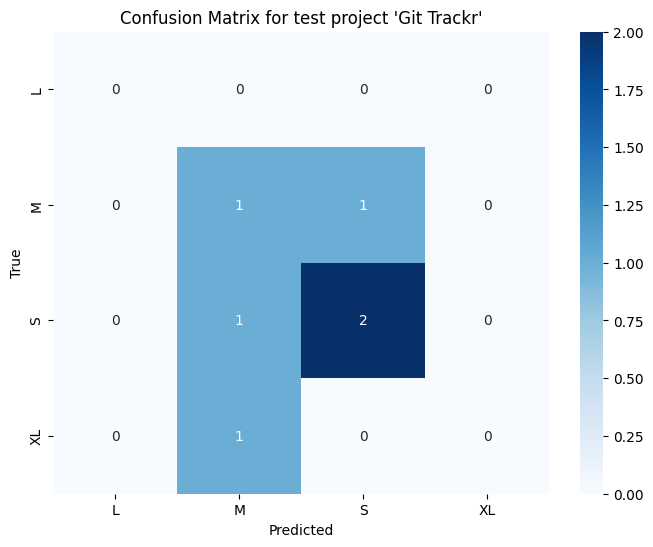

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      1.00      1.00         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         4
   macro avg       0.50      0.50      0.50         4
weighted avg       1.00      1.00      1.00         4
 samples avg       1.00      1.00      1.00         4

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

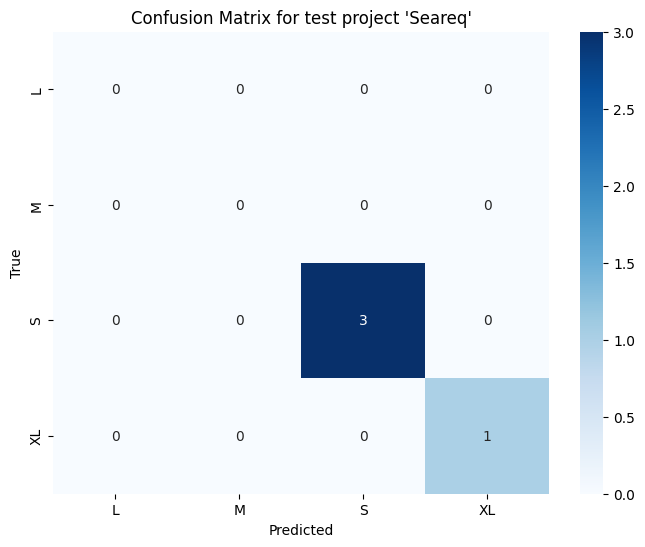

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      1.00      1.00         3
          XL       1.00      1.00      1.00         1

   micro avg       0.67      1.00      0.80         4
   macro avg       0.50      0.50      0.50         4
weighted avg       1.00      1.00      1.00         4
 samples avg       0.75      1.00      0.83         4

Precision: 1.0     Recall: 1.0      Accuracy: 0.5      F1 Score: 1.0

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

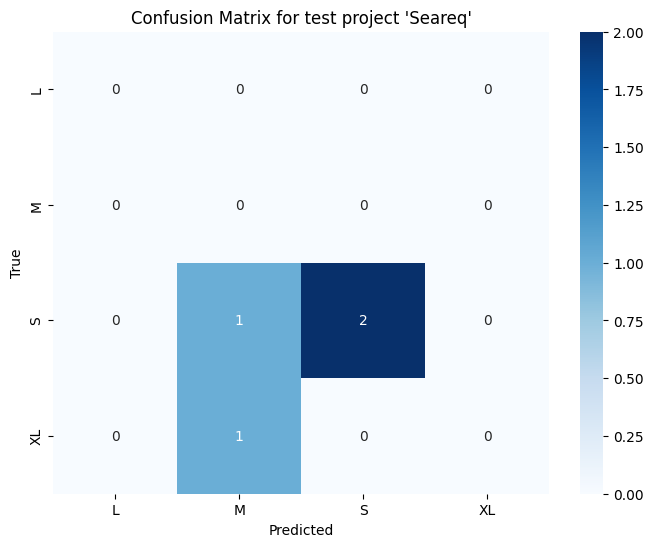

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       0.50      1.00      0.67         1

   micro avg       0.50      0.75      0.60         4
   macro avg       0.38      0.42      0.37         4
weighted avg       0.88      0.75      0.77         4
 samples avg       0.62      0.75      0.67         4



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.875     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.7666666666666667

Confusion matrix for test project 'Seareq':


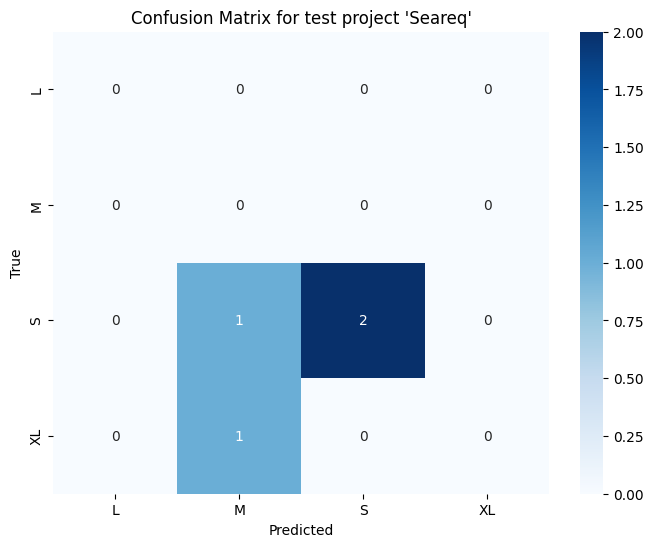

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.72      0.72      0.72        18
   macro avg       0.43      0.29      0.28        18
weighted avg       0.80      0.72      0.65        18
 samples avg       0.72      0.72      0.72        18

Precision: 0.803921568627451     Recall: 0.7222222222222222      Accuracy: 0.7222222222222222      F1 Score: 0.6469622331691297

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

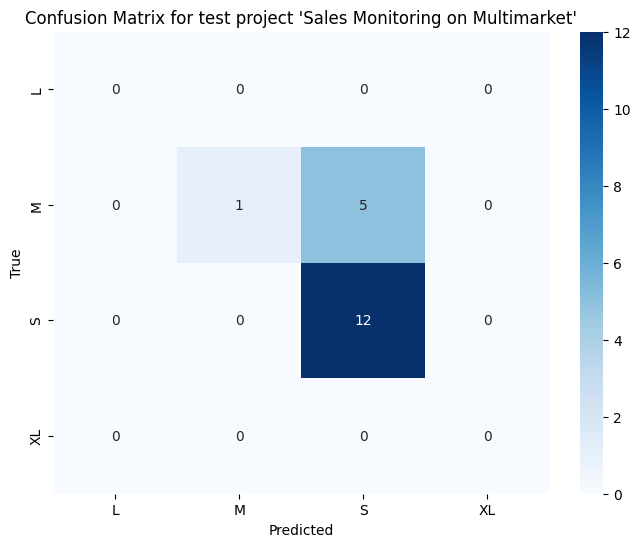

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.74      0.78      0.76        18
   macro avg       0.43      0.33      0.33        18
weighted avg       0.80      0.78      0.72        18
 samples avg       0.75      0.78      0.76        18

Precision: 0.803921568627451     Recall: 0.7777777777777778      Accuracy: 0.7222222222222222      F1 Score: 0.7183908045977012

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

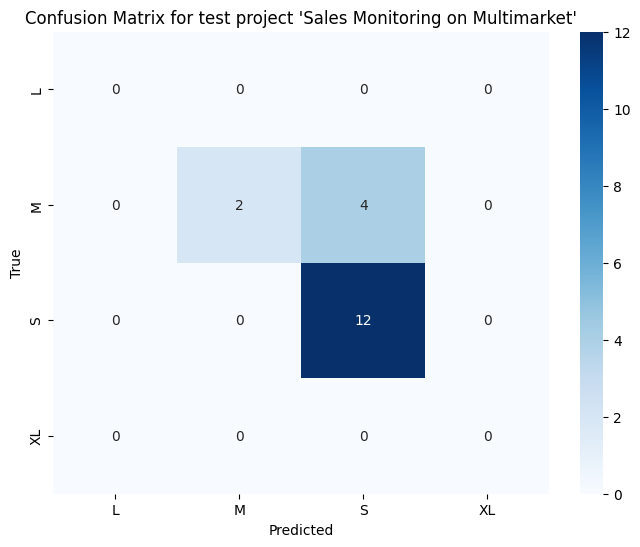

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.75      0.75      0.75        12
          XL       0.00      0.00      0.00         0

   micro avg       0.67      0.56      0.61        18
   macro avg       0.44      0.23      0.26        18
weighted avg       0.83      0.56      0.60        18
 samples avg       0.56      0.56      0.56        18



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.8333333333333334     Recall: 0.5555555555555556      Accuracy: 0.5555555555555556      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Sales Monitoring on Multimarket':


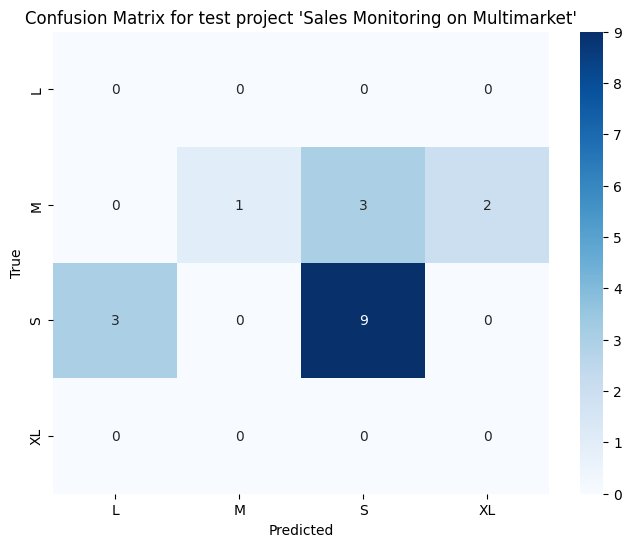

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


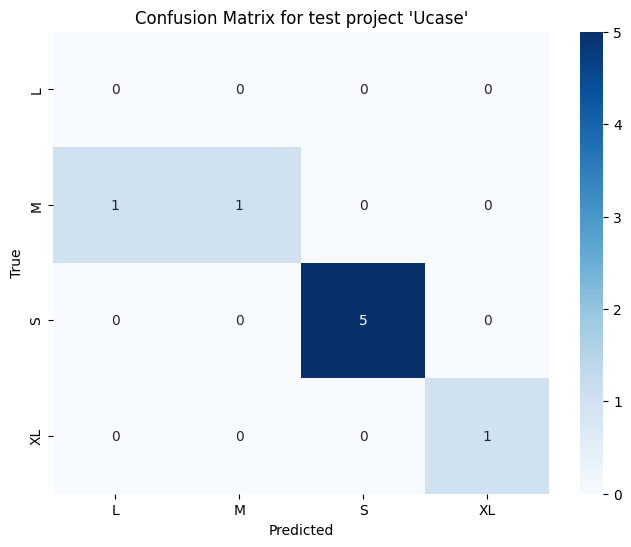

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

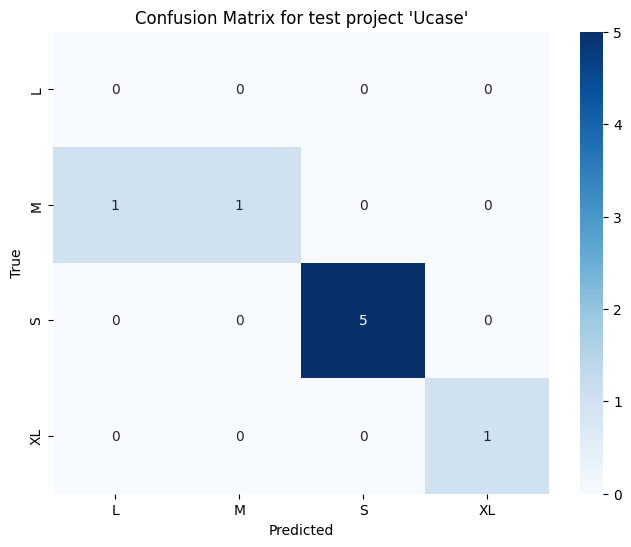

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.57      0.80      0.67         5
          XL       0.00      0.00      0.00         1

   micro avg       0.57      0.50      0.53         8
   macro avg       0.14      0.20      0.17         8
weighted avg       0.36      0.50      0.42         8
 samples avg       0.50      0.50      0.50         8



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.3571428571428571     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.41666666666666663

Confusion matrix for test project 'Ucase':


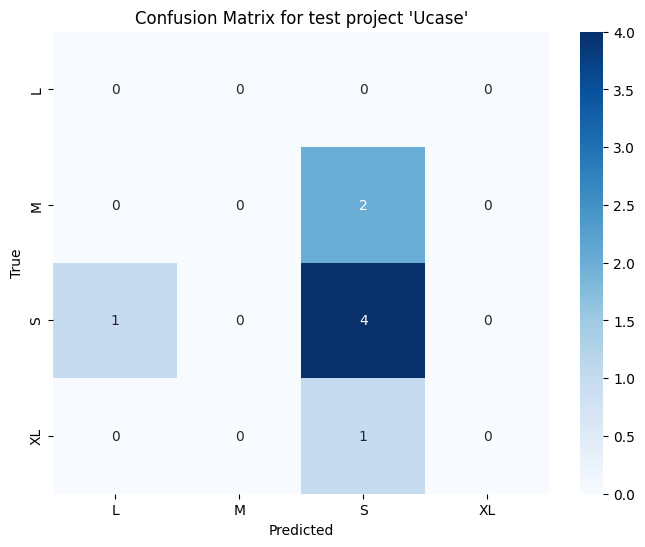

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.85      0.88        13
   macro avg       0.72      0.58      0.61        13
weighted avg       0.93      0.85      0.85        13
 samples avg       0.85      0.85      0.85        13

Precision: 0.9316239316239316     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.8484162895927602

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

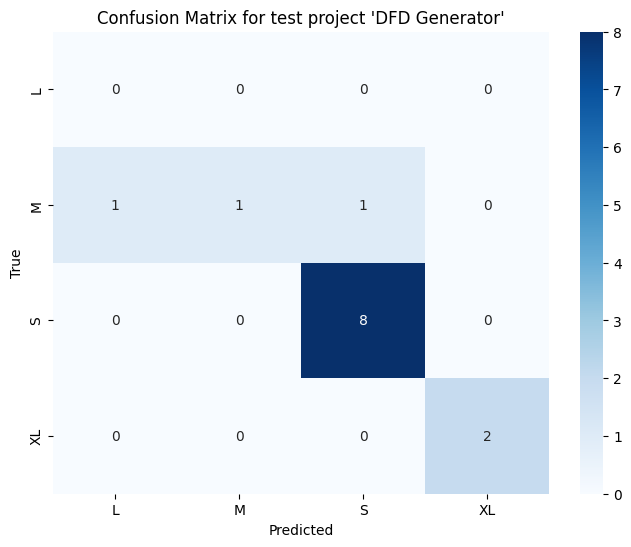

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.67      0.80         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.92      0.92        13
   macro avg       0.72      0.67      0.69        13
weighted avg       0.93      0.92      0.92        13
 samples avg       0.92      0.92      0.92        13

Precision: 0.9316239316239316     Recall: 0.9230769230769231      Accuracy: 0.9230769230769231      F1 Score: 0.9176470588235295

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

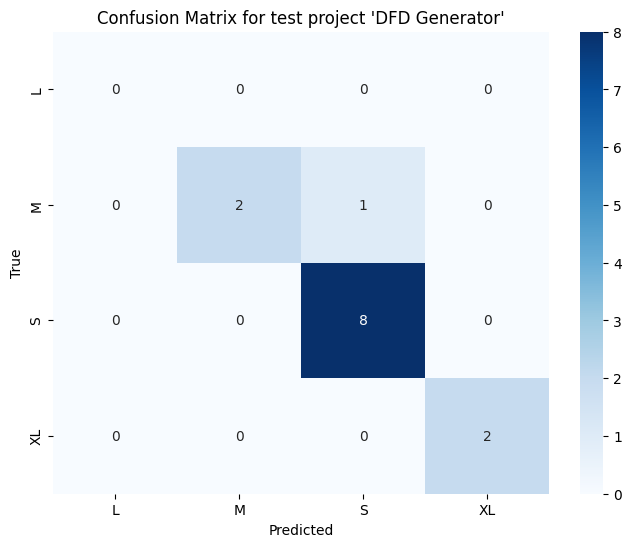

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.58      0.88      0.70         8
          XL       0.00      0.00      0.00         2

   micro avg       0.58      0.54      0.56        13
   macro avg       0.15      0.22      0.18        13
weighted avg       0.36      0.54      0.43        13
 samples avg       0.54      0.54      0.54        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.358974358974359     Recall: 0.5384615384615384      Accuracy: 0.5384615384615384      F1 Score: 0.4307692307692308

Confusion matrix for test project 'DFD Generator':


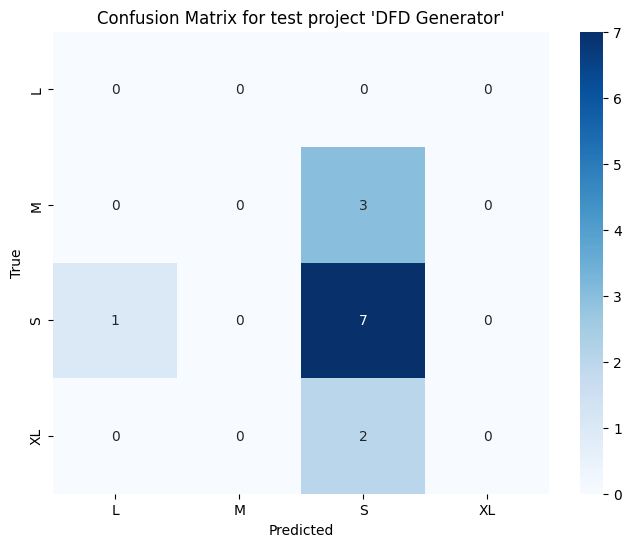

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      0.88      0.93         8
          XL       1.00      1.00      1.00         2

   micro avg       1.00      0.91      0.95        11
   macro avg       0.75      0.72      0.73        11
weighted avg       1.00      0.91      0.95        11
 samples avg       0.91      0.91      0.91        11

Precision: 1.0     Recall: 0.9090909090909091      Accuracy: 0.9090909090909091      F1 Score: 0.9515151515151515

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

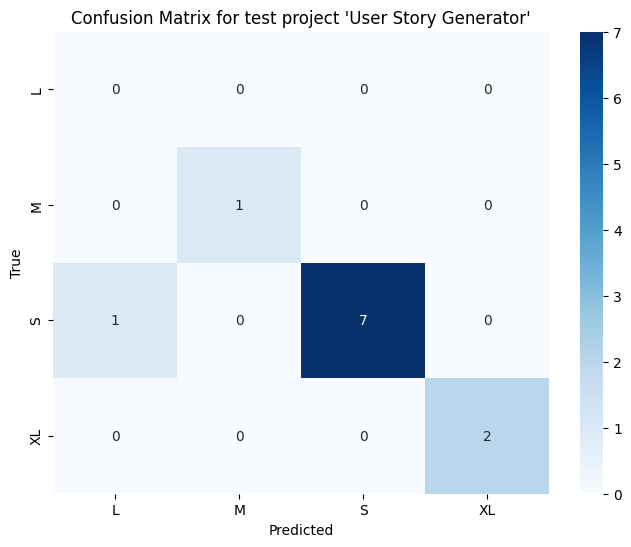

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      1.00      1.00         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      1.00      0.96        11
   macro avg       0.62      0.75      0.67        11
weighted avg       0.95      1.00      0.97        11
 samples avg       0.95      1.00      0.97        11

Precision: 0.9545454545454546     Recall: 1.0      Accuracy: 0.9090909090909091      F1 Score: 0.9696969696969696

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

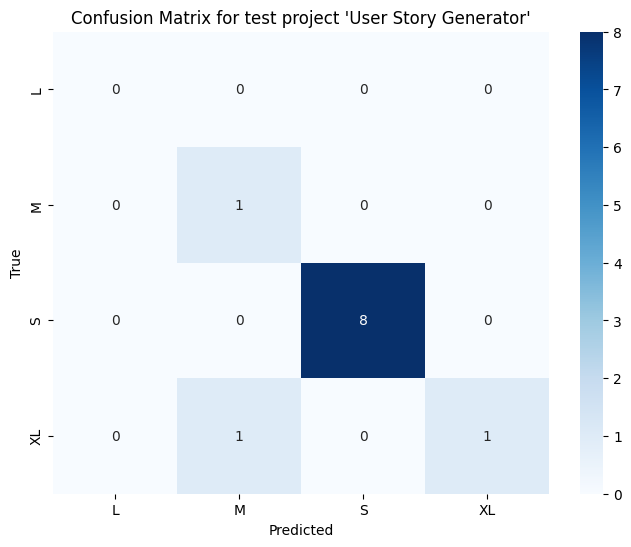

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.70      0.88      0.78         8
          XL       0.00      0.00      0.00         2

   micro avg       0.70      0.64      0.67        11
   macro avg       0.17      0.22      0.19        11
weighted avg       0.51      0.64      0.57        11
 samples avg       0.64      0.64      0.64        11

Precision: 0.509090909090909     Recall: 0.6363636363636364      Accuracy: 0.6363636363636364      F1 Score: 0.5656565656565656

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

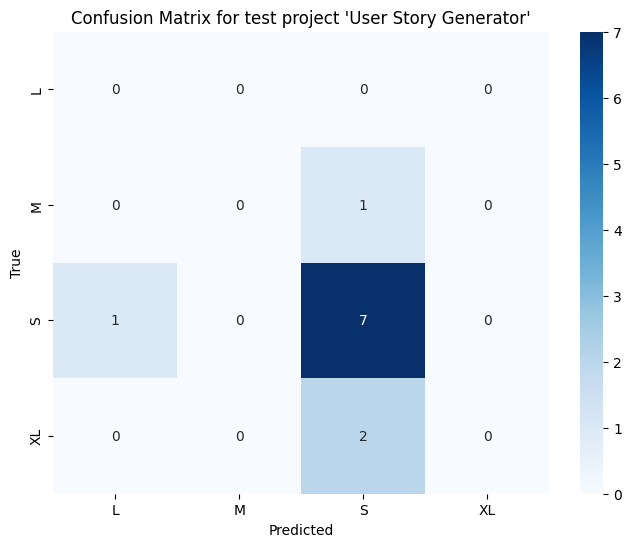

In [74]:
# Model (Numerik 4)
accuracy_list_Adaboost_nt42 = []
accuracy_list_DecisionTree_nt42 = []
accuracy_list_MultinomialNB_nt42 = []
precision_list_Adaboost_nt42 = []
precision_list_DecisionTree_nt42 = []
precision_list_MultinomialNB_nt42 = []
recall_list_Adaboost_nt42 = []
recall_list_DecisionTree_nt42 = []
recall_list_MultinomialNB_nt42 = []
f1_score_list_Adaboost_nt42 = []
f1_score_list_DecisionTree_nt42 = []
f1_score_list_MultinomialNB_nt42 = []
mean_accuracy_nt42 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_user_story_num3.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_user_story_num3.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt42.append(accuracy)
    precision_list_Adaboost_nt42.append(precision)
    recall_list_Adaboost_nt42.append(recall)
    f1_score_list_Adaboost_nt42.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt42.append(accuracy)
    precision_list_DecisionTree_nt42.append(precision)
    recall_list_DecisionTree_nt42.append(recall)
    f1_score_list_DecisionTree_nt42.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt42.append(accuracy)
    precision_list_MultinomialNB_nt42.append(precision)
    recall_list_MultinomialNB_nt42.append(recall)
    f1_score_list_MultinomialNB_nt42.append(f1)

In [75]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt42': precision_list_Adaboost_nt42,
    'Recall_Adaboost_nt42': recall_list_Adaboost_nt42,
    'Accuracy_Adaboost_nt42': accuracy_list_Adaboost_nt42,
    'F1_Score_Adaboost_nt42': f1_score_list_Adaboost_nt42,
    'Precision_DecisionTree_nt42': precision_list_DecisionTree_nt42,
    'Recall_DecisionTree_nt42': recall_list_DecisionTree_nt42,
    'Accuracy_DecisionTree_nt42': accuracy_list_DecisionTree_nt42,
    'F1_Score_DecisionTree_nt42': f1_score_list_DecisionTree_nt42,
    'Precision_MultinomialNB_nt42': precision_list_MultinomialNB_nt42,
    'Recall_MultinomialNB_nt42': recall_list_MultinomialNB_nt42,
    'Accuracy_MultinomialNB_nt42': accuracy_list_MultinomialNB_nt42,
    'F1_Score_MultinomialNB_nt42': f1_score_list_MultinomialNB_nt42,
}

# Buat DataFrame
df_result_nt42 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt42

,Project,Precision_Adaboost_nt42,Recall_Adaboost_nt42,Accuracy_Adaboost_nt42,F1_Score_Adaboost_nt42,Precision_DecisionTree_nt42,Recall_DecisionTree_nt42,Accuracy_DecisionTree_nt42,F1_Score_DecisionTree_nt42,Precision_MultinomialNB_nt42,Recall_MultinomialNB_nt42,Accuracy_MultinomialNB_nt42,F1_Score_MultinomialNB_nt42
0,Akobesi,0.735197,0.708661,0.700787,0.592757,0.491103,0.700787,0.700787,0.577501,0.748601,0.622047,0.511811,0.566268
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,0.954545,0.909091,0.909091,0.921569,0.954545,0.909091,0.909091,0.921569,0.654545,0.727273,0.727273,0.688995
3,Journal Database Reviewer,0.743750,0.750000,0.750000,0.735119,0.743750,0.750000,0.750000,0.735119,0.548077,0.562500,0.500000,0.541667
4,Git Trackr,0.466667,0.666667,0.500000,0.541667,0.466667,0.666667,0.666667,0.541667,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.500000,1.000000,0.875000,0.750000,0.500000,0.766667
6,Sales Monitoring on Multimarket,0.803922,0.722222,0.722222,0.646962,0.803922,0.777778,0.722222,0.718391,0.833333,0.555556,0.555556,0.595238
7,Ucase,1.000000,0.875000,0.875000,0.916667,1.000000,0.875000,0.875000,0.916667,0.357143,0.500000,0.500000,0.416667
8,DFD Generator,0.931624,0.846154,0.846154,0.848416,0.931624,0.923077,0.923077,0.917647,0.358974,0.538462,0.538462,0.430769
9,User Story Generator,1.000000,0.909091,0.909091,0.951515,0.954545,1.000000,0.909091,0.969697,0.509091,0.636364,0.636364,0.565657


In [76]:
# Mean Accuracy
mean_accuracy_nt42.append(np.mean(accuracy_list_Adaboost_nt42))
mean_accuracy_nt42.append(np.mean(accuracy_list_DecisionTree_nt42))
mean_accuracy_nt42.append(np.mean(accuracy_list_MultinomialNB_nt42))
print("Mean Accuracy")
print(mean_accuracy_nt42)

Mean Accuracy
[0.821234528813269, 0.7955935031722434, 0.5636131147942172]


====================Adaboost====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.33      0.03      0.06        31
           S       0.68      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.63      0.65       127
   macro avg       0.25      0.23      0.21       127
weighted avg       0.56      0.63      0.55       127
 samples avg       0.63      0.63      0.63       127

Precision: 0.5586252149515792     Recall: 0.6299212598425197      Accuracy: 0.6299212598425197      F1 Score: 0.5544775697872774

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

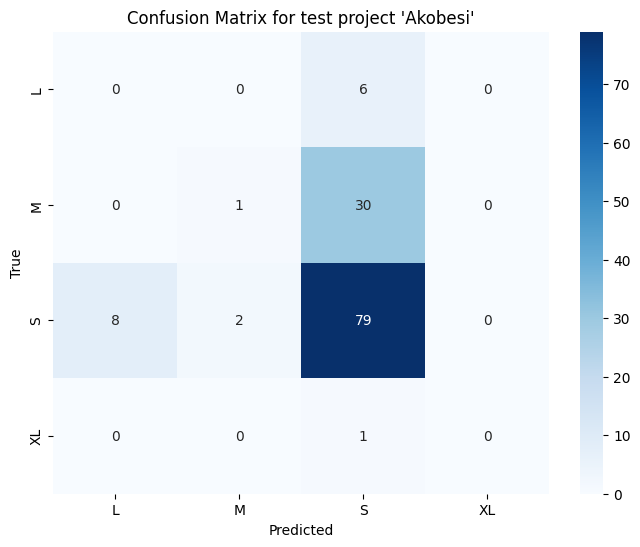

====================Decision Tree====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       0.00      0.00      0.00        31
           S       0.68      0.89      0.77        89
          XL       0.00      0.00      0.00         1

   micro avg       0.68      0.62      0.65       127
   macro avg       0.17      0.22      0.19       127
weighted avg       0.48      0.62      0.54       127
 samples avg       0.62      0.62      0.62       127

Precision: 0.47726038555525385     Recall: 0.6220472440944882      Accuracy: 0.6220472440944882      F1 Score: 0.5401190704820434

Confusion matrix for test project 'Akobesi':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

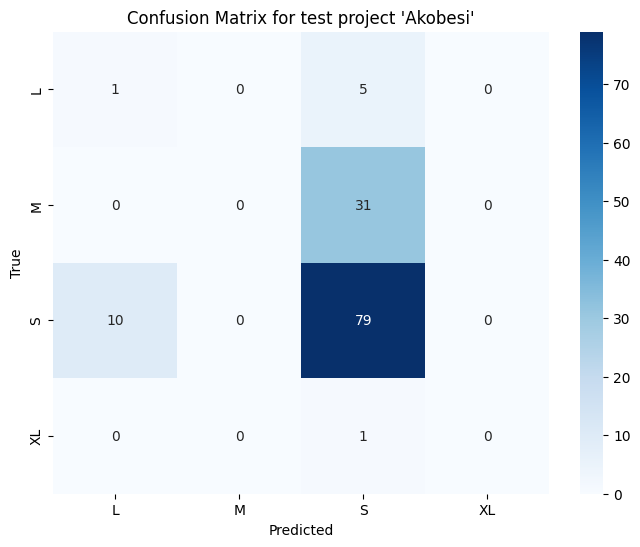

====================Multinomial Naive Bayes====================

Classification report for test project 'Akobesi':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         6
           M       1.00      0.03      0.06        31
           S       0.71      0.88      0.78        89
          XL       0.04      1.00      0.08         1

   micro avg       0.60      0.63      0.61       127
   macro avg       0.44      0.48      0.23       127
weighted avg       0.74      0.63      0.57       127
 samples avg       0.61      0.63      0.62       127



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.7413588123618935     Recall: 0.6299212598425197      Accuracy: 0.5984251968503937      F1 Score: 0.5652730516097547

Confusion matrix for test project 'Akobesi':


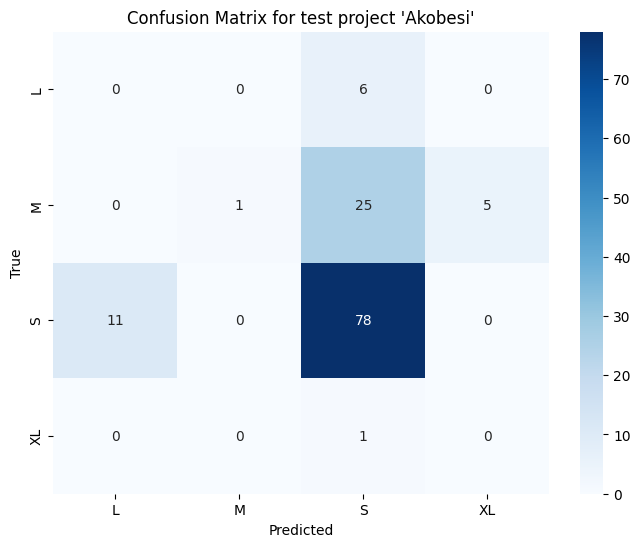

====================Adaboost====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

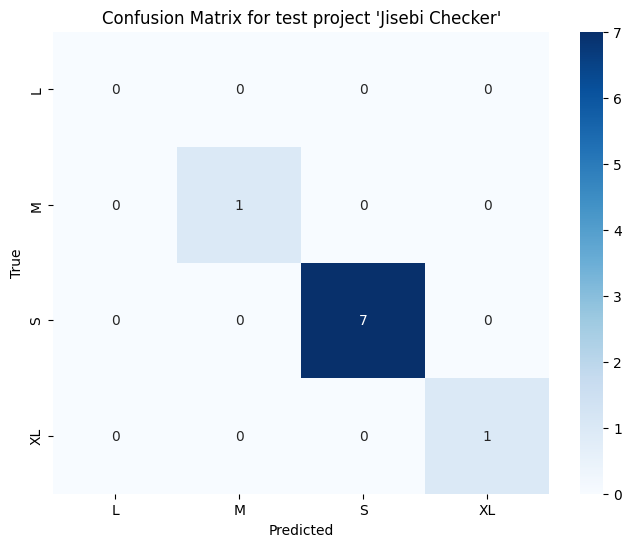

====================Decision Tree====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       1.00      1.00      1.00         7
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         9
   macro avg       0.75      0.75      0.75         9
weighted avg       1.00      1.00      1.00         9
 samples avg       1.00      1.00      1.00         9

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Jisebi Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

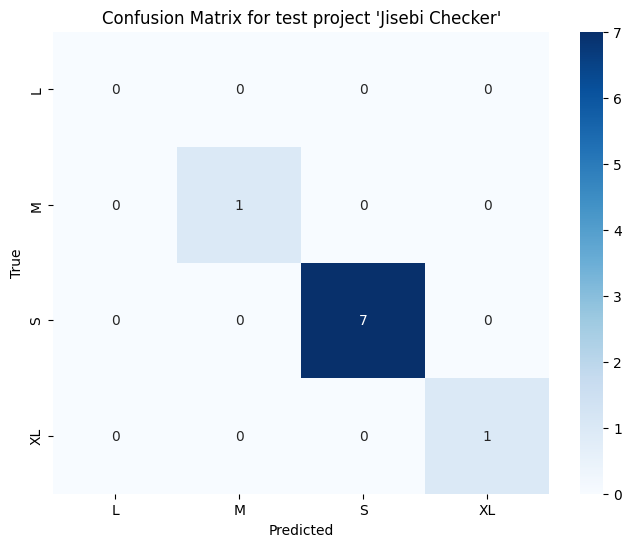

====================Multinomial Naive Bayes====================

Classification report for test project 'Jisebi Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.86      0.86      0.86         7
          XL       0.00      0.00      0.00         1

   micro avg       0.67      0.67      0.67         9
   macro avg       0.21      0.21      0.21         9
weighted avg       0.67      0.67      0.67         9
 samples avg       0.67      0.67      0.67         9



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.6666666666666666     Recall: 0.6666666666666666      Accuracy: 0.6666666666666666      F1 Score: 0.6666666666666666

Confusion matrix for test project 'Jisebi Checker':


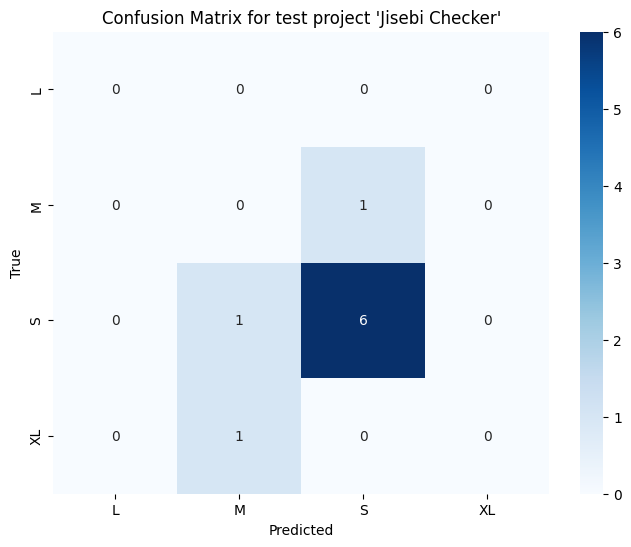

====================Adaboost====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


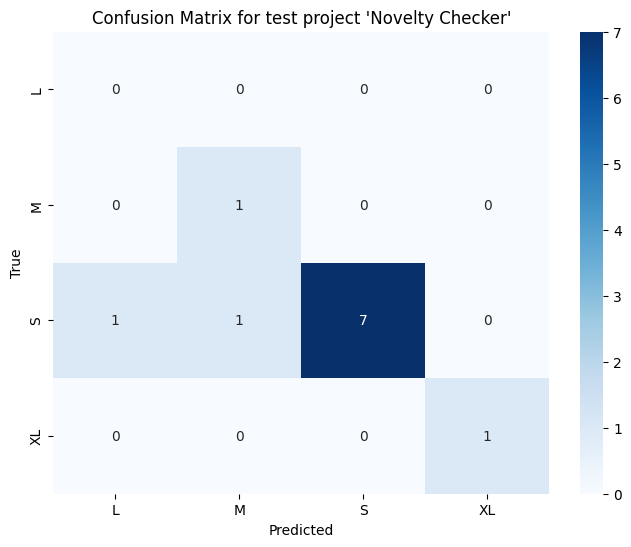

====================Decision Tree====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         1
           S       1.00      0.78      0.88         9
          XL       1.00      1.00      1.00         1

   micro avg       0.90      0.82      0.86        11
   macro avg       0.62      0.69      0.64        11
weighted avg       0.95      0.82      0.87        11
 samples avg       0.82      0.82      0.82        11

Precision: 0.9545454545454546     Recall: 0.8181818181818182      Accuracy: 0.8181818181818182      F1 Score: 0.8674242424242425

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

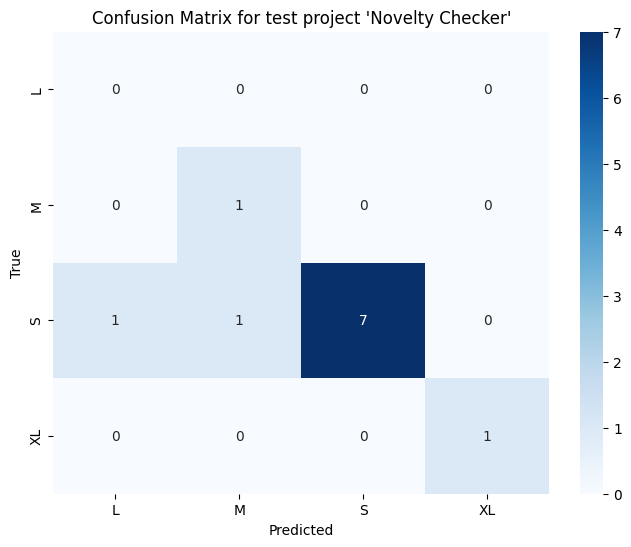

====================Multinomial Naive Bayes====================

Classification report for test project 'Novelty Checker':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.80      0.89      0.84         9
          XL       0.00      0.00      0.00         1

   micro avg       0.80      0.73      0.76        11
   macro avg       0.20      0.22      0.21        11
weighted avg       0.65      0.73      0.69        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.6545454545454545     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.6889952153110048

Confusion matrix for test project 'Novelty Checker':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

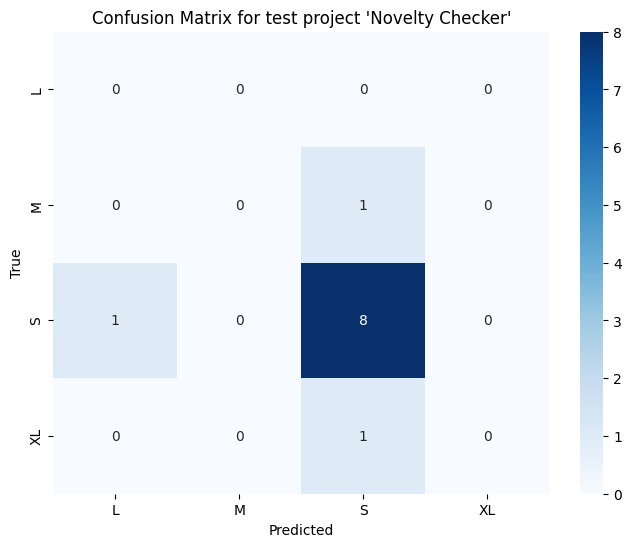

====================Adaboost====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


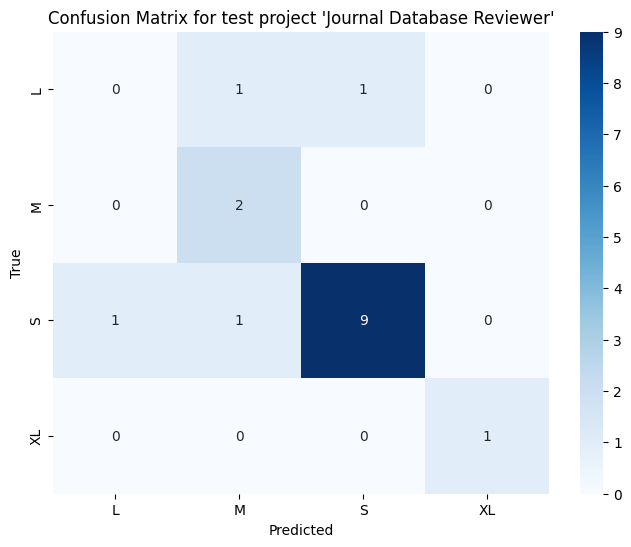

====================Decision Tree====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.50      1.00      0.67         2
           S       0.90      0.82      0.86        11
          XL       1.00      1.00      1.00         1

   micro avg       0.80      0.75      0.77        16
   macro avg       0.60      0.70      0.63        16
weighted avg       0.74      0.75      0.74        16
 samples avg       0.75      0.75      0.75        16

Precision: 0.74375     Recall: 0.75      Accuracy: 0.75      F1 Score: 0.7351190476190477

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

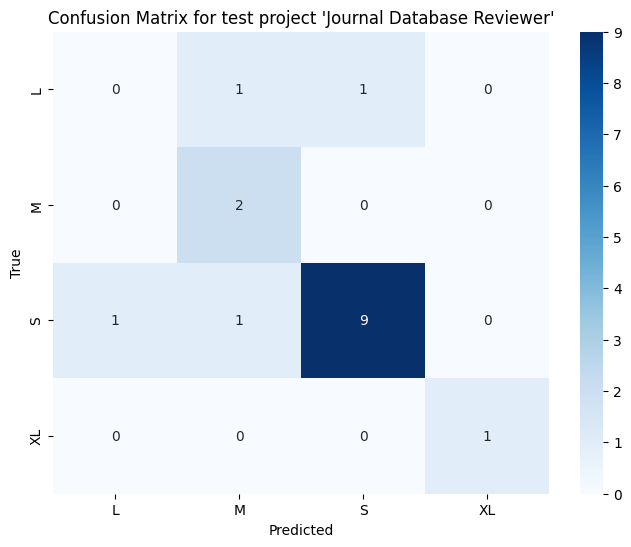

====================Multinomial Naive Bayes====================

Classification report for test project 'Journal Database Reviewer':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         2
           M       0.00      0.00      0.00         2
           S       0.58      0.64      0.61        11
          XL       0.00      0.00      0.00         1

   micro avg       0.44      0.44      0.44        16
   macro avg       0.15      0.16      0.15        16
weighted avg       0.40      0.44      0.42        16
 samples avg       0.44      0.44      0.44        16

Precision: 0.4010416666666667     Recall: 0.4375      Accuracy: 0.4375      F1 Score: 0.41847826086956524

Confusion matrix for test project 'Journal Database Reviewer':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier,

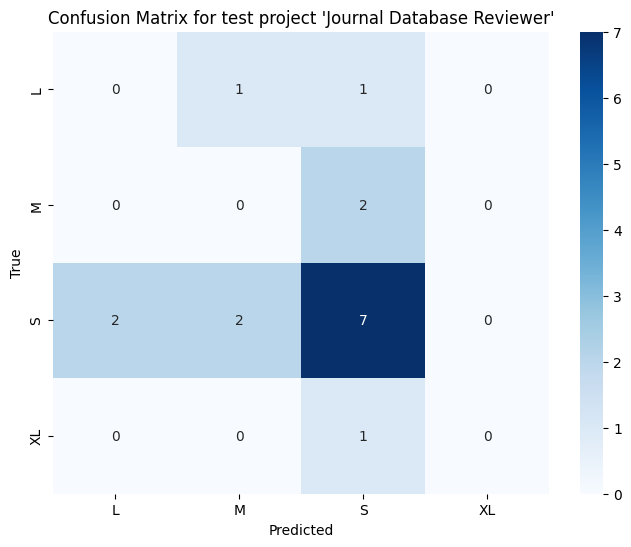

====================Adaboost====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.60      1.00      0.75         3
          XL       1.00      1.00      1.00         1

   micro avg       0.57      0.67      0.62         6
   macro avg       0.40      0.50      0.44         6
weighted avg       0.47      0.67      0.54         6
 samples avg       0.58      0.67      0.61         6



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.4666666666666666     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5416666666666666

Confusion matrix for test project 'Git Trackr':


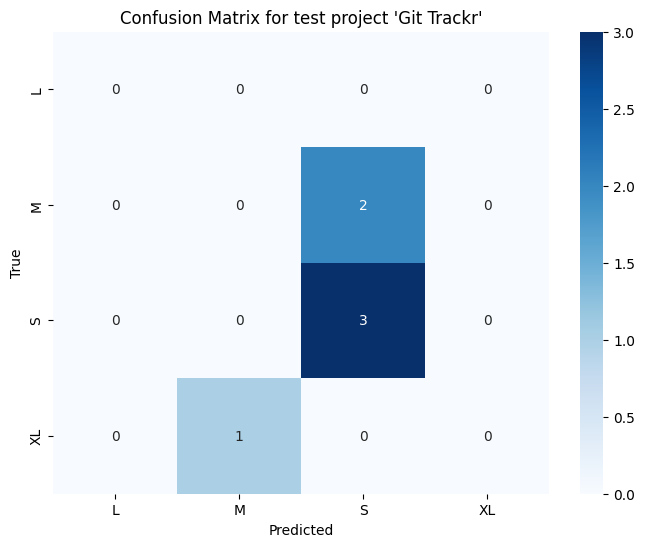

====================Decision Tree====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.50      1.00      0.67         3
          XL       1.00      1.00      1.00         1

   micro avg       0.50      0.67      0.57         6
   macro avg       0.38      0.50      0.42         6
weighted avg       0.42      0.67      0.50         6
 samples avg       0.56      0.67      0.58         6

Precision: 0.4166666666666667     Recall: 0.6666666666666666      Accuracy: 0.5      F1 Score: 0.5

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

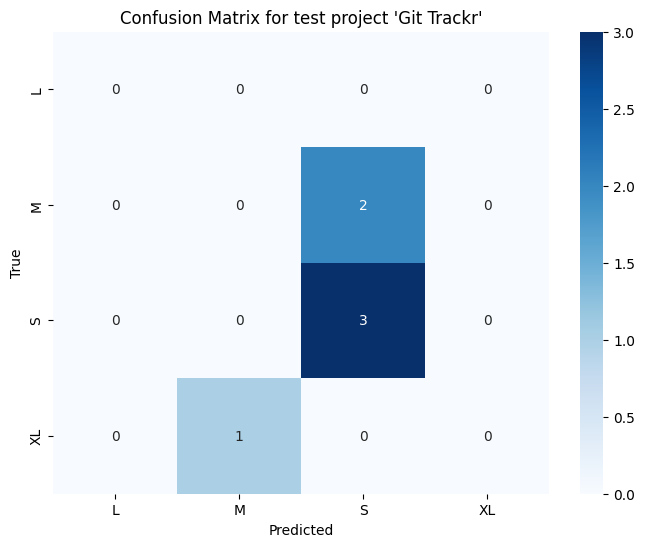

====================Multinomial Naive Bayes====================

Classification report for test project 'Git Trackr':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.33      0.50      0.40         2
           S       0.67      0.67      0.67         3
          XL       0.00      0.00      0.00         1

   micro avg       0.50      0.50      0.50         6
   macro avg       0.25      0.29      0.27         6
weighted avg       0.44      0.50      0.47         6
 samples avg       0.50      0.50      0.50         6

Precision: 0.4444444444444444     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.4666666666666666

Confusion matrix for test project 'Git Trackr':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

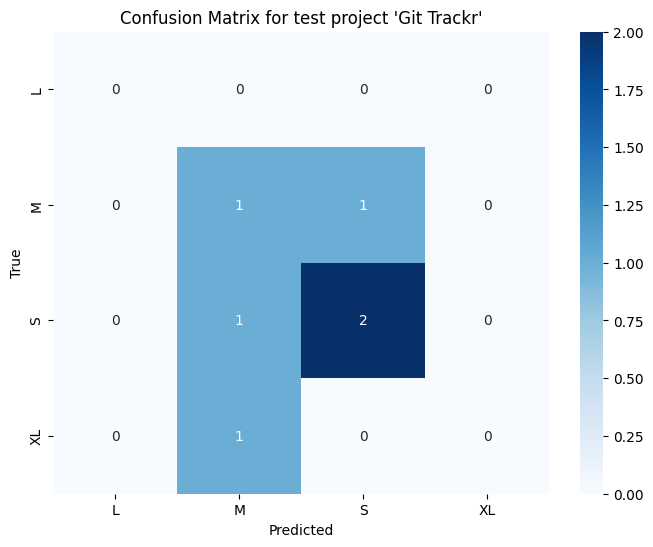

====================Adaboost====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      1.00      1.00         3
          XL       1.00      1.00      1.00         1

   micro avg       1.00      1.00      1.00         4
   macro avg       0.50      0.50      0.50         4
weighted avg       1.00      1.00      1.00         4
 samples avg       1.00      1.00      1.00         4

Precision: 1.0     Recall: 1.0      Accuracy: 1.0      F1 Score: 1.0

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

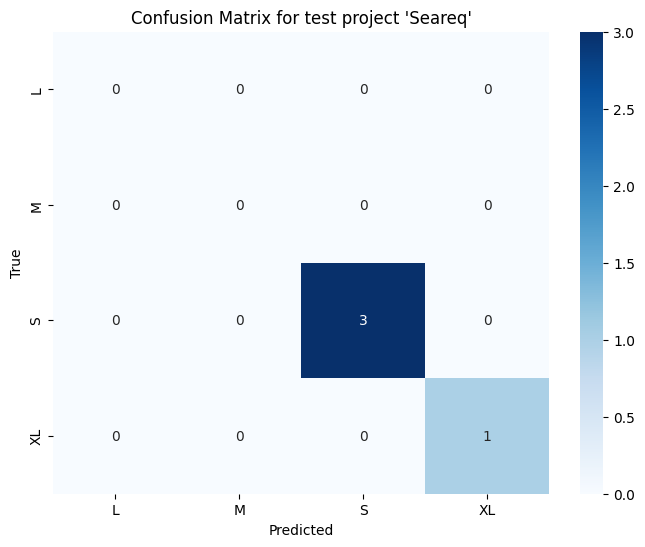

====================Decision Tree====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.60      0.75      0.67         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.62      0.75      0.67         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

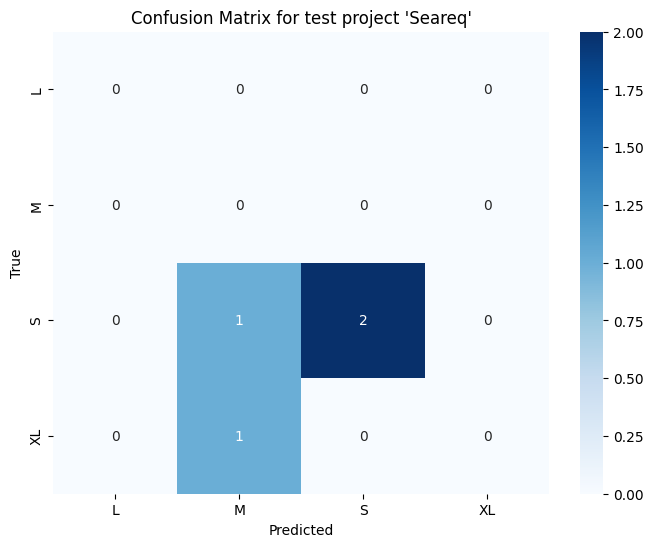

====================Multinomial Naive Bayes====================

Classification report for test project 'Seareq':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         0
           S       1.00      0.67      0.80         3
          XL       1.00      1.00      1.00         1

   micro avg       0.60      0.75      0.67         4
   macro avg       0.50      0.42      0.45         4
weighted avg       1.00      0.75      0.85         4
 samples avg       0.62      0.75      0.67         4

Precision: 1.0     Recall: 0.75      Accuracy: 0.5      F1 Score: 0.8500000000000001

Confusion matrix for test project 'Seareq':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

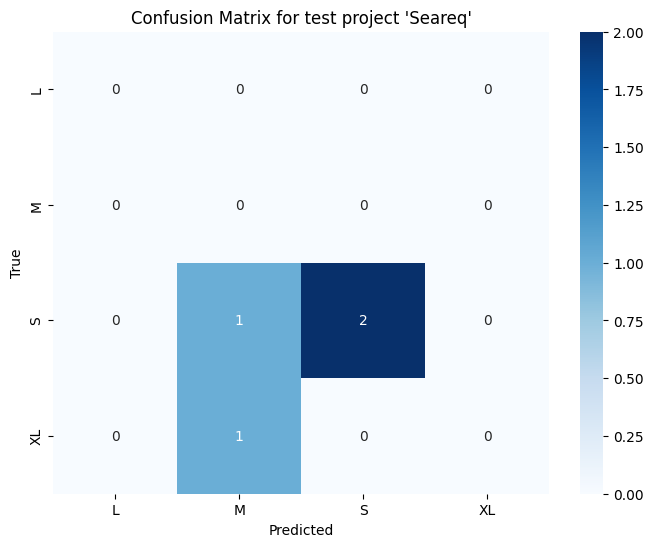

====================Adaboost====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.17      0.25         6
           S       0.71      1.00      0.83        12
          XL       0.00      0.00      0.00         0

   micro avg       0.68      0.72      0.70        18
   macro avg       0.30      0.29      0.27        18
weighted avg       0.64      0.72      0.64        18
 samples avg       0.69      0.72      0.70        18

Precision: 0.6372549019607843     Recall: 0.7222222222222222      Accuracy: 0.6666666666666666      F1 Score: 0.6350574712643678

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

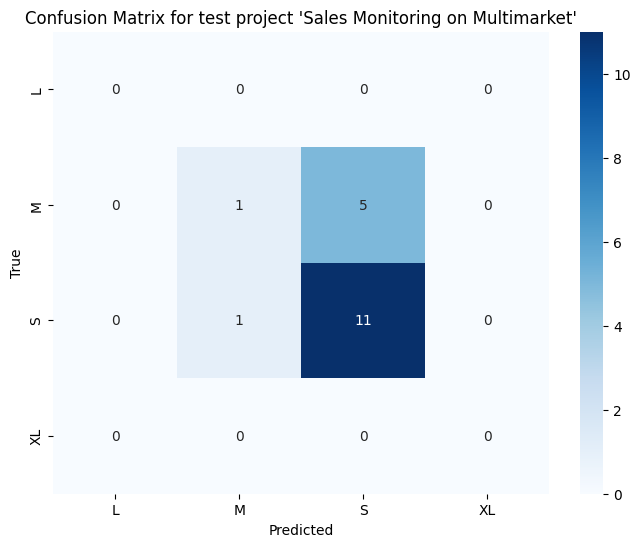

====================Decision Tree====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         6
           S       0.75      1.00      0.86        12
          XL       0.00      0.00      0.00         0

   micro avg       0.78      0.78      0.78        18
   macro avg       0.44      0.33      0.34        18
weighted avg       0.83      0.78      0.74        18
 samples avg       0.78      0.78      0.78        18

Precision: 0.8333333333333334     Recall: 0.7777777777777778      Accuracy: 0.7777777777777778      F1 Score: 0.738095238095238

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

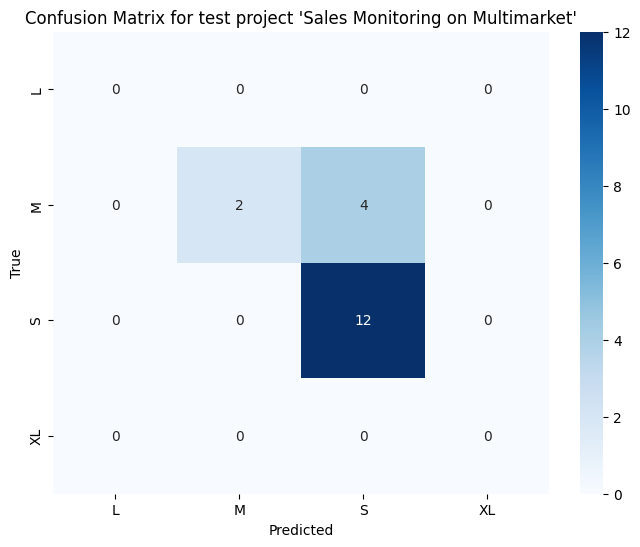

====================Multinomial Naive Bayes====================

Classification report for test project 'Sales Monitoring on Multimarket':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.17      0.29         6
           S       0.75      0.75      0.75        12
          XL       0.00      0.00      0.00         0

   micro avg       0.77      0.56      0.65        18
   macro avg       0.44      0.23      0.26        18
weighted avg       0.83      0.56      0.60        18
 samples avg       0.56      0.56      0.56        18

Precision: 0.8333333333333334     Recall: 0.5555555555555556      Accuracy: 0.5555555555555556      F1 Score: 0.5952380952380952

Confusion matrix for test project 'Sales Monitoring on Multimarket':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

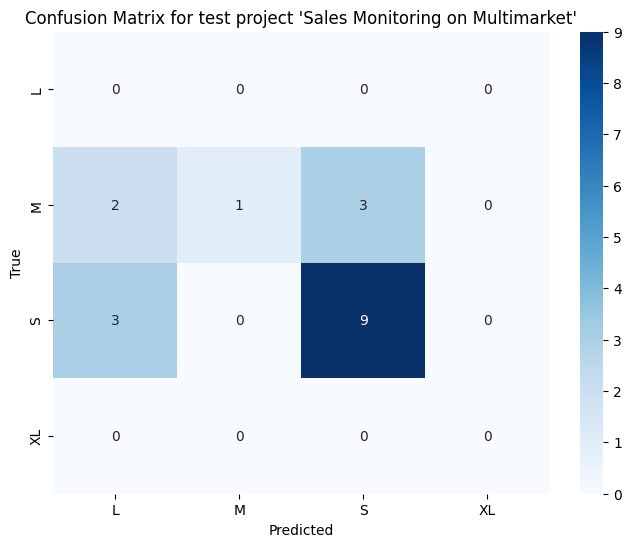

====================Adaboost====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.50      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       1.00      0.88      0.93         8
   macro avg       0.75      0.62      0.67         8
weighted avg       1.00      0.88      0.92         8
 samples avg       0.88      0.88      0.88         8

Precision: 1.0     Recall: 0.875      Accuracy: 0.875      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

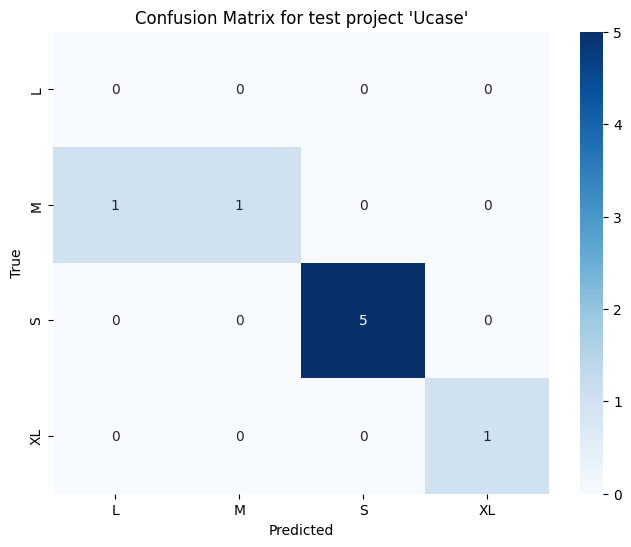

====================Decision Tree====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      1.00      0.67         2
           S       1.00      1.00      1.00         5
          XL       1.00      1.00      1.00         1

   micro avg       0.80      1.00      0.89         8
   macro avg       0.62      0.75      0.67         8
weighted avg       0.88      1.00      0.92         8
 samples avg       0.88      1.00      0.92         8

Precision: 0.875     Recall: 1.0      Accuracy: 0.75      F1 Score: 0.9166666666666666

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

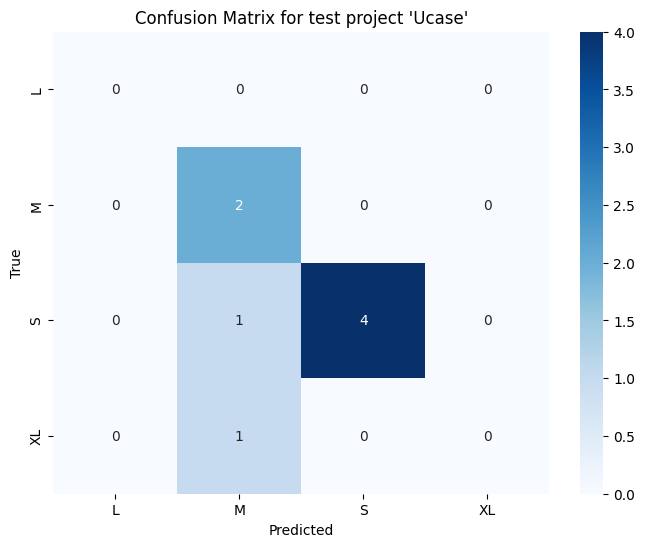

====================Multinomial Naive Bayes====================

Classification report for test project 'Ucase':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         2
           S       0.57      0.80      0.67         5
          XL       0.00      0.00      0.00         1

   micro avg       0.57      0.50      0.53         8
   macro avg       0.14      0.20      0.17         8
weighted avg       0.36      0.50      0.42         8
 samples avg       0.50      0.50      0.50         8

Precision: 0.3571428571428571     Recall: 0.5      Accuracy: 0.5      F1 Score: 0.41666666666666663

Confusion matrix for test project 'Ucase':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

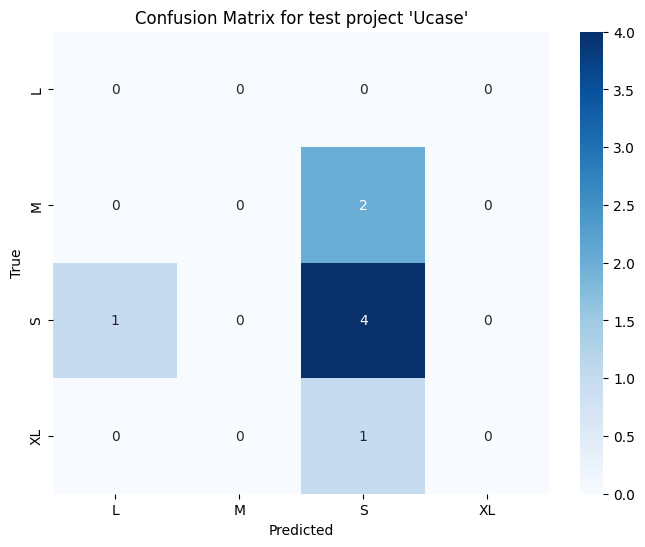

====================Adaboost====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      0.33      0.50         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      0.85      0.88        13
   macro avg       0.72      0.58      0.61        13
weighted avg       0.93      0.85      0.85        13
 samples avg       0.85      0.85      0.85        13



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

Precision: 0.9316239316239316     Recall: 0.8461538461538461      Accuracy: 0.8461538461538461      F1 Score: 0.8484162895927602

Confusion matrix for test project 'DFD Generator':


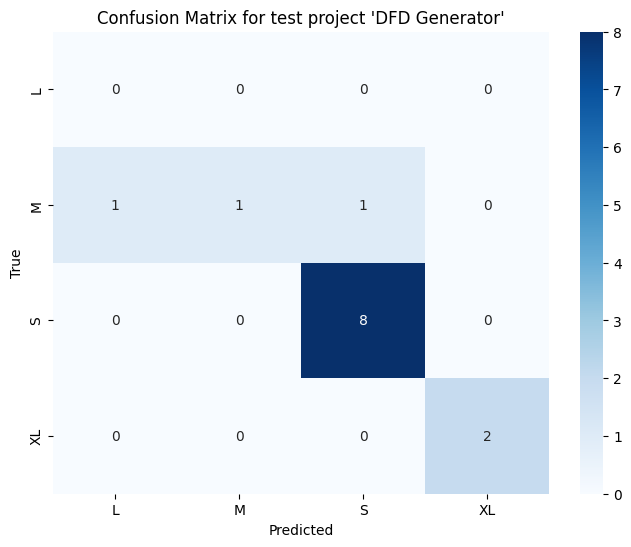

====================Decision Tree====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.50      0.33      0.40         3
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.85      0.85      0.85        13
   macro avg       0.60      0.58      0.59        13
weighted avg       0.82      0.85      0.83        13
 samples avg       0.81      0.85      0.82        13

Precision: 0.8162393162393162     Recall: 0.8461538461538461      Accuracy: 0.7692307692307693      F1 Score: 0.8253393665158372

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

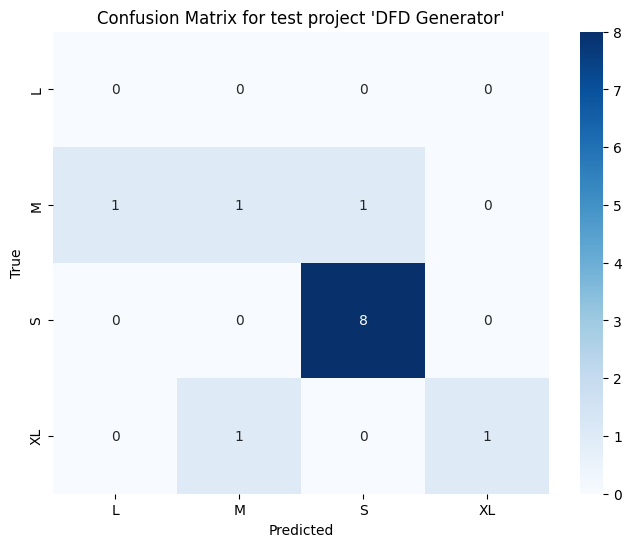

====================Multinomial Naive Bayes====================

Classification report for test project 'DFD Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         3
           S       0.58      0.88      0.70         8
          XL       0.00      0.00      0.00         2

   micro avg       0.58      0.54      0.56        13
   macro avg       0.15      0.22      0.18        13
weighted avg       0.36      0.54      0.43        13
 samples avg       0.54      0.54      0.54        13

Precision: 0.358974358974359     Recall: 0.5384615384615384      Accuracy: 0.5384615384615384      F1 Score: 0.4307692307692308

Confusion matrix for test project 'DFD Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

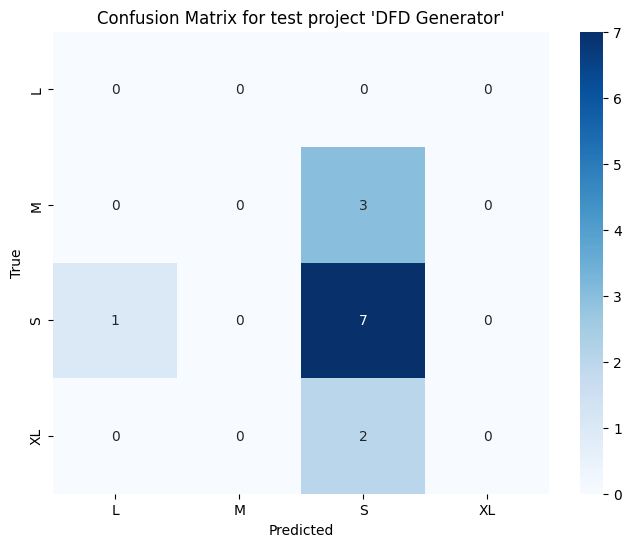

====================Adaboost====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.89      1.00      0.94         8
          XL       1.00      1.00      1.00         2

   micro avg       0.92      1.00      0.96        11
   macro avg       0.72      0.75      0.74        11
weighted avg       0.92      1.00      0.96        11
 samples avg       0.95      1.00      0.97        11



c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Precision: 0.9191919191919191     Recall: 1.0      Accuracy: 0.9090909090909091      F1 Score: 0.9572192513368983

Confusion matrix for test project 'User Story Generator':


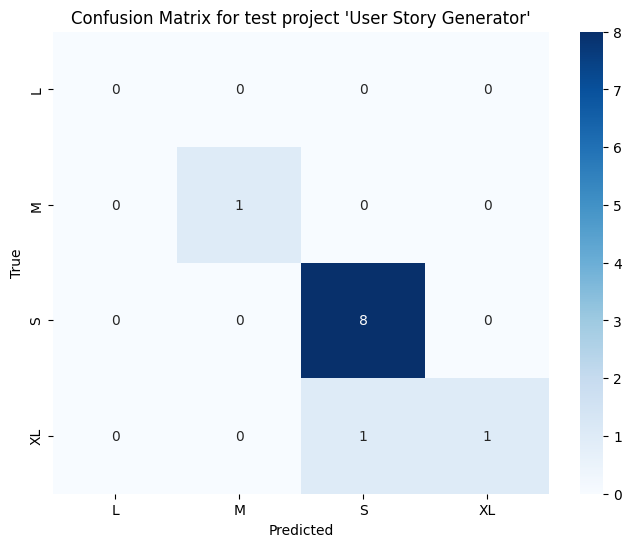

====================Decision Tree====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       1.00      1.00      1.00         1
           S       0.86      0.75      0.80         8
          XL       1.00      1.00      1.00         2

   micro avg       0.90      0.82      0.86        11
   macro avg       0.71      0.69      0.70        11
weighted avg       0.90      0.82      0.85        11
 samples avg       0.77      0.82      0.79        11

Precision: 0.8961038961038962     Recall: 0.8181818181818182      Accuracy: 0.7272727272727273      F1 Score: 0.8545454545454544

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modi

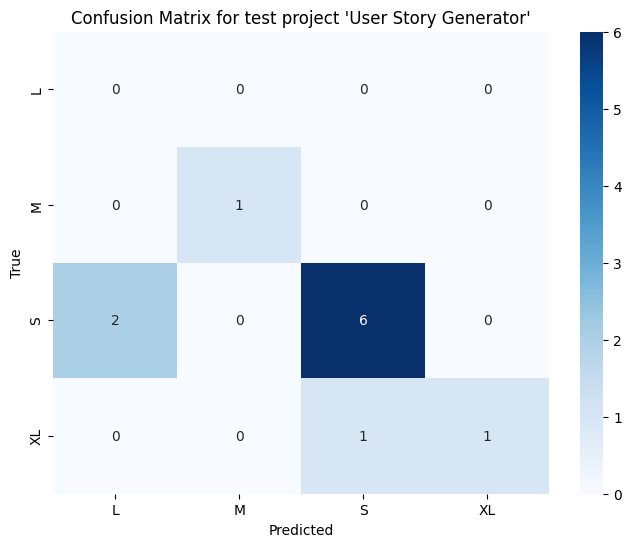

====================Multinomial Naive Bayes====================

Classification report for test project 'User Story Generator':
              precision    recall  f1-score   support

           L       0.00      0.00      0.00         0
           M       0.00      0.00      0.00         1
           S       0.73      1.00      0.84         8
          XL       0.00      0.00      0.00         2

   micro avg       0.73      0.73      0.73        11
   macro avg       0.18      0.25      0.21        11
weighted avg       0.53      0.73      0.61        11
 samples avg       0.73      0.73      0.73        11

Precision: 0.5289256198347108     Recall: 0.7272727272727273      Accuracy: 0.7272727272727273      F1 Score: 0.6124401913875599

Confusion matrix for test project 'User Story Generator':


c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Mirtha\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

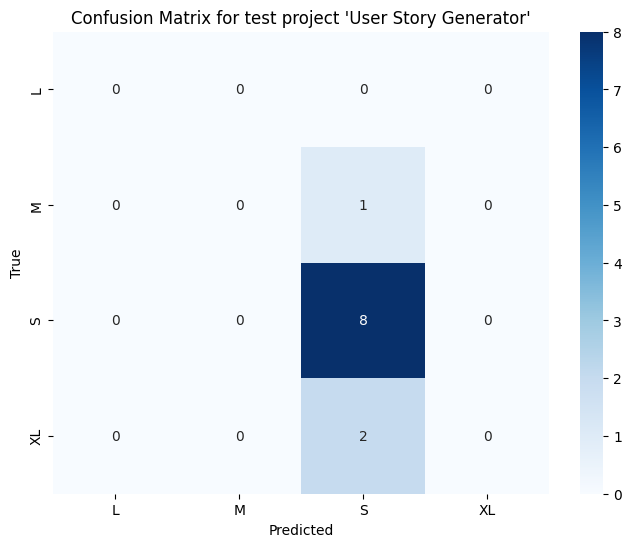

In [77]:
# Model (Numerik 4)
accuracy_list_Adaboost_nt43 = []
accuracy_list_DecisionTree_nt43 = []
accuracy_list_MultinomialNB_nt43 = []
precision_list_Adaboost_nt43 = []
precision_list_DecisionTree_nt43 = []
precision_list_MultinomialNB_nt43 = []
recall_list_Adaboost_nt43 = []
recall_list_DecisionTree_nt43 = []
recall_list_MultinomialNB_nt43 = []
f1_score_list_Adaboost_nt43 = []
f1_score_list_DecisionTree_nt43 = []
f1_score_list_MultinomialNB_nt43 = []
mean_accuracy_nt43 = []

modelAdaboost = MultiOutputClassifier(AdaBoostClassifier(algorithm="SAMME", random_state=0))
modelDecisionTree = MultiOutputClassifier(DecisionTreeClassifier(random_state=0))
modelMNB = MultiOutputClassifier(MultinomialNB())


# Loop through each unique project name as test data
for test_project_name in unique_projects:
    # Get data for the test project
    test_project_data = df[df['Project Name'] == test_project_name]
    test_indices = test_project_data.index
    X_test = integrated_data_scenario_num3.loc[test_indices]

    # Get data for training projects (all data except the test project)
    train_projects_data = df[df['Project Name'] != test_project_name]
    train_indices = train_projects_data.index
    X_train = integrated_data_scenario_num3.loc[train_indices]

    # One hot encode the target variable for training data
    y_train = effort_dense_array[train_projects_data.index]

    # One hot encode the target variable for test data
    y_test = effort_dense_array[test_project_data.index]

    # Adaboost
    modelAdaboost.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelAdaboost.predict(X_test)

    print("====================Adaboost====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_Adaboost_nt43.append(accuracy)
    precision_list_Adaboost_nt43.append(precision)
    recall_list_Adaboost_nt43.append(recall)
    f1_score_list_Adaboost_nt43.append(f1)

    # Decision Tree
    modelDecisionTree.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelDecisionTree.predict(X_test)

    print("====================Decision Tree====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_DecisionTree_nt43.append(accuracy)
    precision_list_DecisionTree_nt43.append(precision)
    recall_list_DecisionTree_nt43.append(recall)
    f1_score_list_DecisionTree_nt43.append(f1)

    # Decision Tree
    modelMNB.fit(X_train, y_train)

    # Use the model to make predictions
    y_pred = modelMNB.predict(X_test)

    print("====================Multinomial Naive Bayes====================")

    # Compute and print classification report
    print(f"\nClassification report for test project '{test_project_name}':")
    print(classification_report(y_test, y_pred, target_names=encoder.categories_[0]))

    # Compute accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    print("Precision:", precision, "    Recall:", recall, "     Accuracy:", accuracy, "     F1 Score:", f1)

    # Compute and print confusion matrix
    print(f"\nConfusion matrix for test project '{test_project_name}':")
    # Compute confusion matrix
    cm = confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1), labels=range(len(encoder.categories_[0])))

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=encoder.categories_[0], yticklabels=encoder.categories_[0])
    plt.title(f"Confusion Matrix for test project '{test_project_name}'")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()
    accuracy_list_MultinomialNB_nt43.append(accuracy)
    precision_list_MultinomialNB_nt43.append(precision)
    recall_list_MultinomialNB_nt43.append(recall)
    f1_score_list_MultinomialNB_nt43.append(f1)

In [78]:
# Performance Report
# Simpan data ke dalam DataFrame
data = {
    "Project": unique_projects,
    'Precision_Adaboost_nt43': precision_list_Adaboost_nt43,
    'Recall_Adaboost_nt43': recall_list_Adaboost_nt43,
    'Accuracy_Adaboost_nt43': accuracy_list_Adaboost_nt43,
    'F1_Score_Adaboost_nt43': f1_score_list_Adaboost_nt43,
    'Precision_DecisionTree_nt43': precision_list_DecisionTree_nt43,
    'Recall_DecisionTree_nt43': recall_list_DecisionTree_nt43,
    'Accuracy_DecisionTree_nt43': accuracy_list_DecisionTree_nt43,
    'F1_Score_DecisionTree_nt43': f1_score_list_DecisionTree_nt43,
    'Precision_MultinomialNB_nt43': precision_list_MultinomialNB_nt43,
    'Recall_MultinomialNB_nt43': recall_list_MultinomialNB_nt43,
    'Accuracy_MultinomialNB_nt43': accuracy_list_MultinomialNB_nt43,
    'F1_Score_MultinomialNB_nt43': f1_score_list_MultinomialNB_nt43,
}

# Buat DataFrame
df_result_nt43 = pd.DataFrame(data)

# Tampilkan DataFrame
df_result_nt43

,Project,Precision_Adaboost_nt43,Recall_Adaboost_nt43,Accuracy_Adaboost_nt43,F1_Score_Adaboost_nt43,Precision_DecisionTree_nt43,Recall_DecisionTree_nt43,Accuracy_DecisionTree_nt43,F1_Score_DecisionTree_nt43,Precision_MultinomialNB_nt43,Recall_MultinomialNB_nt43,Accuracy_MultinomialNB_nt43,F1_Score_MultinomialNB_nt43
0,Akobesi,0.558625,0.629921,0.629921,0.554478,0.477260,0.622047,0.622047,0.540119,0.741359,0.629921,0.598425,0.565273
1,Jisebi Checker,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.666667,0.666667,0.666667,0.666667
2,Novelty Checker,0.954545,0.818182,0.818182,0.867424,0.954545,0.818182,0.818182,0.867424,0.654545,0.727273,0.727273,0.688995
3,Journal Database Reviewer,0.743750,0.750000,0.750000,0.735119,0.743750,0.750000,0.750000,0.735119,0.401042,0.437500,0.437500,0.418478
4,Git Trackr,0.466667,0.666667,0.500000,0.541667,0.416667,0.666667,0.500000,0.500000,0.444444,0.500000,0.500000,0.466667
5,Seareq,1.000000,1.000000,1.000000,1.000000,1.000000,0.750000,0.500000,0.850000,1.000000,0.750000,0.500000,0.850000
6,Sales Monitoring on Multimarket,0.637255,0.722222,0.666667,0.635057,0.833333,0.777778,0.777778,0.738095,0.833333,0.555556,0.555556,0.595238
7,Ucase,1.000000,0.875000,0.875000,0.916667,0.875000,1.000000,0.750000,0.916667,0.357143,0.500000,0.500000,0.416667
8,DFD Generator,0.931624,0.846154,0.846154,0.848416,0.816239,0.846154,0.769231,0.825339,0.358974,0.538462,0.538462,0.430769
9,User Story Generator,0.919192,1.000000,0.909091,0.957219,0.896104,0.818182,0.727273,0.854545,0.528926,0.727273,0.727273,0.612440


In [79]:
# Mean Accuracy
mean_accuracy_nt43.append(np.mean(accuracy_list_Adaboost_nt43))
mean_accuracy_nt43.append(np.mean(accuracy_list_DecisionTree_nt43))
mean_accuracy_nt43.append(np.mean(accuracy_list_MultinomialNB_nt43))
print("Mean Accuracy")
print(mean_accuracy_nt43)

Mean Accuracy
[0.799501449993576, 0.721451033655758, 0.5751154412079609]


In [81]:
# Export
data_mean = {
    "Mean 11": mean_accuracy_nt11,
    "Mean 12": mean_accuracy_nt12,
    "Mean 13": mean_accuracy_nt13,
    "Mean 21": mean_accuracy_nt21,
    "Mean 22": mean_accuracy_nt22,
    "Mean 23": mean_accuracy_nt23,
    "Mean 31": mean_accuracy_nt31,
    "Mean 32": mean_accuracy_nt32,
    "Mean 33": mean_accuracy_nt33,
    "Mean 41": mean_accuracy_nt41,
    "Mean 42": mean_accuracy_nt42,
    "Mean 43": mean_accuracy_nt43,
}

# Buat DataFrame
df_mean = pd.DataFrame(data_mean)

# Simpan DataFrame ke dalam satu file Excel dengan sheet yang berbeda
with pd.ExcelWriter('output_gabungan.xlsx') as writer:
    df.to_excel(writer, sheet_name='Output', index=False)
    df_result_nt11.to_excel(writer, sheet_name='Performance Report nt11', index=False)
    df_result_nt12.to_excel(writer, sheet_name='Performance Report nt12', index=False)
    df_result_nt13.to_excel(writer, sheet_name='Performance Report nt13', index=False)
    df_result_nt21.to_excel(writer, sheet_name='Performance Report nt21', index=False)
    df_result_nt22.to_excel(writer, sheet_name='Performance Report nt22', index=False)
    df_result_nt23.to_excel(writer, sheet_name='Performance Report nt23', index=False)
    df_result_nt31.to_excel(writer, sheet_name='Performance Report nt31', index=False)
    df_result_nt32.to_excel(writer, sheet_name='Performance Report nt32', index=False)
    df_result_nt33.to_excel(writer, sheet_name='Performance Report nt33', index=False)
    df_result_nt41.to_excel(writer, sheet_name='Performance Report nt41', index=False)
    df_result_nt42.to_excel(writer, sheet_name='Performance Report nt42', index=False)
    df_result_nt43.to_excel(writer, sheet_name='Performance Report nt43', index=False)
    df_mean.to_excel(writer, sheet_name='Mean Accuracy', index=False)
